**Cognitive Behavioral and Social Data Final Project**

Berke Furkan Kusmenoglu - 2041496

Stefanija Galevska - 2041297

Carmen Rocio Ortiz Benitez - 2041510

Mahir Selek

***Introduction***

The replicability crisis concerns the credibility of findings in various fields of study, including medicine, behavioral science, and data science. It denotes the idea that often, findings obtained by studies cannot be replicated, as researchers cannot obtain results comparable to the original when repeating the study using similar procedures. Because of this, the accuracy of these findings should be questioned and scrutinized.

In this project, we will use different feature selection methods to discover the most relevant predictors, and evaluate the replicability, checking to see if the features selected as important by the different methods are consistent. We want to identify the most reliable predictors, and analyze the unreliable model dependent ones.

Keep in mind that for execution of the code the datasets should be uploaded as files with the same names. 

**Datasets**


The feature selection and model training processes will be performed in thirteen different psychological tests with varying numbers of items.

The methods that will be used for feature selection are:

* Recursive feature elimination
* Mutual Information
* Permutation importance
* Chi-Square
* Principal Component Analysis

The models, which will be run both in the original dataset and the one with the dimensions reduced, are:

* Support Vector Classifier
* K-Nearest Neighbors
* Logistic Regression
* Random Forest

Then we will use metrics such as accuracy, precision and other metrics in order to evaluate the suitability of our models.

#**Instructions**


1.   To run the notebook, you need to import the datasets we provide in the zip.file.
2.   We wrote our conclusions and results ın the PCL section where we also talked about other dataset results. The results for all datasets can be seen ın their seperate sections.


In [1]:
# We start by importing the necessary packages
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.datasets import make_sparse_coded_signal
from scipy.linalg import polar
from tensorflow import keras
import pandas as pd
from scipy.optimize import linprog
from scipy.sparse import random
from scipy.linalg import qr
import io
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
import warnings
from keras.callbacks import EarlyStopping
from keras.models import Sequential
from keras.layers import Dense
import tensorflow.keras as K
from sklearn import datasets
from pandas import read_csv
from sklearn.model_selection import train_test_split
from matplotlib import pyplot
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from mlxtend.evaluate import feature_importance_permutation
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import AdaBoostRegressor
from sklearn.datasets import load_boston
from sklearn.linear_model import LinearRegression
from numpy import array 


#PCL# 

In [663]:
df = pd.read_csv("PCL5_df.csv", delimiter= ';') # Creating the dataframe.
print(df)

     PCL1  PCL2  PCL3  PCL4  PCL5  PCL6  PCL7  PCL8  PCL9  PCL10  ...  PCL12  \
0       1     1     3     2     2     0     1     0     1      2  ...      3   
1       0     0     0     0     0     0     0     0     0      0  ...      0   
2       0     0     0     0     0     0     2     0     3      0  ...      3   
3       0     1     0     1     0     0     1     2     1      1  ...      2   
4       2     1     1     1     0     3     2     0     2      1  ...      1   
..    ...   ...   ...   ...   ...   ...   ...   ...   ...    ...  ...    ...   
397     0     0     0     0     1     1     1     1     1      1  ...      3   
398     4     4     3     4     4     1     1     1     3      4  ...      3   
399     4     4     4     4     4     4     4     3     3      4  ...      4   
400     3     3     4     4     4     3     4     4     3      4  ...      3   
401     3     3     4     3     3     4     4     4     4      4  ...      4   

     PCL13  PCL14  PCL15  PCL16  PCL17 

In [665]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [666]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X


,PCL1,PCL2,PCL3,PCL4,PCL5,PCL6,PCL7,PCL8,PCL9,PCL10,PCL11,PCL12,PCL13,PCL14,PCL15,PCL16,PCL17,PCL18,PCL19,PCL20
0,1,1,3,2,2,0,1,0,1,2,2,3,2,0,0,1,2,1,0,1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2,0,0,0,0,0,0,2,0,3,0,2,3,3,4,0,0,1,0,2,2
3,0,1,0,1,0,0,1,2,1,1,3,2,1,0,2,1,0,0,3,1
4,2,1,1,1,0,3,2,0,2,1,1,1,3,0,1,0,1,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397,0,0,0,0,1,1,1,1,1,1,3,3,3,1,2,0,2,2,2,2
398,4,4,3,4,4,1,1,1,3,4,2,3,4,4,4,0,3,4,3,4
399,4,4,4,4,4,4,4,3,3,4,4,4,3,3,4,2,4,3,3,4
400,3,3,4,4,4,3,4,4,3,4,3,3,4,3,4,4,4,4,3,4


In [667]:
number_of_features = X.shape[1] #number of features
number_of_features

20

In [668]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
397    0
398    0
399    0
400    0
401    0
Name: CONDITION, Length: 402, dtype: object

In [669]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [670]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

#**K-Nearest Neighbors**
We start by using K-Nearest Neighbors. k-NN is a basic non-parametric algorithm that uses distance measure to classify data based on their similarity. The main assumption of this model is that similar things are close to each other. We used this model as our classifier because it is easy to implement and it works well with small sample sizes.

In [671]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
295,1,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",0.99644,0.854261,0.040524
289,1,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 25, 'weights': 'distance'}",0.99644,0.854261,0.040524
293,3,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 27, 'weights': 'distance'}",0.99644,0.854198,0.037621
285,3,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 23, 'weights': 'distance'}",0.99644,0.854198,0.046698
179,5,"{'algorithm': 'kd_tree', 'metric': 'euclidean', 'n_neighbors': 30, 'weights': 'distance'}",0.99644,0.850689,0.034094


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='euclidean', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.8512
Precision     : 0.8549
Recall        : 0.8508
F1 Score      : 0.8507
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.80      0.84        60
           1       0.82      0.90      0.86        61

    accuracy                           0.85       121
   macro avg       0.85      0.85      0.85       121
weighted avg       0.85      0.85      0.85       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


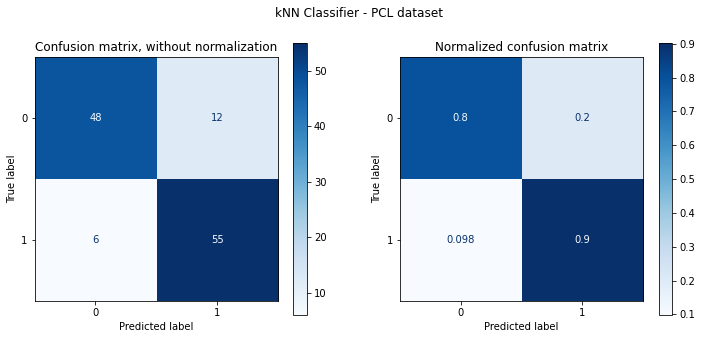

In [672]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'PCL')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

#**Logistic Regression**
We proceed to build a Logistic Regression model. Logistic regression is a statistical method for predicting a binary outcome based on one or more predictor variables. In terms of using logistic regression to evaluate the reliability of relevant predictors in classifiers, logistic regression can be used to identify the predictor variables that are most strongly associated with the outcome of interest. This is especially useful for the purpose of this project, which is to find the most relevant predictors.

In [ ]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7603
Precision     : 0.7609
Recall        : 0.7605
F1 Score      : 0.7603
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.78      0.76        60
           1       0.78      0.74      0.76        61

    accuracy                           0.76       121
   macro avg       0.76      0.76      0.76       121
weighted avg       0.76      0.76      0.76       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


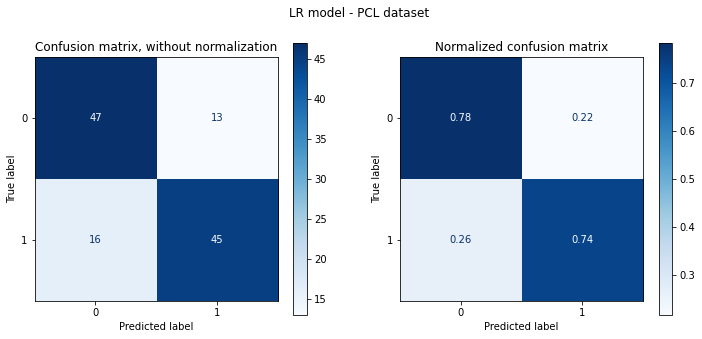

In [674]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'PCL')
plt_cmx(LR_best, X_test, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

#**Support Vector Classifier**
We now build a support vector classifier (SVC), which is a type of supervised machine learning algorithm that can be used for classification tasks. It works by finding the best boundary (or "hyperplane") that separates the different classes in the training data. SVCs are particularly useful when the data has multiple classes and/or when the boundary between the classes is non-linear. They are also often used in text and image classification tasks.

In [675]:
#@title **SVC**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
0,1,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'linear'}",0.829198,0.833020,0.051128
7,1,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}",0.834540,0.833020,0.051128
8,1,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'poly'}",0.846095,0.833020,0.049865
5,4,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'poly'}",0.831869,0.829449,0.045936
3,5,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.834536,0.829386,0.044957


-----------------------------------------------------
Best model    > SVC(C=0.001, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.8760
Precision     : 0.9013
Recall        : 0.8750
F1 Score      : 0.8738
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.75      0.86        60
           1       0.80      1.00      0.89        61

    accuracy                           0.88       121
   macro avg       0.90      0.88      0.87       121
weighted avg       0.90      0.88      0.87       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


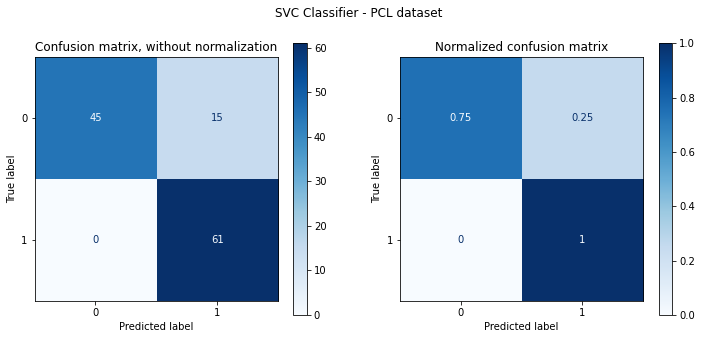

In [676]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'PCL')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

#**Random Forest Classifier**
Then, we train a Random Forest, which is a machine learning algorithm that can be used for both classification and regression tasks, which make it a versatile tool that can be applied in a variety of cognitive projects to feature selection and understanding underlying factors.

In [677]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
41,1,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 20}",0.881679,0.836529,0.034909
37,2,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 30}",0.910139,0.836466,0.049006
6,3,"{'max_depth': 3, 'min_samples_split': 9, 'n_estimators': 20}",0.840770,0.833020,0.044456
57,4,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 30}",0.895024,0.832957,0.044892
11,4,"{'max_depth': 3, 'min_samples_split': 13, 'n_estimators': 20}",0.841659,0.832957,0.038795


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.8099
Precision     : 0.8142
Recall        : 0.8094
F1 Score      : 0.8091
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.75      0.80        60
           1       0.78      0.87      0.82        61

    accuracy                           0.81       121
   macro avg       0.81      0.81      0.81       121
weighted avg       0.81      0.81      0.81       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


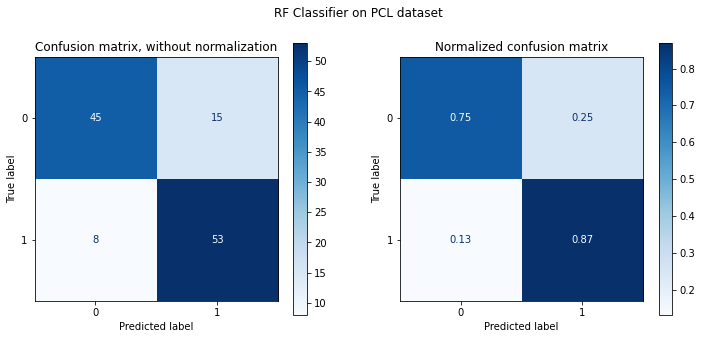

In [678]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'PCL')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

For the next section, we use different feature selection models to choose the 20% best predictors. For defining the %20 of the features, before imply the
feature selection we define with simple equation.

In [679]:
number = int(number_of_features/5)

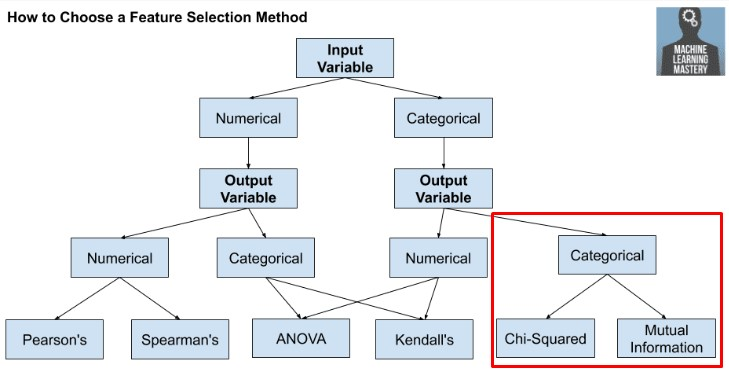

Before selecting our feature selection methods, first we decided our input and our output variables. Since we know, our output variable is Honest and Dishonest, it is clearly a categorical variable.Also our input variable, consist of numbers which each one of them refers to a level. In that way, we decided our inpurt variable is also categorical. As we can see in the below figure, we implied the Chi-Squared and Mutual Information Feature Selection as our model independent models

#**Mutual Information Feature Selection**

We first use the Mutual Information method for feature selection. This method measures the non-linear relationship between two random variables. Which in basic terms means how much information can be obtained from a random variable by observing another. The idea is that the features that are more dependent on the target variable are more important and should be included in the model. The process of mutual information feature selection starts with calculating the mutual information between the variables and selecting the top k features (in this case the 20% of the total features) with the highest mutual information values. Following this we build the models using the selected features.

Feature 0: 0.161973
Feature 1: 0.209994
Feature 2: 0.173088
Feature 3: 0.163958
Feature 4: 0.269833
Feature 5: 0.101591
Feature 6: 0.141004
Feature 7: 0.153397
Feature 8: 0.105194
Feature 9: 0.143847
Feature 10: 0.126776
Feature 11: 0.193020
Feature 12: 0.075293
Feature 13: 0.134789
Feature 14: 0.118826
Feature 15: 0.072565
Feature 16: 0.167044
Feature 17: 0.235937
Feature 18: 0.125614
Feature 19: 0.192265


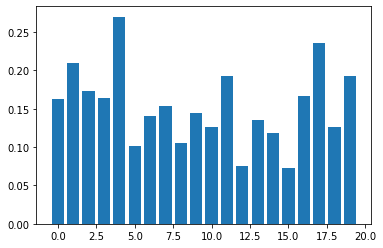

In [18]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

After implying Mutual Informaion, our selected features:

**PCL2 - PCL5 - PCL12 - PCL18**

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='euclidean', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7769
Precision     : 0.7787
Recall        : 0.7772
F1 Score      : 0.7766
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.82      0.78        60
           1       0.80      0.74      0.77        61

    accuracy                           0.78       121
   macro avg       0.78      0.78      0.78       121
weighted avg       0.78      0.78      0.78       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


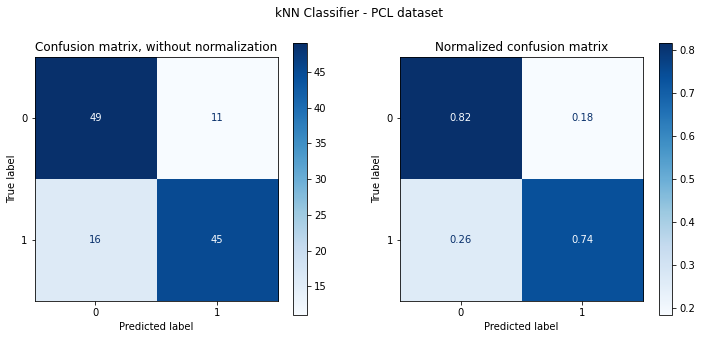

In [19]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'PCL')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.8182
Precision     : 0.8182
Recall        : 0.8182
F1 Score      : 0.8182
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.82      0.82      0.82        60
           1       0.82      0.82      0.82        61

    accuracy                           0.82       121
   macro avg       0.82      0.82      0.82       121
weighted avg       0.82      0.82      0.82       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


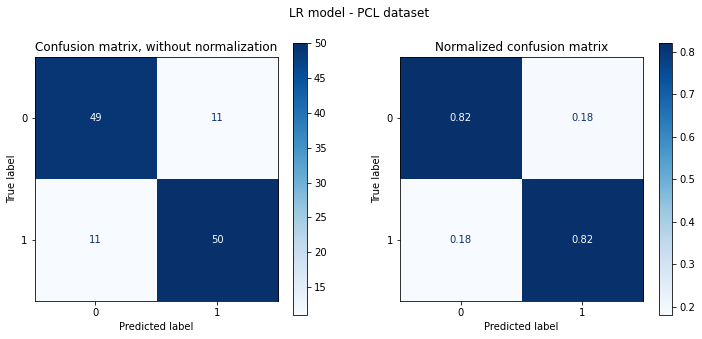

In [20]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'PCL')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.001, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.8430
Precision     : 0.8812
Recall        : 0.8417
F1 Score      : 0.8386
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.68      0.81        60
           1       0.76      1.00      0.87        61

    accuracy                           0.84       121
   macro avg       0.88      0.84      0.84       121
weighted avg       0.88      0.84      0.84       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


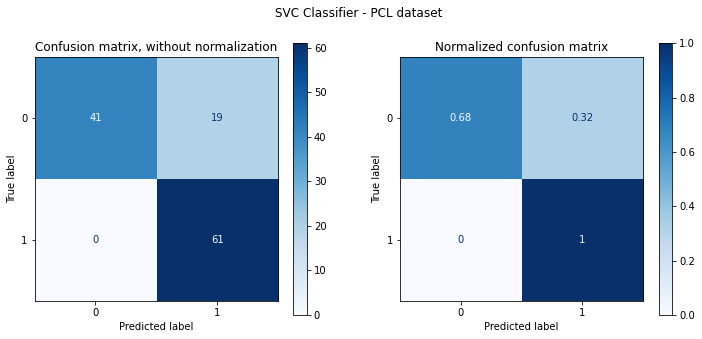

In [21]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'PCL')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.8264
Precision     : 0.8310
Recall        : 0.8260
F1 Score      : 0.8257
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.77      0.81        60
           1       0.79      0.89      0.84        61

    accuracy                           0.83       121
   macro avg       0.83      0.83      0.83       121
weighted avg       0.83      0.83      0.83       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


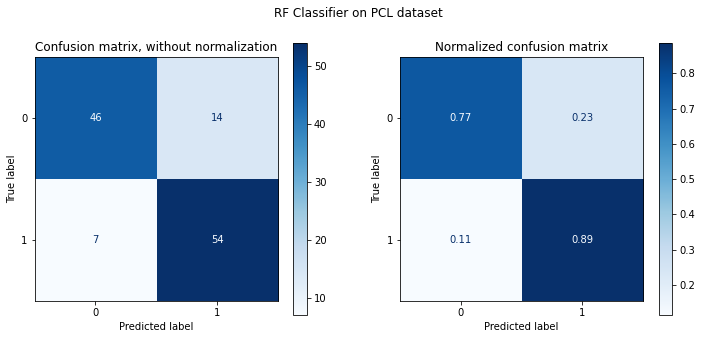

In [22]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'PCL')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

In [23]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

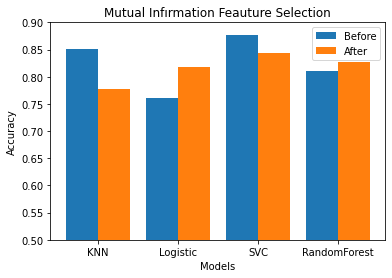

In [24]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

After using %20 of features we see changes on the accuracy. We see some improvement on Logistic Regression and Random Forest.On the other hand, accuracy of the KNN and SCV decreased.  

#**CHI-SQUARED**
In this section, we use the Chi-Square feature selection to select the 20% best features. This feature selection method uses the chi-squared statistical test to select the most relevant features for a given task. It is based on the idea that features that are independent of the class variable are not informative and should be excluded from the models. It is used mostly for categorical variables and this is why we included it in our work. The chi-squared feature selection method is particularly useful for datasets with categorical variables and it is commonly used in text classification and NLP tasks. It is also a non-parametric method, meaning it makes no assumptions about the underlying distribution of the data.

The process typically involves calculating the chi-squared value between each feature and the class variable and selecting the top k features with the highest values. Following this we build the model using the selected features.

Feature 0: 95.603047
Feature 1: 162.975261
Feature 2: 121.573998
Feature 3: 83.990825
Feature 4: 153.383233
Feature 5: 48.318939
Feature 6: 80.140796
Feature 7: 62.253316
Feature 8: 71.552358
Feature 9: 66.078643
Feature 10: 74.551297
Feature 11: 125.524244
Feature 12: 46.010009
Feature 13: 135.940343
Feature 14: 83.476499
Feature 15: 37.248766
Feature 16: 71.242128
Feature 17: 113.355387
Feature 18: 44.262225
Feature 19: 77.975514


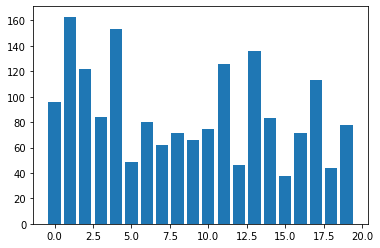

In [25]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

After implying Mutual Informaion, our selected features:

**PCL2 - PCL5 - PCL14 - PCL12**

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='euclidean', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.8347
Precision     : 0.8347
Recall        : 0.8347
F1 Score      : 0.8347
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.83      0.83        60
           1       0.84      0.84      0.84        61

    accuracy                           0.83       121
   macro avg       0.83      0.83      0.83       121
weighted avg       0.83      0.83      0.83       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


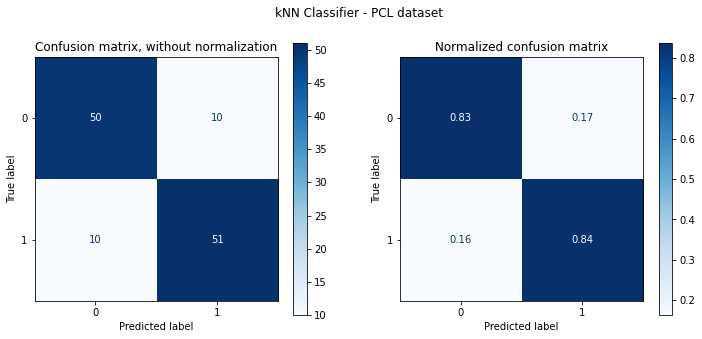

In [26]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'PCL')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7934
Precision     : 0.7935
Recall        : 0.7933
F1 Score      : 0.7933
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.80      0.78      0.79        60
           1       0.79      0.80      0.80        61

    accuracy                           0.79       121
   macro avg       0.79      0.79      0.79       121
weighted avg       0.79      0.79      0.79       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


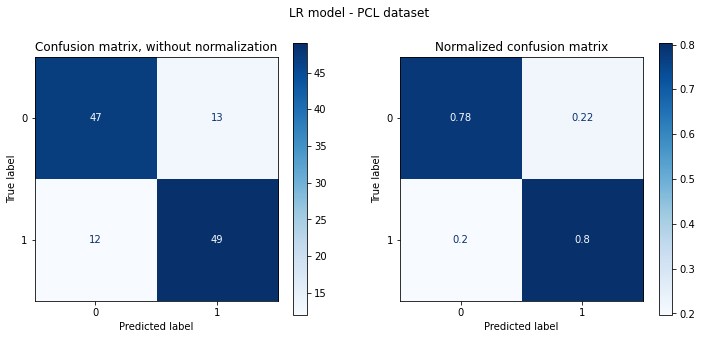

In [27]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'PCL')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.001, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.8678
Precision     : 0.8891
Recall        : 0.8668
F1 Score      : 0.8657
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.75      0.85        60
           1       0.80      0.98      0.88        61

    accuracy                           0.87       121
   macro avg       0.89      0.87      0.87       121
weighted avg       0.89      0.87      0.87       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


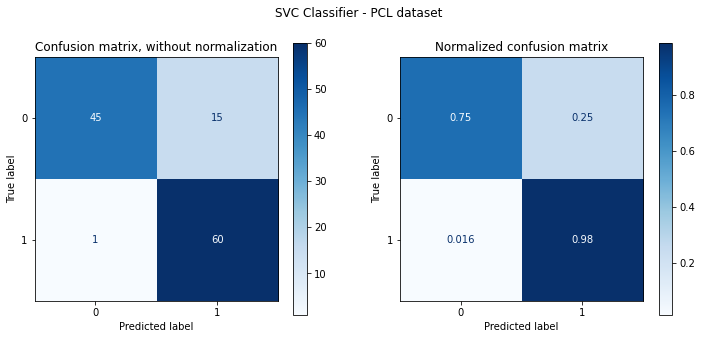

In [28]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'PCL')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.8430
Precision     : 0.8455
Recall        : 0.8426
F1 Score      : 0.8426
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.80      0.83        60
           1       0.82      0.89      0.85        61

    accuracy                           0.84       121
   macro avg       0.85      0.84      0.84       121
weighted avg       0.85      0.84      0.84       121



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


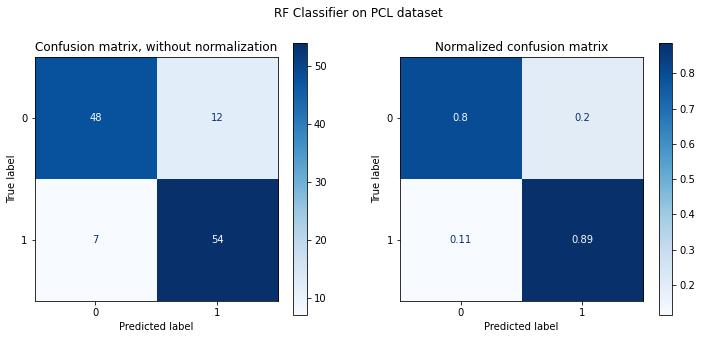

In [29]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'PCL')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

In [30]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

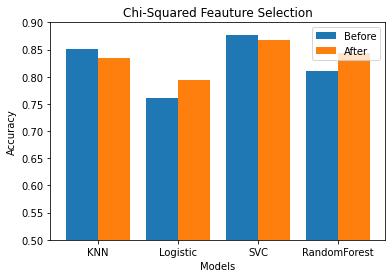

In [31]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

In CHI-SQUARED we got the similar behaviour as Mutula Information Feature Selection.We see some improvement on Logistic Regression and Random Forest.On the other hand, accuracy of the KNN and SCV decreased.Bu diffirent than Mutual Information, the accuracy decrease is less in KNN and SCV.

#**Principal Component Analysis**




In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

Highest variance features: ['PCL1', 'PCL2', 'PCL3', 'PCL4', 'PCL5']


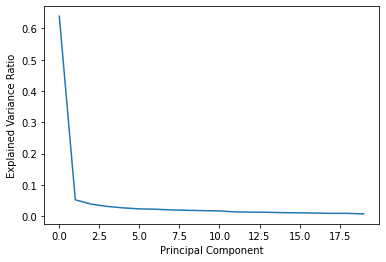

Highest loading features: ['PCL2', 'PCL5', 'PCL11', 'PCL14', 'PCL1']


In [32]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)

After implying PCA you can see the most important feautures above.

#**Wrapper Methods**
A wrapper method is a technique used in machine learning to combine several models into a single ensemble model, in order to improve the overall performance of the model. It involves training a secondary model to make predictions based on the output of one or more primary models. The secondary model, or "wrapper," uses the output of the primary models as input features, and combines them in a way that improves the accuracy of the final predictions. Wrapper methods can be used with a variety of different types of models, including decision trees, neural networks, and support vector machines.

Wrapper methods can be used for feature selection by training the secondary model, or "wrapper," with different subsets of the input features and evaluating its performance on a validation set. Features that are important for the performance of the model will be selected, while those that are not will be discarded.

There are different ways to implement wrapper methods for feature selection, and one of the most important one is Recursive Feature Elimination (RFE). This method recursively removes features, starting with the least important, and builds the model with the remaining features at each iteration.

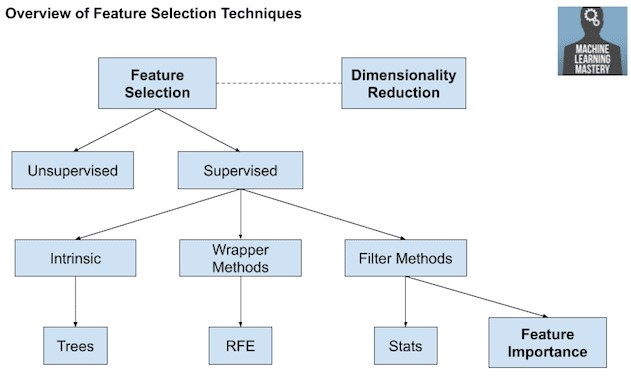

#**Recursive Feature Elimination**

Recursive Feature Elimination (RFE) is a feature selection technique used in machine learning and is typically applied to a model that has already been trained. It works by recursively removing the weakest feature (i.e., the feature that contributes the least to the accuracy of the model) and then retraining the model on the remaining set of features. This process is repeated until a desired number of features is reached or a stopping criterion is met. The goal of RFE is to select a subset of the most informative features from the original feature set that are most useful for the model.

RFE does use a specific model to evaluate the importance of features, but it does not rely on the specific model's coefficients or internal feature importance scores. Instead, it uses the model's accuracy or some other performance metric to rank features by their importance. This means that RFE can be used with any model that provides a performance metric, and the feature ranking it produces should be model-agnostic. Therefore, the feature ranking obtained from RFE is model independent and it will give the same ranking regardless of the model used.

In [686]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PCL1 selected =False rank=15 
PCL2 selected =True rank=1 
PCL3 selected =False rank=10 
PCL4 selected =True rank=1 
PCL5 selected =False rank=5 
PCL6 selected =False rank=7 
PCL7 selected =False rank=12 
PCL8 selected =False rank=2 
PCL9 selected =False rank=6 
PCL10 selected =False rank=4 
PCL11 selected =False rank=9 
PCL12 selected =True rank=1 
PCL13 selected =False rank=14 
PCL14 selected =False rank=11 
PCL15 selected =False rank=16 
PCL16 selected =False rank=8 
PCL17 selected =False rank=3 
PCL18 selected =False rank=17 
PCL19 selected =True rank=1 
PCL20 selected =False rank=13 


**Selected Features : PCL2 - PCL4 - PCL12 - PCL19**

In [34]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PCL1 selected =False rank=12 
PCL2 selected =True rank=1 
PCL3 selected =False rank=11 
PCL4 selected =False rank=16 
PCL5 selected =True rank=1 
PCL6 selected =False rank=13 
PCL7 selected =False rank=17 
PCL8 selected =False rank=14 
PCL9 selected =False rank=6 
PCL10 selected =False rank=15 
PCL11 selected =False rank=7 
PCL12 selected =True rank=1 
PCL13 selected =False rank=4 
PCL14 selected =True rank=1 
PCL15 selected =False rank=9 
PCL16 selected =False rank=3 
PCL17 selected =False rank=10 
PCL18 selected =False rank=8 
PCL19 selected =False rank=2 
PCL20 selected =False rank=5 


**Selected Features : PCL2 - PCL5 - PCL12 - PCL14**

In [35]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PCL1 selected =False rank=15 
PCL2 selected =True rank=1 
PCL3 selected =False rank=14 
PCL4 selected =False rank=17 
PCL5 selected =True rank=1 
PCL6 selected =False rank=6 
PCL7 selected =False rank=13 
PCL8 selected =False rank=7 
PCL9 selected =False rank=12 
PCL10 selected =False rank=16 
PCL11 selected =False rank=11 
PCL12 selected =True rank=1 
PCL13 selected =False rank=4 
PCL14 selected =True rank=1 
PCL15 selected =False rank=10 
PCL16 selected =False rank=5 
PCL17 selected =False rank=9 
PCL18 selected =False rank=3 
PCL19 selected =False rank=2 
PCL20 selected =False rank=8 


**Selected Features : PCL2 - PCL5 - PCL12 - PCL14**

In [36]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PCL1 selected =False rank=2 
PCL2 selected =True rank=1 
PCL3 selected =False rank=5 
PCL4 selected =False rank=6 
PCL5 selected =True rank=1 
PCL6 selected =False rank=13 
PCL7 selected =False rank=9 
PCL8 selected =False rank=12 
PCL9 selected =False rank=15 
PCL10 selected =False rank=16 
PCL11 selected =False rank=7 
PCL12 selected =True rank=1 
PCL13 selected =False rank=11 
PCL14 selected =True rank=1 
PCL15 selected =False rank=8 
PCL16 selected =False rank=17 
PCL17 selected =False rank=14 
PCL18 selected =False rank=10 
PCL19 selected =False rank=4 
PCL20 selected =False rank=3 


**Selected Features : PCL2 - PCL5 - PCL12 - PCL14**

Recursive Feature Elimination (RFE) is a wrapper method, which means that it evaluates the performance of different subsets of features using a specific model. The subset of features that results in the best performance on the model is selected. Because RFE uses a specific model to evaluate the performance of different subsets of features, the output of RFE can be different depending on the classifier used.

For example, if you use RFE with a linear classifier such as logistic regression, the selected features may be those that have the highest absolute coefficients in the logistic regression model. On the other hand, if you use RFE with a non-linear classifier such as a random forest, the selected features may be those that have the highest feature importance scores according to the random forest model.

Additionally, the output of RFE can be affected by the hyperparameters of the classifier, such as the regularization strength or the number of trees in a random forest. This means that even when using the same classifier, different hyperparameter settings can lead to different feature subsets being selected.

It is important to note that RFE is a computationally expensive method, especially when the number of features is large. Also, it is sensitive to correlated features, so it is recommended to use Permutation feature importance or other methods in addition to RFE for a more robust feature selection.

Decision Tree Classifier : PCL2 - PCL4 - PCL12 - PCL19

Linear Regression : PCL2 - PCL5 - PCL12 - PCL14

Logistic Regression  : PCL2 - PCL5 - PCL12 - PCL14

Random Forest Classifier : PCL2 - PCL5 - PCL12 - PCL14



After recursive feature elimination for the various models we came to the following conclusions: We notice that with all of the models, three features are most significant and appear in all of the selections, while one is changing in all different models

#**PERMUTATION IMPORTANCE**
We proceed to use the Permutation Importance feature selection method, which is used to determine the importance of each feature in a dataset by permuting the values of a given feature and measuring the effect on the model's performance. It is a way to estimate the importance of a feature by comparing the performance of a model with the feature to the performance of the same model with the feature permuted. The idea is that a feature that is important for the model's performance will cause a significant decrease in performance when its values are permuted. This method can be applied to any machine learning model and can be used as a way to identify the most important features in a dataset. Firstly we fit a model to the original data set and then for each feature permute the values and record the new score of the model on the permuted dataset. Lastly subtract the score of the permuted dataset from the score of the original one to get the importance score of that feature. Mathematically we can represent this as: Permutation importance (feature) = score( model, original dataset) - score(model, permuted dataset)

In [37]:
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 99.644128113879
Test accuracy: 83.47107438016529
[0.04945643 0.13352801 0.06336223 0.04494435 0.10172247 0.03080841
 0.02734587 0.03089014 0.02745879 0.02935833 0.03645173 0.07149879
 0.02321054 0.06305892 0.03856873 0.0240064  0.03239461 0.07143358
 0.04528439 0.05521727]


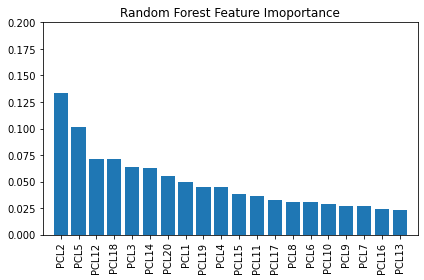

In [38]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [39]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [ ]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


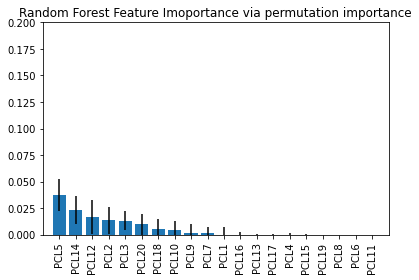

In [41]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

The feature importance scores are computed based on the average decrease in impurity across all trees in the forest. For classification, the feature importance scores are calculated as the total reduction of the criterion brought by that feature.

It is important to note that feature importance scores can be affected by correlated features, so it is recommended to use Permutation feature importance or other methods in addition to Random Forest feature importance to get a more robust feature selection.

After applying permutation importance via random forest, we can conclude that we achieve good results. This is due to the replicacy of the same best 5 features both in the random forest classifier and permutation importance. 

#**MODEL AGNOSTIC**

Model-agnostic feature selection is a technique for identifying and selecting the most informative features from a dataset, regardless of the underlying model or algorithm. The term "model-agnostic" means that the method can be applied to any type of model, regardless of its specific architecture or algorithm.

Model-agnostic feature selection can be useful for reducing the complexity of a model, improving its interpretability, and increasing its generalization ability. It can also be used to identify the features that are irrelevant or redundant.
It is important to notice that the feature selection should be performed in the training set, not in the test set, to avoid data leakage.

In our project we had 3 model agnostic feature selection method whic they are:
Recursive Feature Elimination is a wrapper method, which is a type of model-agnostic feature selection technique. 

Principal Component Analysis is a linear technique and it is model-agnostic, meaning that it can be applied to any type of data, regardless of the underlying model or algorithm. 

Permutation Importance is a model-agnostic feature importance method, meaning it can be applied to any type of model, regardless of its specific architecture or algorithm.

#**Model Agnostic Comparison**

Recursive Feature Elimination :PCL2, PCL5, PCL12, PCL14

Principal Component Analysis :PCL2, PCL5 ,PCL11 ,PCL14 ,PCL1

Permutation Importance :PCL5, PCL14, PCL12, PCL2, PCL3

##Model Dependent

Finally, we extract the most relevant features by using model dependent feature selection.

In [42]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['PCL2' 'PCL12' 'PCL16' 'PCL19']


Selected features with using Random Forest Classifier:
['PCL1' 'PCL2' 'PCL3' 'PCL5' 'PCL12' 'PCL14' 'PCL20']


Selected features with using Logistic Regression Classifier:
['PCL2' 'PCL5' 'PCL12' 'PCL14' 'PCL18' 'PCL19']


Selected features with using Linear Regression:
['PCL2' 'PCL5' 'PCL12' 'PCL14' 'PCL16' 'PCL18' 'PCL19']


##Conclusion

Why SVM is the best result?
SVMs are particularly well-suited for datasets with a high number of features and a relatively small number of samples. In these situations, SVMs can achieve higher accuracy than other algorithms such as Logistic Regression, k-Nearest Neighbors (KNN), and Random Forest.
SVM also has the best F1 score in these models for the first dataset that we have.

Why did our models metrics, specificaly: Accuracy, F1 score, Recall, or Precision, decrease after feature selection?
The first reason is discarding important features that are needed for the model to make accurate predictions. Additionally, by reducing the number of features used in the model, it can lead to a decrease in the model's ability to capture all the variations in the data, which can result in a decrease in accuracy. Another reason could be that the features that are removed may contain redundant information, but when combined with other features, it may lead to better accuracy and removing it may have a negative effect.

The reason why results are increased:
The model is now being trained on a smaller, more relevant subset of the features. This can help to reduce overfitting, improve the generalization performance of the model, and lead to an increase in accuracy. Additionally, by removing features that are not highly correlated with the target variable, the model is able to focus on the features that are most informative and make better predictions.

Also, we can clearly say that, model agnostic methods gave more stable results than the model dependent method.

Let us comment a bit more on some specific datasets.

About the PID5 dataset:
There is no change after the feature selection process why?
Because our model's accuracy is already more than 96%, it is possible that feature selection will not lead to a significant improvement in performance. When a model is already highly accurate, it means that it is effectively using the features in the dataset to make predictions.

However, it is still worth performing feature selection to see if any improvement can be made. Feature selection can also help to reduce the dimensionality of the dataset, which can make the model more interpretable and easier to work with. Additionally, feature selection can help to identify the most important features in the dataset, which can be useful for understanding the underlying relationships and patterns in the data.
It's also important to consider other benefits of feature selection like reducing the complexity of the model and making it more robust and less prone to overfitting, which can lead to improved generalization performance.
In summary, although it may not lead to a significant improvement in accuracy, this is not our main focus. Meaning, feature selection can still be a valuable step in the process.

About DDDT dataset:
There is no change after feature selection methods implementation. What is the reason behind it?
There are some reasons that may affect this like:
•	The dataset itself may be too small, noisy or too complex for the models, and feature selection alone may not be able to improve the performance of the models.
•	The models that we used are not appropriate to explain this dataset. Maybe we can try other more complex models.
•	The features that have been removed by feature selection may not be as significant as we thought and do not affect the model's performance.

About IESR dataset:
The accuracy and F1 score decreased around 4-5% after feature selection.
Why?
•	The feature selection method used may not be appropriate for the dataset or the type of model being used. It's important to select the right method that fits the data and the problem
•	The feature selection threshold used may be too high or too low, resulting in the removal of important features or the retention of irrelevant features, respectively.
•	Another reason could be that the features that are removed may contain redundant information, but when combined with other features, it may lead to a better accuracy and removing it may have a negative effect.


About the PRFQ dataset:
Similar to the PID5 dataset, there is no big difference after feature selection is applied.
Our model's accuracy is already more than 87%, it is possible that feature selection will not lead to a significant improvement in performance. It's also important to consider other benefits of feature selection like reducing the complexity of the model and making it more robust and less prone to overfitting, which can lead to improved generalization performance.









REFERENCES:
1.	Sumaiya Thaseen, I., Aswani Kumar, C. (2017). Intrusion detection model using fusion of chi-square feature selection and multi class SVM. https://doi.org/10.1016/j.jksuci.2015.12.004 [October, 2017]

2.	Otong Saeful B., Kusnadi, M.H., Oky Dwi N. (2017) Feature Selection based on chi square in artificial neural network to predict the accuracy of student study period. https://iaeme.com/MasterAdmin/Journal_uploads/IJCIET/VOLUME_8_ISSUE_8/IJCIET_08_08_074.pdf [August 2017]

3.	Anne-Claire H., Pierre G., Jean-Philippe V. (2021). The Influence of Feature Selection Methods on Accuracy, Stability and Interpretability of Molecular Signatures.  https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0028210 [December 21, 2021]

***The above process is reproduced in the next datasets.***

#ShortDT CC# 

In [43]:
df = pd.read_csv("DT_df_CC.csv") # Creating the dataframe.
print(df)

     Mach1   Mach2   Mach3   Mach4   Mach5   Mach6   Mach7   Mach8   Mach9   \
0         3       3       2       4       4       3       3       3       4   
1         4       2       1       3       4       4       4       2       2   
2         4       1       3       3       3       1       4       1       5   
3         4       3       1       3       3       4       2       3       4   
4         3       2       1       2       2       3       3       2       3   
..      ...     ...     ...     ...     ...     ...     ...     ...     ...   
477       4       3       5       4       1       4       3       4       2   
478       4       1       1       4       1       4       4       1       3   
479       3       1       1       1       1       3       2       1       1   
480       4       2       2       2       3       4       3       2       2   
481       5       3       3       3       4       3       5       2       5   

     Psycho1   ...  Narc1  Narc2   Narc3   Narc4   

In [44]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [45]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X
number_of_features = X.shape[1]

In [46]:
number_of_features

27

In [47]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
477    0
478    0
479    0
480    0
481    0
Name: CONDITION, Length: 482, dtype: object

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [49]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [50]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
109,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.0,0.744820,0.059647
55,2,"{'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735953,0.057327
175,3,"{'algorithm': 'kd_tree', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735909,0.066661
295,4,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735821,0.067791
349,5,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.0,0.732880,0.054177


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7379
Precision     : 0.7381
Recall        : 0.7378
F1 Score      : 0.7378
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.75      0.74        73
           1       0.74      0.72      0.73        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


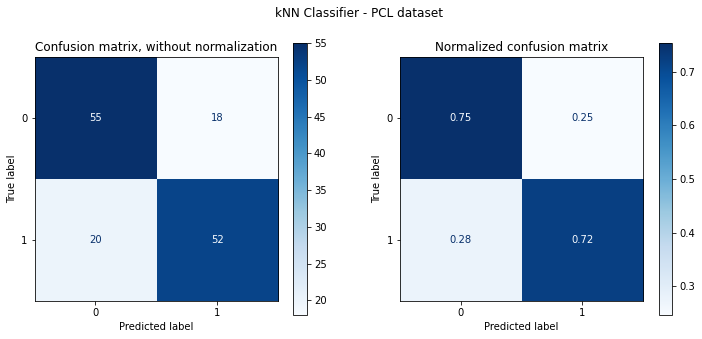

In [51]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'PCL')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

In [ ]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7241
Precision     : 0.7284
Recall        : 0.7236
F1 Score      : 0.7225
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.79      0.74        73
           1       0.76      0.65      0.70        72

    accuracy                           0.72       145
   macro avg       0.73      0.72      0.72       145
weighted avg       0.73      0.72      0.72       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


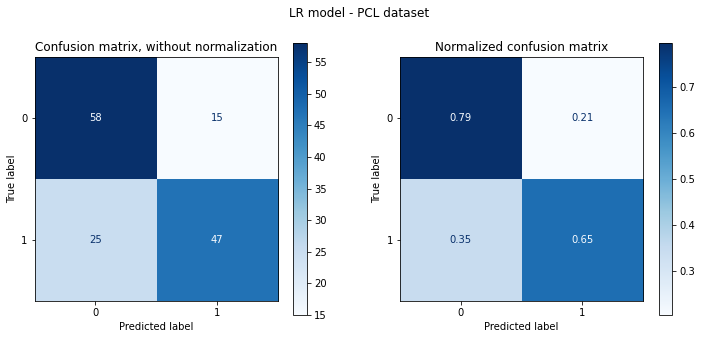

In [53]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'PCL')
plt_cmx(LR_best, X_test, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

In [54]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
3,1,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.788575,0.771378,0.061856
10,2,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.882038,0.756497,0.062672
7,3,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}",0.767055,0.741747,0.066401
6,4,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.804155,0.741572,0.054641
0,5,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'linear'}",0.738122,0.735865,0.073551


-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7379
Precision     : 0.7379
Recall        : 0.7379
F1 Score      : 0.7379
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.74      0.74        73
           1       0.74      0.74      0.74        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


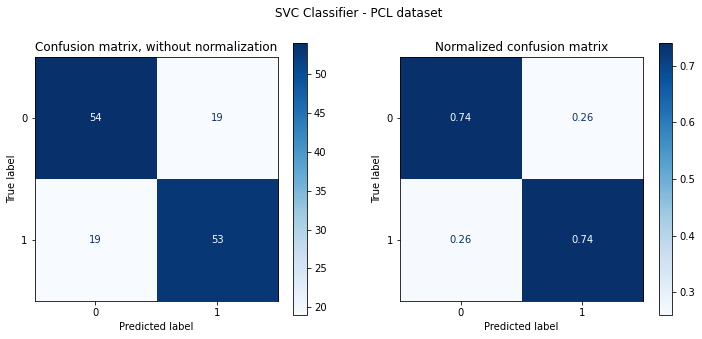

In [55]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'PCL')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

In [56]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
44,1,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 50}",0.889462,0.768437,0.050398
49,2,"{'max_depth': 9, 'min_samples_split': 5, 'n_estimators': 50}",0.967350,0.768393,0.055700
39,3,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 50}",0.915415,0.765452,0.057721
58,4,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 40}",0.896137,0.765408,0.054584
59,5,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 50}",0.897618,0.765408,0.062213


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7586
Precision     : 0.7647
Recall        : 0.7591
F1 Score      : 0.7575
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.68      0.74        73
           1       0.72      0.83      0.77        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


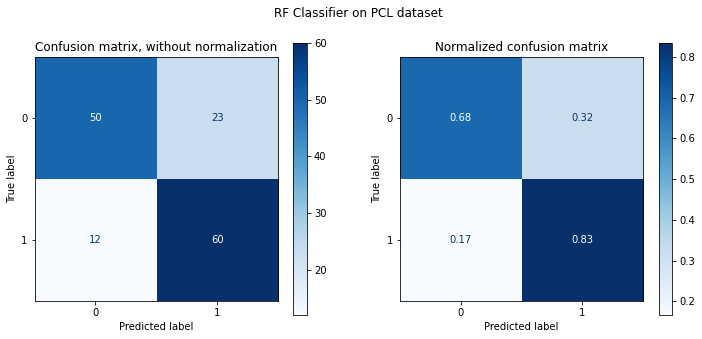

In [57]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'PCL')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

Feature 0: 0.068757
Feature 1: 0.076115
Feature 2: 0.031874
Feature 3: 0.068062
Feature 4: 0.023645
Feature 5: 0.000000
Feature 6: 0.095137
Feature 7: 0.056846
Feature 8: 0.000000
Feature 9: 0.116396
Feature 10: 0.102734
Feature 11: 0.049465
Feature 12: 0.000000
Feature 13: 0.146589
Feature 14: 0.029457
Feature 15: 0.010643
Feature 16: 0.025788
Feature 17: 0.055355
Feature 18: 0.074856
Feature 19: 0.014366
Feature 20: 0.000000
Feature 21: 0.040400
Feature 22: 0.000000
Feature 23: 0.000000
Feature 24: 0.000000
Feature 25: 0.004453
Feature 26: 0.012316


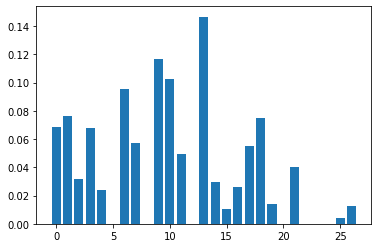

In [58]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=5)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.6897
Precision     : 0.6905
Recall        : 0.6894
F1 Score      : 0.6891
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.68      0.73      0.70        73
           1       0.70      0.65      0.68        72

    accuracy                           0.69       145
   macro avg       0.69      0.69      0.69       145
weighted avg       0.69      0.69      0.69       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


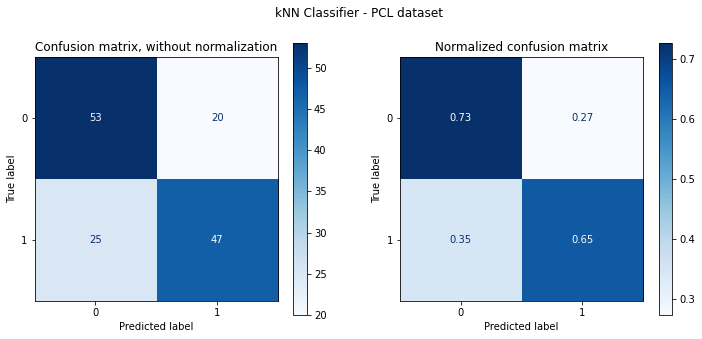

In [59]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'PCL')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7655
Precision     : 0.7674
Recall        : 0.7652
F1 Score      : 0.7650
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.81      0.78        73
           1       0.79      0.72      0.75        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.76       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


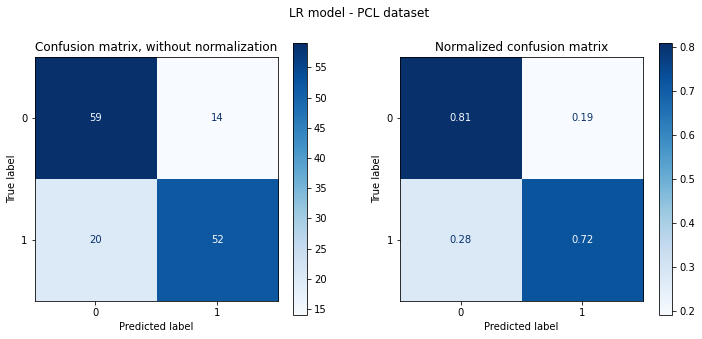

In [60]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'PCL')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7517
Precision     : 0.7519
Recall        : 0.7518
F1 Score      : 0.7517
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.74      0.75        73
           1       0.74      0.76      0.75        72

    accuracy                           0.75       145
   macro avg       0.75      0.75      0.75       145
weighted avg       0.75      0.75      0.75       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


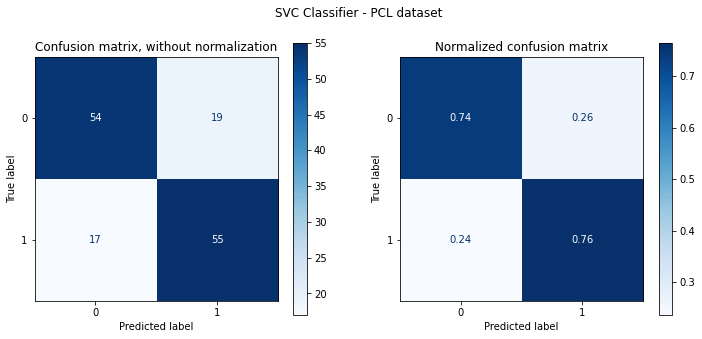

In [61]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'PCL')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7379
Precision     : 0.7501
Recall        : 0.7387
F1 Score      : 0.7351
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.63      0.71        73
           1       0.69      0.85      0.76        72

    accuracy                           0.74       145
   macro avg       0.75      0.74      0.74       145
weighted avg       0.75      0.74      0.73       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


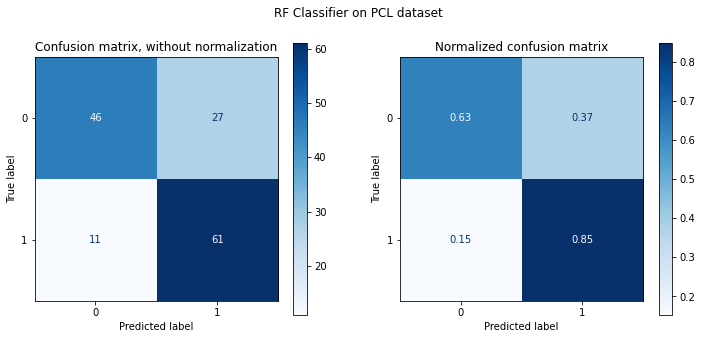

In [62]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'PCL')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

In [63]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

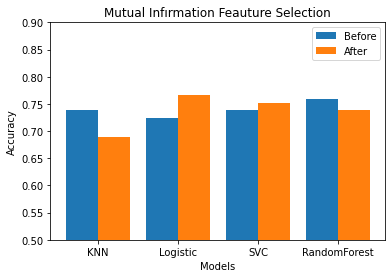

In [64]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 1.342369
Feature 1: 16.738514
Feature 2: 0.199986
Feature 3: 3.205232
Feature 4: 18.995364
Feature 5: 0.005037
Feature 6: 11.584945
Feature 7: 6.803980
Feature 8: 11.156437
Feature 9: 28.517719
Feature 10: 19.675601
Feature 11: 6.001463
Feature 12: 7.343073
Feature 13: 38.069811
Feature 14: 8.284755
Feature 15: 1.254384
Feature 16: 19.212523
Feature 17: 1.704904
Feature 18: 0.003785
Feature 19: 2.931008
Feature 20: 0.036318
Feature 21: 0.277158
Feature 22: 0.004449
Feature 23: 1.601906
Feature 24: 1.318111
Feature 25: 4.080489
Feature 26: 0.073067


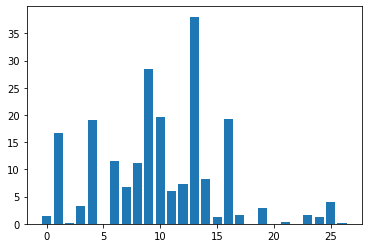

In [65]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=5)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7103
Precision     : 0.7117
Recall        : 0.7100
F1 Score      : 0.7097
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.75      0.72        73
           1       0.73      0.67      0.70        72

    accuracy                           0.71       145
   macro avg       0.71      0.71      0.71       145
weighted avg       0.71      0.71      0.71       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


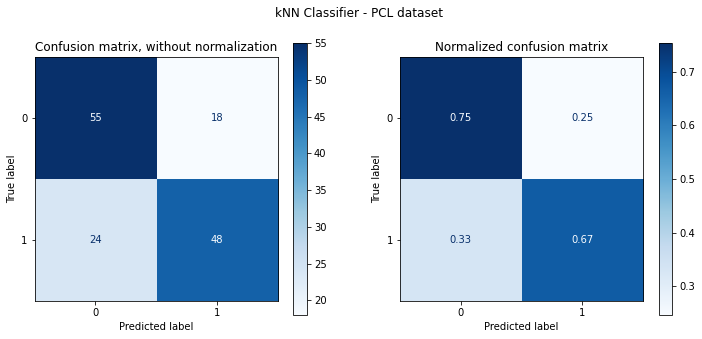

In [66]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'PCL')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7655
Precision     : 0.7663
Recall        : 0.7653
F1 Score      : 0.7652
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.79      0.77        73
           1       0.78      0.74      0.76        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


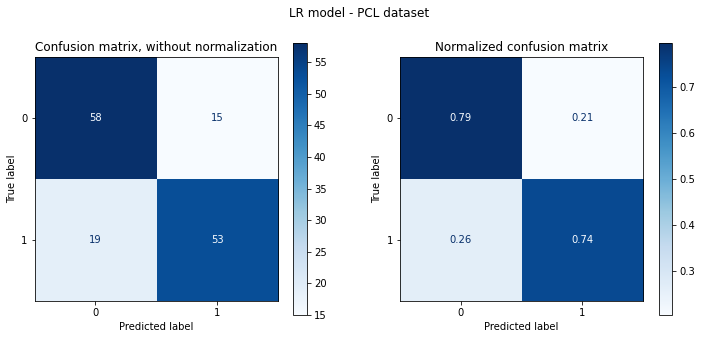

In [67]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'PCL')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7586
Precision     : 0.7587
Recall        : 0.7587
F1 Score      : 0.7586
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.75      0.76        73
           1       0.75      0.76      0.76        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


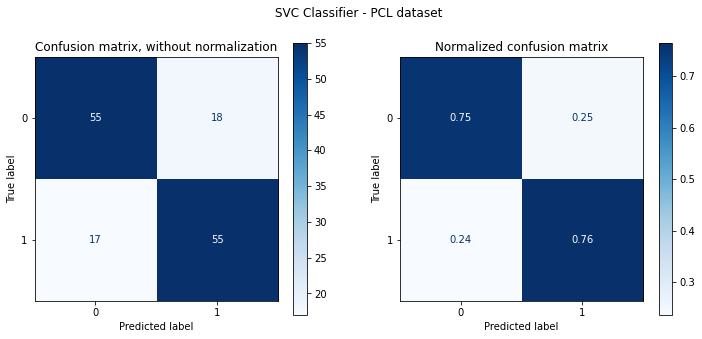

In [68]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'PCL')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7655
Precision     : 0.7657
Recall        : 0.7656
F1 Score      : 0.7655
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.75      0.76        73
           1       0.76      0.78      0.77        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


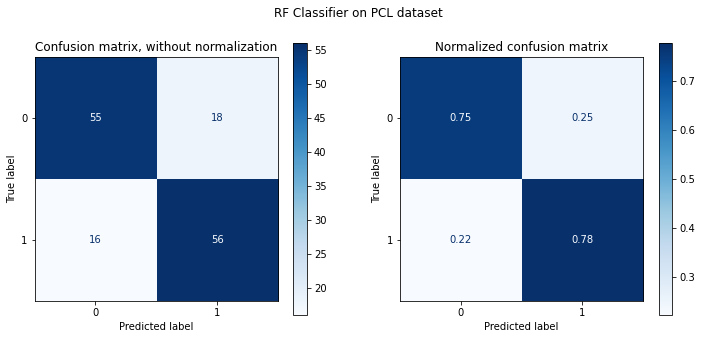

In [69]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'PCL')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

In [70]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

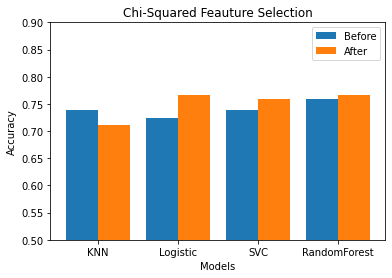

In [71]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['Mach1 ', 'Mach2 ', 'Mach3 ', 'Mach4 ', 'Mach5 ']


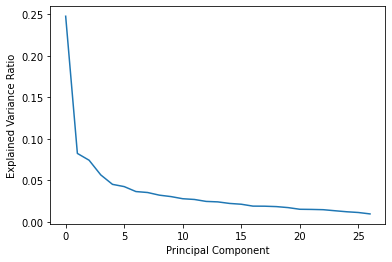

Highest loading features: ['Mach5 ', 'Psycho1 ', 'Mach2 ', 'Psycho5 H', 'Mach9 ']


In [72]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [73]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=5)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=11 
Mach2  selected =False rank=21 
Mach3  selected =True rank=1 
Mach4  selected =False rank=19 
Mach5  selected =False rank=9 
Mach6  selected =False rank=2 
Mach7  selected =False rank=4 
Mach8  selected =False rank=23 
Mach9  selected =True rank=1 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=6 
Psycho4  selected =False rank=7 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=17 
Psycho7  selected =False rank=8 
Psycho8  selected =False rank=15 
Psycho9  selected =False rank=10 
Narc1 selected =False rank=16 
Narc2  selected =False rank=20 
Narc3  selected =False rank=14 
Narc4  selected =False rank=12 
Narc5  selected =False rank=13 
Narc6 selected =False rank=3 
Narc7  selected =False rank=18 
Narc8  selected =False rank=5 
Narc9  selected =False rank=22 


In [74]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=5)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=23 
Mach2  selected =False rank=3 
Mach3  selected =True rank=1 
Mach4  selected =False rank=10 
Mach5  selected =False rank=16 
Mach6  selected =False rank=14 
Mach7  selected =True rank=1 
Mach8  selected =False rank=20 
Mach9  selected =False rank=7 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=5 
Psycho4  selected =False rank=17 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=21 
Psycho7  selected =False rank=15 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=6 
Narc1 selected =False rank=18 
Narc2  selected =False rank=12 
Narc3  selected =False rank=4 
Narc4  selected =False rank=22 
Narc5  selected =False rank=9 
Narc6 selected =False rank=13 
Narc7  selected =False rank=11 
Narc8  selected =False rank=8 
Narc9  selected =False rank=19 


In [75]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=5)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=23 
Mach2  selected =False rank=4 
Mach3  selected =True rank=1 
Mach4  selected =False rank=7 
Mach5  selected =False rank=16 
Mach6  selected =False rank=10 
Mach7  selected =True rank=1 
Mach8  selected =False rank=21 
Mach9  selected =False rank=9 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=3 
Psycho4  selected =False rank=17 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=22 
Psycho7  selected =False rank=15 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=5 
Narc1 selected =False rank=18 
Narc2  selected =False rank=14 
Narc3  selected =False rank=6 
Narc4  selected =False rank=20 
Narc5  selected =False rank=8 
Narc6 selected =False rank=13 
Narc7  selected =False rank=12 
Narc8  selected =False rank=11 
Narc9  selected =False rank=19 


In [76]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=5)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=22 
Mach2  selected =False rank=4 
Mach3  selected =False rank=10 
Mach4  selected =False rank=14 
Mach5  selected =True rank=1 
Mach6  selected =False rank=13 
Mach7  selected =False rank=2 
Mach8  selected =False rank=9 
Mach9  selected =True rank=1 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=16 
Psycho4  selected =False rank=21 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=12 
Psycho7  selected =False rank=20 
Psycho8  selected =False rank=6 
Psycho9  selected =False rank=8 
Narc1 selected =False rank=19 
Narc2  selected =False rank=15 
Narc3  selected =False rank=23 
Narc4  selected =False rank=17 
Narc5  selected =False rank=18 
Narc6 selected =False rank=7 
Narc7  selected =False rank=3 
Narc8  selected =False rank=5 
Narc9  selected =False rank=11 


In [77]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 78.62068965517241
[0.02486575 0.03884929 0.03109704 0.02891643 0.04662524 0.02824665
 0.05475055 0.04461345 0.05035059 0.06740034 0.07380512 0.02686446
 0.02954497 0.08648858 0.02758893 0.02891899 0.03738555 0.0314535
 0.02589485 0.02750816 0.02042976 0.02851161 0.02379657 0.02693174
 0.03131508 0.03110129 0.02674548]


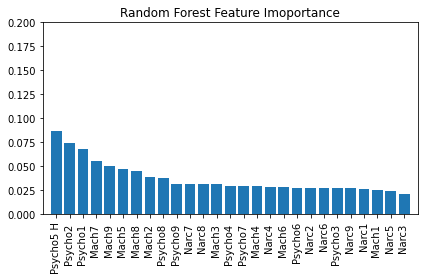

In [78]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [81]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [ ]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


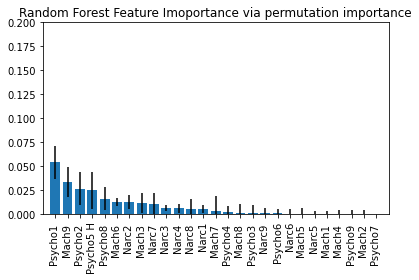

In [83]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [84]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['Mach5 ' 'Mach7 ' 'Mach9 ' 'Psycho1 ' 'Psycho2 ' 'Psycho5 H' 'Narc8 ']


Selected features with using Random Forest Classifier:
['Mach2 ' 'Mach5 ' 'Mach7 ' 'Mach9 ' 'Psycho1 ' 'Psycho2 ' 'Psycho5 H'
 'Psycho8 ']


Selected features with using Logistic Regression Classifier:
['Mach3 ' 'Mach4 ' 'Mach7 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 ' 'Psycho5 H'
 'Psycho8 ' 'Psycho9 ' 'Narc3 ' 'Narc5 ' 'Narc6' 'Narc8 ']


Selected features with using Linear Regression:
['Mach2 ' 'Mach3 ' 'Mach4 ' 'Mach7 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 '
 'Psycho5 H' 'Psycho8 ' 'Psycho9 ' 'Narc3 ' 'Narc8 ']


#ShortDT JI# 

In [85]:
df = pd.read_csv("DT_df_JI.csv", delimiter= ';') # Creating the dataframe.
print(df)

     Mach1   Mach2   Mach3   Mach4   Mach5   Mach6   Mach7   Mach8   Mach9   \
0         3       1       1       4       2       3       4       2       4   
1         5       4       2       5       2       5       5       3       2   
2         3       2       2       4       1       4       3       2       2   
3         2       4       4       3       2       4       3       3       2   
4         4       3       1       1       2       1       2       5       2   
..      ...     ...     ...     ...     ...     ...     ...     ...     ...   
859       5       2       4       2       3       4       3       2       4   
860       4       2       2       2       2       4       4       2       4   
861       4       2       2       2       3       4       4       2       4   
862       2       1       4       4       4       3       4       4       4   
863       5       1       3       3       4       4       3       2       3   

     Psycho1   ...  Narc1   Narc2   Narc3   Narc4  

In [86]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [87]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X


,Mach1,Mach2,Mach3,Mach4,Mach5,Mach6,Mach7,Mach8,Mach9,Psycho1,...,Psycho9,Narc1,Narc2,Narc3,Narc4,Narc5,Narc6,Narc7,Narc8,Narc9
0,3,1,1,4,2,3,4,2,4,2,...,1,1,1,2,1,2,1,1,2,2
1,5,4,2,5,2,5,5,3,2,2,...,2,2,3,1,1,3,2,1,2,3
2,3,2,2,4,1,4,3,2,2,2,...,2,2,2,2,1,2,1,3,3,3
3,2,4,4,3,2,4,3,3,2,2,...,3,5,4,2,2,4,4,4,4,4
4,4,3,1,1,2,1,2,5,2,3,...,5,4,3,1,1,5,1,3,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
859,5,2,4,2,3,4,3,2,4,3,...,1,2,1,1,2,3,3,1,3,5
860,4,2,2,2,2,4,4,2,4,2,...,2,2,3,2,2,2,3,2,4,3
861,4,2,2,2,3,4,4,2,4,4,...,2,3,1,3,3,1,2,3,4,4
862,2,1,4,4,4,3,4,4,4,3,...,1,3,2,1,2,4,1,1,2,4


In [88]:
number_of_features = X.shape[1]
number_of_features

27

In [89]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
859    0
860    0
861    0
862    0
863    0
Name: CONDITION, Length: 864, dtype: object

In [90]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [91]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [92]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
53,1,"{'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 27, 'weights': 'distance'}",1.000000,0.632493,0.027403
228,2,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'uniform'}",0.666803,0.630813,0.019612
112,3,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 27, 'weights': 'uniform'}",0.660593,0.629187,0.028700
110,4,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 26, 'weights': 'uniform'}",0.660594,0.629174,0.033659
234,5,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 28, 'weights': 'uniform'}",0.665969,0.627562,0.038086


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='euclidean', n_neighbors=27,
                     weights='distance')
Test Accuracy : 0.6615
Precision     : 0.6623
Recall        : 0.6580
F1 Score      : 0.6576
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.67      0.58      0.62       124
           1       0.66      0.74      0.69       136

    accuracy                           0.66       260
   macro avg       0.66      0.66      0.66       260
weighted avg       0.66      0.66      0.66       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


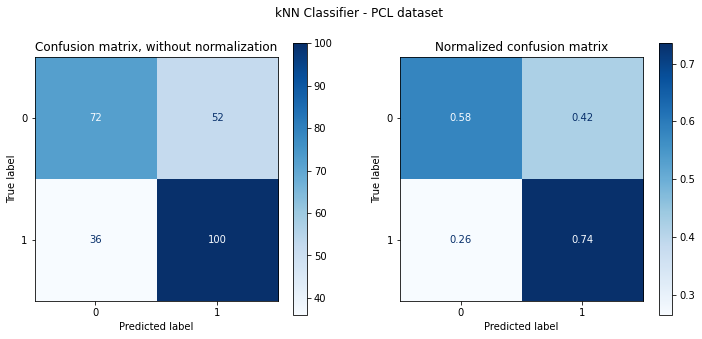

In [93]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'PCL')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

In [94]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
18,1,"{'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}",0.678808,0.647383,0.015486
6,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.678808,0.647383,0.019401
7,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.678808,0.647383,0.019401
19,1,"{'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}",0.678808,0.647383,0.015486
54,5,"{'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}",0.677565,0.645730,0.015249


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.6808
Precision     : 0.6810
Recall        : 0.6813
F1 Score      : 0.6807
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.66      0.69      0.67       124
           1       0.71      0.67      0.69       136

    accuracy                           0.68       260
   macro avg       0.68      0.68      0.68       260
weighted avg       0.68      0.68      0.68       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


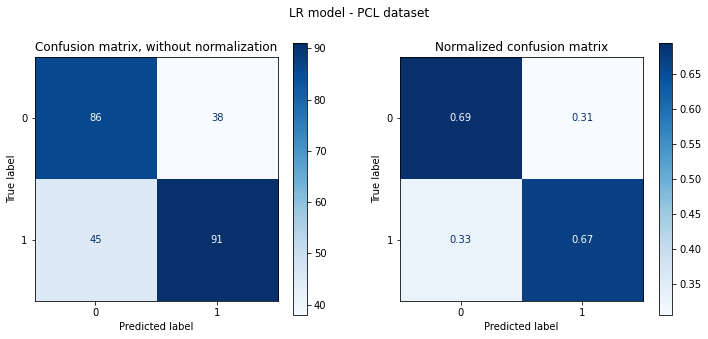

In [95]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'PCL')
plt_cmx(LR_best, X_test, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

In [96]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
6,1,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.683774,0.648994,0.023297
15,2,"{'C': 100, 'gamma': 'auto', 'kernel': 'linear'}",0.685844,0.647342,0.015501
12,3,"{'C': 10, 'gamma': 'auto', 'kernel': 'linear'}",0.685844,0.645675,0.016441
9,4,"{'C': 1, 'gamma': 'auto', 'kernel': 'linear'}",0.682533,0.645675,0.020838
3,5,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.669705,0.640785,0.051270


-----------------------------------------------------
Best model    > SVC(C=0.1, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.6846
Precision     : 0.6850
Recall        : 0.6854
F1 Score      : 0.6845
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.66      0.70      0.68       124
           1       0.71      0.67      0.69       136

    accuracy                           0.68       260
   macro avg       0.69      0.69      0.68       260
weighted avg       0.69      0.68      0.68       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


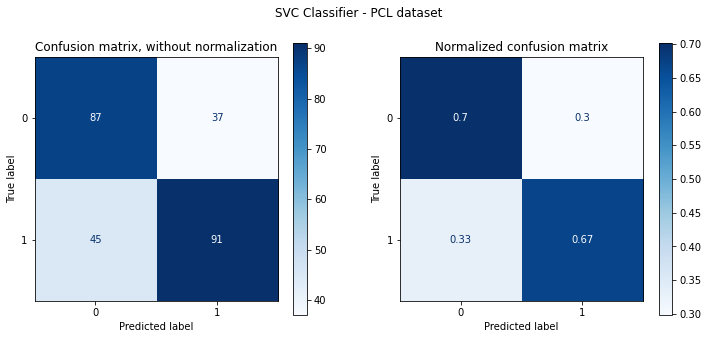

In [97]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'PCL')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

In [98]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
4,1,"{'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 50}",0.713166,0.642397,0.057976
14,2,"{'max_depth': 3, 'min_samples_split': 13, 'n_estimators': 50}",0.717302,0.639118,0.063037
9,3,"{'max_depth': 3, 'min_samples_split': 9, 'n_estimators': 50}",0.714405,0.637466,0.062979
0,4,"{'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 10}",0.712750,0.629105,0.046553
5,4,"{'max_depth': 3, 'min_samples_split': 9, 'n_estimators': 10}",0.713164,0.629105,0.046845


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=3, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.6654
Precision     : 0.6665
Recall        : 0.6666
F1 Score      : 0.6654
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.64      0.69      0.66       124
           1       0.70      0.64      0.67       136

    accuracy                           0.67       260
   macro avg       0.67      0.67      0.67       260
weighted avg       0.67      0.67      0.67       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


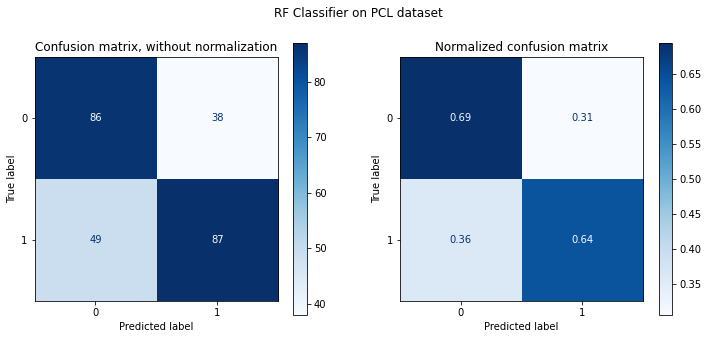

In [99]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'PCL')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

Feature 0: 0.004583
Feature 1: 0.028173
Feature 2: 0.028397
Feature 3: 0.040772
Feature 4: 0.014112
Feature 5: 0.000000
Feature 6: 0.012609
Feature 7: 0.000000
Feature 8: 0.000000
Feature 9: 0.023823
Feature 10: 0.000000
Feature 11: 0.012378
Feature 12: 0.017107
Feature 13: 0.000000
Feature 14: 0.002511
Feature 15: 0.000000
Feature 16: 0.016014
Feature 17: 0.008024
Feature 18: 0.023366
Feature 19: 0.015036
Feature 20: 0.036804
Feature 21: 0.008237
Feature 22: 0.012065
Feature 23: 0.000000
Feature 24: 0.039074
Feature 25: 0.019795
Feature 26: 0.000000


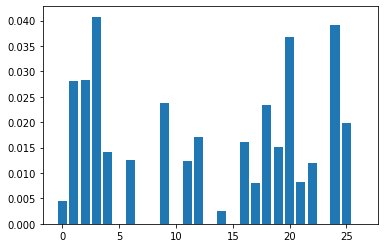

In [100]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=5)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='euclidean', n_neighbors=27,
                     weights='distance')
Test Accuracy : 0.5769
Precision     : 0.5758
Recall        : 0.5757
F1 Score      : 0.5757
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.56      0.55      0.55       124
           1       0.59      0.60      0.60       136

    accuracy                           0.58       260
   macro avg       0.58      0.58      0.58       260
weighted avg       0.58      0.58      0.58       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


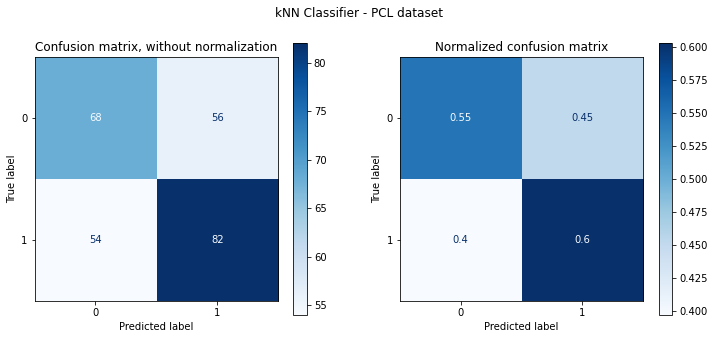

In [101]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'PCL')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.6231
Precision     : 0.6220
Recall        : 0.6216
F1 Score      : 0.6216
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.61      0.59      0.60       124
           1       0.64      0.65      0.64       136

    accuracy                           0.62       260
   macro avg       0.62      0.62      0.62       260
weighted avg       0.62      0.62      0.62       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


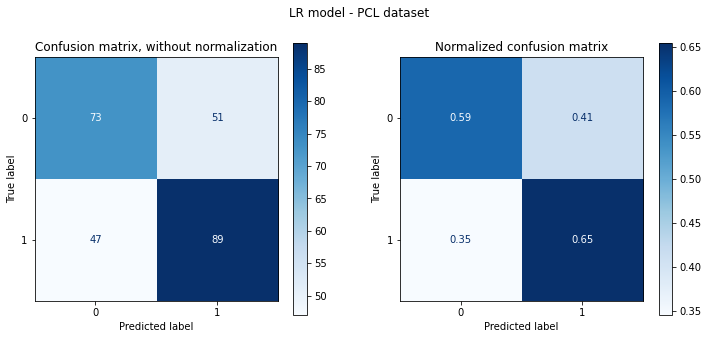

In [102]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'PCL')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.1, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.6308
Precision     : 0.6299
Recall        : 0.6282
F1 Score      : 0.6281
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.62      0.57      0.60       124
           1       0.64      0.68      0.66       136

    accuracy                           0.63       260
   macro avg       0.63      0.63      0.63       260
weighted avg       0.63      0.63      0.63       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


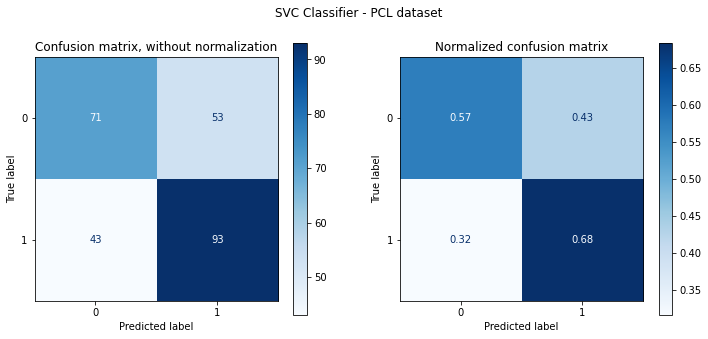

In [103]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'PCL')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=3, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.6577
Precision     : 0.6579
Recall        : 0.6582
F1 Score      : 0.6576
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.63      0.67      0.65       124
           1       0.68      0.65      0.66       136

    accuracy                           0.66       260
   macro avg       0.66      0.66      0.66       260
weighted avg       0.66      0.66      0.66       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


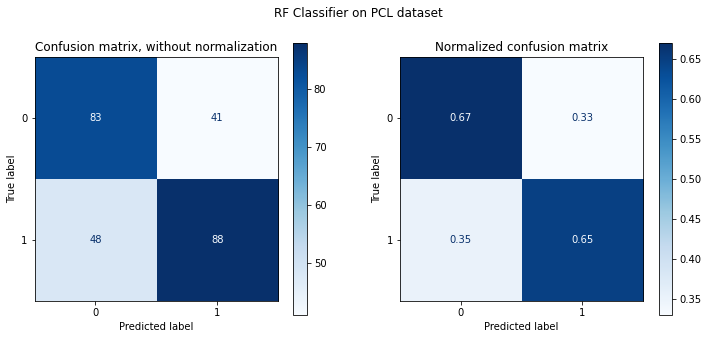

In [104]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'PCL')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

In [105]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

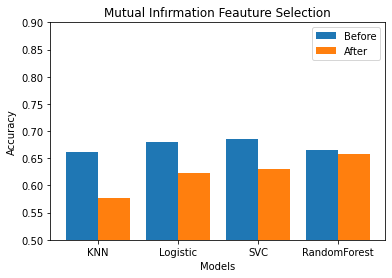

In [106]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 0.482048
Feature 1: 0.664725
Feature 2: 11.505854
Feature 3: 1.569317
Feature 4: 0.227318
Feature 5: 0.001216
Feature 6: 2.898260
Feature 7: 0.258258
Feature 8: 0.507639
Feature 9: 1.911293
Feature 10: 0.557114
Feature 11: 0.370249
Feature 12: 2.315654
Feature 13: 3.487434
Feature 14: 0.396770
Feature 15: 3.004106
Feature 16: 2.788572
Feature 17: 4.571580
Feature 18: 13.821921
Feature 19: 6.469560
Feature 20: 1.316120
Feature 21: 3.101931
Feature 22: 2.289446
Feature 23: 5.630694
Feature 24: 6.514574
Feature 25: 5.459604
Feature 26: 1.979956


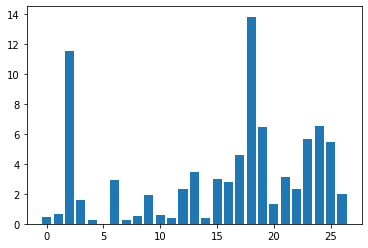

In [107]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='euclidean', n_neighbors=27,
                     weights='distance')
Test Accuracy : 0.5808
Precision     : 0.5818
Recall        : 0.5818
F1 Score      : 0.5808
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.56      0.60      0.58       124
           1       0.61      0.56      0.58       136

    accuracy                           0.58       260
   macro avg       0.58      0.58      0.58       260
weighted avg       0.58      0.58      0.58       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


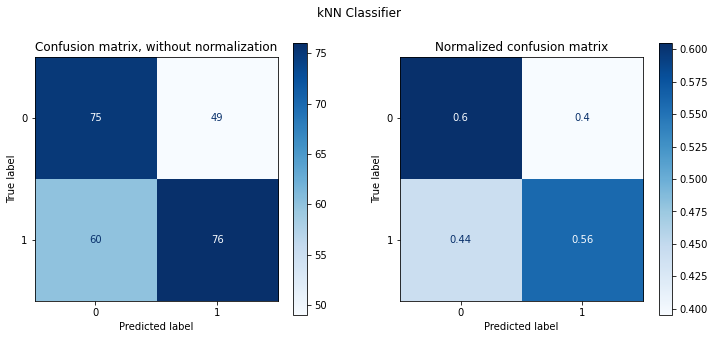

In [108]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.6385
Precision     : 0.6426
Recall        : 0.6412
F1 Score      : 0.6381
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.60      0.70      0.65       124
           1       0.68      0.58      0.63       136

    accuracy                           0.64       260
   macro avg       0.64      0.64      0.64       260
weighted avg       0.64      0.64      0.64       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


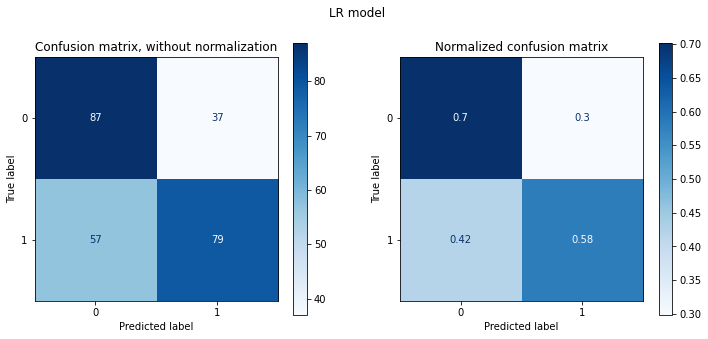

In [109]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model ')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.1, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.6346
Precision     : 0.6383
Recall        : 0.6372
F1 Score      : 0.6344
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.60      0.69      0.64       124
           1       0.68      0.58      0.62       136

    accuracy                           0.63       260
   macro avg       0.64      0.64      0.63       260
weighted avg       0.64      0.63      0.63       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


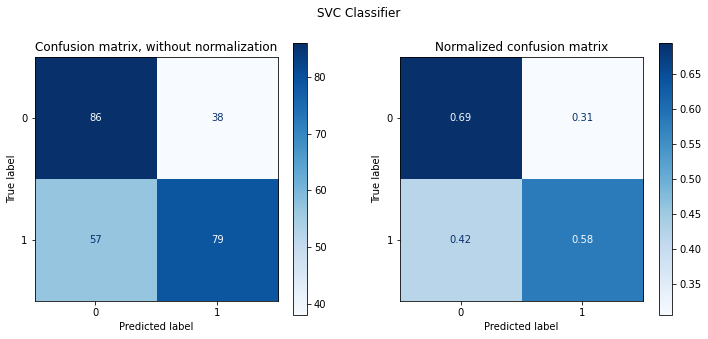

In [110]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=3, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.5923
Precision     : 0.5936
Recall        : 0.5936
F1 Score      : 0.5923
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.57      0.62      0.59       124
           1       0.62      0.57      0.59       136

    accuracy                           0.59       260
   macro avg       0.59      0.59      0.59       260
weighted avg       0.59      0.59      0.59       260



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


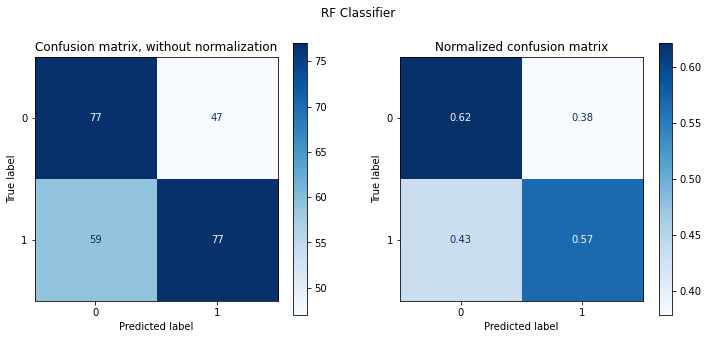

In [111]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [112]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

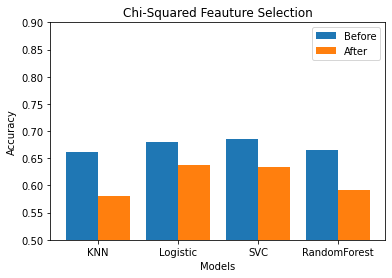

In [113]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['Mach1 ', 'Mach2 ', 'Mach3 ', 'Mach4 ', 'Mach5 ']


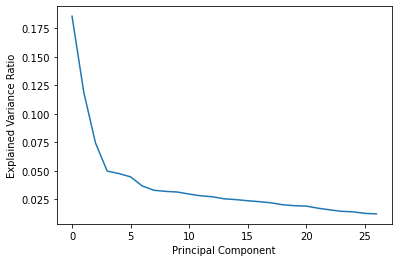

Highest loading features: ['Mach5 ', 'Mach2 ', 'Mach3 ', 'Narc7 ', 'Narc5 ']


In [114]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [115]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=5)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=9 
Mach2  selected =False rank=22 
Mach3  selected =False rank=3 
Mach4  selected =True rank=1 
Mach5  selected =False rank=7 
Mach6  selected =False rank=12 
Mach7  selected =False rank=6 
Mach8  selected =False rank=18 
Mach9  selected =False rank=20 
Psycho1  selected =False rank=10 
Psycho2  selected =False rank=19 
Psycho3  selected =False rank=14 
Psycho4  selected =False rank=23 
Psycho5  selected =True rank=1 
Psycho6  selected =True rank=1 
Psycho7  selected =False rank=11 
Psycho8  selected =False rank=15 
Psycho9  selected =False rank=5 
Narc1  selected =False rank=2 
Narc2  selected =False rank=17 
Narc3  selected =False rank=8 
Narc4  selected =False rank=13 
Narc5  selected =False rank=16 
Narc6  selected =True rank=1 
Narc7  selected =False rank=4 
Narc8  selected =False rank=21 
Narc9  selected =True rank=1 


In [116]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=8 
Mach2  selected =False rank=13 
Mach3  selected =True rank=1 
Mach4  selected =False rank=14 
Mach5  selected =False rank=4 
Mach6  selected =False rank=17 
Mach7  selected =True rank=1 
Mach8  selected =False rank=5 
Mach9  selected =False rank=24 
Psycho1  selected =False rank=18 
Psycho2  selected =False rank=10 
Psycho3  selected =False rank=11 
Psycho4  selected =False rank=7 
Psycho5  selected =False rank=16 
Psycho6  selected =False rank=6 
Psycho7  selected =True rank=1 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=3 
Narc1  selected =True rank=1 
Narc2  selected =False rank=21 
Narc3  selected =False rank=20 
Narc4  selected =False rank=23 
Narc5  selected =False rank=19 
Narc6  selected =False rank=15 
Narc7  selected =False rank=12 
Narc8  selected =False rank=22 
Narc9  selected =False rank=9 


In [117]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=8 
Mach2  selected =False rank=13 
Mach3  selected =True rank=1 
Mach4  selected =False rank=16 
Mach5  selected =False rank=5 
Mach6  selected =False rank=17 
Mach7  selected =True rank=1 
Mach8  selected =False rank=4 
Mach9  selected =False rank=21 
Psycho1  selected =False rank=20 
Psycho2  selected =False rank=11 
Psycho3  selected =False rank=15 
Psycho4  selected =False rank=7 
Psycho5  selected =False rank=12 
Psycho6  selected =False rank=6 
Psycho7  selected =True rank=1 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=3 
Narc1  selected =True rank=1 
Narc2  selected =False rank=19 
Narc3  selected =False rank=24 
Narc4  selected =False rank=22 
Narc5  selected =False rank=18 
Narc6  selected =False rank=14 
Narc7  selected =False rank=10 
Narc8  selected =False rank=23 
Narc9  selected =False rank=9 


In [118]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=19 
Mach2  selected =False rank=16 
Mach3  selected =False rank=4 
Mach4  selected =True rank=1 
Mach5  selected =False rank=6 
Mach6  selected =False rank=13 
Mach7  selected =False rank=10 
Mach8  selected =False rank=8 
Mach9  selected =True rank=1 
Psycho1  selected =False rank=5 
Psycho2  selected =False rank=17 
Psycho3  selected =False rank=23 
Psycho4  selected =False rank=24 
Psycho5  selected =True rank=1 
Psycho6  selected =False rank=18 
Psycho7  selected =False rank=20 
Psycho8  selected =False rank=22 
Psycho9  selected =False rank=9 
Narc1  selected =False rank=2 
Narc2  selected =False rank=14 
Narc3  selected =False rank=21 
Narc4  selected =False rank=12 
Narc5  selected =False rank=11 
Narc6  selected =False rank=3 
Narc7  selected =True rank=1 
Narc8  selected =False rank=15 
Narc9  selected =False rank=7 


In [119]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 59.61538461538461
[0.03130374 0.0328948  0.05319951 0.0417516  0.03353248 0.03120192
 0.04463373 0.03406954 0.0386237  0.03887147 0.03315038 0.02784543
 0.0257654  0.04385244 0.0304364  0.03307699 0.03039952 0.04159951
 0.05856388 0.04076874 0.02904428 0.03457443 0.03592438 0.04136995
 0.04384456 0.03482469 0.03487654]


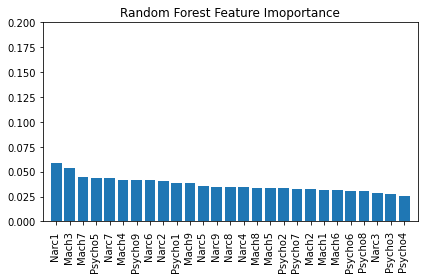

In [120]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [121]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [122]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

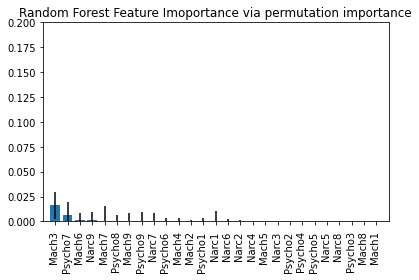

In [123]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [124]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['Mach1 ' 'Mach3 ' 'Mach4 ' 'Mach5 ' 'Mach7 ' 'Mach8 ' 'Psycho1 '
 'Psycho3 ' 'Psycho5 ' 'Psycho7 ' 'Psycho9 ' 'Narc1 ' 'Narc7 ']


Selected features with using Random Forest Classifier:
['Mach3 ' 'Mach4 ' 'Mach7 ' 'Mach8 ' 'Psycho1 ' 'Psycho5 ' 'Psycho9 '
 'Narc1 ' 'Narc6 ' 'Narc7 ']


Selected features with using Logistic Regression Classifier:
['Mach1 ' 'Mach3 ' 'Mach7 ' 'Psycho6 ' 'Psycho7 ' 'Psycho8 ' 'Psycho9 '
 'Narc1 ']


Selected features with using Linear Regression:
['Mach1 ' 'Mach3 ' 'Mach7 ' 'Psycho4 ' 'Psycho6 ' 'Psycho7 ' 'Psycho8 '
 'Psycho9 ' 'Narc1 ']


#PRMQ# 

In [127]:
df = pd.read_csv("PRMQ_df.csv") # Creating the dataframe.
print(df)

      PRMQ_PR_SH_CU1  PRMQ_RE _LO_ENV2   PRMQ_PR_SH_ENV3  PRMQ_RE_SH_CU4  \
0                  4                 3                 2               4   
1                  3                 1                 1               3   
2                  3                 2                 2               4   
3                  4                 1                 2               4   
4                  4                 3                 3               4   
...              ...               ...               ...             ...   
1399               2                 4                 4               2   
1400               5                 5                 4               5   
1401               4                 4                 4               5   
1402               4                 4                 4               5   
1403               4                 5                 4               4   

      PRMQ_PR_LO_CU5  PRMQ_RE_SH_ENV6  PRMQ_PR_LO_ENV7  PRMQ_RE_LO_CU8  \
0            

In [128]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [129]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X


,PRMQ_PR_SH_CU1,PRMQ_RE _LO_ENV2,PRMQ_PR_SH_ENV3,PRMQ_RE_SH_CU4,PRMQ_PR_LO_CU5,PRMQ_RE_SH_ENV6,PRMQ_PR_LO_ENV7,PRMQ_RE_LO_CU8,PRMQ_RE_LO_ENV9,PRMQ_PR_SH_ENV10,PRMQ _RE_SH_CU11,PRMQ_PR_LO_ENV12,PRMQ _RE_SH_ENV13,PRMQ _PR_LO_CU14,PRMQ_RE_LO_CU15,PRMQ_PR_SH_CU16
0,4,3,2,4,4,2,3,2,3,3,4,4,2,4,4,4
1,3,1,1,3,1,4,4,2,5,3,4,1,2,4,3,4
2,3,2,2,4,5,1,1,4,2,4,5,2,1,5,2,4
3,4,1,2,4,3,1,1,3,4,3,4,3,2,5,4,4
4,4,3,3,4,3,2,5,3,4,5,4,3,3,3,2,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1399,2,4,4,2,4,5,5,5,1,5,1,5,4,4,5,4
1400,5,5,4,5,5,4,5,5,5,5,5,5,5,5,5,5
1401,4,4,4,5,5,5,5,5,1,5,5,5,4,4,4,5
1402,4,4,4,5,2,4,4,3,2,5,3,2,5,5,4,4


In [130]:
number_of_features = X.shape[1]
number_of_features

16

In [131]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0       1
1       1
2       1
3       1
4       1
       ..
1399    0
1400    0
1401    0
1402    0
1403    0
Name: CONDITION, Length: 1404, dtype: object

In [132]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [133]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [134]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
105,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 23, 'weights': 'distance'}",0.998982,0.921568,0.017274
349,2,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",0.998982,0.919528,0.018680
101,3,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 21, 'weights': 'distance'}",0.998982,0.918518,0.019068
225,4,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 23, 'weights': 'distance'}",0.998982,0.918518,0.017972
109,4,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",0.998982,0.918518,0.017080


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=23,
                     weights='distance')
Test Accuracy : 0.9313
Precision     : 0.9319
Recall        : 0.9315
F1 Score      : 0.9313
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       213
           1       0.91      0.95      0.93       209

    accuracy                           0.93       422
   macro avg       0.93      0.93      0.93       422
weighted avg       0.93      0.93      0.93       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


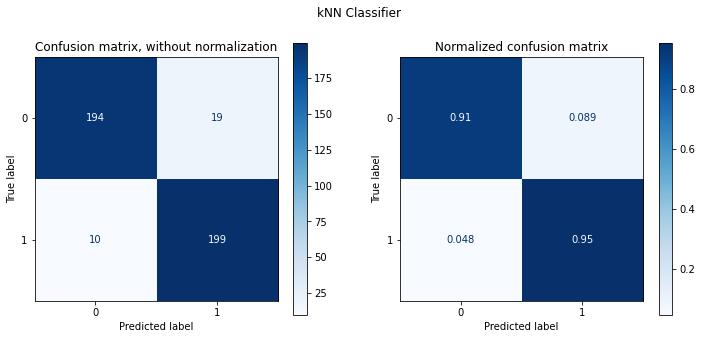

In [135]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [ ]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='newton-cg')
Test Accuracy : 0.9218
Precision     : 0.9220
Recall        : 0.9219
F1 Score      : 0.9218
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       213
           1       0.91      0.93      0.92       209

    accuracy                           0.92       422
   macro avg       0.92      0.92      0.92       422
weighted avg       0.92      0.92      0.92       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


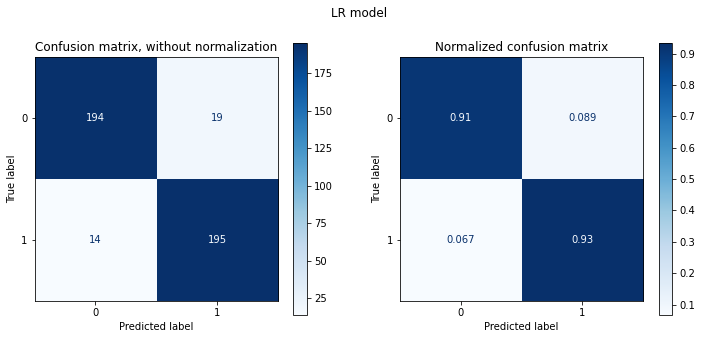

In [137]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [138]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
10,1,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.958247,0.911390,0.024219
13,2,"{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}",0.993890,0.897151,0.005881
3,3,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.898423,0.893090,0.014264
8,4,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'poly'}",0.953917,0.892044,0.014289
6,5,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.899186,0.891049,0.015215


-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9408
Precision     : 0.9409
Recall        : 0.9409
F1 Score      : 0.9408
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       213
           1       0.93      0.95      0.94       209

    accuracy                           0.94       422
   macro avg       0.94      0.94      0.94       422
weighted avg       0.94      0.94      0.94       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


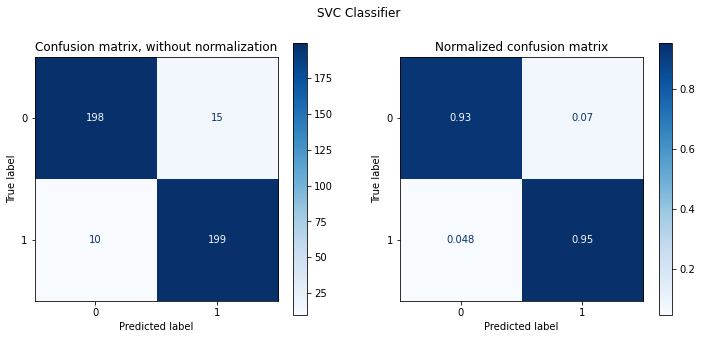

In [139]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [140]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
48,1,"{'max_depth': 9, 'min_samples_split': 5, 'n_estimators': 40}",0.983451,0.929732,0.008766
49,2,"{'max_depth': 9, 'min_samples_split': 5, 'n_estimators': 50}",0.983451,0.928711,0.009685
37,3,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 30}",0.965375,0.925666,0.018643
58,4,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 40}",0.963084,0.925660,0.015276
53,5,"{'max_depth': 9, 'min_samples_split': 9, 'n_estimators': 40}",0.970976,0.924630,0.024997


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=9, max_features='sqrt', min_samples_split=5,
                       n_estimators=40, random_state=123)
Test Accuracy : 0.9408
Precision     : 0.9411
Recall        : 0.9409
F1 Score      : 0.9408
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       213
           1       0.93      0.96      0.94       209

    accuracy                           0.94       422
   macro avg       0.94      0.94      0.94       422
weighted avg       0.94      0.94      0.94       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


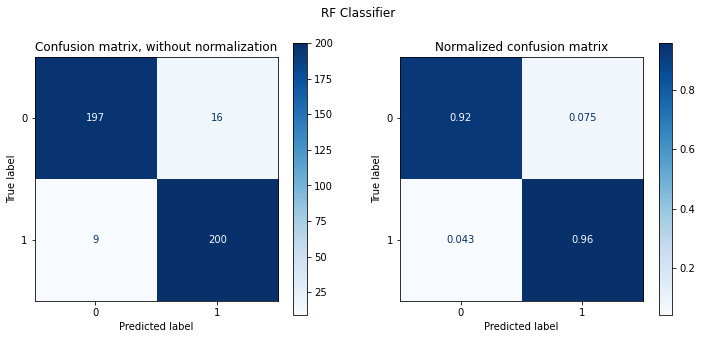

In [141]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [142]:
number = int(number_of_features/5)

Feature 0: 0.209454
Feature 1: 0.322603
Feature 2: 0.237069
Feature 3: 0.224658
Feature 4: 0.247726
Feature 5: 0.208762
Feature 6: 0.184907
Feature 7: 0.287967
Feature 8: 0.168455
Feature 9: 0.177876
Feature 10: 0.150252
Feature 11: 0.219194
Feature 12: 0.251777
Feature 13: 0.161937
Feature 14: 0.239905
Feature 15: 0.232534


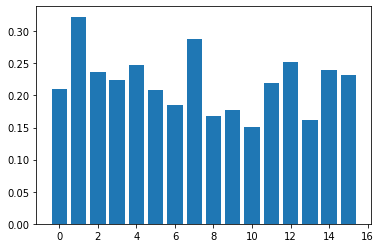

In [143]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=23,
                     weights='distance')
Test Accuracy : 0.8886
Precision     : 0.8915
Recall        : 0.8890
F1 Score      : 0.8885
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.85      0.88       213
           1       0.86      0.93      0.89       209

    accuracy                           0.89       422
   macro avg       0.89      0.89      0.89       422
weighted avg       0.89      0.89      0.89       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


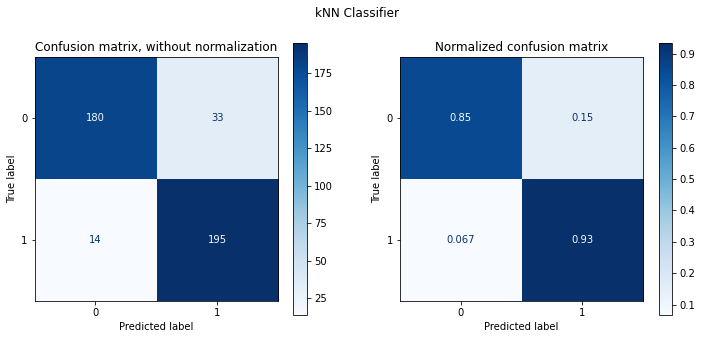

In [144]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier ')
update_summary(knn_sum, clf_results)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='newton-cg')
Test Accuracy : 0.9076
Precision     : 0.9100
Recall        : 0.9080
F1 Score      : 0.9075
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.87      0.90       213
           1       0.88      0.95      0.91       209

    accuracy                           0.91       422
   macro avg       0.91      0.91      0.91       422
weighted avg       0.91      0.91      0.91       422



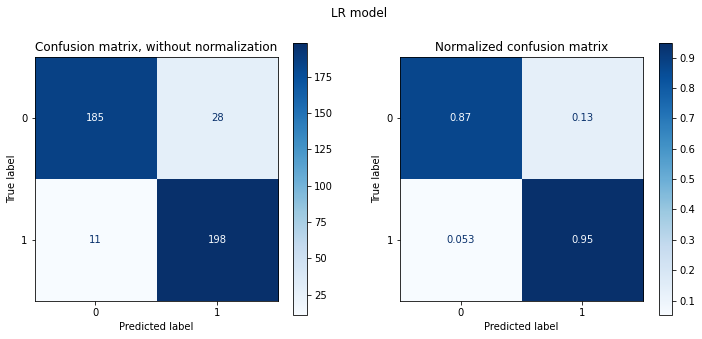

In [145]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9100
Precision     : 0.9134
Recall        : 0.9104
F1 Score      : 0.9098
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.86      0.91       213
           1       0.87      0.96      0.91       209

    accuracy                           0.91       422
   macro avg       0.91      0.91      0.91       422
weighted avg       0.91      0.91      0.91       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


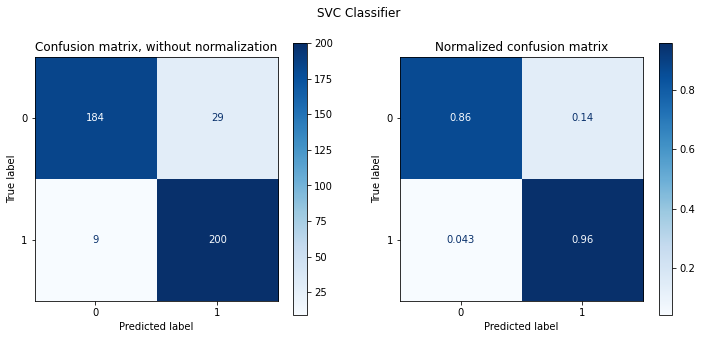

In [146]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=9, max_features='sqrt', min_samples_split=5,
                       n_estimators=40, random_state=123)
Test Accuracy : 0.8934
Precision     : 0.8963
Recall        : 0.8938
F1 Score      : 0.8932
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.85      0.89       213
           1       0.86      0.94      0.90       209

    accuracy                           0.89       422
   macro avg       0.90      0.89      0.89       422
weighted avg       0.90      0.89      0.89       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


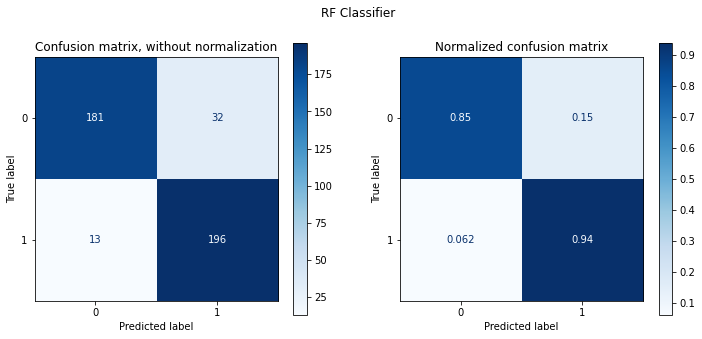

In [147]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [148]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

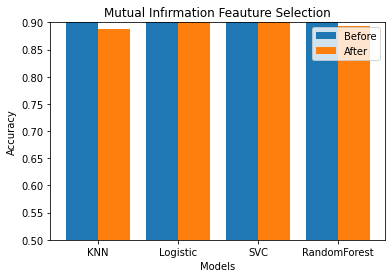

In [149]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 131.341523
Feature 1: 440.417020
Feature 2: 241.019984
Feature 3: 157.378622
Feature 4: 214.846110
Feature 5: 290.287878
Feature 6: 172.871562
Feature 7: 319.732141
Feature 8: 105.226283
Feature 9: 100.150557
Feature 10: 72.556707
Feature 11: 169.775190
Feature 12: 311.221474
Feature 13: 139.460829
Feature 14: 254.531527
Feature 15: 112.511140


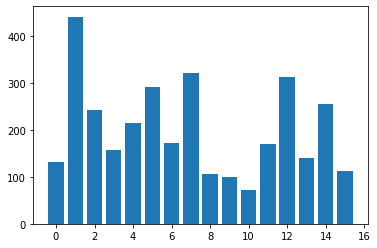

In [150]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=23,
                     weights='distance')
Test Accuracy : 0.8886
Precision     : 0.8915
Recall        : 0.8890
F1 Score      : 0.8885
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.85      0.88       213
           1       0.86      0.93      0.89       209

    accuracy                           0.89       422
   macro avg       0.89      0.89      0.89       422
weighted avg       0.89      0.89      0.89       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


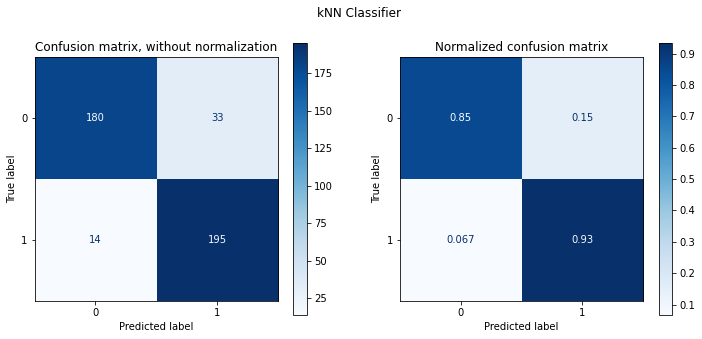

In [151]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='newton-cg')
Test Accuracy : 0.9076
Precision     : 0.9100
Recall        : 0.9080
F1 Score      : 0.9075
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.87      0.90       213
           1       0.88      0.95      0.91       209

    accuracy                           0.91       422
   macro avg       0.91      0.91      0.91       422
weighted avg       0.91      0.91      0.91       422



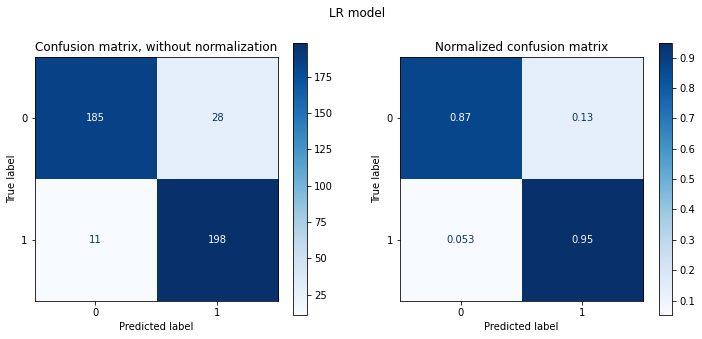

In [152]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model ')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9100
Precision     : 0.9134
Recall        : 0.9104
F1 Score      : 0.9098
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.86      0.91       213
           1       0.87      0.96      0.91       209

    accuracy                           0.91       422
   macro avg       0.91      0.91      0.91       422
weighted avg       0.91      0.91      0.91       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


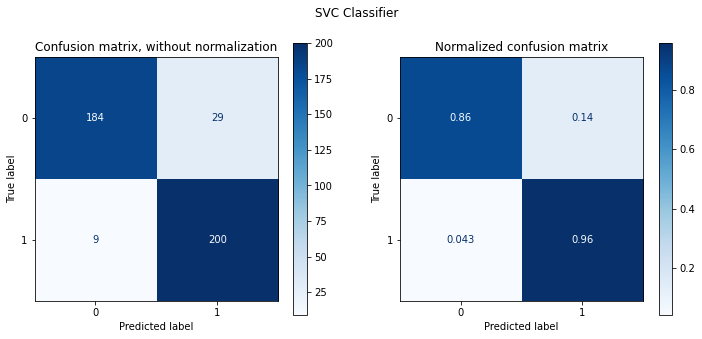

In [153]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier ')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=9, max_features='sqrt', min_samples_split=5,
                       n_estimators=40, random_state=123)
Test Accuracy : 0.8934
Precision     : 0.8963
Recall        : 0.8938
F1 Score      : 0.8932
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.85      0.89       213
           1       0.86      0.94      0.90       209

    accuracy                           0.89       422
   macro avg       0.90      0.89      0.89       422
weighted avg       0.90      0.89      0.89       422



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


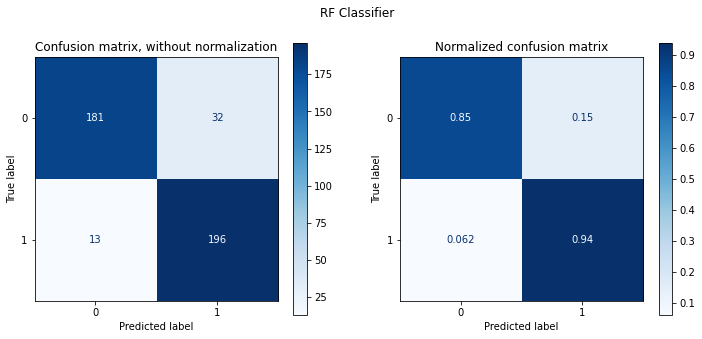

In [154]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier ')
update_summary(RF1, clf_results)

In [155]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

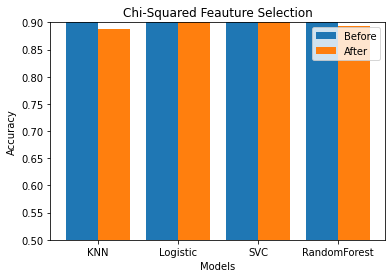

In [156]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['PRMQ_PR_SH_CU1', 'PRMQ_RE _LO_ENV2', ' PRMQ_PR_SH_ENV3', 'PRMQ_RE_SH_CU4', 'PRMQ_PR_LO_CU5']


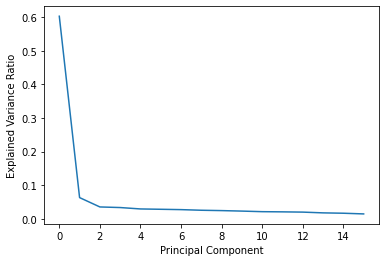

Highest loading features: ['PRMQ_RE_LO_ENV9', 'PRMQ _RE_SH_CU11', 'PRMQ_PR_SH_ENV10', 'PRMQ_PR_LO_ENV12', 'PRMQ_PR_SH_CU16']


In [157]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [158]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PRMQ_PR_SH_CU1 selected =False rank=7 
PRMQ_RE _LO_ENV2 selected =True rank=1 
 PRMQ_PR_SH_ENV3 selected =False rank=6 
PRMQ_RE_SH_CU4 selected =False rank=3 
PRMQ_PR_LO_CU5 selected =False rank=2 
PRMQ_RE_SH_ENV6 selected =False rank=5 
PRMQ_PR_LO_ENV7 selected =False rank=4 
PRMQ_RE_LO_CU8 selected =True rank=1 
PRMQ_RE_LO_ENV9 selected =False rank=12 
PRMQ_PR_SH_ENV10 selected =False rank=11 
PRMQ _RE_SH_CU11 selected =False rank=9 
PRMQ_PR_LO_ENV12 selected =False rank=10 
PRMQ _RE_SH_ENV13 selected =True rank=1 
PRMQ _PR_LO_CU14 selected =False rank=13 
PRMQ_RE_LO_CU15 selected =False rank=14 
PRMQ_PR_SH_CU16 selected =False rank=8 


In [159]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PRMQ_PR_SH_CU1 selected =False rank=12 
PRMQ_RE _LO_ENV2 selected =True rank=1 
 PRMQ_PR_SH_ENV3 selected =False rank=4 
PRMQ_RE_SH_CU4 selected =False rank=7 
PRMQ_PR_LO_CU5 selected =False rank=2 
PRMQ_RE_SH_ENV6 selected =False rank=5 
PRMQ_PR_LO_ENV7 selected =False rank=13 
PRMQ_RE_LO_CU8 selected =True rank=1 
PRMQ_RE_LO_ENV9 selected =False rank=11 
PRMQ_PR_SH_ENV10 selected =False rank=6 
PRMQ _RE_SH_CU11 selected =False rank=3 
PRMQ_PR_LO_ENV12 selected =False rank=9 
PRMQ _RE_SH_ENV13 selected =True rank=1 
PRMQ _PR_LO_CU14 selected =False rank=14 
PRMQ_RE_LO_CU15 selected =False rank=10 
PRMQ_PR_SH_CU16 selected =False rank=8 


In [160]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PRMQ_PR_SH_CU1 selected =False rank=12 
PRMQ_RE _LO_ENV2 selected =True rank=1 
 PRMQ_PR_SH_ENV3 selected =False rank=2 
PRMQ_RE_SH_CU4 selected =False rank=9 
PRMQ_PR_LO_CU5 selected =False rank=4 
PRMQ_RE_SH_ENV6 selected =False rank=6 
PRMQ_PR_LO_ENV7 selected =False rank=14 
PRMQ_RE_LO_CU8 selected =True rank=1 
PRMQ_RE_LO_ENV9 selected =False rank=10 
PRMQ_PR_SH_ENV10 selected =False rank=5 
PRMQ _RE_SH_CU11 selected =False rank=3 
PRMQ_PR_LO_ENV12 selected =False rank=7 
PRMQ _RE_SH_ENV13 selected =True rank=1 
PRMQ _PR_LO_CU14 selected =False rank=13 
PRMQ_RE_LO_CU15 selected =False rank=11 
PRMQ_PR_SH_CU16 selected =False rank=8 


In [161]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PRMQ_PR_SH_CU1 selected =False rank=10 
PRMQ_RE _LO_ENV2 selected =True rank=1 
 PRMQ_PR_SH_ENV3 selected =False rank=3 
PRMQ_RE_SH_CU4 selected =False rank=8 
PRMQ_PR_LO_CU5 selected =False rank=5 
PRMQ_RE_SH_ENV6 selected =False rank=4 
PRMQ_PR_LO_ENV7 selected =False rank=9 
PRMQ_RE_LO_CU8 selected =True rank=1 
PRMQ_RE_LO_ENV9 selected =False rank=12 
PRMQ_PR_SH_ENV10 selected =False rank=13 
PRMQ _RE_SH_CU11 selected =False rank=7 
PRMQ_PR_LO_ENV12 selected =False rank=6 
PRMQ _RE_SH_ENV13 selected =True rank=1 
PRMQ _PR_LO_CU14 selected =False rank=14 
PRMQ_RE_LO_CU15 selected =False rank=2 
PRMQ_PR_SH_CU16 selected =False rank=11 


In [162]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 99.89816700610999
Test accuracy: 93.60189573459715
[0.02771679 0.22492596 0.06139966 0.04218687 0.05191741 0.05641019
 0.03320162 0.15555489 0.02605798 0.02192915 0.02790905 0.04295502
 0.09576504 0.01858013 0.09187619 0.02161405]


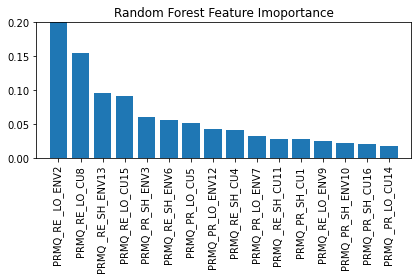

In [163]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [166]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [ ]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


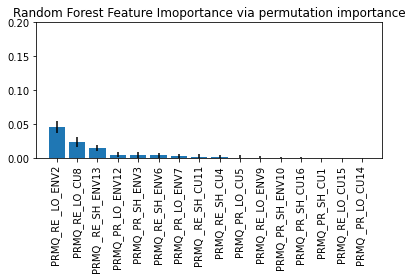

In [168]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [169]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['PRMQ_RE _LO_ENV2' 'PRMQ_RE_LO_CU8']


Selected features with using Random Forest Classifier:
['PRMQ_RE _LO_ENV2' 'PRMQ_RE_SH_ENV6' 'PRMQ_RE_LO_CU8' 'PRMQ _RE_SH_ENV13'
 'PRMQ_RE_LO_CU15']


Selected features with using Logistic Regression Classifier:
['PRMQ_RE _LO_ENV2' ' PRMQ_PR_SH_ENV3' 'PRMQ_PR_LO_CU5' 'PRMQ_RE_LO_CU8'
 'PRMQ_PR_SH_ENV10' 'PRMQ _RE_SH_CU11' 'PRMQ _RE_SH_ENV13']


Selected features with using Linear Regression:
['PRMQ_RE _LO_ENV2' ' PRMQ_PR_SH_ENV3' 'PRMQ_PR_LO_CU5' 'PRMQ_RE_SH_ENV6'
 'PRMQ_RE_LO_CU8' 'PRMQ _RE_SH_CU11' 'PRMQ _RE_SH_ENV13']


#NAQ_R# 

In [170]:
df = pd.read_csv("NAQ_R_df.csv", delimiter= ';') # Creating the dataframe.
print(df)

     NAQ-R_WR_1  NAQ-R_PR_2  NAQ-R_WR_3  NAQ-R_WR_4  NAQ-R_PR_5  NAQ-R_PR_6  \
0             1           1           3           2           1           1   
1             1           1           1           1           2           4   
2             1           1           3           1           1           1   
3             1           1           1           1           1           1   
4             1           1           1           1           2           4   
..          ...         ...         ...         ...         ...         ...   
707           4           4           5           5           4           5   
708           1           1           2           2           1           1   
709           5           5           5           5           5           5   
710           5           5           5           5           5           5   
711           4           4           4           5           3           3   

     NAQ-R_PR_7  NAQ-R_PI_8  NAQ-R_PI_9  NAQ-R_WR_1

In [171]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [172]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,NAQ-R_WR_1,NAQ-R_PR_2,NAQ-R_WR_3,NAQ-R_WR_4,NAQ-R_PR_5,NAQ-R_PR_6,NAQ-R_PR_7,NAQ-R_PI_8,NAQ-R_PI_9,NAQ-R_WR_10,...,NAQ-R_WR_13,NAQ-R_PR_14,NAQ-R_PI_15,NAQ-R_WR_16,NAQ-R_PR_17,NAQ-R_WR_18,NAQ-R_WR_19,NAQ-R_PR_20,NAQ-R_WR_21,NAQ-R_PI_22
0,1,1,3,2,1,1,1,2,1,1,...,1,2,1,1,1,2,1,1,1,1
1,1,1,1,1,2,4,1,1,1,1,...,1,1,1,1,1,1,1,2,1,1
2,1,1,3,1,1,1,3,4,2,1,...,1,3,2,1,1,1,1,2,3,2
3,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
4,1,1,1,1,2,4,3,2,2,1,...,1,2,3,1,3,2,1,3,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
707,4,4,5,5,4,5,5,5,4,5,...,5,5,5,4,5,5,5,5,5,1
708,1,1,2,2,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
709,5,5,5,5,5,5,5,4,5,5,...,5,5,4,5,5,5,5,4,4,1
710,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5


In [173]:
number_of_features = X.shape[1]
number_of_features

22

In [174]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
707    0
708    0
709    0
710    0
711    0
Name: CONDITION, Length: 712, dtype: object

In [175]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [176]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [177]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
206,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 14, 'weights': 'uniform'}",0.954315,0.953798,0.017507
204,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 13, 'weights': 'uniform'}",0.953312,0.953798,0.017507
326,1,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 14, 'weights': 'uniform'}",0.954818,0.953798,0.017507
86,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 14, 'weights': 'uniform'}",0.953813,0.953798,0.017507
142,5,"{'algorithm': 'kd_tree', 'metric': 'euclidean', 'n_neighbors': 12, 'weights': 'uniform'}",0.954822,0.951818,0.021373


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=14)
Test Accuracy : 0.9579
Precision     : 0.9643
Recall        : 0.9536
F1 Score      : 0.9572
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        97
           1       0.93      1.00      0.96       117

    accuracy                           0.96       214
   macro avg       0.96      0.95      0.96       214
weighted avg       0.96      0.96      0.96       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


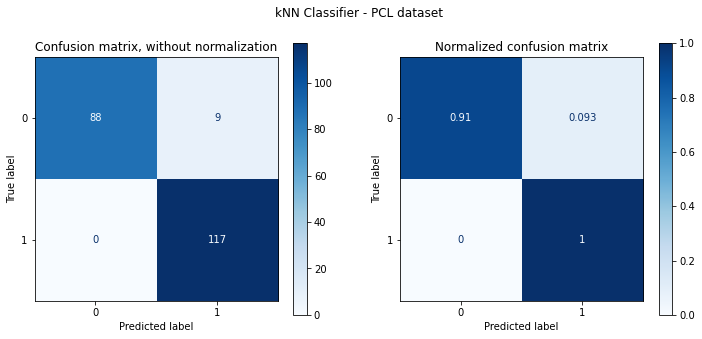

In [178]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'PCL')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

In [179]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
20,1,"{'C': 1, 'penalty': 'l2', 'solver': 'sag'}",0.952310,0.951818,0.007427
8,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'sag'}",0.952812,0.951818,0.007427
6,3,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.953815,0.949798,0.008993
7,3,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.953815,0.949798,0.008993
18,5,"{'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}",0.953815,0.947798,0.011665


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='sag')
Test Accuracy : 0.9579
Precision     : 0.9622
Recall        : 0.9545
F1 Score      : 0.9573
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.92      0.95        97
           1       0.94      0.99      0.96       117

    accuracy                           0.96       214
   macro avg       0.96      0.95      0.96       214
weighted avg       0.96      0.96      0.96       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


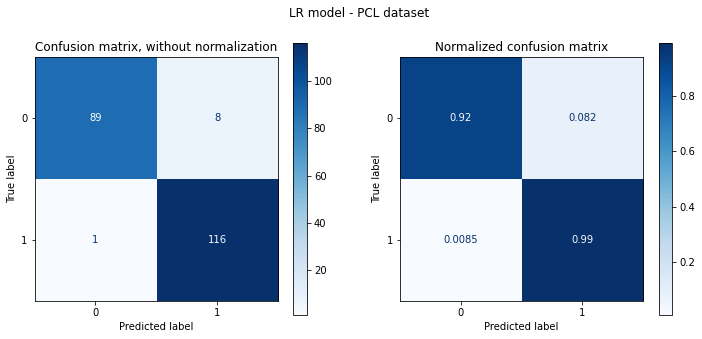

In [180]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'PCL')
plt_cmx(LR_best, X_test, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

In [181]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
3,1,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.955820,0.953798,0.017507
10,1,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.957831,0.953798,0.012103
2,3,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'poly'}",0.951807,0.951798,0.020437
5,3,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'poly'}",0.957328,0.951798,0.014754
6,3,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.956827,0.951798,0.009883


-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.9626
Precision     : 0.9680
Recall        : 0.9588
F1 Score      : 0.9620
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        97
           1       0.94      1.00      0.97       117

    accuracy                           0.96       214
   macro avg       0.97      0.96      0.96       214
weighted avg       0.97      0.96      0.96       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


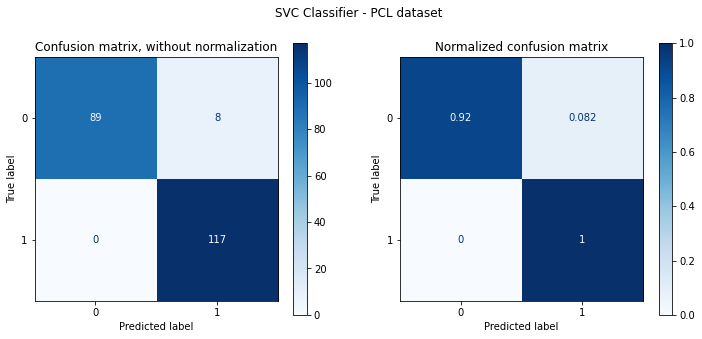

In [182]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'PCL')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

In [183]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
54,1,"{'max_depth': 9, 'min_samples_split': 9, 'n_estimators': 50}",0.959337,0.955818,0.010228
19,1,"{'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 50}",0.957328,0.955818,0.010228
34,1,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 50}",0.957831,0.955818,0.010228
24,4,"{'max_depth': 5, 'min_samples_split': 9, 'n_estimators': 50}",0.956827,0.953818,0.013561
1,4,"{'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 20}",0.952814,0.953818,0.007993


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9579
Precision     : 0.9643
Recall        : 0.9536
F1 Score      : 0.9572
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        97
           1       0.93      1.00      0.96       117

    accuracy                           0.96       214
   macro avg       0.96      0.95      0.96       214
weighted avg       0.96      0.96      0.96       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


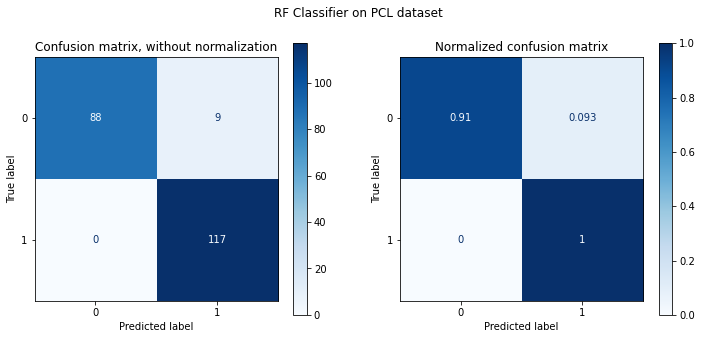

In [184]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'PCL')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

In [185]:
number = int(number_of_features/5)

Feature 0: 0.379583
Feature 1: 0.440878
Feature 2: 0.198193
Feature 3: 0.363759
Feature 4: 0.365505
Feature 5: 0.426830
Feature 6: 0.389017
Feature 7: 0.388764
Feature 8: 0.450707
Feature 9: 0.501344
Feature 10: 0.432017
Feature 11: 0.364421
Feature 12: 0.476075
Feature 13: 0.417802
Feature 14: 0.385238
Feature 15: 0.411382
Feature 16: 0.473149
Feature 17: 0.396640
Feature 18: 0.384173
Feature 19: 0.450422
Feature 20: 0.353527
Feature 21: 0.381941


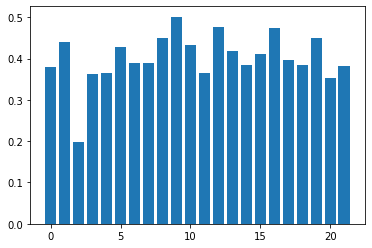

In [186]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=14)
Test Accuracy : 0.9533
Precision     : 0.9606
Recall        : 0.9485
F1 Score      : 0.9523
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        97
           1       0.92      1.00      0.96       117

    accuracy                           0.95       214
   macro avg       0.96      0.95      0.95       214
weighted avg       0.96      0.95      0.95       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


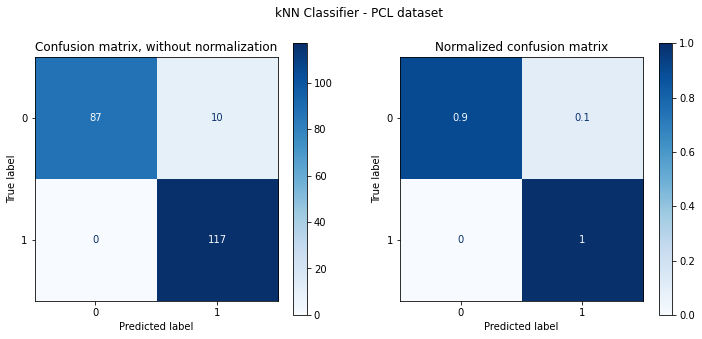

In [187]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'PCL')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='sag')
Test Accuracy : 0.9533
Precision     : 0.9584
Recall        : 0.9493
F1 Score      : 0.9525
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.91      0.95        97
           1       0.93      0.99      0.96       117

    accuracy                           0.95       214
   macro avg       0.96      0.95      0.95       214
weighted avg       0.96      0.95      0.95       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


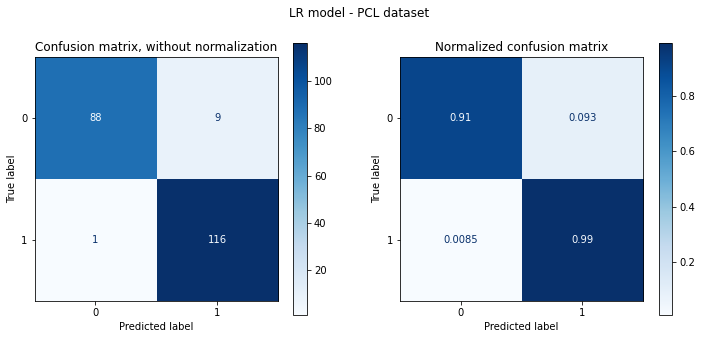

In [188]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'PCL')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.9579
Precision     : 0.9643
Recall        : 0.9536
F1 Score      : 0.9572
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        97
           1       0.93      1.00      0.96       117

    accuracy                           0.96       214
   macro avg       0.96      0.95      0.96       214
weighted avg       0.96      0.96      0.96       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


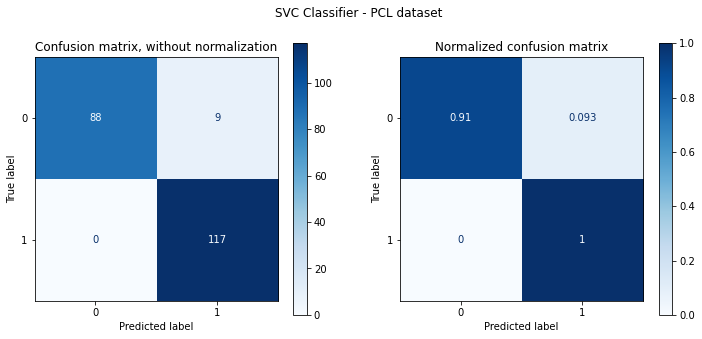

In [189]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'PCL')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9533
Precision     : 0.9565
Recall        : 0.9502
F1 Score      : 0.9526
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.92      0.95        97
           1       0.93      0.98      0.96       117

    accuracy                           0.95       214
   macro avg       0.96      0.95      0.95       214
weighted avg       0.95      0.95      0.95       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


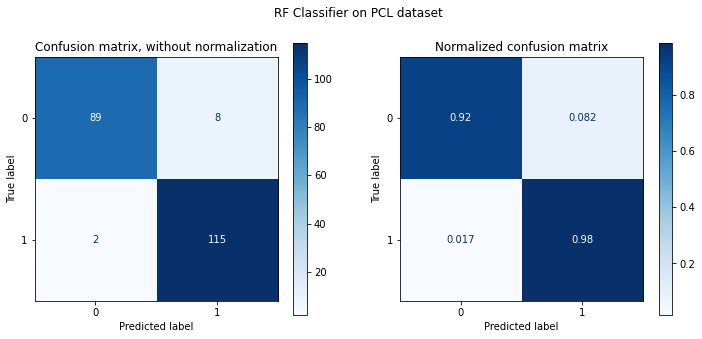

In [190]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'PCL')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

In [191]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

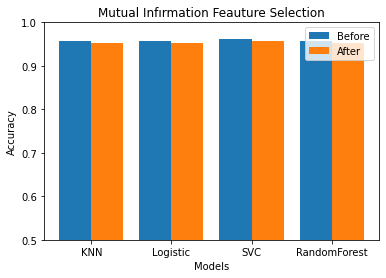

In [192]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Feature 0: 238.297949
Feature 1: 351.971123
Feature 2: 121.521091
Feature 3: 276.402370
Feature 4: 268.849325
Feature 5: 323.778596
Feature 6: 291.745525
Feature 7: 267.576479
Feature 8: 347.881049
Feature 9: 428.780479
Feature 10: 267.141843
Feature 11: 249.695939
Feature 12: 389.266572
Feature 13: 237.853825
Feature 14: 343.980337
Feature 15: 286.936111
Feature 16: 306.852441
Feature 17: 274.271920
Feature 18: 315.341227
Feature 19: 315.666446
Feature 20: 285.818392
Feature 21: 332.525247


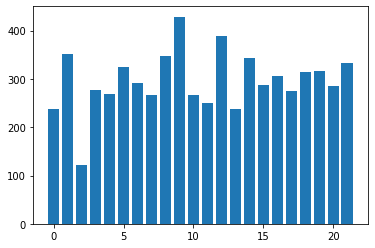

In [193]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=14)
Test Accuracy : 0.9579
Precision     : 0.9643
Recall        : 0.9536
F1 Score      : 0.9572
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        97
           1       0.93      1.00      0.96       117

    accuracy                           0.96       214
   macro avg       0.96      0.95      0.96       214
weighted avg       0.96      0.96      0.96       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


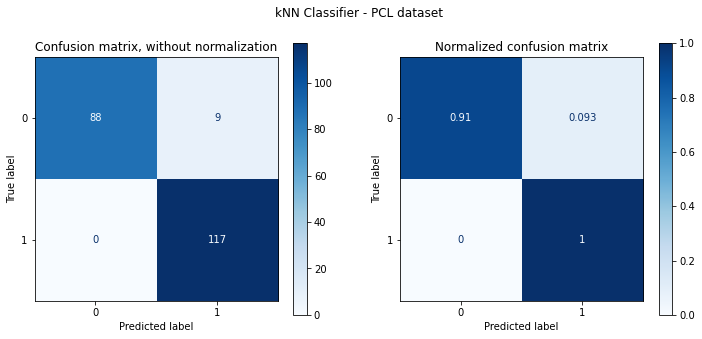

In [194]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'PCL')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='sag')
Test Accuracy : 0.9439
Precision     : 0.9469
Recall        : 0.9408
F1 Score      : 0.9431
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.91      0.94        97
           1       0.93      0.97      0.95       117

    accuracy                           0.94       214
   macro avg       0.95      0.94      0.94       214
weighted avg       0.95      0.94      0.94       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


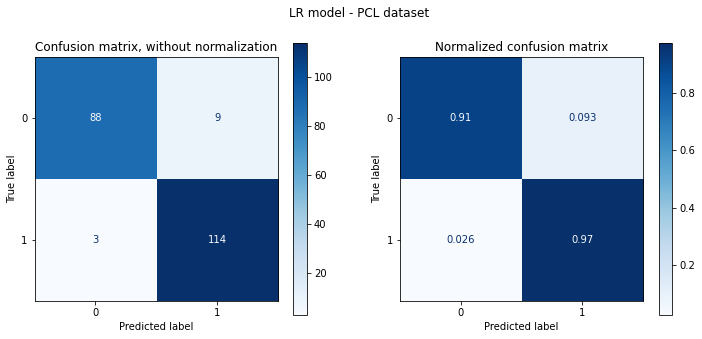

In [195]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'PCL')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model - PCL dataset')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.9579
Precision     : 0.9643
Recall        : 0.9536
F1 Score      : 0.9572
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.91      0.95        97
           1       0.93      1.00      0.96       117

    accuracy                           0.96       214
   macro avg       0.96      0.95      0.96       214
weighted avg       0.96      0.96      0.96       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


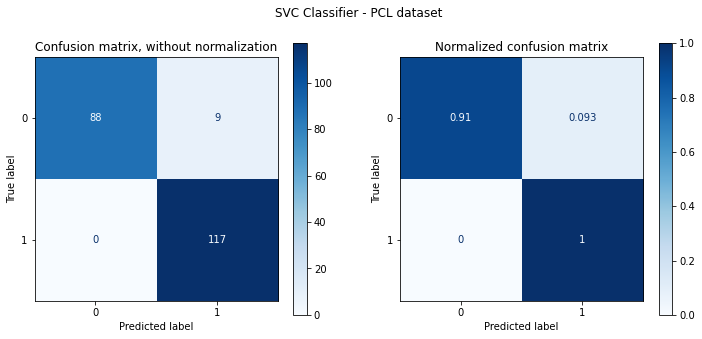

In [196]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'PCL')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier - PCL dataset')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9533
Precision     : 0.9606
Recall        : 0.9485
F1 Score      : 0.9523
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.90      0.95        97
           1       0.92      1.00      0.96       117

    accuracy                           0.95       214
   macro avg       0.96      0.95      0.95       214
weighted avg       0.96      0.95      0.95       214



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


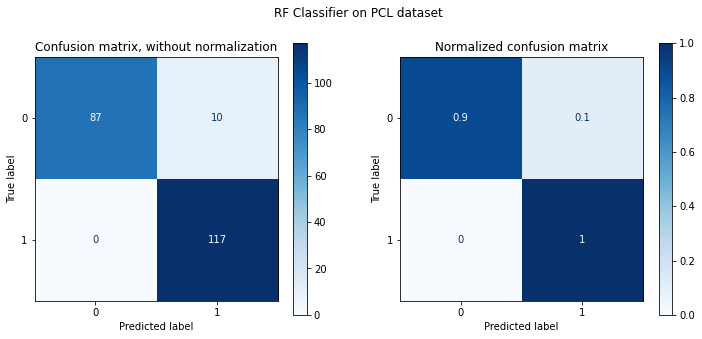

In [197]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'PCL')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier on PCL dataset')
update_summary(RF1, clf_results)

In [198]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

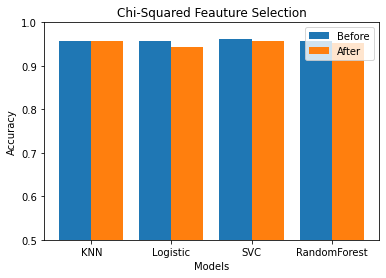

In [199]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Highest variance features: ['NAQ-R_WR_1', 'NAQ-R_PR_2', 'NAQ-R_WR_3', 'NAQ-R_WR_4', 'NAQ-R_PR_5']


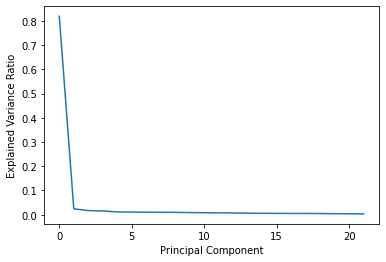

Highest loading features: ['NAQ-R_WR_13', 'NAQ-R_WR_10', 'NAQ-R_PR_2', 'NAQ-R_PI_15', 'NAQ-R_PI_9']


In [200]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [201]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

NAQ-R_WR_1 selected =False rank=18 
NAQ-R_PR_2 selected =False rank=11 
NAQ-R_WR_3 selected =False rank=6 
NAQ-R_WR_4 selected =False rank=16 
NAQ-R_PR_5 selected =False rank=10 
NAQ-R_PR_6 selected =True rank=1 
NAQ-R_PR_7 selected =True rank=1 
NAQ-R_PI_8 selected =False rank=3 
NAQ-R_PI_9 selected =True rank=1 
NAQ-R_WR_10 selected =False rank=12 
NAQ-R_WR_11 selected =False rank=17 
NAQ-R_PR_12 selected =False rank=15 
NAQ-R_WR_13 selected =True rank=1 
NAQ-R_PR_14 selected =False rank=5 
NAQ-R_PI_15 selected =False rank=19 
NAQ-R_WR_16 selected =False rank=2 
NAQ-R_PR_17 selected =False rank=4 
NAQ-R_WR_18 selected =False rank=9 
NAQ-R_WR_19 selected =False rank=7 
NAQ-R_PR_20 selected =False rank=8 
NAQ-R_WR_21 selected =False rank=14 
NAQ-R_PI_22 selected =False rank=13 


In [202]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

NAQ-R_WR_1 selected =False rank=13 
NAQ-R_PR_2 selected =True rank=1 
NAQ-R_WR_3 selected =False rank=3 
NAQ-R_WR_4 selected =False rank=11 
NAQ-R_PR_5 selected =False rank=17 
NAQ-R_PR_6 selected =True rank=1 
NAQ-R_PR_7 selected =False rank=18 
NAQ-R_PI_8 selected =False rank=19 
NAQ-R_PI_9 selected =False rank=14 
NAQ-R_WR_10 selected =True rank=1 
NAQ-R_WR_11 selected =False rank=9 
NAQ-R_PR_12 selected =False rank=6 
NAQ-R_WR_13 selected =True rank=1 
NAQ-R_PR_14 selected =False rank=15 
NAQ-R_PI_15 selected =False rank=10 
NAQ-R_WR_16 selected =False rank=4 
NAQ-R_PR_17 selected =False rank=5 
NAQ-R_WR_18 selected =False rank=2 
NAQ-R_WR_19 selected =False rank=7 
NAQ-R_PR_20 selected =False rank=8 
NAQ-R_WR_21 selected =False rank=12 
NAQ-R_PI_22 selected =False rank=16 


In [203]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

NAQ-R_WR_1 selected =False rank=9 
NAQ-R_PR_2 selected =False rank=10 
NAQ-R_WR_3 selected =False rank=2 
NAQ-R_WR_4 selected =False rank=15 
NAQ-R_PR_5 selected =False rank=7 
NAQ-R_PR_6 selected =True rank=1 
NAQ-R_PR_7 selected =False rank=16 
NAQ-R_PI_8 selected =False rank=18 
NAQ-R_PI_9 selected =False rank=13 
NAQ-R_WR_10 selected =True rank=1 
NAQ-R_WR_11 selected =False rank=19 
NAQ-R_PR_12 selected =False rank=4 
NAQ-R_WR_13 selected =False rank=3 
NAQ-R_PR_14 selected =False rank=14 
NAQ-R_PI_15 selected =False rank=17 
NAQ-R_WR_16 selected =False rank=8 
NAQ-R_PR_17 selected =False rank=11 
NAQ-R_WR_18 selected =False rank=6 
NAQ-R_WR_19 selected =False rank=12 
NAQ-R_PR_20 selected =False rank=5 
NAQ-R_WR_21 selected =True rank=1 
NAQ-R_PI_22 selected =True rank=1 


In [204]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

NAQ-R_WR_1 selected =False rank=14 
NAQ-R_PR_2 selected =True rank=1 
NAQ-R_WR_3 selected =False rank=11 
NAQ-R_WR_4 selected =False rank=18 
NAQ-R_PR_5 selected =False rank=13 
NAQ-R_PR_6 selected =False rank=8 
NAQ-R_PR_7 selected =False rank=7 
NAQ-R_PI_8 selected =False rank=15 
NAQ-R_PI_9 selected =False rank=2 
NAQ-R_WR_10 selected =True rank=1 
NAQ-R_WR_11 selected =False rank=4 
NAQ-R_PR_12 selected =False rank=17 
NAQ-R_WR_13 selected =True rank=1 
NAQ-R_PR_14 selected =False rank=5 
NAQ-R_PI_15 selected =False rank=16 
NAQ-R_WR_16 selected =False rank=10 
NAQ-R_PR_17 selected =True rank=1 
NAQ-R_WR_18 selected =False rank=9 
NAQ-R_WR_19 selected =False rank=19 
NAQ-R_PR_20 selected =False rank=3 
NAQ-R_WR_21 selected =False rank=12 
NAQ-R_PI_22 selected =False rank=6 


In [205]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 98.79518072289156
Test accuracy: 95.7943925233645
[0.01100484 0.05820253 0.01128203 0.00758335 0.01391184 0.02997609
 0.01042869 0.03803468 0.07839783 0.17720157 0.04420271 0.01298629
 0.13620296 0.05145667 0.02040274 0.04539983 0.09644003 0.03254421
 0.01375679 0.06484486 0.0096582  0.03608126]


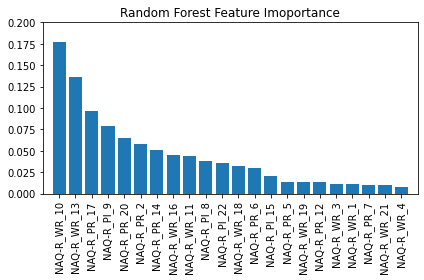

In [206]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [207]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [208]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

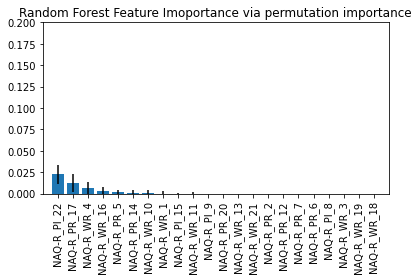

In [209]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [210]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['NAQ-R_PR_7' 'NAQ-R_WR_13']


Selected features with using Random Forest Classifier:
['NAQ-R_PR_2' 'NAQ-R_PR_6' 'NAQ-R_PI_9' 'NAQ-R_WR_10' 'NAQ-R_WR_13'
 'NAQ-R_PR_14' 'NAQ-R_PR_17' 'NAQ-R_PI_22']


Selected features with using Logistic Regression Classifier:
['NAQ-R_WR_3' 'NAQ-R_PR_6' 'NAQ-R_WR_10' 'NAQ-R_PR_12' 'NAQ-R_WR_13'
 'NAQ-R_WR_21' 'NAQ-R_PI_22']


Selected features with using Linear Regression:
['NAQ-R_PR_2' 'NAQ-R_WR_3' 'NAQ-R_PR_6' 'NAQ-R_WR_10' 'NAQ-R_PR_12'
 'NAQ-R_WR_13' 'NAQ-R_WR_19' 'NAQ-R_PR_20']


#PHQ9_GAD7# 

In [211]:
df = pd.read_csv("PHQ9_GAD7_df.csv", delimiter= ';') # Creating the dataframe.
print(df)

      PHQ1  PHQ2  PHQ3  PHQ4  PHQ5  PHQ6  PHQ7  PHQ8  PHQ9  GAD1  GAD2  GAD3  \
0        3     1     1     3     1     1     2     1     2     2     3     2   
1        2     1     3     3     1     1     3     1     5     3     3     3   
2        3     2     2     3     4     3     2     2     2     3     2     3   
3        2     2     4     3     2     4     1     4     4     2     4     4   
4        2     2     5     2     4     3     4     2     4     3     2     5   
...    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
1113     5     5     5     5     4     5     5     5     5     5     5     5   
1114     4     4     5     4     4     4     2     4     5     5     5     5   
1115     5     5     4     5     5     4     4     4     4     5     5     5   
1116     4     4     5     5     4     4     3     4     2     5     4     4   
1117     5     5     5     5     4     5     4     4     5     5     3     5   

      GAD4  GAD5  GAD6  GAD7 CONDITION 

In [212]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [213]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X


,PHQ1,PHQ2,PHQ3,PHQ4,PHQ5,PHQ6,PHQ7,PHQ8,PHQ9,GAD1,GAD2,GAD3,GAD4,GAD5,GAD6,GAD7
0,3,1,1,3,1,1,2,1,2,2,3,2,2,2,3,2
1,2,1,3,3,1,1,3,1,5,3,3,3,2,1,3,5
2,3,2,2,3,4,3,2,2,2,3,2,3,3,3,3,3
3,2,2,4,3,2,4,1,4,4,2,4,4,1,1,1,3
4,2,2,5,2,4,3,4,2,4,3,2,5,3,1,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1113,5,5,5,5,4,5,5,5,5,5,5,5,5,4,5,5
1114,4,4,5,4,4,4,2,4,5,5,5,5,5,4,3,5
1115,5,5,4,5,5,4,4,4,4,5,5,5,5,4,4,5
1116,4,4,5,5,4,4,3,4,2,5,4,4,5,4,4,5


In [214]:
number_of_features = X.shape[1]
number_of_features

16

In [215]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0       1
1       1
2       1
3       1
4       1
       ..
1113    0
1114    0
1115    0
1116    0
1117    0
Name: CONDITION, Length: 1118, dtype: object

In [216]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [217]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [218]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
91,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 16, 'weights': 'distance'}",1.000000,0.988486,0.00745
306,1,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 4, 'weights': 'uniform'}",0.990089,0.988486,0.00745
318,1,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'uniform'}",0.985294,0.988486,0.00745
89,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}",1.000000,0.988486,0.00745
331,1,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 16, 'weights': 'distance'}",1.000000,0.988486,0.00745


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=13)
Test Accuracy : 0.9881
Precision     : 0.9885
Recall        : 0.9880
F1 Score      : 0.9881
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       166
           1       0.98      1.00      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


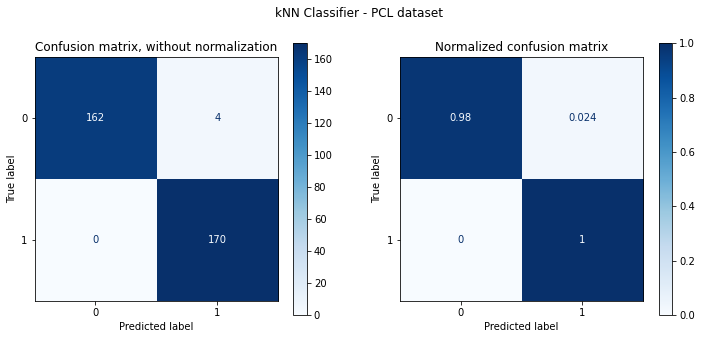

In [219]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'PCL')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier - PCL dataset')
update_summary(knn_sum, clf_results)

In [220]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
6,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.992327,0.988486,0.004801
7,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.992327,0.988486,0.004801
18,3,"{'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}",0.992327,0.987204,0.005743
19,3,"{'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}",0.992327,0.987204,0.005743
42,5,"{'C': 7, 'penalty': 'l2', 'solver': 'newton-cg'}",0.991688,0.985938,0.004775


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.9911
Precision     : 0.9911
Recall        : 0.9910
F1 Score      : 0.9911
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       166
           1       0.99      0.99      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


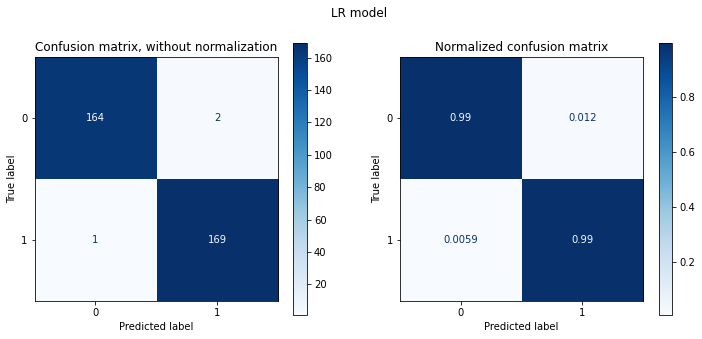

In [221]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [222]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
6,1,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.991369,0.988494,0.004767
3,2,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.988170,0.987204,0.009048
10,2,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.995844,0.987204,0.009048
2,4,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'poly'}",0.987212,0.985930,0.010220
13,5,"{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}",1.000000,0.985914,0.008507


-----------------------------------------------------
Best model    > SVC(C=0.1, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.9970
Precision     : 0.9971
Recall        : 0.9970
F1 Score      : 0.9970
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       166
           1       0.99      1.00      1.00       170

    accuracy                           1.00       336
   macro avg       1.00      1.00      1.00       336
weighted avg       1.00      1.00      1.00       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


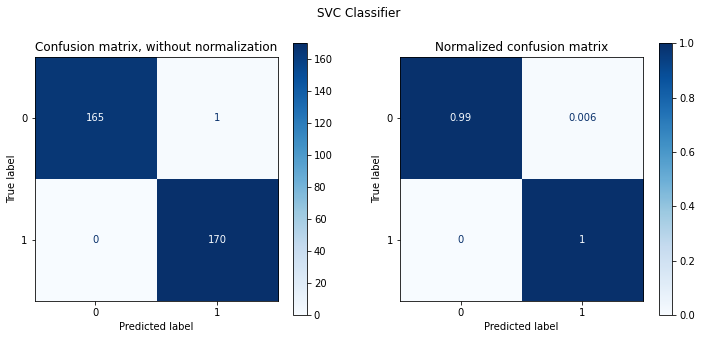

In [223]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [224]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
34,1,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 50}",0.994885,0.988486,0.006251
18,2,"{'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 40}",0.993606,0.987212,0.008057
38,3,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 40}",0.993606,0.987204,0.008089
43,3,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 40}",0.993287,0.987204,0.007000
32,5,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 30}",0.994885,0.987204,0.008089


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9881
Precision     : 0.9882
Recall        : 0.9880
F1 Score      : 0.9881
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       166
           1       0.98      0.99      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


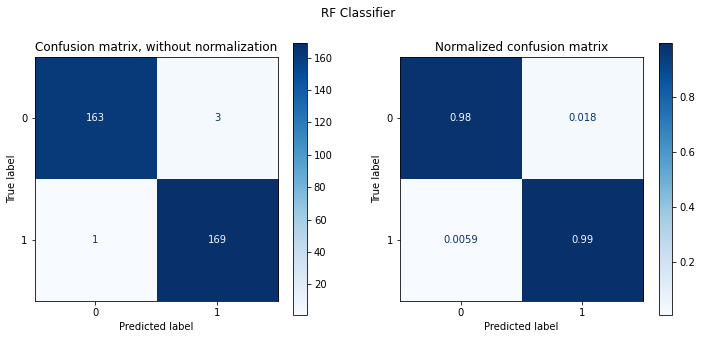

In [225]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [226]:
number = int(number_of_features/5)

Feature 0: 0.396835
Feature 1: 0.504672
Feature 2: 0.327653
Feature 3: 0.296812
Feature 4: 0.313452
Feature 5: 0.442064
Feature 6: 0.465775
Feature 7: 0.502130
Feature 8: 0.145379
Feature 9: 0.402042
Feature 10: 0.322141
Feature 11: 0.227994
Feature 12: 0.369474
Feature 13: 0.255784
Feature 14: 0.280510
Feature 15: 0.395202


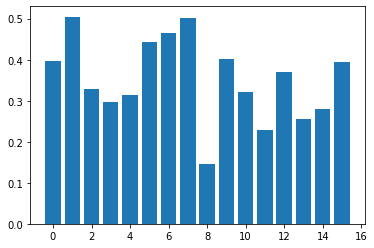

In [227]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=13)
Test Accuracy : 0.9762
Precision     : 0.9770
Recall        : 0.9760
F1 Score      : 0.9762
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.96      0.98       166
           1       0.96      0.99      0.98       170

    accuracy                           0.98       336
   macro avg       0.98      0.98      0.98       336
weighted avg       0.98      0.98      0.98       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


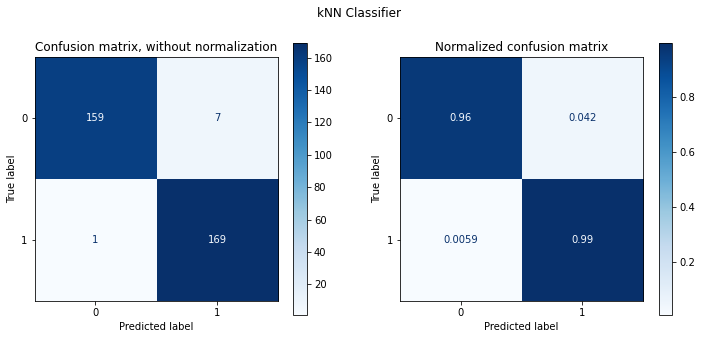

In [228]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.9851
Precision     : 0.9854
Recall        : 0.9850
F1 Score      : 0.9851
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       166
           1       0.98      0.99      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


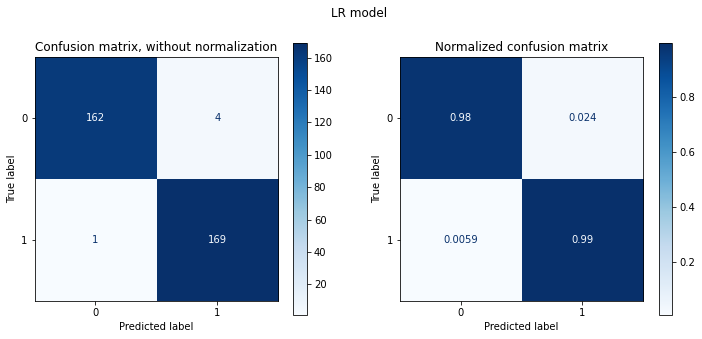

In [229]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.1, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.9851
Precision     : 0.9854
Recall        : 0.9850
F1 Score      : 0.9851
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       166
           1       0.98      0.99      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


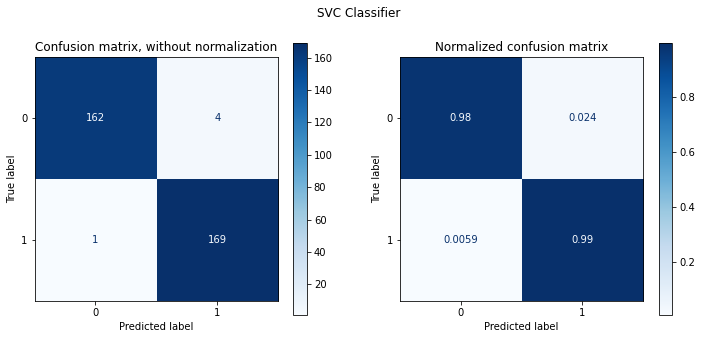

In [230]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9851
Precision     : 0.9854
Recall        : 0.9850
F1 Score      : 0.9851
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       166
           1       0.98      0.99      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


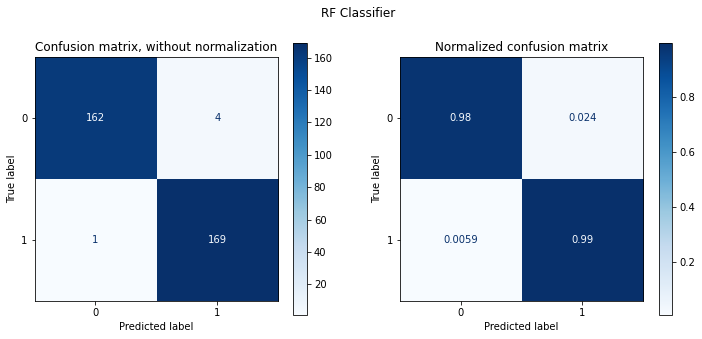

In [231]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [232]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

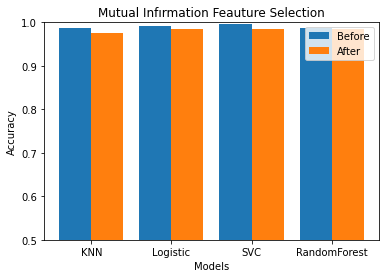

In [233]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Feature 0: 306.084732
Feature 1: 545.388341
Feature 2: 210.319856
Feature 3: 189.848952
Feature 4: 265.449189
Feature 5: 410.682276
Feature 6: 507.867486
Feature 7: 558.393357
Feature 8: 133.608463
Feature 9: 246.171275
Feature 10: 125.011637
Feature 11: 107.818988
Feature 12: 385.846131
Feature 13: 272.077072
Feature 14: 184.659847
Feature 15: 208.042618


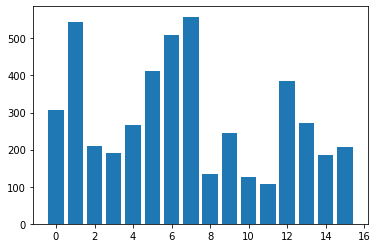

In [234]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=13)
Test Accuracy : 0.9762
Precision     : 0.9770
Recall        : 0.9760
F1 Score      : 0.9762
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.96      0.98       166
           1       0.96      0.99      0.98       170

    accuracy                           0.98       336
   macro avg       0.98      0.98      0.98       336
weighted avg       0.98      0.98      0.98       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


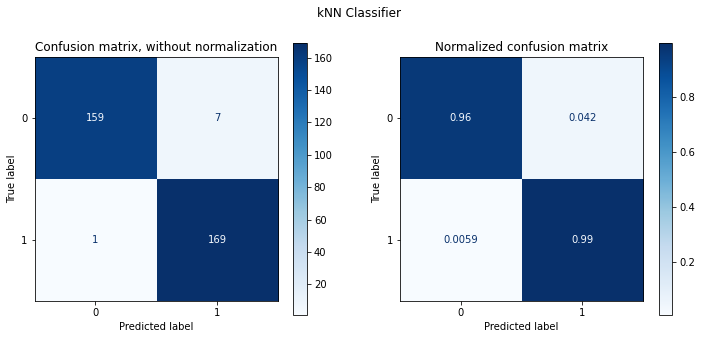

In [235]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.9851
Precision     : 0.9854
Recall        : 0.9850
F1 Score      : 0.9851
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       166
           1       0.98      0.99      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


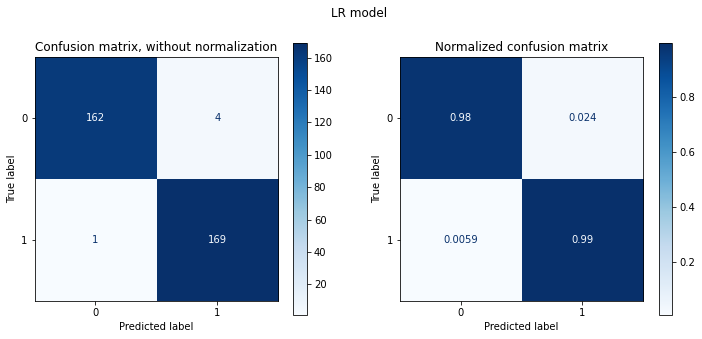

In [236]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.1, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.9851
Precision     : 0.9854
Recall        : 0.9850
F1 Score      : 0.9851
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       166
           1       0.98      0.99      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


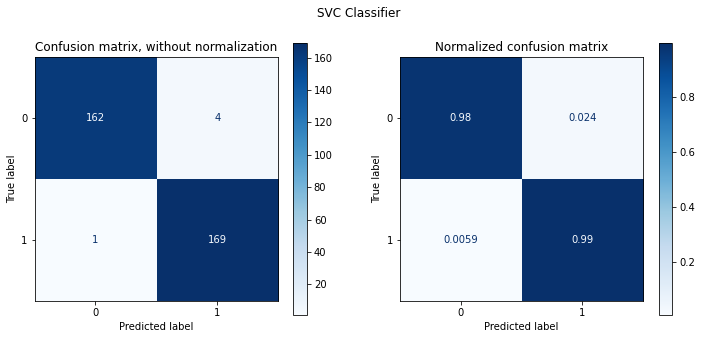

In [237]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9851
Precision     : 0.9854
Recall        : 0.9850
F1 Score      : 0.9851
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       166
           1       0.98      0.99      0.99       170

    accuracy                           0.99       336
   macro avg       0.99      0.99      0.99       336
weighted avg       0.99      0.99      0.99       336



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


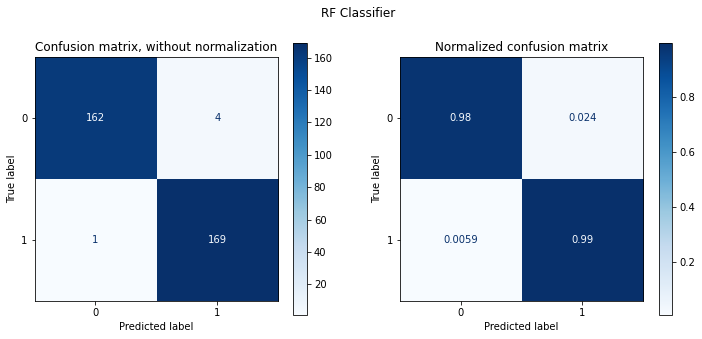

In [238]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [239]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

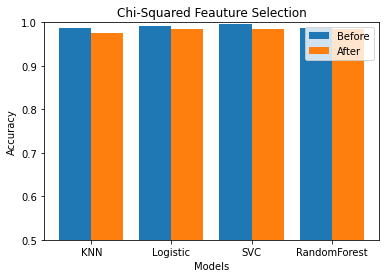

In [240]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Highest variance features: ['PHQ1', 'PHQ2', 'PHQ3', 'PHQ4', 'PHQ5']


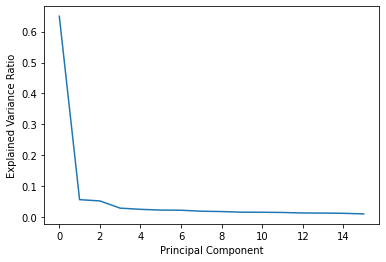

Highest loading features: ['PHQ9', 'GAD3', 'GAD2', 'PHQ4', 'GAD6']


In [241]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [242]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PHQ1 selected =False rank=2 
PHQ2 selected =True rank=1 
PHQ3 selected =False rank=6 
PHQ4 selected =False rank=3 
PHQ5 selected =False rank=11 
PHQ6 selected =False rank=9 
PHQ7 selected =True rank=1 
PHQ8 selected =True rank=1 
PHQ9 selected =False rank=13 
GAD1 selected =False rank=5 
GAD2 selected =False rank=7 
GAD3 selected =False rank=8 
GAD4 selected =False rank=10 
GAD5 selected =False rank=4 
GAD6 selected =False rank=14 
GAD7 selected =False rank=12 


In [243]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PHQ1 selected =False rank=3 
PHQ2 selected =True rank=1 
PHQ3 selected =False rank=11 
PHQ4 selected =False rank=10 
PHQ5 selected =False rank=8 
PHQ6 selected =False rank=2 
PHQ7 selected =True rank=1 
PHQ8 selected =True rank=1 
PHQ9 selected =False rank=12 
GAD1 selected =False rank=9 
GAD2 selected =False rank=14 
GAD3 selected =False rank=5 
GAD4 selected =False rank=4 
GAD5 selected =False rank=6 
GAD6 selected =False rank=7 
GAD7 selected =False rank=13 


In [244]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PHQ1 selected =False rank=2 
PHQ2 selected =True rank=1 
PHQ3 selected =False rank=4 
PHQ4 selected =False rank=14 
PHQ5 selected =False rank=9 
PHQ6 selected =False rank=5 
PHQ7 selected =True rank=1 
PHQ8 selected =True rank=1 
PHQ9 selected =False rank=13 
GAD1 selected =False rank=10 
GAD2 selected =False rank=11 
GAD3 selected =False rank=3 
GAD4 selected =False rank=6 
GAD5 selected =False rank=7 
GAD6 selected =False rank=12 
GAD7 selected =False rank=8 


In [245]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PHQ1 selected =False rank=2 
PHQ2 selected =True rank=1 
PHQ3 selected =False rank=6 
PHQ4 selected =False rank=8 
PHQ5 selected =False rank=9 
PHQ6 selected =False rank=3 
PHQ7 selected =True rank=1 
PHQ8 selected =True rank=1 
PHQ9 selected =False rank=14 
GAD1 selected =False rank=4 
GAD2 selected =False rank=11 
GAD3 selected =False rank=13 
GAD4 selected =False rank=5 
GAD5 selected =False rank=10 
GAD6 selected =False rank=12 
GAD7 selected =False rank=7 


In [246]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 99.10714285714286
[0.09038989 0.21163179 0.01284452 0.00934319 0.01608576 0.14899404
 0.12850993 0.23435872 0.00351192 0.0323299  0.01230725 0.00528047
 0.04062102 0.01034423 0.00605387 0.0373935 ]


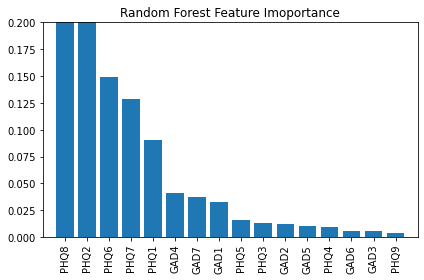

In [247]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [248]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [249]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

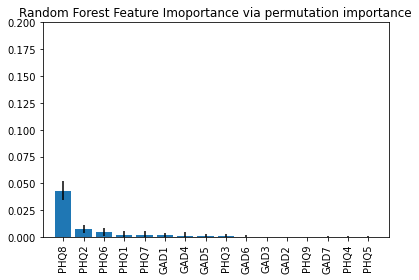

In [250]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [251]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['PHQ2' 'PHQ8']


Selected features with using Random Forest Classifier:
['PHQ1' 'PHQ2' 'PHQ6' 'PHQ7' 'PHQ8' 'GAD1']


Selected features with using Logistic Regression Classifier:
['PHQ1' 'PHQ2' 'PHQ7' 'PHQ8' 'GAD3']


Selected features with using Linear Regression:
['PHQ1' 'PHQ2' 'PHQ6' 'PHQ7' 'PHQ8' 'GAD4']


#PID5# 

In [252]:
df = pd.read_csv("PID5_df.csv", delimiter= ';') # Creating the dataframe.
print(df)

     Q1  Q2  Q3  Q4  Q5  Q6  Q7  Q8  Q9  Q10  ...  Q212  Q213  Q214  Q215  \
0     0   0   2   2   0   0   2   0   0    1  ...     0     0     2     2   
1     0   1   1   2   2   1   1   0   1    0  ...     3     0     1     2   
2     1   0   0   1   1   1   2   1   2    1  ...     2     2     2     2   
3     2   0   1   2   2   2   2   0   2    1  ...     2     2     1     2   
4     2   0   0   0   1   1   1   0   2    1  ...     2     1     0     1   
..   ..  ..  ..  ..  ..  ..  ..  ..  ..  ...  ...   ...   ...   ...   ...   
819   2   0   0   3   3   2   2   1   2    3  ...     1     1     3     2   
820   2   3   2   3   3   1   0   1   3    0  ...     1     3     2     2   
821   3   0   1   0   0   1   3   0   2    3  ...     0     3     0     0   
822   3   3   2   3   3   3   3   3   1    3  ...     1     3     3     3   
823   3   3   3   3   3   3   3   3   3    3  ...     0     3     3     0   

     Q216  Q217  Q218  Q219  Q220  CONDITION  
0       2     0     0     0 

In [253]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [254]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X


,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,...,Q211,Q212,Q213,Q214,Q215,Q216,Q217,Q218,Q219,Q220
0,0,0,2,2,0,0,2,0,0,1,...,2,0,0,2,2,2,0,0,0,2
1,0,1,1,2,2,1,1,0,1,0,...,1,3,0,1,2,1,0,1,0,1
2,1,0,0,1,1,1,2,1,2,1,...,2,2,2,2,2,1,1,2,1,2
3,2,0,1,2,2,2,2,0,2,1,...,2,2,2,1,2,0,0,2,0,1
4,2,0,0,0,1,1,1,0,2,1,...,0,2,1,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
819,2,0,0,3,3,2,2,1,2,3,...,2,1,1,3,2,1,2,1,1,1
820,2,3,2,3,3,1,0,1,3,0,...,2,1,3,2,2,3,3,2,0,0
821,3,0,1,0,0,1,3,0,2,3,...,0,0,3,0,0,3,3,3,3,0
822,3,3,2,3,3,3,3,3,1,3,...,3,1,3,3,3,3,3,3,3,3


In [255]:
number_of_features = X.shape[1]
number_of_features

220

In [256]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
819    0
820    0
821    0
822    0
823    0
Name: CONDITION, Length: 824, dtype: object

In [257]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [258]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [259]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
184,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'uniform'}",0.959634,0.935712,0.016238
306,2,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 4, 'weights': 'uniform'}",0.960497,0.933988,0.014249
304,3,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'uniform'}",0.958765,0.933973,0.018010
190,4,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 6, 'weights': 'uniform'}",0.955296,0.932279,0.010215
310,4,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 6, 'weights': 'uniform'}",0.955296,0.932279,0.010215


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='kd_tree', metric='manhattan', n_neighbors=3)
Test Accuracy : 0.9315
Precision     : 0.9328
Recall        : 0.9299
F1 Score      : 0.9310
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       116
           1       0.92      0.95      0.94       132

    accuracy                           0.93       248
   macro avg       0.93      0.93      0.93       248
weighted avg       0.93      0.93      0.93       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


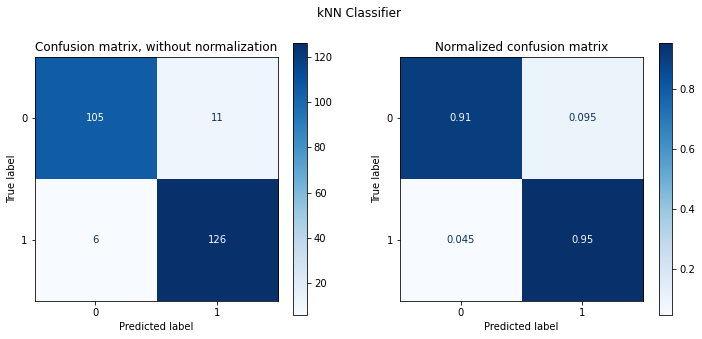

In [260]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [ ]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='sag')
Test Accuracy : 0.9677
Precision     : 0.9673
Recall        : 0.9681
F1 Score      : 0.9676
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.97      0.97       116
           1       0.98      0.96      0.97       132

    accuracy                           0.97       248
   macro avg       0.97      0.97      0.97       248
weighted avg       0.97      0.97      0.97       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


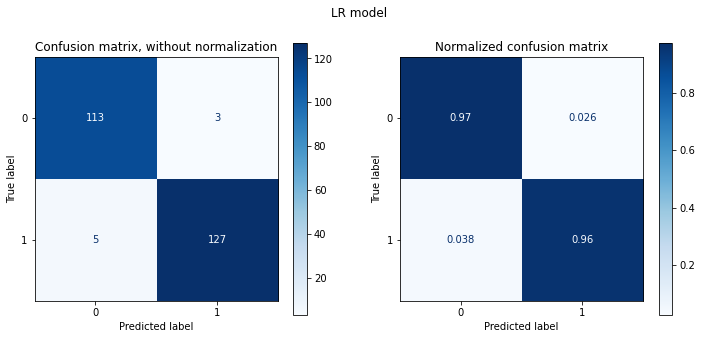

In [262]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [263]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
13,1,"{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}",1.000000,0.961784,0.011842
16,1,"{'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}",1.000000,0.961784,0.011842
10,3,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.979600,0.951349,0.017100
17,4,"{'C': 100, 'gamma': 'auto', 'kernel': 'poly'}",1.000000,0.947901,0.012351
0,5,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'linear'}",0.956596,0.947886,0.009635


-----------------------------------------------------
Best model    > SVC(C=10, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9718
Precision     : 0.9719
Recall        : 0.9714
F1 Score      : 0.9716
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       116
           1       0.97      0.98      0.97       132

    accuracy                           0.97       248
   macro avg       0.97      0.97      0.97       248
weighted avg       0.97      0.97      0.97       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


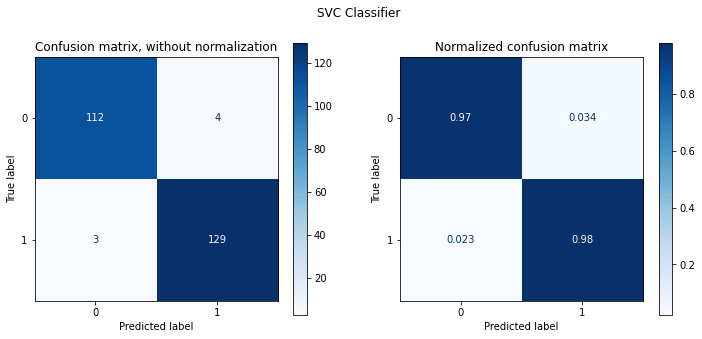

In [264]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [265]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
58,1,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 40}",0.971353,0.947901,0.013520
24,1,"{'max_depth': 5, 'min_samples_split': 9, 'n_estimators': 50}",0.962674,0.947901,0.013520
23,3,"{'max_depth': 5, 'min_samples_split': 9, 'n_estimators': 40}",0.962674,0.946162,0.012842
28,3,"{'max_depth': 5, 'min_samples_split': 13, 'n_estimators': 40}",0.960069,0.946162,0.016908
31,5,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 20}",0.973958,0.946162,0.012842


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=9,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9758
Precision     : 0.9772
Recall        : 0.9747
F1 Score      : 0.9756
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.96      0.97       116
           1       0.96      0.99      0.98       132

    accuracy                           0.98       248
   macro avg       0.98      0.97      0.98       248
weighted avg       0.98      0.98      0.98       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


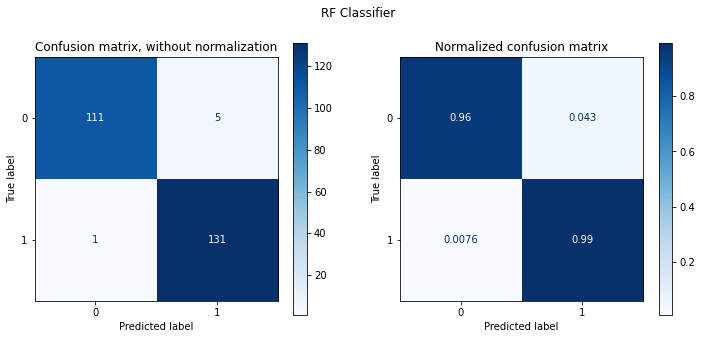

In [266]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [267]:
number = int(number_of_features/5)


Feature 0: 0.227502
Feature 1: 0.397199
Feature 2: 0.119302
Feature 3: 0.197979
Feature 4: 0.175974
Feature 5: 0.103894
Feature 6: 0.167709
Feature 7: 0.100599
Feature 8: 0.108652
Feature 9: 0.165911
Feature 10: 0.272119
Feature 11: 0.093712
Feature 12: 0.168695
Feature 13: 0.103409
Feature 14: 0.031696
Feature 15: 0.253904
Feature 16: 0.256456
Feature 17: 0.143233
Feature 18: 0.277030
Feature 19: 0.056532
Feature 20: 0.160186
Feature 21: 0.255132
Feature 22: 0.183834
Feature 23: 0.250195
Feature 24: 0.233916
Feature 25: 0.247796
Feature 26: 0.096805
Feature 27: 0.155512
Feature 28: 0.108175
Feature 29: 0.071998
Feature 30: 0.188757
Feature 31: 0.065725
Feature 32: 0.130685
Feature 33: 0.119403
Feature 34: 0.046770
Feature 35: 0.290964
Feature 36: 0.313344
Feature 37: 0.171531
Feature 38: 0.193624
Feature 39: 0.163605
Feature 40: 0.216960
Feature 41: 0.255886
Feature 42: 0.193020
Feature 43: 0.271449
Feature 44: 0.164186
Feature 45: 0.128841
Feature 46: 0.070623
Feature 47: 0.247334
Fe

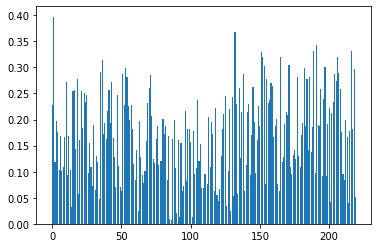

In [268]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='kd_tree', metric='manhattan', n_neighbors=3)
Test Accuracy : 0.9032
Precision     : 0.9028
Recall        : 0.9044
F1 Score      : 0.9031
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.92      0.90       116
           1       0.93      0.89      0.91       132

    accuracy                           0.90       248
   macro avg       0.90      0.90      0.90       248
weighted avg       0.90      0.90      0.90       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


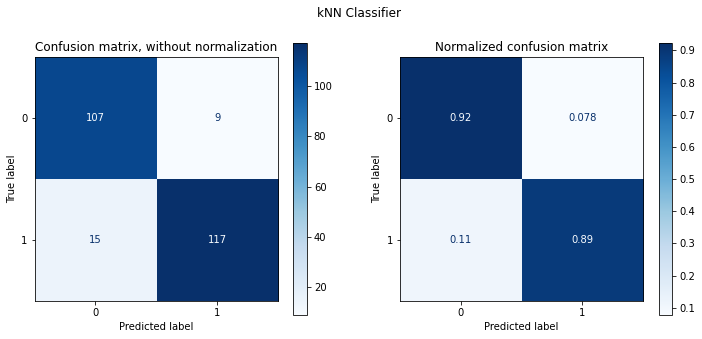

In [269]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predict

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='sag')
Test Accuracy : 0.9315
Precision     : 0.9310
Recall        : 0.9314
F1 Score      : 0.9312
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.93      0.93       116
           1       0.94      0.93      0.94       132

    accuracy                           0.93       248
   macro avg       0.93      0.93      0.93       248
weighted avg       0.93      0.93      0.93       248



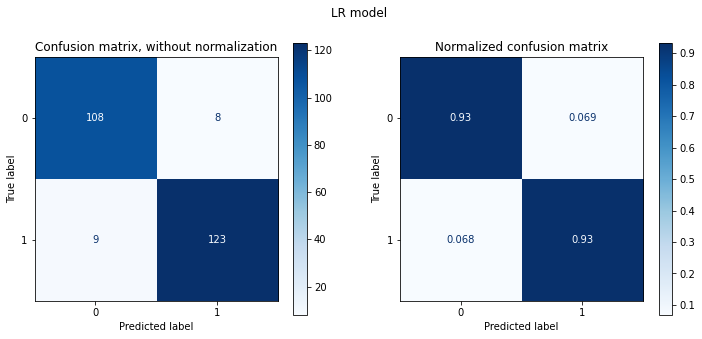

In [270]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=10, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9597
Precision     : 0.9592
Recall        : 0.9600
F1 Score      : 0.9595
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       116
           1       0.97      0.95      0.96       132

    accuracy                           0.96       248
   macro avg       0.96      0.96      0.96       248
weighted avg       0.96      0.96      0.96       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


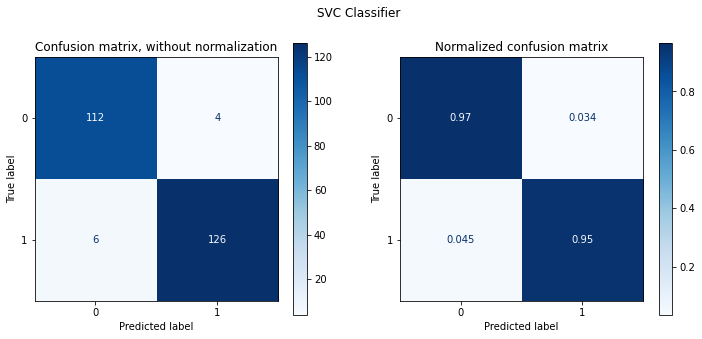

In [271]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=9,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9758
Precision     : 0.9772
Recall        : 0.9747
F1 Score      : 0.9756
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.96      0.97       116
           1       0.96      0.99      0.98       132

    accuracy                           0.98       248
   macro avg       0.98      0.97      0.98       248
weighted avg       0.98      0.98      0.98       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


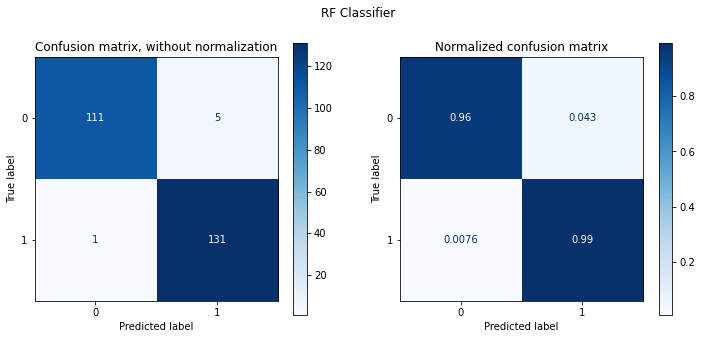

In [272]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [273]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

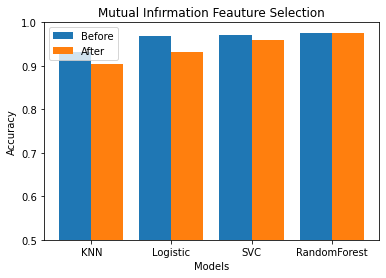

In [274]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Feature 0: 88.054162
Feature 1: 398.785570
Feature 2: 105.698389
Feature 3: 149.446719
Feature 4: 75.455372
Feature 5: 47.048649
Feature 6: 64.608869
Feature 7: 110.115204
Feature 8: 1.558995
Feature 9: 85.574566
Feature 10: 394.750254
Feature 11: 19.892921
Feature 12: 219.702124
Feature 13: 77.225495
Feature 14: 6.681249
Feature 15: 186.902710
Feature 16: 260.050735
Feature 17: 61.076590
Feature 18: 360.024801
Feature 19: 35.559709
Feature 20: 94.536922
Feature 21: 134.722654
Feature 22: 152.321638
Feature 23: 186.588851
Feature 24: 209.187747
Feature 25: 248.773294
Feature 26: 85.014240
Feature 27: 105.361922
Feature 28: 120.497207
Feature 29: 6.844588
Feature 30: 268.628229
Feature 31: 25.631136
Feature 32: 67.963092
Feature 33: 80.219273
Feature 34: 1.806119
Feature 35: 339.320011
Feature 36: 405.666794
Feature 37: 104.977297
Feature 38: 241.777301
Feature 39: 159.074082
Feature 40: 296.399421
Feature 41: 305.090447
Feature 42: 176.331780
Feature 43: 343.270402
Feature 44: 154.8538

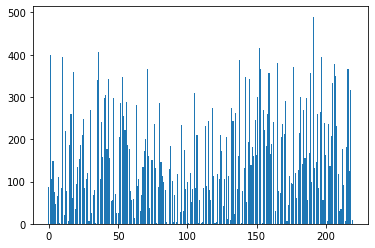

In [275]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='kd_tree', metric='manhattan', n_neighbors=3)
Test Accuracy : 0.9395
Precision     : 0.9421
Recall        : 0.9374
F1 Score      : 0.9390
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.91      0.93       116
           1       0.92      0.97      0.94       132

    accuracy                           0.94       248
   macro avg       0.94      0.94      0.94       248
weighted avg       0.94      0.94      0.94       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


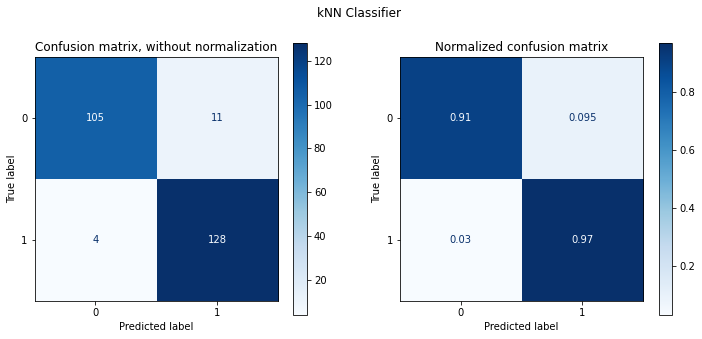

In [276]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='sag')
Test Accuracy : 0.9435
Precision     : 0.9433
Recall        : 0.9433
F1 Score      : 0.9433
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       116
           1       0.95      0.95      0.95       132

    accuracy                           0.94       248
   macro avg       0.94      0.94      0.94       248
weighted avg       0.94      0.94      0.94       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


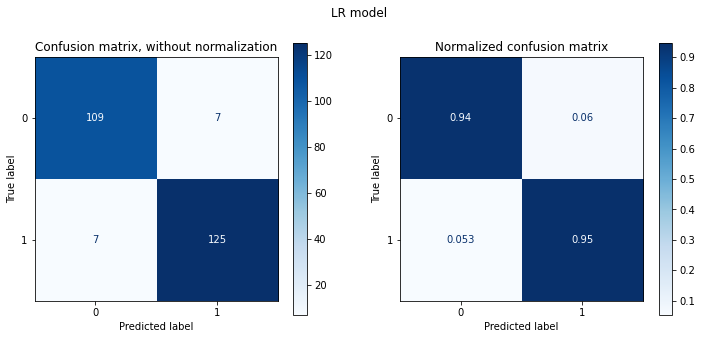

In [277]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=10, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9758
Precision     : 0.9754
Recall        : 0.9762
F1 Score      : 0.9757
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       116
           1       0.98      0.97      0.98       132

    accuracy                           0.98       248
   macro avg       0.98      0.98      0.98       248
weighted avg       0.98      0.98      0.98       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


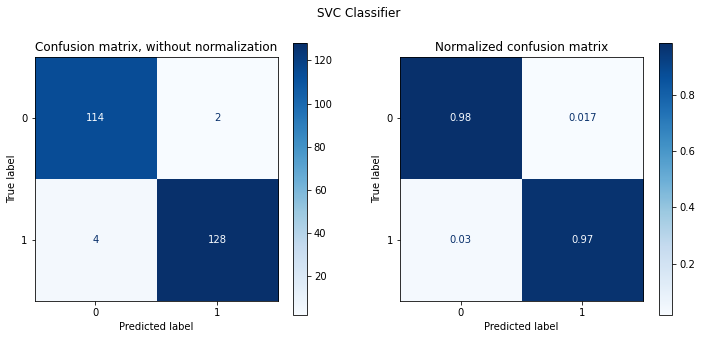

In [278]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=9,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.9758
Precision     : 0.9763
Recall        : 0.9752
F1 Score      : 0.9757
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       116
           1       0.97      0.98      0.98       132

    accuracy                           0.98       248
   macro avg       0.98      0.98      0.98       248
weighted avg       0.98      0.98      0.98       248



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


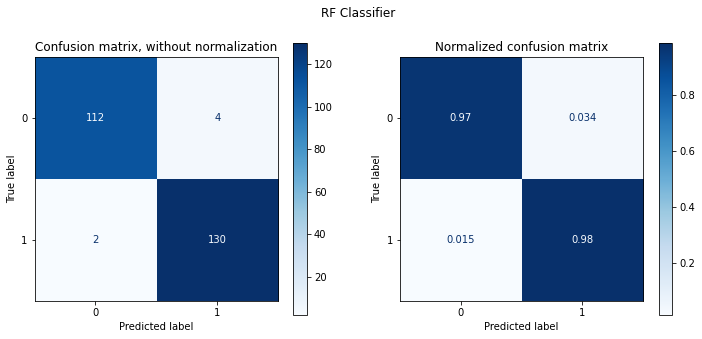

In [279]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [280]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

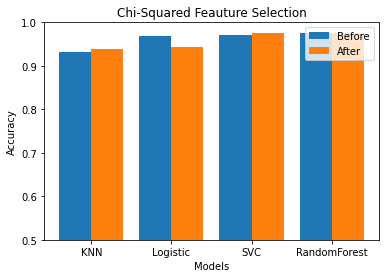

In [281]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Highest variance features: ['Q1', 'Q2', 'Q3', 'Q4', 'Q5']


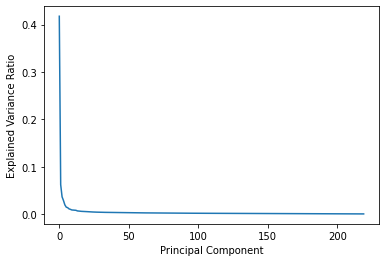

Highest loading features: ['Q192', 'Q217', 'Q139', 'Q153', 'Q37']


In [282]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [283]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Q1 selected =False rank=177 
Q2 selected =True rank=1 
Q3 selected =True rank=1 
Q4 selected =True rank=1 
Q5 selected =True rank=1 
Q6 selected =True rank=1 
Q7 selected =True rank=1 
Q8 selected =True rank=1 
Q9 selected =True rank=1 
Q10 selected =True rank=1 
Q11 selected =True rank=1 
Q12 selected =False rank=10 
Q13 selected =True rank=1 
Q14 selected =False rank=7 
Q15 selected =True rank=1 
Q16 selected =True rank=1 
Q17 selected =True rank=1 
Q18 selected =True rank=1 
Q19 selected =False rank=15 
Q20 selected =False rank=32 
Q21 selected =False rank=34 
Q22 selected =False rank=16 
Q23 selected =False rank=19 
Q24 selected =False rank=27 
Q25 selected =False rank=28 
Q26 selected =True rank=1 
Q27 selected =False rank=38 
Q28 selected =False rank=39 
Q29 selected =False rank=42 
Q30 selected =False rank=23 
Q31 selected =False rank=46 
Q32 selected =False rank=24 
Q33 selected =False rank=49 
Q34 selected =False rank=48 
Q35 selected =False rank=55 
Q36 selected =False rank=6

In [284]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Q1 selected =False rank=121 
Q2 selected =True rank=1 
Q3 selected =False rank=19 
Q4 selected =False rank=144 
Q5 selected =False rank=36 
Q6 selected =False rank=15 
Q7 selected =False rank=54 
Q8 selected =False rank=173 
Q9 selected =False rank=88 
Q10 selected =False rank=159 
Q11 selected =False rank=74 
Q12 selected =True rank=1 
Q13 selected =False rank=164 
Q14 selected =True rank=1 
Q15 selected =False rank=33 
Q16 selected =False rank=81 
Q17 selected =True rank=1 
Q18 selected =False rank=131 
Q19 selected =False rank=130 
Q20 selected =False rank=147 
Q21 selected =True rank=1 
Q22 selected =False rank=82 
Q23 selected =False rank=162 
Q24 selected =False rank=98 
Q25 selected =False rank=140 
Q26 selected =True rank=1 
Q27 selected =False rank=23 
Q28 selected =False rank=70 
Q29 selected =False rank=142 
Q30 selected =False rank=120 
Q31 selected =False rank=20 
Q32 selected =True rank=1 
Q33 selected =True rank=1 
Q34 selected =True rank=1 
Q35 selected =False rank=97 


In [ ]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

In [286]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Q1 selected =True rank=1 
Q2 selected =True rank=1 
Q3 selected =False rank=171 
Q4 selected =False rank=3 
Q5 selected =True rank=1 
Q6 selected =False rank=113 
Q7 selected =False rank=48 
Q8 selected =False rank=74 
Q9 selected =False rank=30 
Q10 selected =False rank=31 
Q11 selected =False rank=8 
Q12 selected =False rank=134 
Q13 selected =False rank=155 
Q14 selected =False rank=163 
Q15 selected =False rank=73 
Q16 selected =False rank=24 
Q17 selected =True rank=1 
Q18 selected =False rank=28 
Q19 selected =True rank=1 
Q20 selected =False rank=148 
Q21 selected =False rank=55 
Q22 selected =True rank=1 
Q23 selected =False rank=135 
Q24 selected =False rank=43 
Q25 selected =False rank=101 
Q26 selected =True rank=1 
Q27 selected =False rank=112 
Q28 selected =False rank=137 
Q29 selected =False rank=169 
Q30 selected =False rank=142 
Q31 selected =False rank=58 
Q32 selected =True rank=1 
Q33 selected =False rank=60 
Q34 selected =False rank=41 
Q35 selected =False rank=120 

In [287]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 97.98387096774194
[0.0071954  0.0703403  0.00139024 0.00553752 0.00329476 0.00066928
 0.00126445 0.00074367 0.00137653 0.00131545 0.00631622 0.00097167
 0.00116383 0.00088401 0.00201265 0.00188052 0.00594115 0.00154897
 0.00980362 0.00093567 0.00113992 0.00520768 0.00128307 0.00252789
 0.00268429 0.00800869 0.00183961 0.00062072 0.00094935 0.00099481
 0.00317332 0.0026865  0.00111459 0.00096172 0.00143688 0.01904198
 0.01870369 0.00135317 0.00102779 0.00053941 0.00480393 0.00888806
 0.00144845 0.00491179 0.00077162 0.00149568 0.00078889 0.00238935
 0.0014511  0.00121581 0.0008903  0.00795091 0.00407057 0.00974748
 0.00592204 0.00102028 0.00877557 0.0031002  0.00184813 0.00134588
 0.00111646 0.00157185 0.00107263 0.00905342 0.00093015 0.00067086
 0.0010634  0.0003252  0.00295354 0.00470223 0.00817962 0.0109971
 0.00180993 0.00110847 0.00099226 0.00148062 0.00214367 0.0020175
 0.00094486 0.00100089 0.00419099 0.00110878 0.00229867 0.00082301
 0.001

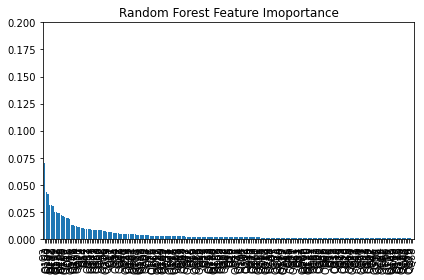

In [288]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [289]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [ ]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


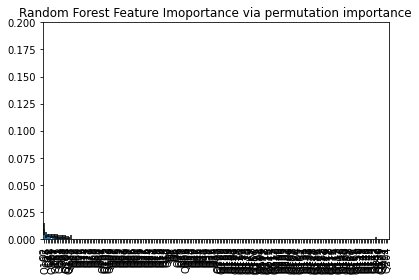

In [291]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [292]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['Q2' 'Q5' 'Q10' 'Q26' 'Q43' 'Q45' 'Q47' 'Q48' 'Q64' 'Q72' 'Q87' 'Q109'
 'Q111' 'Q133' 'Q154' 'Q164' 'Q165' 'Q166' 'Q178' 'Q199' 'Q203' 'Q217'
 'Q219']


Selected features with using Random Forest Classifier:
['Q1' 'Q2' 'Q4' 'Q17' 'Q19' 'Q26' 'Q36' 'Q37' 'Q42' 'Q54' 'Q55' 'Q57'
 'Q64' 'Q72' 'Q106' 'Q116' 'Q133' 'Q136' 'Q138' 'Q139' 'Q143' 'Q146'
 'Q152' 'Q153' 'Q154' 'Q156' 'Q160' 'Q166' 'Q172' 'Q178' 'Q183' 'Q185'
 'Q187' 'Q190' 'Q192' 'Q195' 'Q205' 'Q207' 'Q208' 'Q209' 'Q217']


Selected features with using Logistic Regression Classifier:
['Q2' 'Q3' 'Q5' 'Q6' 'Q7' 'Q9' 'Q11' 'Q15' 'Q17' 'Q20' 'Q21' 'Q26' 'Q27'
 'Q28' 'Q32' 'Q33' 'Q36' 'Q37' 'Q40' 'Q45' 'Q50' 'Q56' 'Q57' 'Q61' 'Q63'
 'Q64' 'Q69' 'Q72' 'Q74' 'Q77' 'Q78' 'Q79' 'Q86' 'Q89' 'Q93' 'Q95' 'Q102'
 'Q105' 'Q107' 'Q108' 'Q109' 'Q110' 'Q111' 'Q115' 'Q116' 'Q120' 'Q121'
 'Q122' 'Q126' 'Q127' 'Q129' 'Q131' 'Q133' 'Q134' 'Q136' 'Q140' 'Q144'
 'Q145' 'Q149' 'Q154' 'Q155' 'Q157' 

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


#shortPID5# 

In [293]:
df = pd.read_csv("sPID-5_df.csv") # Creating the dataframe.
print(df)

      PID1  PID2  PID3  PID4  PID5  PID6  PID7  PID8  PID9  PID10  ...  PID17  \
0        1     4     3     2     1     3     3     4     4      3  ...      1   
1        3     3     4     4     1     1     3     4     4      2  ...      1   
2        3     2     1     2     1     1     2     4     4      3  ...      2   
3        1     1     1     2     1     2     2     3     3      1  ...      1   
4        3     3     2     1     3     2     1     2     2      1  ...      2   
...    ...   ...   ...   ...   ...   ...   ...   ...   ...    ...  ...    ...   
1033     4     4     4     4     4     4     4     4     4      4  ...      4   
1034     2     3     3     3     1     3     4     2     3      3  ...      3   
1035     4     4     4     4     4     4     3     3     3      2  ...      3   
1036     3     4     2     2     2     3     3     4     3      3  ...      2   
1037     3     4     4     3     2     2     2     3     3      4  ...      3   

      PID18  PID19  PID20  

In [294]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [295]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,PID1,PID2,PID3,PID4,PID5,PID6,PID7,PID8,PID9,PID10,...,PID16,PID17,PID18,PID19,PID20,PID21,PID22,PID23,PID24,PID25
0,1,4,3,2,1,3,3,4,4,3,...,1,1,4,4,2,1,2,1,2,1
1,3,3,4,4,1,1,3,4,4,2,...,1,1,1,4,3,2,1,1,1,3
2,3,2,1,2,1,1,2,4,4,3,...,1,2,2,3,3,2,3,1,1,2
3,1,1,1,2,1,2,2,3,3,1,...,2,1,1,1,2,1,1,1,1,1
4,3,3,2,1,3,2,1,2,2,1,...,1,2,2,3,3,1,3,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1033,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,1,4,4,4,4,4
1034,2,3,3,3,1,3,4,2,3,3,...,3,3,3,2,2,4,2,3,4,1
1035,4,4,4,4,4,4,3,3,3,2,...,4,3,3,2,4,4,4,4,4,4
1036,3,4,2,2,2,3,3,4,3,3,...,3,2,2,3,2,3,2,4,4,2


In [296]:
number_of_features = X.shape[1]
number_of_features

25

In [297]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0       1
1       1
2       1
3       1
4       1
       ..
1033    0
1034    0
1035    0
1036    0
1037    0
Name: CONDITION, Length: 1038, dtype: object

In [298]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [299]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [300]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
346,1,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 24, 'weights': 'uniform'}",0.960745,0.965574,0.009714
134,2,"{'algorithm': 'kd_tree', 'metric': 'euclidean', 'n_neighbors': 8, 'weights': 'uniform'}",0.962811,0.964204,0.013312
194,3,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 8, 'weights': 'uniform'}",0.963499,0.964195,0.011839
318,3,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'uniform'}",0.964876,0.964195,0.011839
314,3,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 8, 'weights': 'uniform'}",0.964876,0.964195,0.011839


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='manhattan', n_neighbors=24)
Test Accuracy : 0.9615
Precision     : 0.9636
Recall        : 0.9613
F1 Score      : 0.9615
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.93      0.96       155
           1       0.93      0.99      0.96       157

    accuracy                           0.96       312
   macro avg       0.96      0.96      0.96       312
weighted avg       0.96      0.96      0.96       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


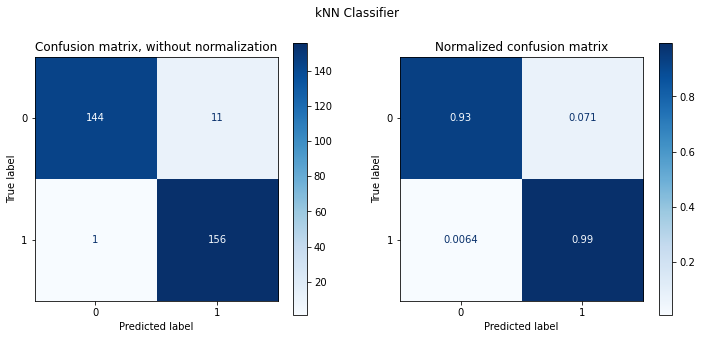

In [301]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier ')
update_summary(knn_sum, clf_results)

In [302]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
8,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'sag'}",0.964877,0.957289,0.017140
20,2,"{'C': 1, 'penalty': 'l2', 'solver': 'sag'}",0.963500,0.954539,0.016100
44,2,"{'C': 7, 'penalty': 'l2', 'solver': 'sag'}",0.963155,0.954539,0.016100
6,2,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.969698,0.954539,0.020747
7,2,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.969698,0.954539,0.020747


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='sag')
Test Accuracy : 0.9647
Precision     : 0.9650
Recall        : 0.9647
F1 Score      : 0.9647
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       155
           1       0.96      0.97      0.97       157

    accuracy                           0.96       312
   macro avg       0.96      0.96      0.96       312
weighted avg       0.96      0.96      0.96       312



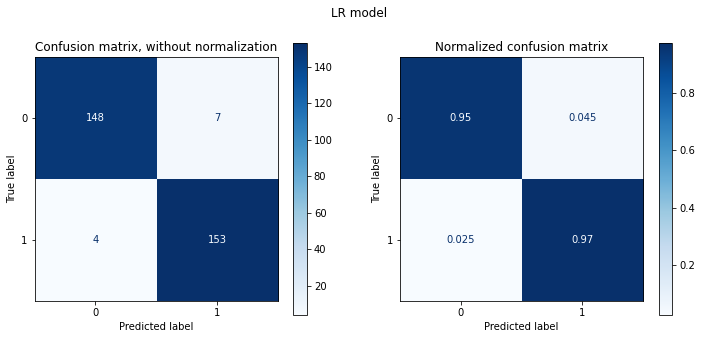

In [303]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [304]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
10,1,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.981751,0.969731,0.015362
7,2,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}",0.970043,0.968351,0.014076
4,3,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'rbf'}",0.967633,0.966972,0.013248
5,4,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'poly'}",0.972796,0.965574,0.009714
8,5,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'poly'}",0.983128,0.964195,0.017099


-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9679
Precision     : 0.9693
Recall        : 0.9678
F1 Score      : 0.9679
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.94      0.97       155
           1       0.95      0.99      0.97       157

    accuracy                           0.97       312
   macro avg       0.97      0.97      0.97       312
weighted avg       0.97      0.97      0.97       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


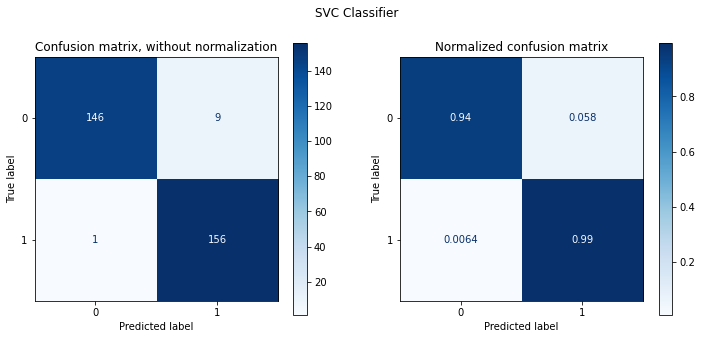

In [305]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier ')
update_summary(SCV1, clf_results)

In [306]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
32,1,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 30}",0.983472,0.966972,0.021021
29,2,"{'max_depth': 5, 'min_samples_split': 13, 'n_estimators': 50}",0.976587,0.965593,0.019910
17,3,"{'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 30}",0.978653,0.965583,0.017934
41,4,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 20}",0.977618,0.964223,0.021882
31,4,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 20}",0.983471,0.964223,0.021443


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=30, random_state=123)
Test Accuracy : 0.9615
Precision     : 0.9636
Recall        : 0.9613
F1 Score      : 0.9615
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.93      0.96       155
           1       0.93      0.99      0.96       157

    accuracy                           0.96       312
   macro avg       0.96      0.96      0.96       312
weighted avg       0.96      0.96      0.96       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


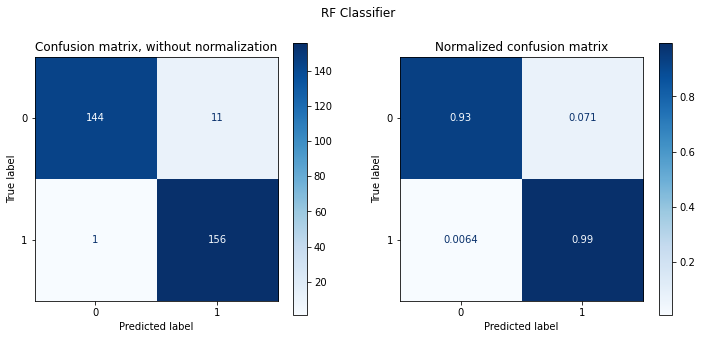

In [307]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [308]:
number = int(number_of_features/5)

Feature 0: 0.246159
Feature 1: 0.369165
Feature 2: 0.361623
Feature 3: 0.169100
Feature 4: 0.347143
Feature 5: 0.154193
Feature 6: 0.348717
Feature 7: 0.074643
Feature 8: 0.108571
Feature 9: 0.188743
Feature 10: 0.242846
Feature 11: 0.437520
Feature 12: 0.141114
Feature 13: 0.223837
Feature 14: 0.364676
Feature 15: 0.160746
Feature 16: 0.355988
Feature 17: 0.131706
Feature 18: 0.178851
Feature 19: 0.253528
Feature 20: 0.450073
Feature 21: 0.267500
Feature 22: 0.400013
Feature 23: 0.468612
Feature 24: 0.285868


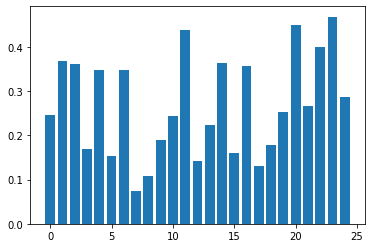

In [309]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='manhattan', n_neighbors=24)
Test Accuracy : 0.9391
Precision     : 0.9434
Recall        : 0.9388
F1 Score      : 0.9389
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.89      0.94       155
           1       0.90      0.99      0.94       157

    accuracy                           0.94       312
   macro avg       0.94      0.94      0.94       312
weighted avg       0.94      0.94      0.94       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


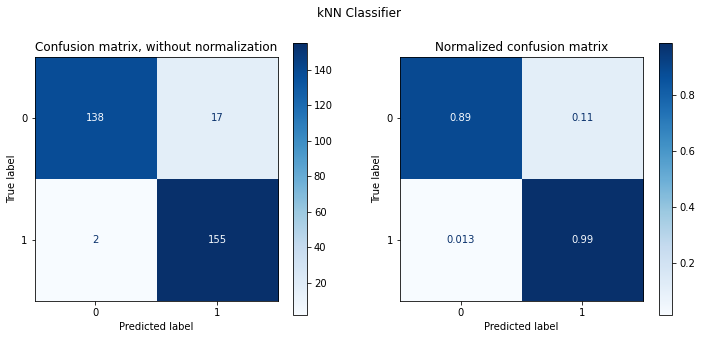

In [310]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='sag')
Test Accuracy : 0.9327
Precision     : 0.9332
Recall        : 0.9326
F1 Score      : 0.9327
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.92      0.93       155
           1       0.92      0.95      0.93       157

    accuracy                           0.93       312
   macro avg       0.93      0.93      0.93       312
weighted avg       0.93      0.93      0.93       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


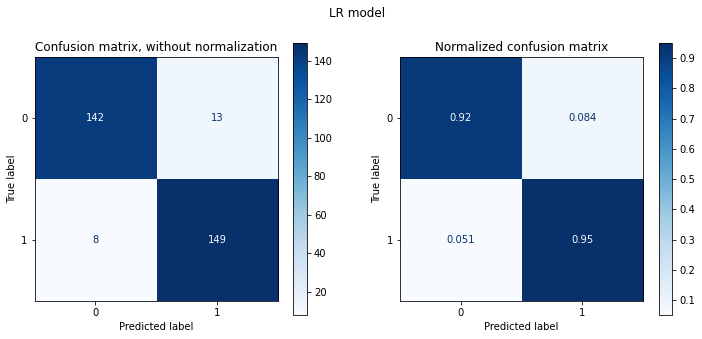

In [311]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model ')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9391
Precision     : 0.9424
Recall        : 0.9388
F1 Score      : 0.9390
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.90      0.94       155
           1       0.91      0.98      0.94       157

    accuracy                           0.94       312
   macro avg       0.94      0.94      0.94       312
weighted avg       0.94      0.94      0.94       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


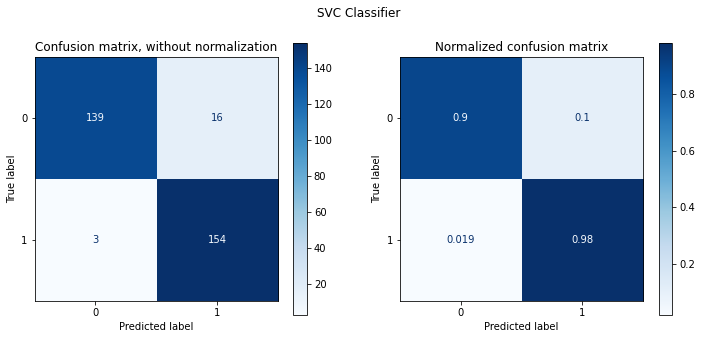

In [312]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=30, random_state=123)
Test Accuracy : 0.9327
Precision     : 0.9350
Recall        : 0.9325
F1 Score      : 0.9326
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       155
           1       0.90      0.97      0.94       157

    accuracy                           0.93       312
   macro avg       0.94      0.93      0.93       312
weighted avg       0.93      0.93      0.93       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


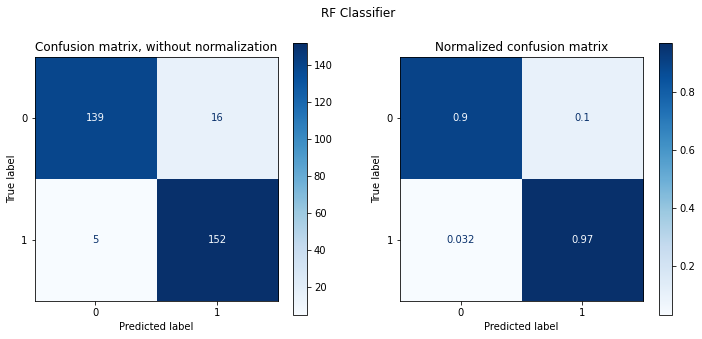

In [313]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [314]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

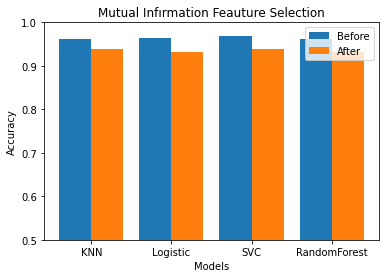

In [315]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Feature 0: 185.152730
Feature 1: 208.734372
Feature 2: 271.095831
Feature 3: 69.370127
Feature 4: 307.061612
Feature 5: 102.782310
Feature 6: 205.000813
Feature 7: 8.715647
Feature 8: 24.579695
Feature 9: 83.185617
Feature 10: 112.527638
Feature 11: 360.225506
Feature 12: 92.745759
Feature 13: 181.077989
Feature 14: 212.685759
Feature 15: 82.469803
Feature 16: 302.703046
Feature 17: 108.468350
Feature 18: 90.345770
Feature 19: 190.036612
Feature 20: 325.802307
Feature 21: 237.486121
Feature 22: 325.035688
Feature 23: 391.628737
Feature 24: 255.225861


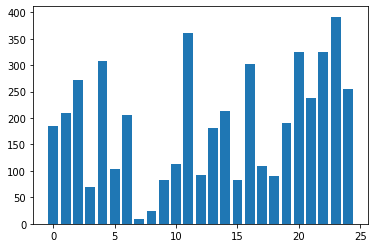

In [316]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='manhattan', n_neighbors=24)
Test Accuracy : 0.9423
Precision     : 0.9443
Recall        : 0.9421
F1 Score      : 0.9422
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.91      0.94       155
           1       0.92      0.97      0.94       157

    accuracy                           0.94       312
   macro avg       0.94      0.94      0.94       312
weighted avg       0.94      0.94      0.94       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


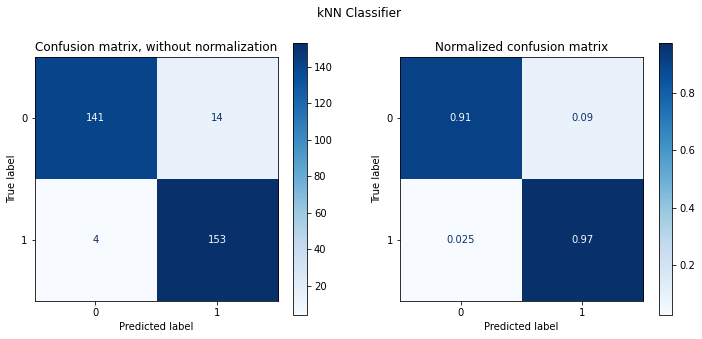

In [317]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='sag')
Test Accuracy : 0.9423
Precision     : 0.9431
Recall        : 0.9422
F1 Score      : 0.9423
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       155
           1       0.93      0.96      0.94       157

    accuracy                           0.94       312
   macro avg       0.94      0.94      0.94       312
weighted avg       0.94      0.94      0.94       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


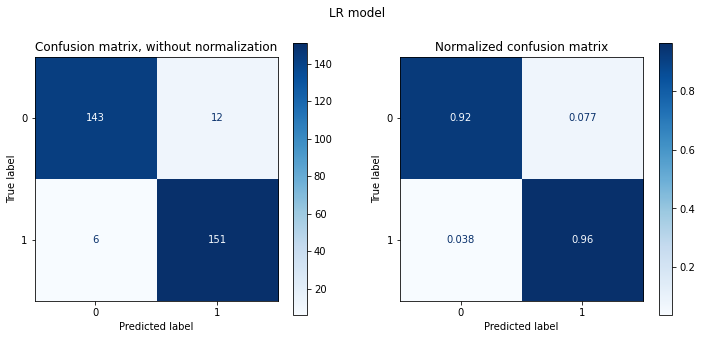

In [318]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model ')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.9391
Precision     : 0.9415
Recall        : 0.9389
F1 Score      : 0.9390
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.90      0.94       155
           1       0.91      0.97      0.94       157

    accuracy                           0.94       312
   macro avg       0.94      0.94      0.94       312
weighted avg       0.94      0.94      0.94       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


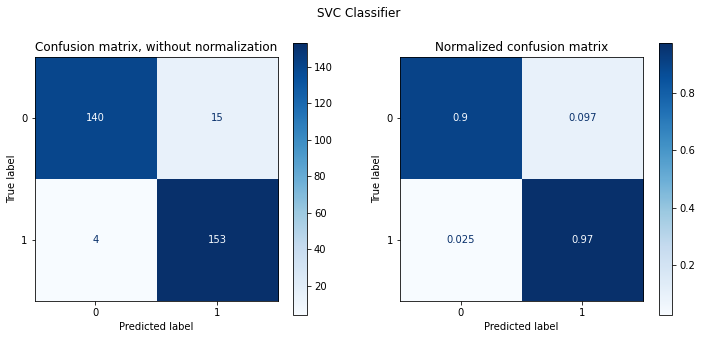

In [319]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=30, random_state=123)
Test Accuracy : 0.9359
Precision     : 0.9387
Recall        : 0.9356
F1 Score      : 0.9358
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       155
           1       0.91      0.97      0.94       157

    accuracy                           0.94       312
   macro avg       0.94      0.94      0.94       312
weighted avg       0.94      0.94      0.94       312



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


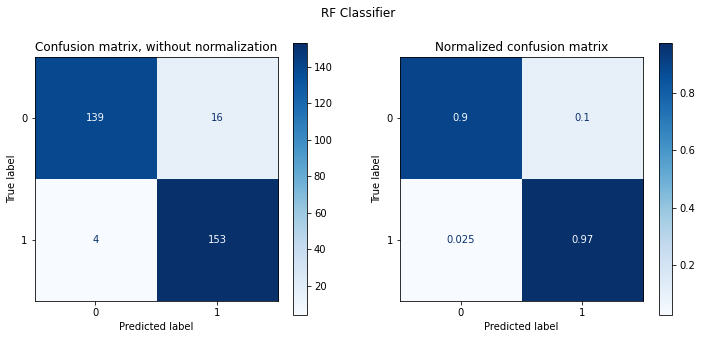

In [320]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [321]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

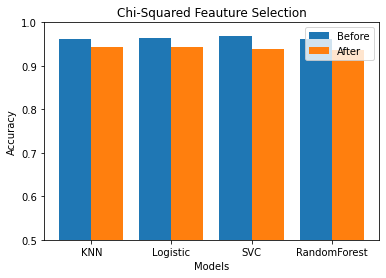

In [322]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Highest variance features: ['PID1', 'PID2', 'PID3', 'PID4', 'PID5']


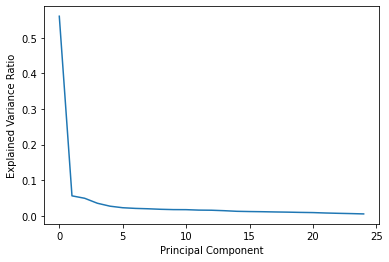

Highest loading features: ['PID24', 'PID21', 'PID12', 'PID23', 'PID5']


In [323]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [324]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PID1 selected =False rank=21 
PID2 selected =False rank=14 
PID3 selected =False rank=8 
PID4 selected =False rank=3 
PID5 selected =False rank=6 
PID6 selected =False rank=19 
PID7 selected =False rank=16 
PID8 selected =False rank=18 
PID9 selected =False rank=11 
PID10 selected =False rank=17 
PID11 selected =False rank=9 
PID12 selected =False rank=10 
PID13 selected =False rank=4 
PID14 selected =True rank=1 
PID15 selected =True rank=1 
PID16 selected =False rank=12 
PID17 selected =True rank=1 
PID18 selected =False rank=7 
PID19 selected =False rank=15 
PID20 selected =False rank=5 
PID21 selected =True rank=1 
PID22 selected =False rank=20 
PID23 selected =False rank=2 
PID24 selected =True rank=1 
PID25 selected =False rank=13 


In [325]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PID1 selected =False rank=14 
PID2 selected =False rank=18 
PID3 selected =False rank=2 
PID4 selected =False rank=11 
PID5 selected =True rank=1 
PID6 selected =False rank=19 
PID7 selected =False rank=4 
PID8 selected =False rank=21 
PID9 selected =False rank=17 
PID10 selected =False rank=7 
PID11 selected =False rank=12 
PID12 selected =True rank=1 
PID13 selected =False rank=16 
PID14 selected =False rank=9 
PID15 selected =False rank=3 
PID16 selected =False rank=10 
PID17 selected =True rank=1 
PID18 selected =False rank=20 
PID19 selected =False rank=6 
PID20 selected =False rank=5 
PID21 selected =True rank=1 
PID22 selected =False rank=15 
PID23 selected =False rank=13 
PID24 selected =True rank=1 
PID25 selected =False rank=8 


In [326]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PID1 selected =False rank=20 
PID2 selected =False rank=21 
PID3 selected =False rank=9 
PID4 selected =False rank=13 
PID5 selected =True rank=1 
PID6 selected =False rank=17 
PID7 selected =False rank=7 
PID8 selected =False rank=19 
PID9 selected =False rank=14 
PID10 selected =False rank=6 
PID11 selected =False rank=15 
PID12 selected =True rank=1 
PID13 selected =False rank=5 
PID14 selected =False rank=8 
PID15 selected =False rank=3 
PID16 selected =False rank=18 
PID17 selected =True rank=1 
PID18 selected =False rank=12 
PID19 selected =False rank=10 
PID20 selected =False rank=4 
PID21 selected =True rank=1 
PID22 selected =False rank=16 
PID23 selected =False rank=11 
PID24 selected =True rank=1 
PID25 selected =False rank=2 


In [327]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PID1 selected =False rank=18 
PID2 selected =False rank=5 
PID3 selected =False rank=2 
PID4 selected =False rank=12 
PID5 selected =True rank=1 
PID6 selected =False rank=15 
PID7 selected =False rank=9 
PID8 selected =False rank=19 
PID9 selected =False rank=21 
PID10 selected =False rank=7 
PID11 selected =False rank=14 
PID12 selected =True rank=1 
PID13 selected =False rank=11 
PID14 selected =False rank=8 
PID15 selected =False rank=4 
PID16 selected =False rank=20 
PID17 selected =True rank=1 
PID18 selected =False rank=16 
PID19 selected =False rank=17 
PID20 selected =False rank=10 
PID21 selected =True rank=1 
PID22 selected =False rank=13 
PID23 selected =False rank=3 
PID24 selected =True rank=1 
PID25 selected =False rank=6 


In [328]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 96.15384615384616
[0.00893647 0.03605766 0.07390942 0.01088326 0.04327017 0.00688413
 0.03813701 0.00746141 0.00587925 0.01525655 0.00795848 0.13623791
 0.01199984 0.01107827 0.06064056 0.00570741 0.05777254 0.00676279
 0.00672807 0.01442923 0.12755878 0.01972088 0.09574934 0.16642716
 0.02455341]


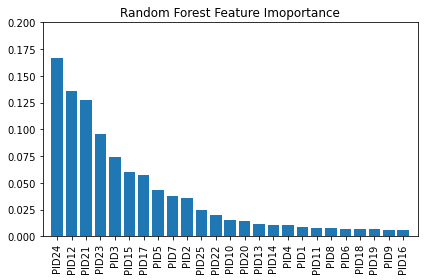

In [329]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [330]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [331]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

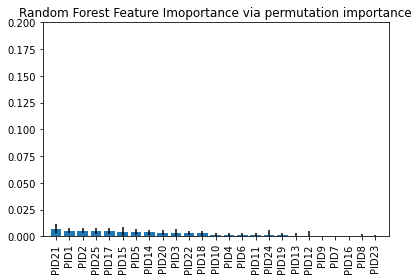

In [332]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [333]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['PID15' 'PID17' 'PID24']


Selected features with using Random Forest Classifier:
['PID2' 'PID5' 'PID12' 'PID15' 'PID17' 'PID21' 'PID23' 'PID24']


Selected features with using Logistic Regression Classifier:
['PID3' 'PID5' 'PID7' 'PID12' 'PID13' 'PID14' 'PID15' 'PID17' 'PID19'
 'PID20' 'PID21' 'PID24' 'PID25']


Selected features with using Linear Regression:
['PID3' 'PID5' 'PID10' 'PID12' 'PID15' 'PID17' 'PID20' 'PID21' 'PID24']


#PRFQ# 

In [334]:
df = pd.read_csv("PRFQ_df.csv") # Creating the dataframe.
print(df)

     PreM1  PreM2  PreM3  PreM4  PreM5  PreM6  C1  C2  C3  C4  C5  C6  IC1  \
0        2      1      4      1      2      1   4   3   4   3   4   4    3   
1        1      1      5      1      1      1   1   1   1   1   5   1    5   
2        1      1      1      1      1      1   3   3   3   3   5   3    5   
3        4      2      5      1      1      1   4   1   1   3   3   1    3   
4        1      1      3      1      1      1   3   3   2   5   5   3    4   
..     ...    ...    ...    ...    ...    ...  ..  ..  ..  ..  ..  ..  ...   
673      1      1      1      5      1      1   5   5   1   5   1   5    5   
674      4      1      1      1      1      2   4   5   5   2   5   5    4   
675      1      1      1      1      1      1   5   5   5   4   5   5    5   
676      1      1      3      1      1      1   1   1   1   1   3   1    5   
677      1      1      1      1      1      1   4   5   4   5   5   4    5   

     IC2  IC3  IC4  IC5  IC6 CONDITION  
0      2    2    2    

In [335]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [336]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,PreM1,PreM2,PreM3,PreM4,PreM5,PreM6,C1,C2,C3,C4,C5,C6,IC1,IC2,IC3,IC4,IC5,IC6
0,2,1,4,1,2,1,4,3,4,3,4,4,3,2,2,2,3,4
1,1,1,5,1,1,1,1,1,1,1,5,1,5,5,5,3,5,5
2,1,1,1,1,1,1,3,3,3,3,5,3,5,4,5,5,5,5
3,4,2,5,1,1,1,4,1,1,3,3,1,3,3,4,1,3,1
4,1,1,3,1,1,1,3,3,2,5,5,3,4,3,3,3,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,1,1,1,5,1,1,5,5,1,5,1,5,5,5,1,5,5,5
674,4,1,1,1,1,2,4,5,5,2,5,5,4,3,4,4,5,5
675,1,1,1,1,1,1,5,5,5,4,5,5,5,4,5,5,5,5
676,1,1,3,1,1,1,1,1,1,1,3,1,5,3,5,5,5,3


In [337]:
number_of_features = X.shape[1]
number_of_features

18

In [338]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
673    0
674    0
675    0
676    0
677    0
Name: CONDITION, Length: 678, dtype: object

In [339]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [340]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [341]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
228,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'uniform'}",0.921412,0.924076,0.012140
108,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'uniform'}",0.920885,0.924076,0.012140
229,3,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.000000,0.921948,0.014236
233,3,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 27, 'weights': 'distance'}",1.000000,0.921948,0.008348
113,3,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 27, 'weights': 'distance'}",1.000000,0.921948,0.008348


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25)
Test Accuracy : 0.8627
Precision     : 0.8601
Recall        : 0.8643
F1 Score      : 0.8614
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.82      0.88      0.85        89
           1       0.90      0.85      0.88       115

    accuracy                           0.86       204
   macro avg       0.86      0.86      0.86       204
weighted avg       0.87      0.86      0.86       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


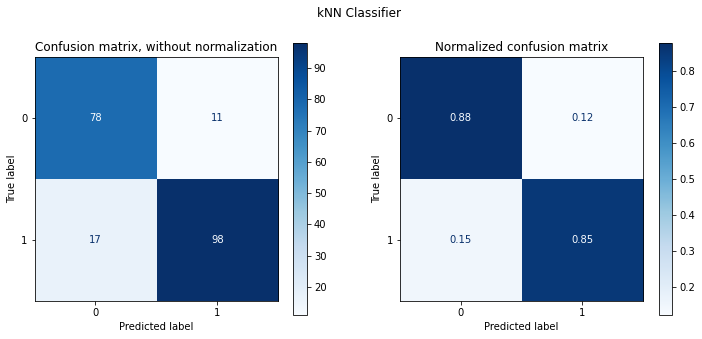

In [342]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [343]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
6,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.936707,0.919798,0.022809
7,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.936707,0.919798,0.022809
0,3,"{'C': 0.5, 'penalty': 'none', 'solver': 'newton-cg'}",0.934070,0.917716,0.027786
54,3,"{'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}",0.935126,0.917716,0.027786
31,3,"{'C': 5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.935126,0.917716,0.027786


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.8775
Precision     : 0.8751
Recall        : 0.8761
F1 Score      : 0.8756
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.87      0.86        89
           1       0.89      0.89      0.89       115

    accuracy                           0.88       204
   macro avg       0.88      0.88      0.88       204
weighted avg       0.88      0.88      0.88       204



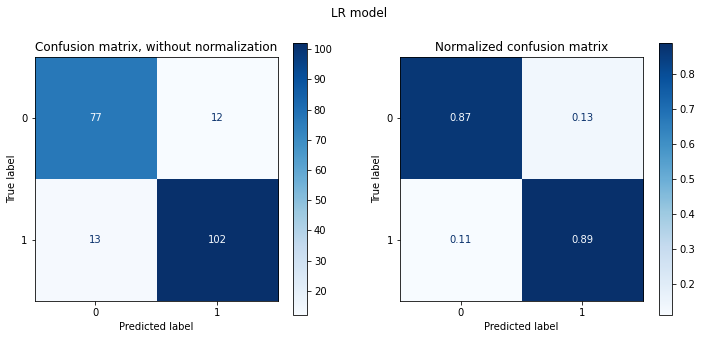

In [344]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [345]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
3,1,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.925633,0.921971,0.019424
5,2,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'poly'}",0.947784,0.919843,0.018302
6,2,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.934070,0.919843,0.017048
2,4,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'poly'}",0.926689,0.915610,0.031228
10,4,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.956750,0.915610,0.021056


-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.8873
Precision     : 0.8858
Recall        : 0.8848
F1 Score      : 0.8852
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.88      0.87      0.87        89
           1       0.90      0.90      0.90       115

    accuracy                           0.89       204
   macro avg       0.89      0.88      0.89       204
weighted avg       0.89      0.89      0.89       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


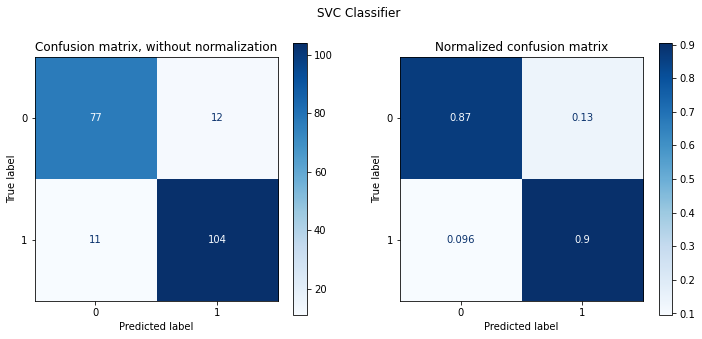

In [346]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [347]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
54,1,"{'max_depth': 9, 'min_samples_split': 9, 'n_estimators': 50}",0.950950,0.915655,0.023887
43,1,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 40}",0.940403,0.915655,0.023887
39,1,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 50}",0.949364,0.915655,0.018681
38,4,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 40}",0.947784,0.913527,0.016727
26,5,"{'max_depth': 5, 'min_samples_split': 13, 'n_estimators': 20}",0.936180,0.913505,0.013942


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=9,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.8922
Precision     : 0.8898
Recall        : 0.8916
F1 Score      : 0.8906
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.89      0.88        89
           1       0.91      0.90      0.90       115

    accuracy                           0.89       204
   macro avg       0.89      0.89      0.89       204
weighted avg       0.89      0.89      0.89       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


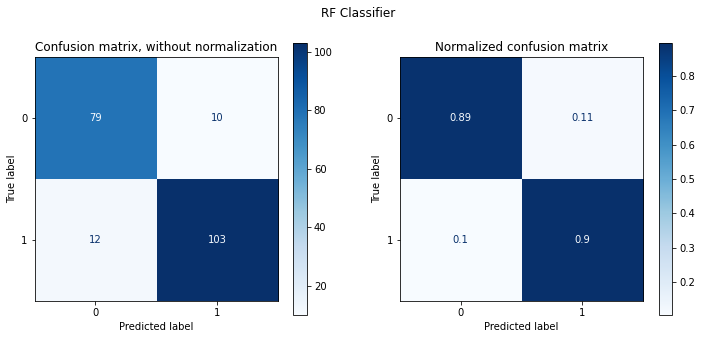

In [348]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [349]:
number = int(number_of_features/5)

Feature 0: 0.043552
Feature 1: 0.009082
Feature 2: 0.149069
Feature 3: 0.011469
Feature 4: 0.017884
Feature 5: 0.099026
Feature 6: 0.293505
Feature 7: 0.335508
Feature 8: 0.332765
Feature 9: 0.166849
Feature 10: 0.199352
Feature 11: 0.338381
Feature 12: 0.073031
Feature 13: 0.129604
Feature 14: 0.063102
Feature 15: 0.198756
Feature 16: 0.098670
Feature 17: 0.065293


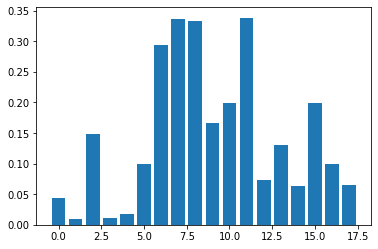

In [350]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25)
Test Accuracy : 0.8725
Precision     : 0.8704
Recall        : 0.8704
F1 Score      : 0.8704
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.85      0.85        89
           1       0.89      0.89      0.89       115

    accuracy                           0.87       204
   macro avg       0.87      0.87      0.87       204
weighted avg       0.87      0.87      0.87       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


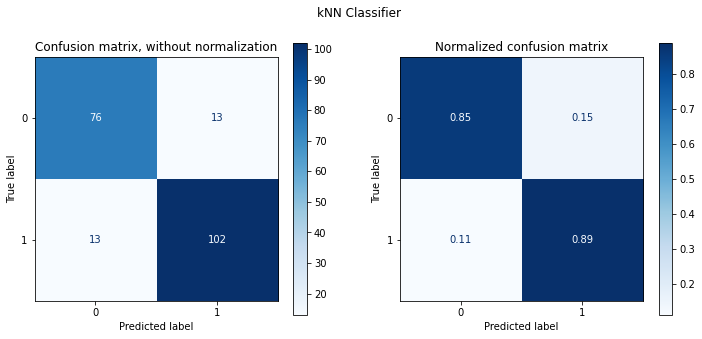

In [351]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.8676
Precision     : 0.8652
Recall        : 0.8661
F1 Score      : 0.8656
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.85      0.85        89
           1       0.89      0.88      0.88       115

    accuracy                           0.87       204
   macro avg       0.87      0.87      0.87       204
weighted avg       0.87      0.87      0.87       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


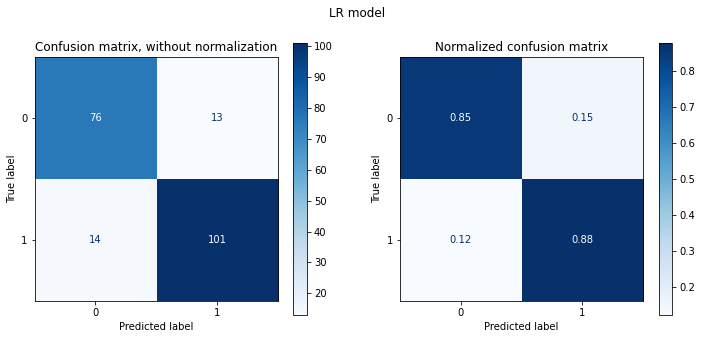

In [352]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model ')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.8676
Precision     : 0.8652
Recall        : 0.8661
F1 Score      : 0.8656
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.85      0.85        89
           1       0.89      0.88      0.88       115

    accuracy                           0.87       204
   macro avg       0.87      0.87      0.87       204
weighted avg       0.87      0.87      0.87       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


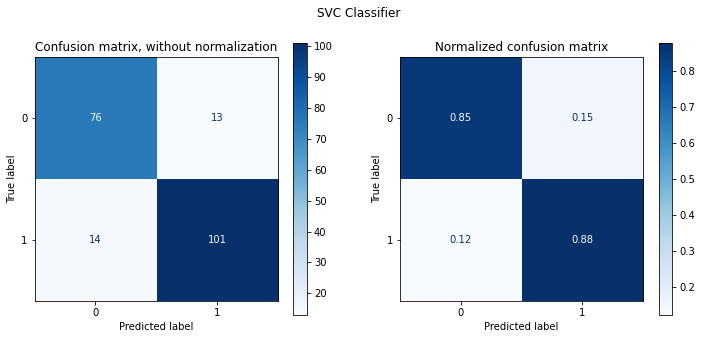

In [353]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=9,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.8627
Precision     : 0.8599
Recall        : 0.8630
F1 Score      : 0.8611
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.87      0.85        89
           1       0.89      0.86      0.88       115

    accuracy                           0.86       204
   macro avg       0.86      0.86      0.86       204
weighted avg       0.86      0.86      0.86       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


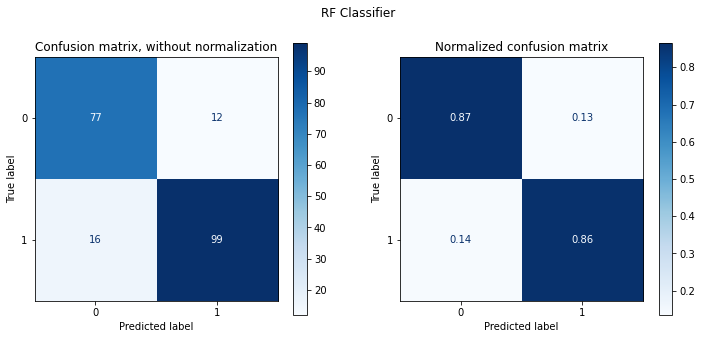

In [354]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [355]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

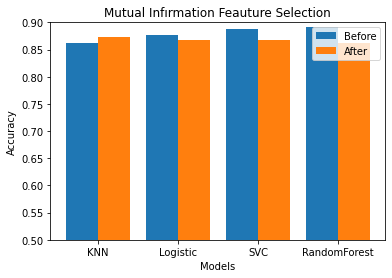

In [356]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 1.918303
Feature 1: 4.019932
Feature 2: 81.142503
Feature 3: 5.755035
Feature 4: 2.511918
Feature 5: 40.295649
Feature 6: 93.110072
Feature 7: 146.349918
Feature 8: 124.468134
Feature 9: 67.199173
Feature 10: 39.225438
Feature 11: 125.012272
Feature 12: 6.277952
Feature 13: 16.287660
Feature 14: 6.607089
Feature 15: 25.783769
Feature 16: 7.656503
Feature 17: 1.075759


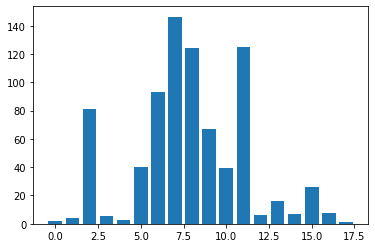

In [357]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25)
Test Accuracy : 0.8725
Precision     : 0.8704
Recall        : 0.8704
F1 Score      : 0.8704
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.85      0.85        89
           1       0.89      0.89      0.89       115

    accuracy                           0.87       204
   macro avg       0.87      0.87      0.87       204
weighted avg       0.87      0.87      0.87       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


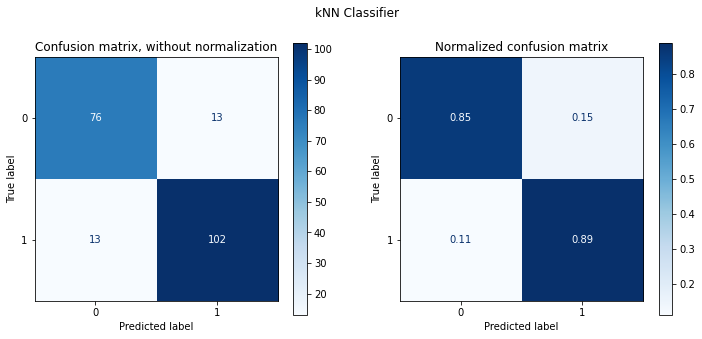

In [358]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier ')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.8676
Precision     : 0.8652
Recall        : 0.8661
F1 Score      : 0.8656
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.85      0.85        89
           1       0.89      0.88      0.88       115

    accuracy                           0.87       204
   macro avg       0.87      0.87      0.87       204
weighted avg       0.87      0.87      0.87       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


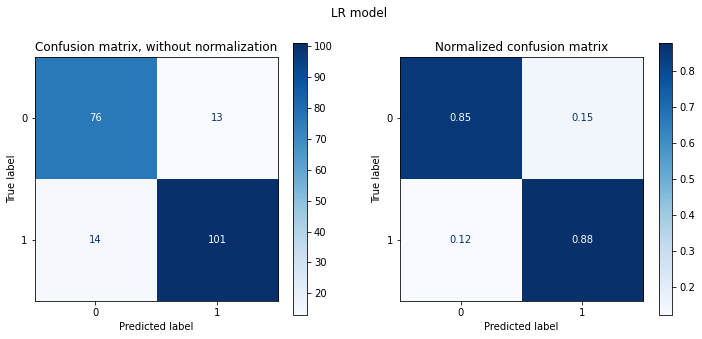

In [359]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.8676
Precision     : 0.8652
Recall        : 0.8661
F1 Score      : 0.8656
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.85      0.85        89
           1       0.89      0.88      0.88       115

    accuracy                           0.87       204
   macro avg       0.87      0.87      0.87       204
weighted avg       0.87      0.87      0.87       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


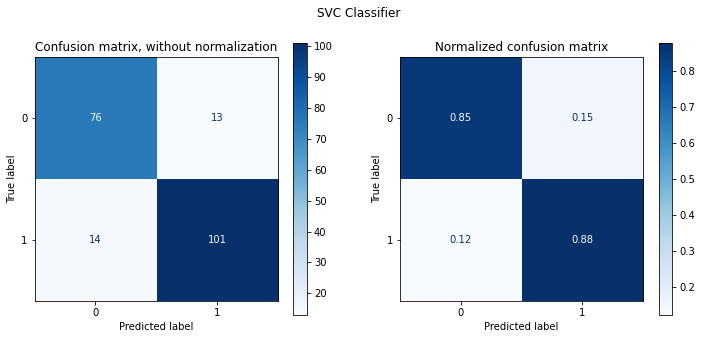

In [360]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=9,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.8627
Precision     : 0.8599
Recall        : 0.8630
F1 Score      : 0.8611
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.87      0.85        89
           1       0.89      0.86      0.88       115

    accuracy                           0.86       204
   macro avg       0.86      0.86      0.86       204
weighted avg       0.86      0.86      0.86       204



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


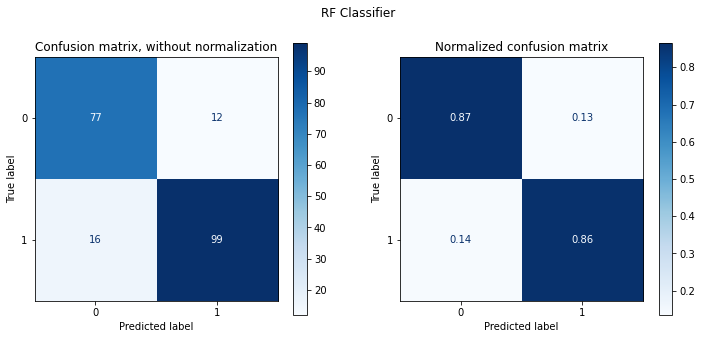

In [361]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [362]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

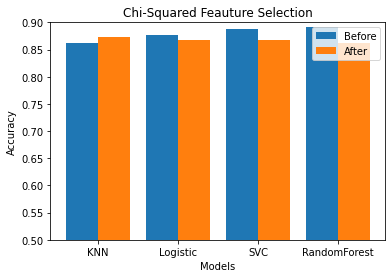

In [363]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['PreM1', 'PreM2', 'PreM3', 'PreM4', 'PreM5']


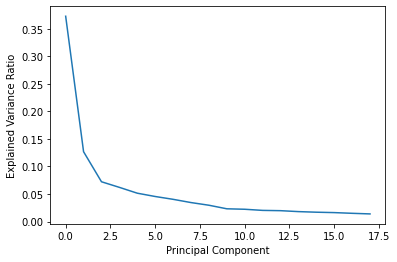

Highest loading features: ['PreM3', 'PreM6', 'PreM5', 'PreM1', 'PreM2']


In [364]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [365]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PreM1 selected =False rank=12 
PreM2 selected =False rank=13 
PreM3 selected =False rank=2 
PreM4 selected =False rank=9 
PreM5 selected =False rank=16 
PreM6 selected =False rank=6 
C1 selected =True rank=1 
C2 selected =False rank=7 
C3 selected =False rank=3 
C4 selected =False rank=4 
C5 selected =False rank=10 
C6 selected =True rank=1 
IC1 selected =False rank=8 
IC2 selected =False rank=5 
IC3 selected =False rank=14 
IC4 selected =True rank=1 
IC5 selected =False rank=15 
IC6 selected =False rank=11 


In [366]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PreM1 selected =False rank=15 
PreM2 selected =False rank=4 
PreM3 selected =False rank=5 
PreM4 selected =False rank=7 
PreM5 selected =False rank=9 
PreM6 selected =False rank=3 
C1 selected =True rank=1 
C2 selected =False rank=10 
C3 selected =True rank=1 
C4 selected =False rank=8 
C5 selected =False rank=11 
C6 selected =True rank=1 
IC1 selected =False rank=13 
IC2 selected =False rank=2 
IC3 selected =False rank=14 
IC4 selected =False rank=6 
IC5 selected =False rank=12 
IC6 selected =False rank=16 


In [367]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PreM1 selected =False rank=13 
PreM2 selected =False rank=4 
PreM3 selected =False rank=6 
PreM4 selected =False rank=7 
PreM5 selected =False rank=10 
PreM6 selected =False rank=3 
C1 selected =True rank=1 
C2 selected =False rank=12 
C3 selected =False rank=2 
C4 selected =False rank=8 
C5 selected =False rank=9 
C6 selected =True rank=1 
IC1 selected =False rank=15 
IC2 selected =False rank=5 
IC3 selected =False rank=16 
IC4 selected =True rank=1 
IC5 selected =False rank=11 
IC6 selected =False rank=14 


In [368]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

PreM1 selected =False rank=9 
PreM2 selected =False rank=12 
PreM3 selected =False rank=5 
PreM4 selected =False rank=16 
PreM5 selected =False rank=15 
PreM6 selected =False rank=8 
C1 selected =True rank=1 
C2 selected =False rank=2 
C3 selected =True rank=1 
C4 selected =False rank=3 
C5 selected =False rank=4 
C6 selected =True rank=1 
IC1 selected =False rank=10 
IC2 selected =False rank=7 
IC3 selected =False rank=14 
IC4 selected =False rank=6 
IC5 selected =False rank=13 
IC6 selected =False rank=11 


In [369]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 87.25490196078431
[0.0147289  0.01315374 0.04751743 0.01121262 0.01195205 0.03140395
 0.09832465 0.14635448 0.13936086 0.04681984 0.05671117 0.19476383
 0.01649719 0.0382906  0.01533856 0.08006562 0.02102559 0.01647892]


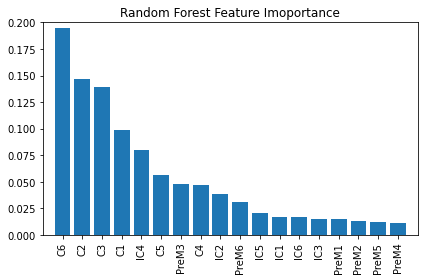

In [370]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [371]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [372]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

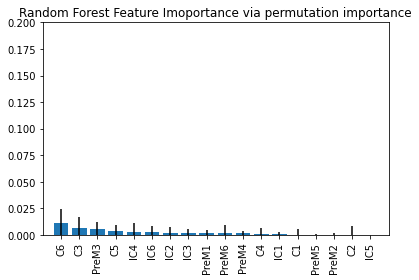

In [373]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [374]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['C1' 'C6' 'IC4']


Selected features with using Random Forest Classifier:
['PreM3' 'C1' 'C2' 'C3' 'C6' 'IC4']


Selected features with using Logistic Regression Classifier:
['PreM2' 'PreM3' 'PreM4' 'PreM6' 'C1' 'C3' 'C4' 'C6' 'IC2' 'IC4']


Selected features with using Linear Regression:
['PreM2' 'PreM3' 'PreM4' 'PreM6' 'C1' 'C3' 'C6' 'IC2' 'IC4']


#IESR# 

In [375]:
df = pd.read_csv("IESR_df.csv") # Creating the dataframe.
print(df)

     IESR1  IESR2  IESR3  IESR4  IESR5  IESR6  IESR7  IESR8  IESR9  IESR10  \
0        1      1      1      1      1      1      1      1      1       1   
1        1      1      1      1      1      1      1      1      1       1   
2        1      1      1      1      1      1      1      1      1       1   
3        1      1      1      1      1      1      1      1      1       1   
4        1      1      1      1      1      1      1      1      1       1   
..     ...    ...    ...    ...    ...    ...    ...    ...    ...     ...   
353      5      5      4      5      5      5      5      5      4       5   
354      4      3      2      5      5      3      5      5      5       4   
355      5      5      4      4      1      4      4      2      5       4   
356      5      5      5      5      1      5      1      5      5       5   
357      5      5      5      5      1      5      1      1      5       5   

     ...  IESR14  IESR15  IESR16  IESR17  IESR18  IESR19  IESR2

In [376]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [377]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,IESR1,IESR2,IESR3,IESR4,IESR5,IESR6,IESR7,IESR8,IESR9,IESR10,...,IESR13,IESR14,IESR15,IESR16,IESR17,IESR18,IESR19,IESR20,IESR21,IESR22
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
2,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
3,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
4,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,5,5,4,5,5,5,5,5,4,5,...,4,4,5,4,5,5,4,4,5,5
354,4,3,2,5,5,3,5,5,5,4,...,3,5,4,4,5,4,3,5,5,3
355,5,5,4,4,1,4,4,2,5,4,...,4,4,4,5,4,4,5,4,4,4
356,5,5,5,5,1,5,1,5,5,5,...,5,5,5,5,5,5,5,5,5,5


In [378]:
number_of_features = X.shape[1]
number_of_features

22

In [379]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
353    0
354    0
355    0
356    0
357    0
Name: CONDITION, Length: 358, dtype: object

In [380]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [381]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [382]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
69,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'distance'}",1.000,0.96,0.028284
188,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'uniform'}",0.958,0.96,0.028284
189,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'distance'}",1.000,0.96,0.028284
190,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 6, 'weights': 'uniform'}",0.957,0.96,0.028284
191,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 6, 'weights': 'distance'}",1.000,0.96,0.028284


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan')
Test Accuracy : 0.9259
Precision     : 0.9312
Recall        : 0.9259
F1 Score      : 0.9257
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.87      0.92        54
           1       0.88      0.98      0.93        54

    accuracy                           0.93       108
   macro avg       0.93      0.93      0.93       108
weighted avg       0.93      0.93      0.93       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


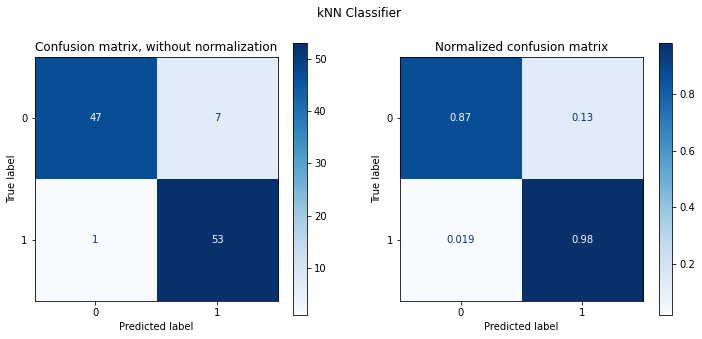

In [383]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [384]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
8,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'sag'}",0.955,0.924,0.034409
7,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.960,0.924,0.034409
6,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.960,0.924,0.034409
18,4,"{'C': 1, 'penalty': 'l2', 'solver': 'newton-cg'}",0.959,0.920,0.033466
19,4,"{'C': 1, 'penalty': 'l2', 'solver': 'lbfgs'}",0.959,0.920,0.033466


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.9167
Precision     : 0.9168
Recall        : 0.9167
F1 Score      : 0.9167
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.91      0.92        54
           1       0.91      0.93      0.92        54

    accuracy                           0.92       108
   macro avg       0.92      0.92      0.92       108
weighted avg       0.92      0.92      0.92       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


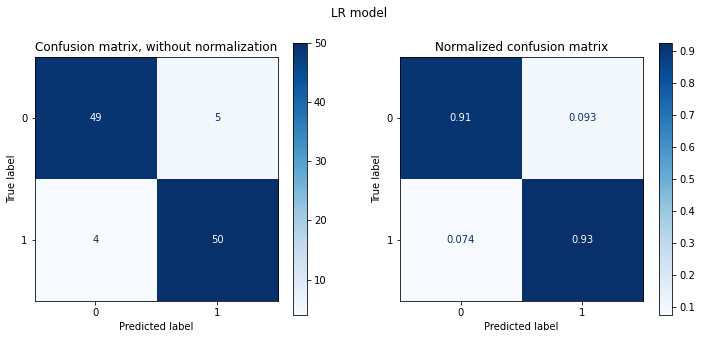

In [385]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [386]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
3,1,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.955,0.956,0.029394
0,2,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'linear'}",0.952,0.952,0.032496
1,3,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'rbf'}",0.951,0.948,0.027129
2,3,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'poly'}",0.952,0.948,0.037094
4,3,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'rbf'}",0.951,0.948,0.027129


-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.9259
Precision     : 0.9355
Recall        : 0.9259
F1 Score      : 0.9255
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.85      0.92        54
           1       0.87      1.00      0.93        54

    accuracy                           0.93       108
   macro avg       0.94      0.93      0.93       108
weighted avg       0.94      0.93      0.93       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


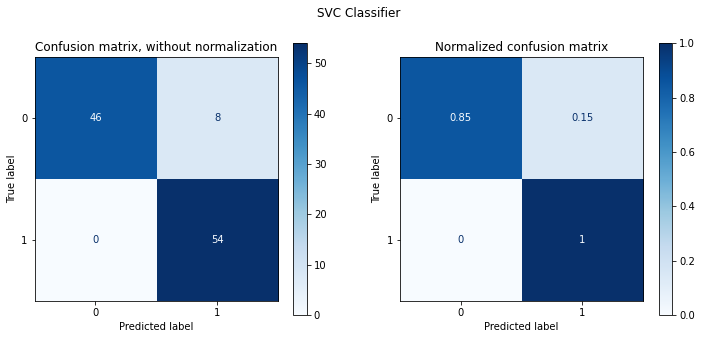

In [387]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [388]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
57,1,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 30}",0.959,0.948,0.037094
42,1,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 30}",0.960,0.948,0.037094
29,3,"{'max_depth': 5, 'min_samples_split': 13, 'n_estimators': 50}",0.960,0.944,0.048000
26,3,"{'max_depth': 5, 'min_samples_split': 13, 'n_estimators': 20}",0.961,0.944,0.040792
21,3,"{'max_depth': 5, 'min_samples_split': 9, 'n_estimators': 20}",0.962,0.944,0.040792


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=30, random_state=123)
Test Accuracy : 0.9259
Precision     : 0.9355
Recall        : 0.9259
F1 Score      : 0.9255
-----------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.85      0.92        54
           1       0.87      1.00      0.93        54

    accuracy                           0.93       108
   macro avg       0.94      0.93      0.93       108
weighted avg       0.94      0.93      0.93       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


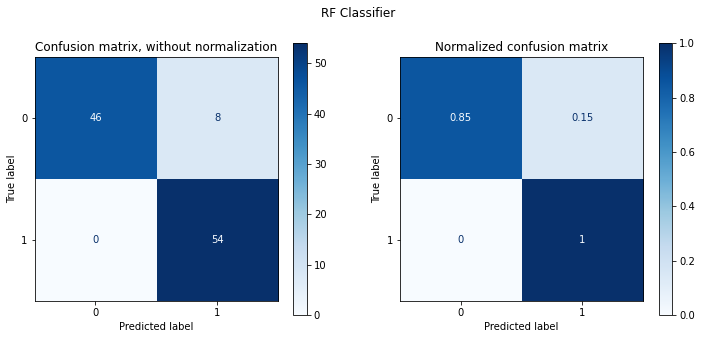

In [389]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [390]:
number = int(number_of_features/5)

Feature 0: 0.244748
Feature 1: 0.270540
Feature 2: 0.211240
Feature 3: 0.145181
Feature 4: 0.000000
Feature 5: 0.334810
Feature 6: 0.240561
Feature 7: 0.289892
Feature 8: 0.448452
Feature 9: 0.351254
Feature 10: 0.151408
Feature 11: 0.344194
Feature 12: 0.346701
Feature 13: 0.424130
Feature 14: 0.359744
Feature 15: 0.378079
Feature 16: 0.339640
Feature 17: 0.338468
Feature 18: 0.420504
Feature 19: 0.368477
Feature 20: 0.204276
Feature 21: 0.205801


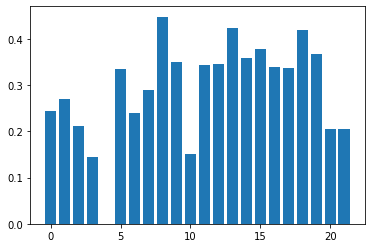

In [391]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan')
Test Accuracy : 0.8241
Precision     : 0.8251
Recall        : 0.8241
F1 Score      : 0.8239
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.85      0.83        54
           1       0.84      0.80      0.82        54

    accuracy                           0.82       108
   macro avg       0.83      0.82      0.82       108
weighted avg       0.83      0.82      0.82       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


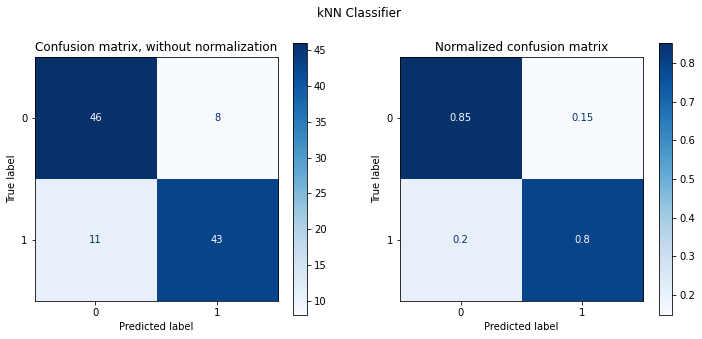

In [392]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.8981
Precision     : 0.8983
Recall        : 0.8981
F1 Score      : 0.8981
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.91      0.89      0.90        54
           1       0.89      0.91      0.90        54

    accuracy                           0.90       108
   macro avg       0.90      0.90      0.90       108
weighted avg       0.90      0.90      0.90       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


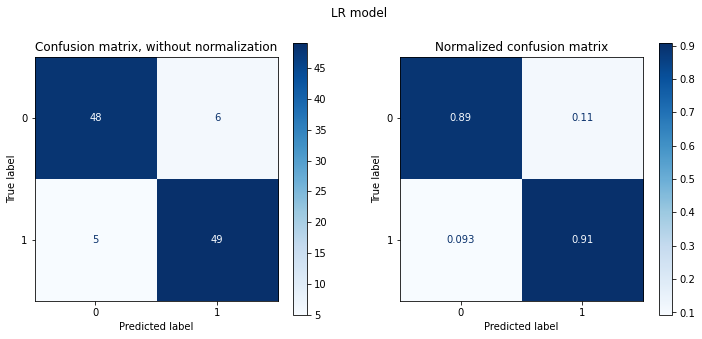

In [393]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.8981
Precision     : 0.9016
Recall        : 0.8981
F1 Score      : 0.8979
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.85      0.89        54
           1       0.86      0.94      0.90        54

    accuracy                           0.90       108
   macro avg       0.90      0.90      0.90       108
weighted avg       0.90      0.90      0.90       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


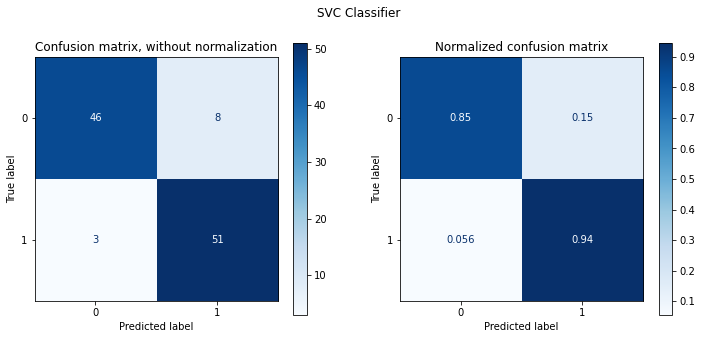

In [394]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=30, random_state=123)
Test Accuracy : 0.8796
Precision     : 0.8829
Recall        : 0.8796
F1 Score      : 0.8794
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.83      0.87        54
           1       0.85      0.93      0.88        54

    accuracy                           0.88       108
   macro avg       0.88      0.88      0.88       108
weighted avg       0.88      0.88      0.88       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


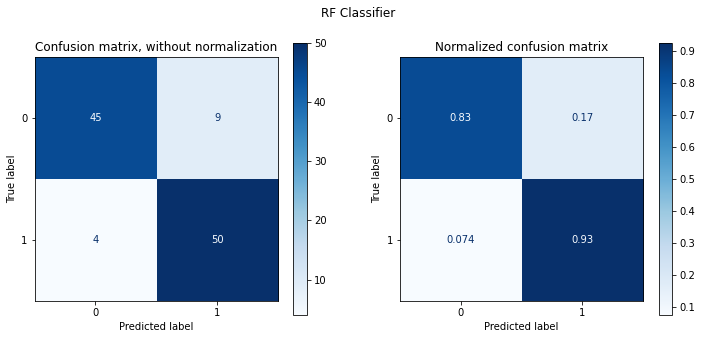

In [395]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [396]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

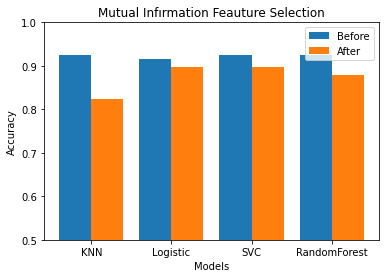

In [397]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Feature 0: 47.735547
Feature 1: 108.506849
Feature 2: 57.515436
Feature 3: 51.953146
Feature 4: 1.206600
Feature 5: 77.543269
Feature 6: 87.947712
Feature 7: 99.533700
Feature 8: 157.776119
Feature 9: 90.616622
Feature 10: 57.532663
Feature 11: 116.805556
Feature 12: 128.025397
Feature 13: 148.596685
Feature 14: 157.564972
Feature 15: 105.077620
Feature 16: 126.501425
Feature 17: 109.803922
Feature 18: 188.255539
Feature 19: 129.202977
Feature 20: 77.899270
Feature 21: 90.248908


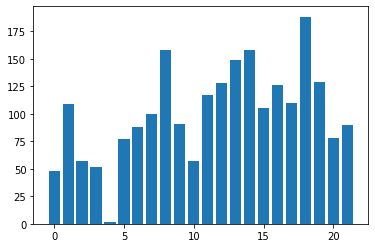

In [398]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan')
Test Accuracy : 0.9167
Precision     : 0.9238
Recall        : 0.9167
F1 Score      : 0.9163
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.85      0.91        54
           1       0.87      0.98      0.92        54

    accuracy                           0.92       108
   macro avg       0.92      0.92      0.92       108
weighted avg       0.92      0.92      0.92       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


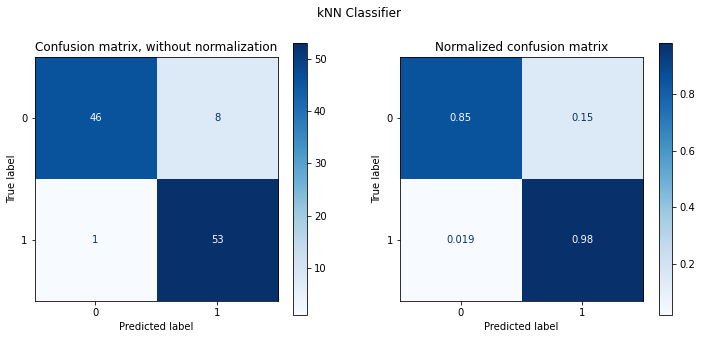

In [399]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.9074
Precision     : 0.9080
Recall        : 0.9074
F1 Score      : 0.9074
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.89      0.91        54
           1       0.89      0.93      0.91        54

    accuracy                           0.91       108
   macro avg       0.91      0.91      0.91       108
weighted avg       0.91      0.91      0.91       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


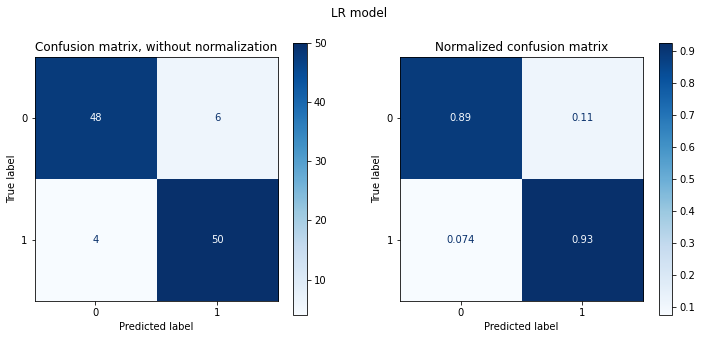

In [400]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.9167
Precision     : 0.9238
Recall        : 0.9167
F1 Score      : 0.9163
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      0.85      0.91        54
           1       0.87      0.98      0.92        54

    accuracy                           0.92       108
   macro avg       0.92      0.92      0.92       108
weighted avg       0.92      0.92      0.92       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


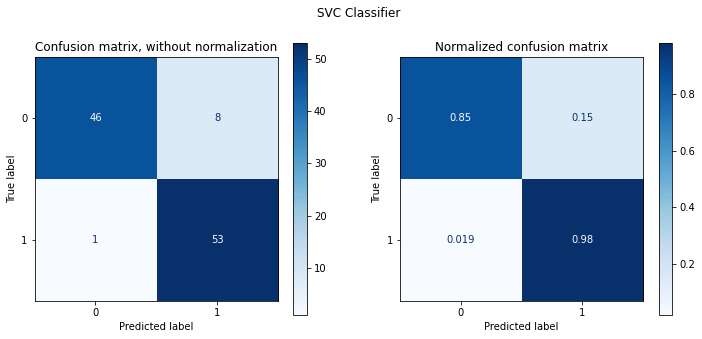

In [401]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=30, random_state=123)
Test Accuracy : 0.8981
Precision     : 0.9050
Recall        : 0.8981
F1 Score      : 0.8977
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.83      0.89        54
           1       0.85      0.96      0.90        54

    accuracy                           0.90       108
   macro avg       0.90      0.90      0.90       108
weighted avg       0.90      0.90      0.90       108



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


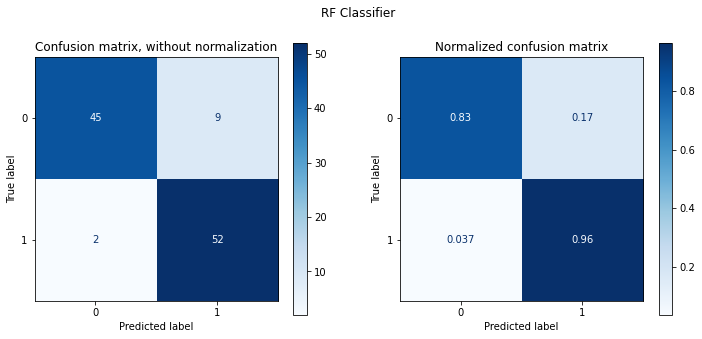

In [402]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [403]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

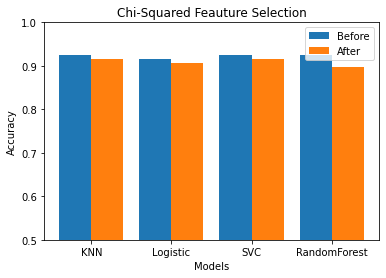

In [404]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 1])

plt.show()

Highest variance features: ['IESR1', 'IESR2', 'IESR3', 'IESR4', 'IESR5']


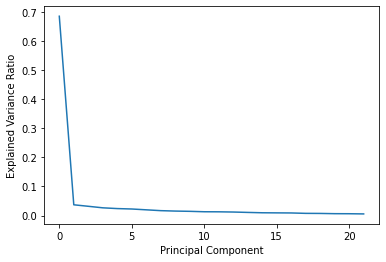

Highest loading features: ['IESR19', 'IESR9', 'IESR14', 'IESR15', 'IESR20']


In [405]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [406]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

IESR1 selected =False rank=3 
IESR2 selected =False rank=15 
IESR3 selected =False rank=4 
IESR4 selected =False rank=17 
IESR5 selected =False rank=6 
IESR6 selected =False rank=13 
IESR7 selected =False rank=2 
IESR8 selected =False rank=10 
IESR9 selected =True rank=1 
IESR10 selected =False rank=11 
IESR11 selected =False rank=12 
IESR12 selected =True rank=1 
IESR13 selected =False rank=18 
IESR14 selected =False rank=16 
IESR15 selected =True rank=1 
IESR16 selected =False rank=5 
IESR17 selected =False rank=9 
IESR18 selected =False rank=7 
IESR19 selected =True rank=1 
IESR20 selected =False rank=8 
IESR21 selected =False rank=14 
IESR22 selected =False rank=19 


In [407]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

IESR1 selected =False rank=5 
IESR2 selected =False rank=6 
IESR3 selected =False rank=13 
IESR4 selected =False rank=2 
IESR5 selected =False rank=19 
IESR6 selected =False rank=16 
IESR7 selected =False rank=3 
IESR8 selected =False rank=7 
IESR9 selected =True rank=1 
IESR10 selected =False rank=15 
IESR11 selected =False rank=9 
IESR12 selected =False rank=10 
IESR13 selected =False rank=12 
IESR14 selected =False rank=4 
IESR15 selected =True rank=1 
IESR16 selected =False rank=14 
IESR17 selected =False rank=8 
IESR18 selected =False rank=18 
IESR19 selected =True rank=1 
IESR20 selected =True rank=1 
IESR21 selected =False rank=11 
IESR22 selected =False rank=17 


In [408]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

IESR1 selected =False rank=2 
IESR2 selected =False rank=3 
IESR3 selected =False rank=7 
IESR4 selected =False rank=4 
IESR5 selected =False rank=14 
IESR6 selected =False rank=18 
IESR7 selected =True rank=1 
IESR8 selected =False rank=6 
IESR9 selected =True rank=1 
IESR10 selected =False rank=9 
IESR11 selected =False rank=12 
IESR12 selected =False rank=5 
IESR13 selected =False rank=13 
IESR14 selected =False rank=11 
IESR15 selected =False rank=8 
IESR16 selected =False rank=19 
IESR17 selected =False rank=15 
IESR18 selected =False rank=17 
IESR19 selected =True rank=1 
IESR20 selected =True rank=1 
IESR21 selected =False rank=10 
IESR22 selected =False rank=16 


In [409]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

IESR1 selected =False rank=12 
IESR2 selected =False rank=11 
IESR3 selected =False rank=16 
IESR4 selected =False rank=17 
IESR5 selected =False rank=14 
IESR6 selected =False rank=13 
IESR7 selected =False rank=9 
IESR8 selected =False rank=4 
IESR9 selected =True rank=1 
IESR10 selected =False rank=7 
IESR11 selected =False rank=15 
IESR12 selected =False rank=5 
IESR13 selected =False rank=10 
IESR14 selected =True rank=1 
IESR15 selected =True rank=1 
IESR16 selected =False rank=3 
IESR17 selected =False rank=6 
IESR18 selected =False rank=8 
IESR19 selected =True rank=1 
IESR20 selected =False rank=2 
IESR21 selected =False rank=19 
IESR22 selected =False rank=18 


In [410]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 91.66666666666666
[0.01203459 0.01574996 0.01542878 0.00746598 0.01302658 0.02536441
 0.02506118 0.02802309 0.1131041  0.06554698 0.01820855 0.04899829
 0.07229585 0.13198044 0.07800877 0.06379036 0.04195454 0.03147784
 0.12210652 0.05015419 0.00718631 0.01303269]


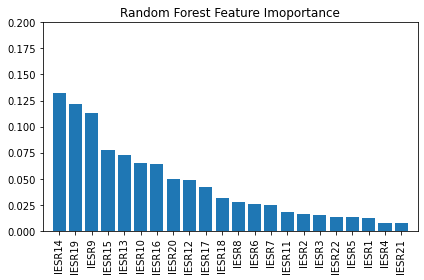

In [411]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [412]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [413]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

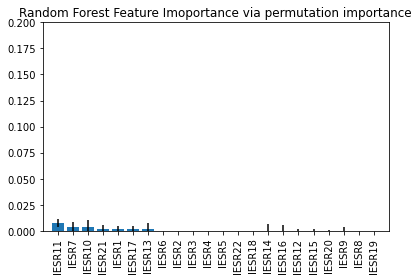

In [414]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [415]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['IESR9' 'IESR15']


Selected features with using Random Forest Classifier:
['IESR9' 'IESR14' 'IESR15' 'IESR16' 'IESR17' 'IESR19' 'IESR20']


Selected features with using Logistic Regression Classifier:
['IESR1' 'IESR2' 'IESR3' 'IESR4' 'IESR7' 'IESR8' 'IESR9' 'IESR15' 'IESR19'
 'IESR20' 'IESR21']


Selected features with using Linear Regression:
['IESR1' 'IESR2' 'IESR4' 'IESR7' 'IESR8' 'IESR9' 'IESR11' 'IESR14'
 'IESR15' 'IESR19' 'IESR20' 'IESR21']


#R_NEO_PI# 

In [416]:
df = pd.read_csv("DT_df_CC.csv") # Creating the dataframe.
print(df)

     Mach1   Mach2   Mach3   Mach4   Mach5   Mach6   Mach7   Mach8   Mach9   \
0         3       3       2       4       4       3       3       3       4   
1         4       2       1       3       4       4       4       2       2   
2         4       1       3       3       3       1       4       1       5   
3         4       3       1       3       3       4       2       3       4   
4         3       2       1       2       2       3       3       2       3   
..      ...     ...     ...     ...     ...     ...     ...     ...     ...   
477       4       3       5       4       1       4       3       4       2   
478       4       1       1       4       1       4       4       1       3   
479       3       1       1       1       1       3       2       1       1   
480       4       2       2       2       3       4       3       2       2   
481       5       3       3       3       4       3       5       2       5   

     Psycho1   ...  Narc1  Narc2   Narc3   Narc4   

In [417]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [418]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,Mach1,Mach2,Mach3,Mach4,Mach5,Mach6,Mach7,Mach8,Mach9,Psycho1,...,Psycho9,Narc1,Narc2,Narc3,Narc4,Narc5,Narc6,Narc7,Narc8,Narc9
0,3,3,2,4,4,3,3,3,4,2,...,1,3,3,3,3,3,4,3,4,2
1,4,2,1,3,4,4,4,2,2,3,...,1,4,1,3,3,2,2,3,4,5
2,4,1,3,3,3,1,4,1,5,1,...,1,3,2,3,3,2,1,2,3,3
3,4,3,1,3,3,4,2,3,4,2,...,1,4,4,1,2,4,2,2,3,4
4,3,2,1,2,2,3,3,2,3,2,...,1,2,2,2,2,3,1,1,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,4,3,5,4,1,4,3,4,2,3,...,2,3,3,2,2,3,3,3,3,4
478,4,1,1,4,1,4,4,1,3,1,...,1,4,4,2,2,1,4,2,4,2
479,3,1,1,1,1,3,2,1,1,1,...,1,4,3,3,3,2,4,1,3,4
480,4,2,2,2,3,4,3,2,2,3,...,1,3,2,2,2,3,2,2,2,4


In [419]:
number_of_features = X.shape[1]
number_of_features

27

In [420]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
477    0
478    0
479    0
480    0
481    0
Name: CONDITION, Length: 482, dtype: object

In [421]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [422]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [423]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
109,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.0,0.744820,0.059647
55,2,"{'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735953,0.057327
175,3,"{'algorithm': 'kd_tree', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735909,0.066661
295,4,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735821,0.067791
349,5,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.0,0.732880,0.054177


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7379
Precision     : 0.7381
Recall        : 0.7378
F1 Score      : 0.7378
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.75      0.74        73
           1       0.74      0.72      0.73        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


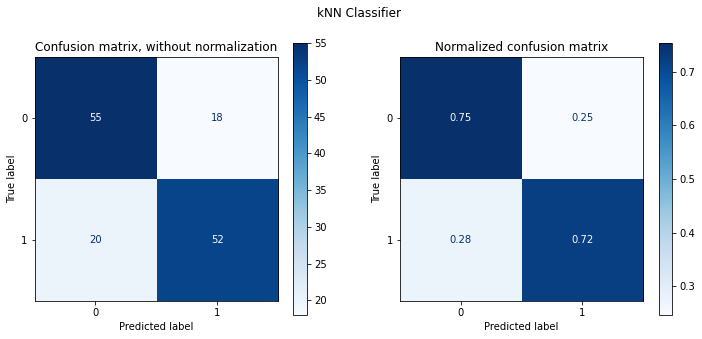

In [424]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [425]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
6,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.781884,0.726866,0.048013
7,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.781884,0.726866,0.048013
8,3,"{'C': 0.5, 'penalty': 'l2', 'solver': 'sag'}",0.784117,0.723837,0.051093
20,4,"{'C': 1, 'penalty': 'l2', 'solver': 'sag'}",0.784857,0.720852,0.052722
38,4,"{'C': 7, 'penalty': 'none', 'solver': 'sag'}",0.785598,0.720852,0.052722


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7241
Precision     : 0.7284
Recall        : 0.7236
F1 Score      : 0.7225
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.79      0.74        73
           1       0.76      0.65      0.70        72

    accuracy                           0.72       145
   macro avg       0.73      0.72      0.72       145
weighted avg       0.73      0.72      0.72       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


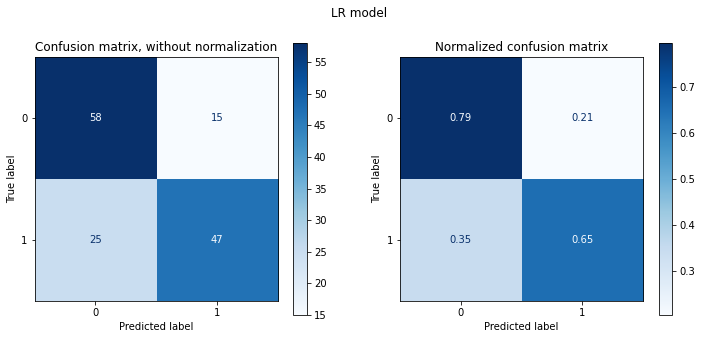

In [426]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [427]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
3,1,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.788575,0.771378,0.061856
10,2,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.882038,0.756497,0.062672
7,3,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}",0.767055,0.741747,0.066401
6,4,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.804155,0.741572,0.054641
0,5,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'linear'}",0.738122,0.735865,0.073551


-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7379
Precision     : 0.7379
Recall        : 0.7379
F1 Score      : 0.7379
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.74      0.74        73
           1       0.74      0.74      0.74        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


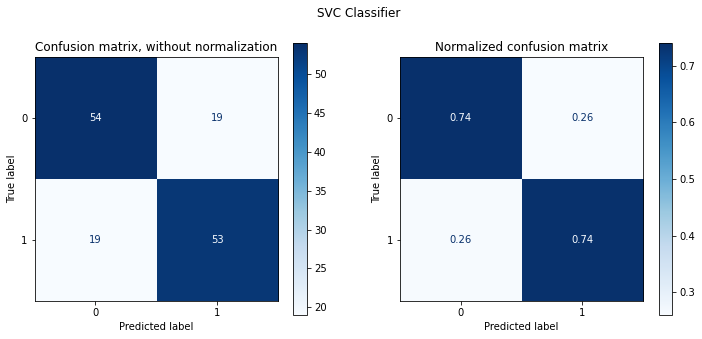

In [428]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [429]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
44,1,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 50}",0.889462,0.768437,0.050398
49,2,"{'max_depth': 9, 'min_samples_split': 5, 'n_estimators': 50}",0.967350,0.768393,0.055700
39,3,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 50}",0.915415,0.765452,0.057721
58,4,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 40}",0.896137,0.765408,0.054584
59,5,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 50}",0.897618,0.765408,0.062213


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7586
Precision     : 0.7647
Recall        : 0.7591
F1 Score      : 0.7575
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.68      0.74        73
           1       0.72      0.83      0.77        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


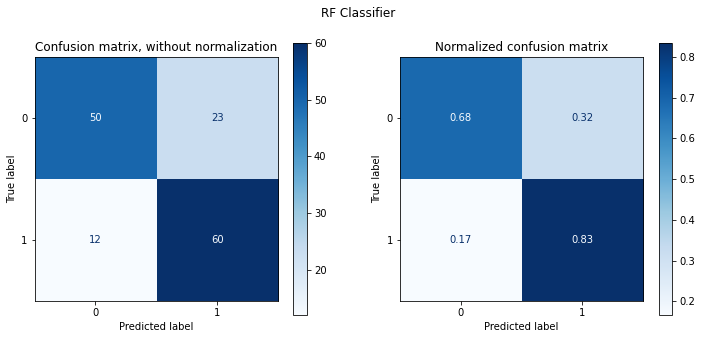

In [430]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [431]:
number = int(number_of_features/5)

Feature 0: 0.017045
Feature 1: 0.051724
Feature 2: 0.002179
Feature 3: 0.000000
Feature 4: 0.092126
Feature 5: 0.018960
Feature 6: 0.053779
Feature 7: 0.075454
Feature 8: 0.026207
Feature 9: 0.081556
Feature 10: 0.083429
Feature 11: 0.073548
Feature 12: 0.006635
Feature 13: 0.105200
Feature 14: 0.021356
Feature 15: 0.000000
Feature 16: 0.066542
Feature 17: 0.011483
Feature 18: 0.000000
Feature 19: 0.000000
Feature 20: 0.030149
Feature 21: 0.016976
Feature 22: 0.029586
Feature 23: 0.001159
Feature 24: 0.008447
Feature 25: 0.041063
Feature 26: 0.034449


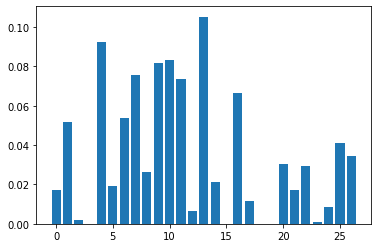

In [432]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7103
Precision     : 0.7129
Recall        : 0.7100
F1 Score      : 0.7092
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.69      0.77      0.73        73
           1       0.73      0.65      0.69        72

    accuracy                           0.71       145
   macro avg       0.71      0.71      0.71       145
weighted avg       0.71      0.71      0.71       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


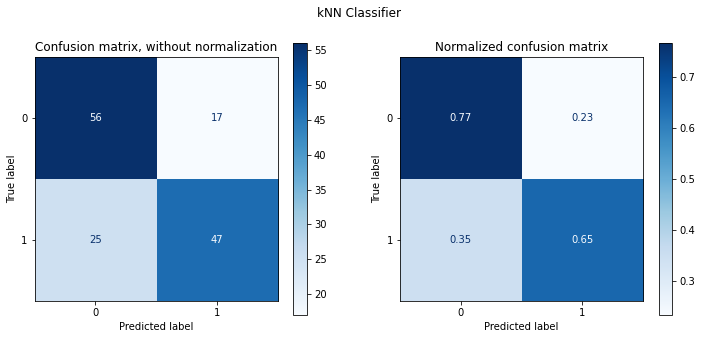

In [433]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7517
Precision     : 0.7535
Recall        : 0.7514
F1 Score      : 0.7511
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.79      0.76        73
           1       0.77      0.71      0.74        72

    accuracy                           0.75       145
   macro avg       0.75      0.75      0.75       145
weighted avg       0.75      0.75      0.75       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


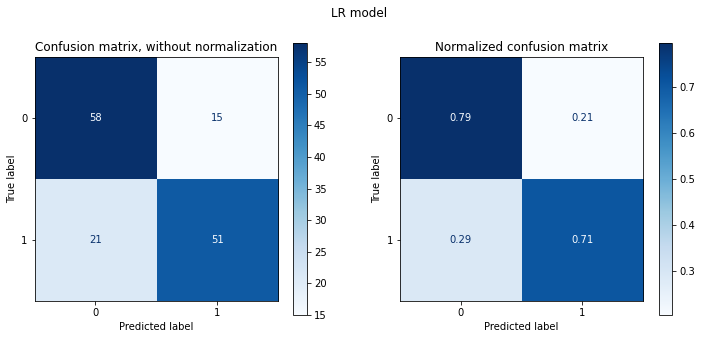

In [434]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7586
Precision     : 0.7587
Recall        : 0.7586
F1 Score      : 0.7586
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.77      0.76        73
           1       0.76      0.75      0.76        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


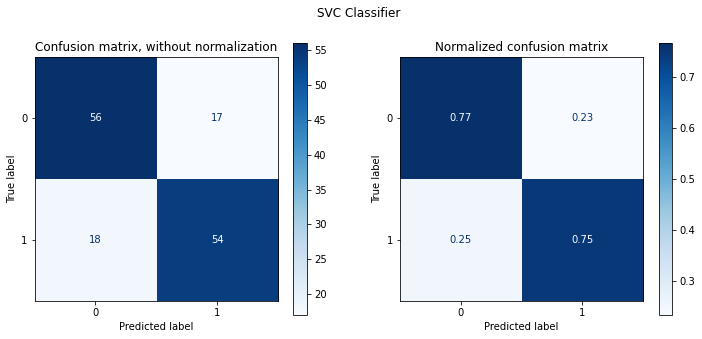

In [435]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7448
Precision     : 0.7449
Recall        : 0.7449
F1 Score      : 0.7448
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.74      0.74        73
           1       0.74      0.75      0.74        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


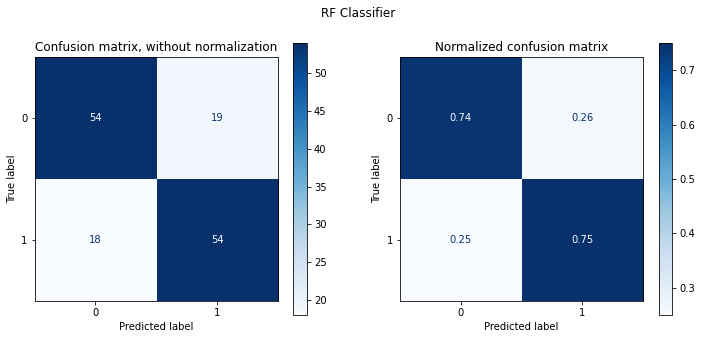

In [436]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [437]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

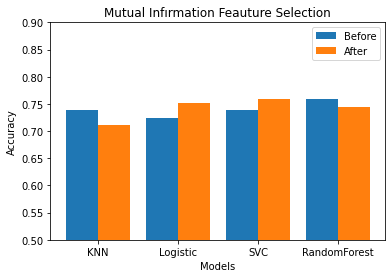

In [438]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 1.342369
Feature 1: 16.738514
Feature 2: 0.199986
Feature 3: 3.205232
Feature 4: 18.995364
Feature 5: 0.005037
Feature 6: 11.584945
Feature 7: 6.803980
Feature 8: 11.156437
Feature 9: 28.517719
Feature 10: 19.675601
Feature 11: 6.001463
Feature 12: 7.343073
Feature 13: 38.069811
Feature 14: 8.284755
Feature 15: 1.254384
Feature 16: 19.212523
Feature 17: 1.704904
Feature 18: 0.003785
Feature 19: 2.931008
Feature 20: 0.036318
Feature 21: 0.277158
Feature 22: 0.004449
Feature 23: 1.601906
Feature 24: 1.318111
Feature 25: 4.080489
Feature 26: 0.073067


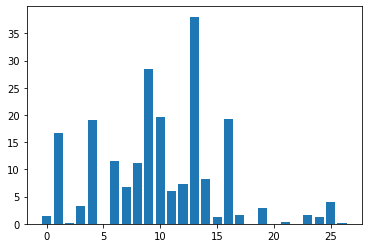

In [439]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7103
Precision     : 0.7117
Recall        : 0.7100
F1 Score      : 0.7097
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.75      0.72        73
           1       0.73      0.67      0.70        72

    accuracy                           0.71       145
   macro avg       0.71      0.71      0.71       145
weighted avg       0.71      0.71      0.71       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


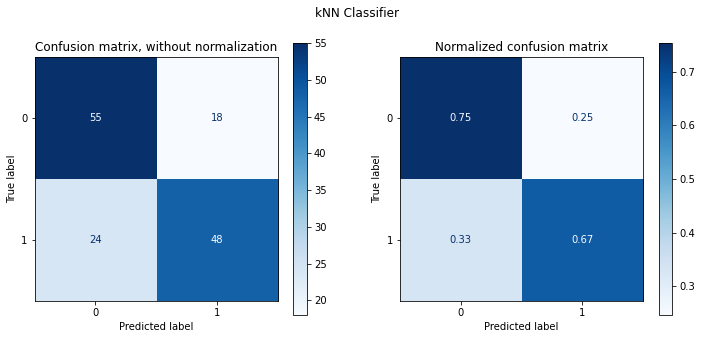

In [440]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier ')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7655
Precision     : 0.7663
Recall        : 0.7653
F1 Score      : 0.7652
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.79      0.77        73
           1       0.78      0.74      0.76        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


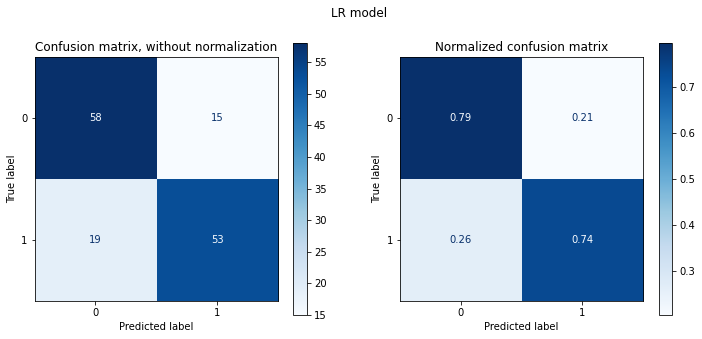

In [441]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7586
Precision     : 0.7587
Recall        : 0.7587
F1 Score      : 0.7586
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.75      0.76        73
           1       0.75      0.76      0.76        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


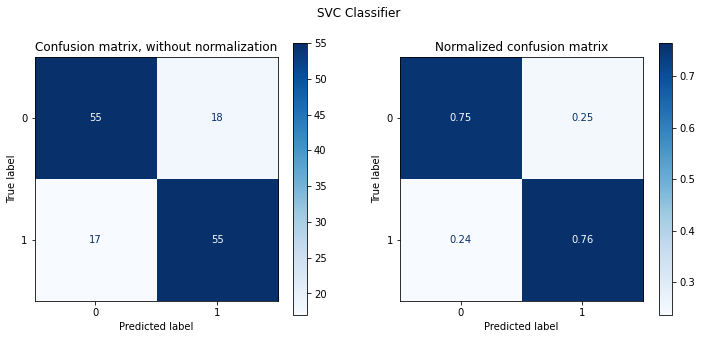

In [442]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7655
Precision     : 0.7657
Recall        : 0.7656
F1 Score      : 0.7655
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.75      0.76        73
           1       0.76      0.78      0.77        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


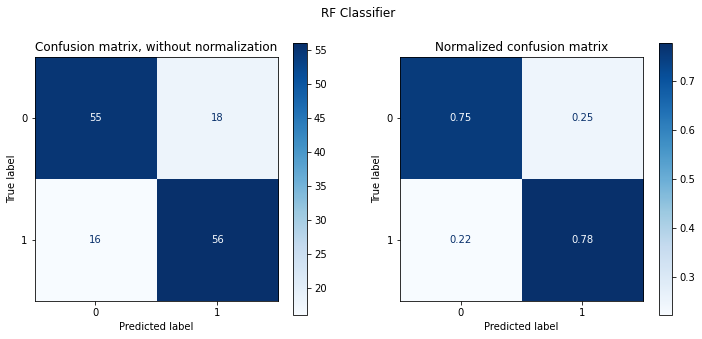

In [443]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [444]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

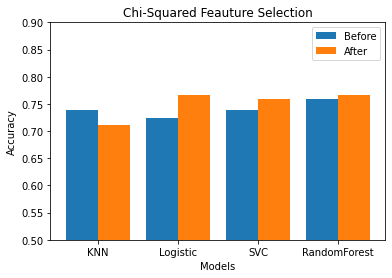

In [445]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['Mach1 ', 'Mach2 ', 'Mach3 ', 'Mach4 ', 'Mach5 ']


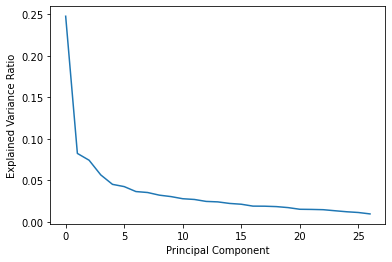

Highest loading features: ['Mach5 ', 'Psycho1 ', 'Mach2 ', 'Psycho5 H', 'Mach9 ']


In [446]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [447]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=15 
Mach2  selected =False rank=23 
Mach3  selected =True rank=1 
Mach4  selected =False rank=20 
Mach5  selected =False rank=4 
Mach6  selected =False rank=5 
Mach7  selected =False rank=11 
Mach8  selected =False rank=22 
Mach9  selected =True rank=1 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=7 
Psycho4  selected =False rank=13 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=19 
Psycho7  selected =False rank=21 
Psycho8  selected =False rank=6 
Psycho9  selected =False rank=18 
Narc1 selected =False rank=8 
Narc2  selected =False rank=14 
Narc3  selected =False rank=17 
Narc4  selected =False rank=9 
Narc5  selected =False rank=2 
Narc6 selected =False rank=10 
Narc7  selected =False rank=16 
Narc8  selected =False rank=3 
Narc9  selected =False rank=12 


In [448]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=23 
Mach2  selected =False rank=3 
Mach3  selected =True rank=1 
Mach4  selected =False rank=10 
Mach5  selected =False rank=16 
Mach6  selected =False rank=14 
Mach7  selected =True rank=1 
Mach8  selected =False rank=20 
Mach9  selected =False rank=7 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=5 
Psycho4  selected =False rank=17 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=21 
Psycho7  selected =False rank=15 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=6 
Narc1 selected =False rank=18 
Narc2  selected =False rank=12 
Narc3  selected =False rank=4 
Narc4  selected =False rank=22 
Narc5  selected =False rank=9 
Narc6 selected =False rank=13 
Narc7  selected =False rank=11 
Narc8  selected =False rank=8 
Narc9  selected =False rank=19 


In [449]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=23 
Mach2  selected =False rank=4 
Mach3  selected =True rank=1 
Mach4  selected =False rank=7 
Mach5  selected =False rank=16 
Mach6  selected =False rank=10 
Mach7  selected =True rank=1 
Mach8  selected =False rank=21 
Mach9  selected =False rank=9 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=3 
Psycho4  selected =False rank=17 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=22 
Psycho7  selected =False rank=15 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=5 
Narc1 selected =False rank=18 
Narc2  selected =False rank=14 
Narc3  selected =False rank=6 
Narc4  selected =False rank=20 
Narc5  selected =False rank=8 
Narc6 selected =False rank=13 
Narc7  selected =False rank=12 
Narc8  selected =False rank=11 
Narc9  selected =False rank=19 


In [450]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=20 
Mach2  selected =False rank=4 
Mach3  selected =False rank=12 
Mach4  selected =False rank=18 
Mach5  selected =False rank=3 
Mach6  selected =False rank=15 
Mach7  selected =False rank=2 
Mach8  selected =False rank=7 
Mach9  selected =True rank=1 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=21 
Psycho4  selected =False rank=14 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=13 
Psycho7  selected =False rank=17 
Psycho8  selected =False rank=6 
Psycho9  selected =False rank=9 
Narc1 selected =False rank=22 
Narc2  selected =False rank=16 
Narc3  selected =False rank=23 
Narc4  selected =False rank=8 
Narc5  selected =False rank=19 
Narc6 selected =True rank=1 
Narc7  selected =False rank=11 
Narc8  selected =False rank=5 
Narc9  selected =False rank=10 


In [451]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 78.62068965517241
[0.02486575 0.03884929 0.03109704 0.02891643 0.04662524 0.02824665
 0.05475055 0.04461345 0.05035059 0.06740034 0.07380512 0.02686446
 0.02954497 0.08648858 0.02758893 0.02891899 0.03738555 0.0314535
 0.02589485 0.02750816 0.02042976 0.02851161 0.02379657 0.02693174
 0.03131508 0.03110129 0.02674548]


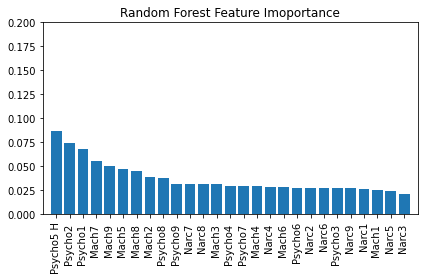

In [452]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [453]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [454]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

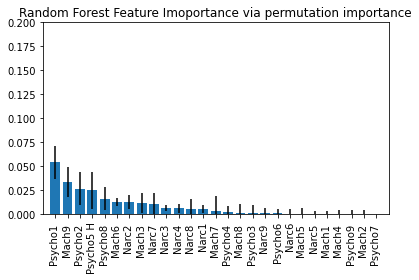

In [455]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [456]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['Mach1 ' 'Mach5 ' 'Mach7 ' 'Mach9 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 '
 'Psycho5 H']


Selected features with using Random Forest Classifier:
['Mach2 ' 'Mach5 ' 'Mach7 ' 'Mach9 ' 'Psycho1 ' 'Psycho2 ' 'Psycho5 H'
 'Psycho8 ']


Selected features with using Logistic Regression Classifier:
['Mach3 ' 'Mach4 ' 'Mach7 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 ' 'Psycho5 H'
 'Psycho8 ' 'Psycho9 ' 'Narc3 ' 'Narc5 ' 'Narc6' 'Narc8 ']


Selected features with using Linear Regression:
['Mach2 ' 'Mach3 ' 'Mach4 ' 'Mach7 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 '
 'Psycho5 H' 'Psycho8 ' 'Psycho9 ' 'Narc3 ' 'Narc8 ']


#DDDT# 

In [457]:
df = pd.read_csv("DT_df_CC.csv") # Creating the dataframe.
print(df)

     Mach1   Mach2   Mach3   Mach4   Mach5   Mach6   Mach7   Mach8   Mach9   \
0         3       3       2       4       4       3       3       3       4   
1         4       2       1       3       4       4       4       2       2   
2         4       1       3       3       3       1       4       1       5   
3         4       3       1       3       3       4       2       3       4   
4         3       2       1       2       2       3       3       2       3   
..      ...     ...     ...     ...     ...     ...     ...     ...     ...   
477       4       3       5       4       1       4       3       4       2   
478       4       1       1       4       1       4       4       1       3   
479       3       1       1       1       1       3       2       1       1   
480       4       2       2       2       3       4       3       2       2   
481       5       3       3       3       4       3       5       2       5   

     Psycho1   ...  Narc1  Narc2   Narc3   Narc4   

In [458]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [459]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,Mach1,Mach2,Mach3,Mach4,Mach5,Mach6,Mach7,Mach8,Mach9,Psycho1,...,Psycho9,Narc1,Narc2,Narc3,Narc4,Narc5,Narc6,Narc7,Narc8,Narc9
0,3,3,2,4,4,3,3,3,4,2,...,1,3,3,3,3,3,4,3,4,2
1,4,2,1,3,4,4,4,2,2,3,...,1,4,1,3,3,2,2,3,4,5
2,4,1,3,3,3,1,4,1,5,1,...,1,3,2,3,3,2,1,2,3,3
3,4,3,1,3,3,4,2,3,4,2,...,1,4,4,1,2,4,2,2,3,4
4,3,2,1,2,2,3,3,2,3,2,...,1,2,2,2,2,3,1,1,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,4,3,5,4,1,4,3,4,2,3,...,2,3,3,2,2,3,3,3,3,4
478,4,1,1,4,1,4,4,1,3,1,...,1,4,4,2,2,1,4,2,4,2
479,3,1,1,1,1,3,2,1,1,1,...,1,4,3,3,3,2,4,1,3,4
480,4,2,2,2,3,4,3,2,2,3,...,1,3,2,2,2,3,2,2,2,4


In [460]:
number_of_features = X.shape[1]
number_of_features

27

In [461]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
477    0
478    0
479    0
480    0
481    0
Name: CONDITION, Length: 482, dtype: object

In [462]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [463]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [464]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
109,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.0,0.744820,0.059647
55,2,"{'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735953,0.057327
175,3,"{'algorithm': 'kd_tree', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735909,0.066661
295,4,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735821,0.067791
349,5,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.0,0.732880,0.054177


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7379
Precision     : 0.7381
Recall        : 0.7378
F1 Score      : 0.7378
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.75      0.74        73
           1       0.74      0.72      0.73        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


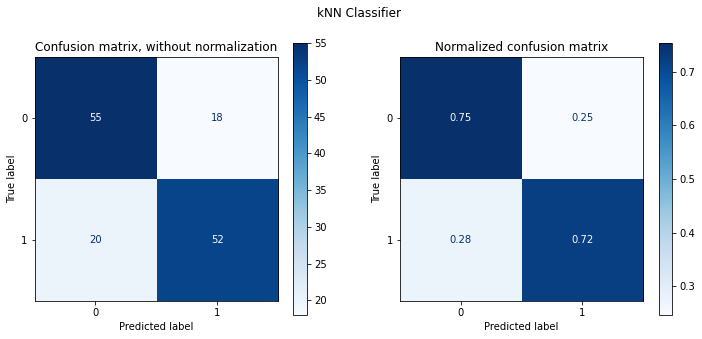

In [465]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [466]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
6,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.781884,0.726866,0.048013
7,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.781884,0.726866,0.048013
8,3,"{'C': 0.5, 'penalty': 'l2', 'solver': 'sag'}",0.784857,0.723837,0.051093
20,4,"{'C': 1, 'penalty': 'l2', 'solver': 'sag'}",0.784857,0.720852,0.052722
38,4,"{'C': 7, 'penalty': 'none', 'solver': 'sag'}",0.784855,0.720852,0.052722


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7241
Precision     : 0.7284
Recall        : 0.7236
F1 Score      : 0.7225
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.79      0.74        73
           1       0.76      0.65      0.70        72

    accuracy                           0.72       145
   macro avg       0.73      0.72      0.72       145
weighted avg       0.73      0.72      0.72       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


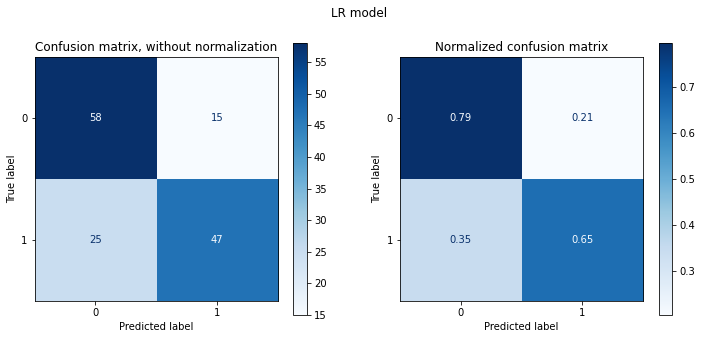

In [467]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [468]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
3,1,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.788575,0.771378,0.061856
10,2,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.882038,0.756497,0.062672
7,3,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}",0.767055,0.741747,0.066401
6,4,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.804155,0.741572,0.054641
0,5,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'linear'}",0.738122,0.735865,0.073551


-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7379
Precision     : 0.7379
Recall        : 0.7379
F1 Score      : 0.7379
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.74      0.74        73
           1       0.74      0.74      0.74        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


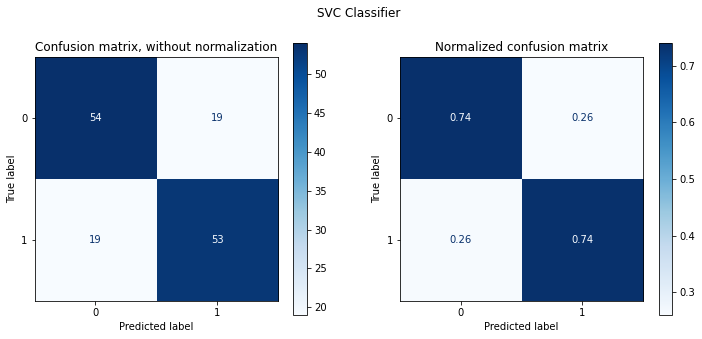

In [469]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [470]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
44,1,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 50}",0.889462,0.768437,0.050398
49,2,"{'max_depth': 9, 'min_samples_split': 5, 'n_estimators': 50}",0.967350,0.768393,0.055700
39,3,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 50}",0.915415,0.765452,0.057721
58,4,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 40}",0.896137,0.765408,0.054584
59,5,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 50}",0.897618,0.765408,0.062213


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7586
Precision     : 0.7647
Recall        : 0.7591
F1 Score      : 0.7575
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.68      0.74        73
           1       0.72      0.83      0.77        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


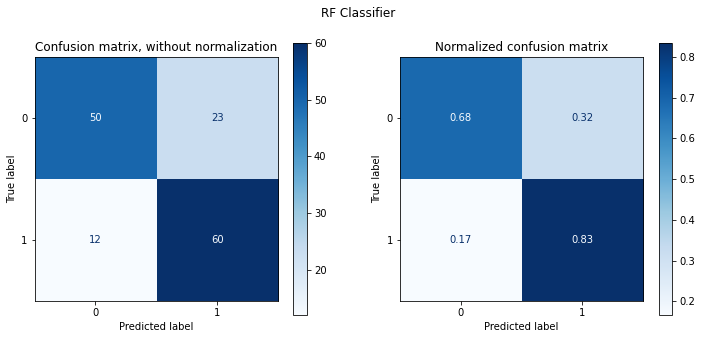

In [471]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [472]:
number = int(number_of_features/5)

Feature 0: 0.000000
Feature 1: 0.073409
Feature 2: 0.000000
Feature 3: 0.061877
Feature 4: 0.061257
Feature 5: 0.000000
Feature 6: 0.044290
Feature 7: 0.040208
Feature 8: 0.044238
Feature 9: 0.115239
Feature 10: 0.098954
Feature 11: 0.042414
Feature 12: 0.047771
Feature 13: 0.123761
Feature 14: 0.022401
Feature 15: 0.020560
Feature 16: 0.063330
Feature 17: 0.018201
Feature 18: 0.040647
Feature 19: 0.024715
Feature 20: 0.017635
Feature 21: 0.022207
Feature 22: 0.000000
Feature 23: 0.002538
Feature 24: 0.018294
Feature 25: 0.000000
Feature 26: 0.009381


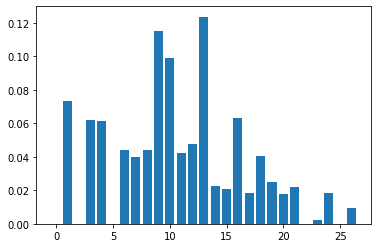

In [473]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7517
Precision     : 0.7535
Recall        : 0.7514
F1 Score      : 0.7511
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.79      0.76        73
           1       0.77      0.71      0.74        72

    accuracy                           0.75       145
   macro avg       0.75      0.75      0.75       145
weighted avg       0.75      0.75      0.75       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


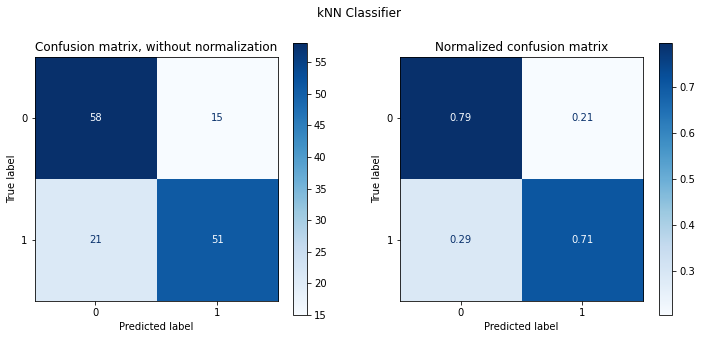

In [474]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7586
Precision     : 0.7599
Recall        : 0.7584
F1 Score      : 0.7582
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.79      0.77        73
           1       0.78      0.72      0.75        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


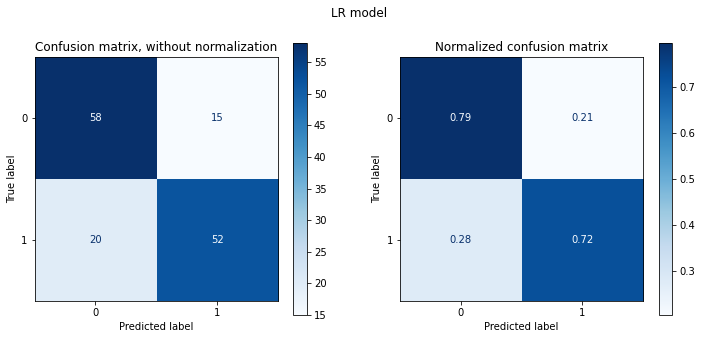

In [475]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7655
Precision     : 0.7657
Recall        : 0.7656
F1 Score      : 0.7655
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.75      0.76        73
           1       0.76      0.78      0.77        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


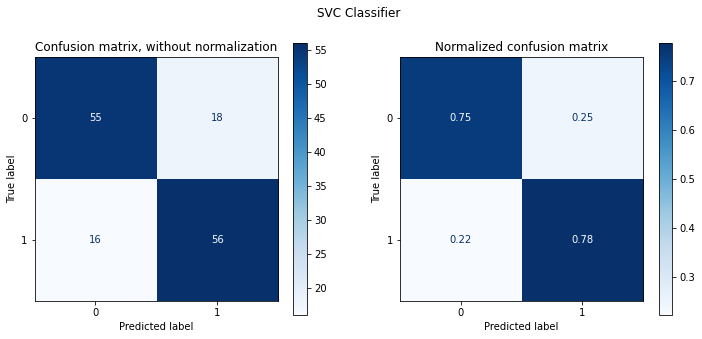

In [476]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7862
Precision     : 0.7888
Recall        : 0.7865
F1 Score      : 0.7858
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.82      0.74      0.78        73
           1       0.76      0.83      0.79        72

    accuracy                           0.79       145
   macro avg       0.79      0.79      0.79       145
weighted avg       0.79      0.79      0.79       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


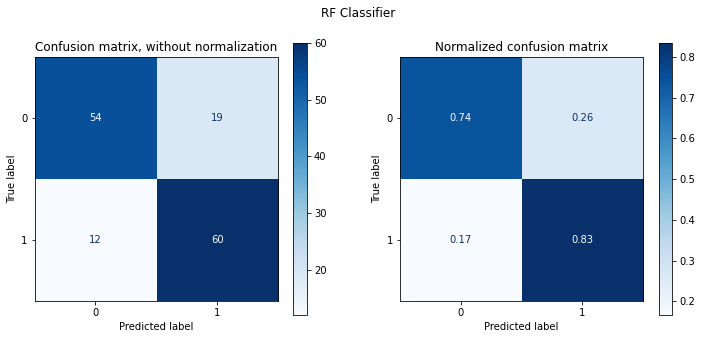

In [477]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [478]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

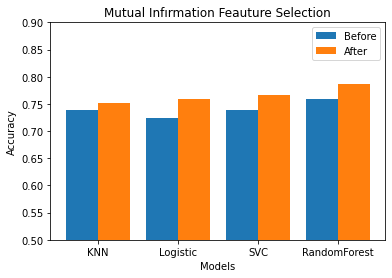

In [479]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 1.342369
Feature 1: 16.738514
Feature 2: 0.199986
Feature 3: 3.205232
Feature 4: 18.995364
Feature 5: 0.005037
Feature 6: 11.584945
Feature 7: 6.803980
Feature 8: 11.156437
Feature 9: 28.517719
Feature 10: 19.675601
Feature 11: 6.001463
Feature 12: 7.343073
Feature 13: 38.069811
Feature 14: 8.284755
Feature 15: 1.254384
Feature 16: 19.212523
Feature 17: 1.704904
Feature 18: 0.003785
Feature 19: 2.931008
Feature 20: 0.036318
Feature 21: 0.277158
Feature 22: 0.004449
Feature 23: 1.601906
Feature 24: 1.318111
Feature 25: 4.080489
Feature 26: 0.073067


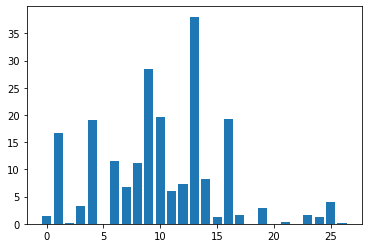

In [480]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7103
Precision     : 0.7117
Recall        : 0.7100
F1 Score      : 0.7097
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.75      0.72        73
           1       0.73      0.67      0.70        72

    accuracy                           0.71       145
   macro avg       0.71      0.71      0.71       145
weighted avg       0.71      0.71      0.71       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


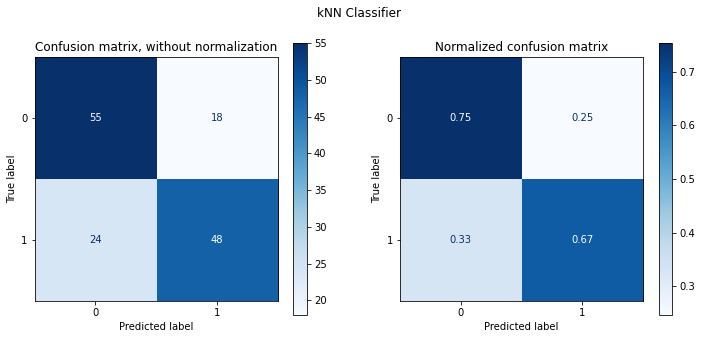

In [481]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7655
Precision     : 0.7663
Recall        : 0.7653
F1 Score      : 0.7652
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.79      0.77        73
           1       0.78      0.74      0.76        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


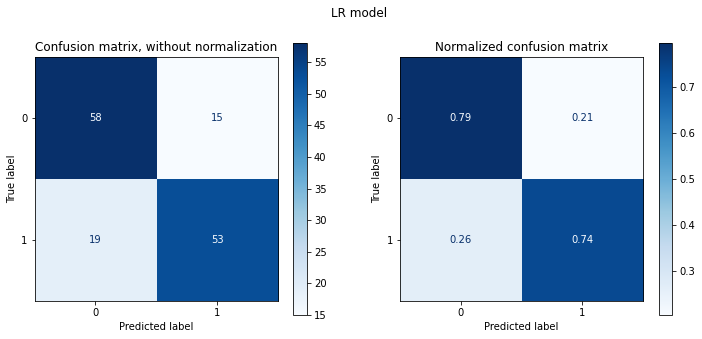

In [482]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7586
Precision     : 0.7587
Recall        : 0.7587
F1 Score      : 0.7586
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.75      0.76        73
           1       0.75      0.76      0.76        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


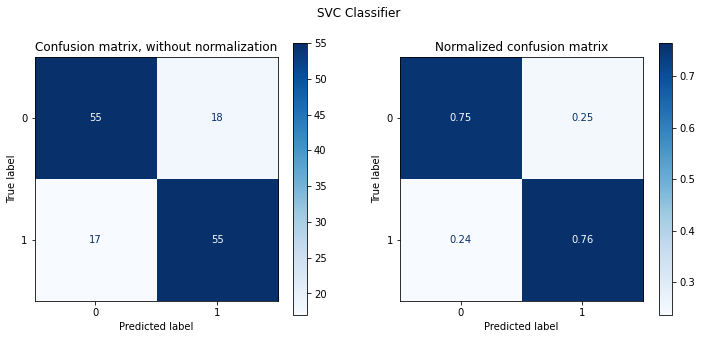

In [483]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7655
Precision     : 0.7657
Recall        : 0.7656
F1 Score      : 0.7655
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.75      0.76        73
           1       0.76      0.78      0.77        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


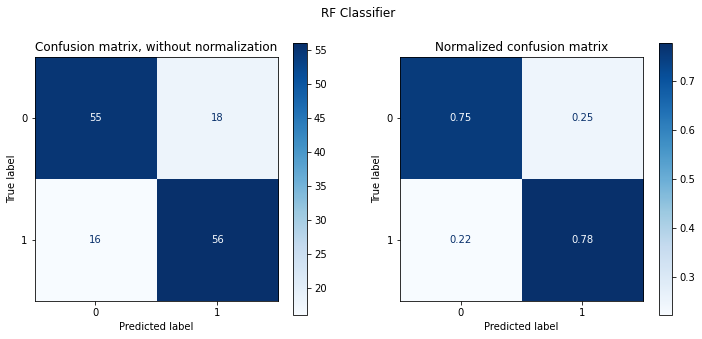

In [484]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [485]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

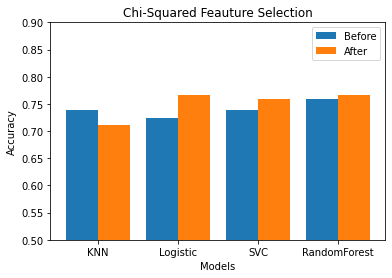

In [486]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['Mach1 ', 'Mach2 ', 'Mach3 ', 'Mach4 ', 'Mach5 ']


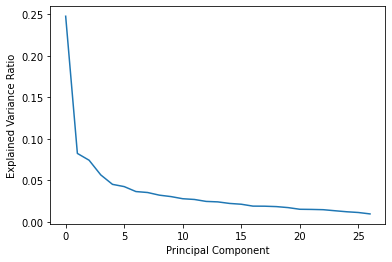

Highest loading features: ['Mach5 ', 'Psycho1 ', 'Mach2 ', 'Psycho5 H', 'Mach9 ']


In [487]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [488]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=8 
Mach2  selected =False rank=22 
Mach3  selected =False rank=15 
Mach4  selected =False rank=20 
Mach5  selected =False rank=6 
Mach6  selected =False rank=12 
Mach7  selected =False rank=2 
Mach8  selected =False rank=21 
Mach9  selected =True rank=1 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =True rank=1 
Psycho4  selected =False rank=10 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=14 
Psycho7  selected =False rank=13 
Psycho8  selected =False rank=18 
Psycho9  selected =False rank=5 
Narc1 selected =False rank=3 
Narc2  selected =False rank=19 
Narc3  selected =False rank=17 
Narc4  selected =False rank=11 
Narc5  selected =False rank=9 
Narc6 selected =False rank=23 
Narc7  selected =False rank=7 
Narc8  selected =False rank=4 
Narc9  selected =False rank=16 


In [489]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=23 
Mach2  selected =False rank=3 
Mach3  selected =True rank=1 
Mach4  selected =False rank=10 
Mach5  selected =False rank=16 
Mach6  selected =False rank=14 
Mach7  selected =True rank=1 
Mach8  selected =False rank=20 
Mach9  selected =False rank=7 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=5 
Psycho4  selected =False rank=17 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=21 
Psycho7  selected =False rank=15 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=6 
Narc1 selected =False rank=18 
Narc2  selected =False rank=12 
Narc3  selected =False rank=4 
Narc4  selected =False rank=22 
Narc5  selected =False rank=9 
Narc6 selected =False rank=13 
Narc7  selected =False rank=11 
Narc8  selected =False rank=8 
Narc9  selected =False rank=19 


In [490]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=23 
Mach2  selected =False rank=4 
Mach3  selected =True rank=1 
Mach4  selected =False rank=7 
Mach5  selected =False rank=16 
Mach6  selected =False rank=10 
Mach7  selected =True rank=1 
Mach8  selected =False rank=21 
Mach9  selected =False rank=9 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=3 
Psycho4  selected =False rank=17 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=22 
Psycho7  selected =False rank=15 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=5 
Narc1 selected =False rank=18 
Narc2  selected =False rank=14 
Narc3  selected =False rank=6 
Narc4  selected =False rank=20 
Narc5  selected =False rank=8 
Narc6 selected =False rank=13 
Narc7  selected =False rank=12 
Narc8  selected =False rank=11 
Narc9  selected =False rank=19 


In [491]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=22 
Mach2  selected =True rank=1 
Mach3  selected =False rank=16 
Mach4  selected =False rank=13 
Mach5  selected =True rank=1 
Mach6  selected =False rank=10 
Mach7  selected =False rank=2 
Mach8  selected =False rank=8 
Mach9  selected =False rank=3 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=21 
Psycho4  selected =False rank=14 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=9 
Psycho7  selected =False rank=18 
Psycho8  selected =False rank=6 
Psycho9  selected =False rank=11 
Narc1 selected =False rank=20 
Narc2  selected =False rank=19 
Narc3  selected =False rank=23 
Narc4  selected =False rank=15 
Narc5  selected =False rank=17 
Narc6 selected =False rank=4 
Narc7  selected =False rank=5 
Narc8  selected =False rank=7 
Narc9  selected =False rank=12 


In [492]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 78.62068965517241
[0.02486575 0.03884929 0.03109704 0.02891643 0.04662524 0.02824665
 0.05475055 0.04461345 0.05035059 0.06740034 0.07380512 0.02686446
 0.02954497 0.08648858 0.02758893 0.02891899 0.03738555 0.0314535
 0.02589485 0.02750816 0.02042976 0.02851161 0.02379657 0.02693174
 0.03131508 0.03110129 0.02674548]


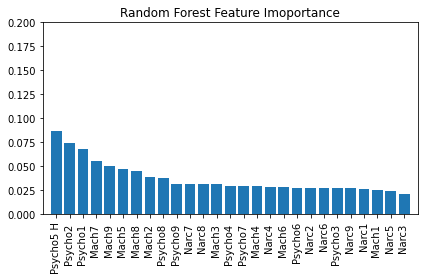

In [493]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [494]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [495]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

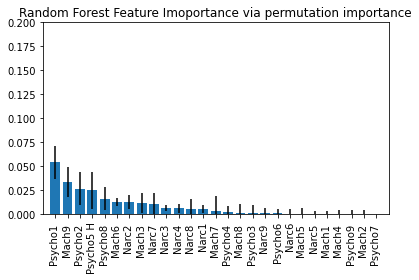

In [496]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [497]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['Mach3 ' 'Mach5 ' 'Mach7 ' 'Mach9 ' 'Psycho1 ' 'Psycho2 ' 'Psycho5 H'
 'Narc8 ']


Selected features with using Random Forest Classifier:
['Mach2 ' 'Mach5 ' 'Mach7 ' 'Mach9 ' 'Psycho1 ' 'Psycho2 ' 'Psycho5 H'
 'Psycho8 ']


Selected features with using Logistic Regression Classifier:
['Mach3 ' 'Mach4 ' 'Mach7 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 ' 'Psycho5 H'
 'Psycho8 ' 'Psycho9 ' 'Narc3 ' 'Narc5 ' 'Narc6' 'Narc8 ']


Selected features with using Linear Regression:
['Mach2 ' 'Mach3 ' 'Mach4 ' 'Mach7 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 '
 'Psycho5 H' 'Psycho8 ' 'Psycho9 ' 'Narc3 ' 'Narc8 ']


#IADQ# 

In [498]:
df = pd.read_csv("DT_df_CC.csv") # Creating the dataframe.
print(df)

     Mach1   Mach2   Mach3   Mach4   Mach5   Mach6   Mach7   Mach8   Mach9   \
0         3       3       2       4       4       3       3       3       4   
1         4       2       1       3       4       4       4       2       2   
2         4       1       3       3       3       1       4       1       5   
3         4       3       1       3       3       4       2       3       4   
4         3       2       1       2       2       3       3       2       3   
..      ...     ...     ...     ...     ...     ...     ...     ...     ...   
477       4       3       5       4       1       4       3       4       2   
478       4       1       1       4       1       4       4       1       3   
479       3       1       1       1       1       3       2       1       1   
480       4       2       2       2       3       4       3       2       2   
481       5       3       3       3       4       3       5       2       5   

     Psycho1   ...  Narc1  Narc2   Narc3   Narc4   

In [499]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [500]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,Mach1,Mach2,Mach3,Mach4,Mach5,Mach6,Mach7,Mach8,Mach9,Psycho1,...,Psycho9,Narc1,Narc2,Narc3,Narc4,Narc5,Narc6,Narc7,Narc8,Narc9
0,3,3,2,4,4,3,3,3,4,2,...,1,3,3,3,3,3,4,3,4,2
1,4,2,1,3,4,4,4,2,2,3,...,1,4,1,3,3,2,2,3,4,5
2,4,1,3,3,3,1,4,1,5,1,...,1,3,2,3,3,2,1,2,3,3
3,4,3,1,3,3,4,2,3,4,2,...,1,4,4,1,2,4,2,2,3,4
4,3,2,1,2,2,3,3,2,3,2,...,1,2,2,2,2,3,1,1,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,4,3,5,4,1,4,3,4,2,3,...,2,3,3,2,2,3,3,3,3,4
478,4,1,1,4,1,4,4,1,3,1,...,1,4,4,2,2,1,4,2,4,2
479,3,1,1,1,1,3,2,1,1,1,...,1,4,3,3,3,2,4,1,3,4
480,4,2,2,2,3,4,3,2,2,3,...,1,3,2,2,2,3,2,2,2,4


In [501]:
number_of_features = X.shape[1]
number_of_features

27

In [502]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
477    0
478    0
479    0
480    0
481    0
Name: CONDITION, Length: 482, dtype: object

In [503]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [504]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [505]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
109,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.0,0.744820,0.059647
55,2,"{'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735953,0.057327
175,3,"{'algorithm': 'kd_tree', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735909,0.066661
295,4,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 28, 'weights': 'distance'}",1.0,0.735821,0.067791
349,5,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",1.0,0.732880,0.054177


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7379
Precision     : 0.7381
Recall        : 0.7378
F1 Score      : 0.7378
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.75      0.74        73
           1       0.74      0.72      0.73        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


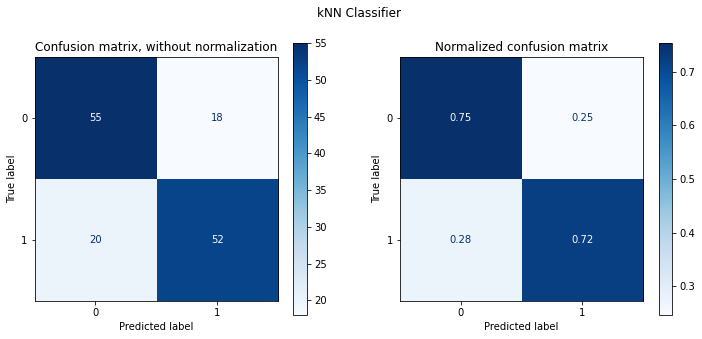

In [506]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [507]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
6,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.781884,0.726866,0.048013
7,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.781884,0.726866,0.048013
8,3,"{'C': 0.5, 'penalty': 'l2', 'solver': 'sag'}",0.784857,0.723837,0.051093
20,4,"{'C': 1, 'penalty': 'l2', 'solver': 'sag'}",0.784857,0.720852,0.052722
38,4,"{'C': 7, 'penalty': 'none', 'solver': 'sag'}",0.785598,0.720852,0.052722


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7241
Precision     : 0.7284
Recall        : 0.7236
F1 Score      : 0.7225
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.79      0.74        73
           1       0.76      0.65      0.70        72

    accuracy                           0.72       145
   macro avg       0.73      0.72      0.72       145
weighted avg       0.73      0.72      0.72       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


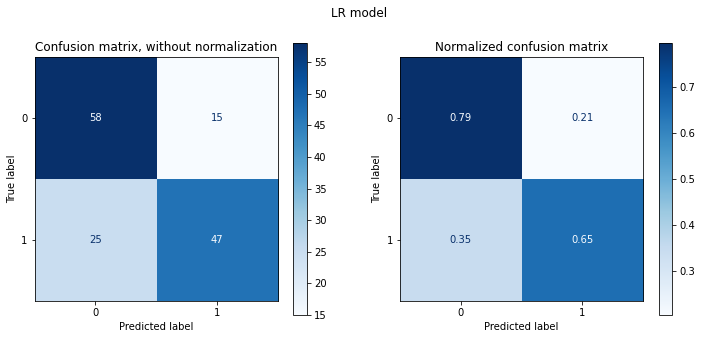

In [508]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [509]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
3,1,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.788575,0.771378,0.061856
10,2,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.882038,0.756497,0.062672
7,3,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}",0.767055,0.741747,0.066401
6,4,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'linear'}",0.804155,0.741572,0.054641
0,5,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'linear'}",0.738122,0.735865,0.073551


-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7379
Precision     : 0.7379
Recall        : 0.7379
F1 Score      : 0.7379
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.74      0.74        73
           1       0.74      0.74      0.74        72

    accuracy                           0.74       145
   macro avg       0.74      0.74      0.74       145
weighted avg       0.74      0.74      0.74       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


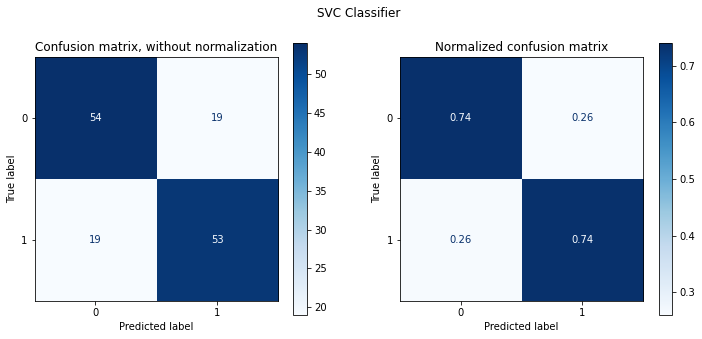

In [510]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [511]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
44,1,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 50}",0.889462,0.768437,0.050398
49,2,"{'max_depth': 9, 'min_samples_split': 5, 'n_estimators': 50}",0.967350,0.768393,0.055700
39,3,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 50}",0.915415,0.765452,0.057721
58,4,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 40}",0.896137,0.765408,0.054584
59,5,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 50}",0.897618,0.765408,0.062213


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7586
Precision     : 0.7647
Recall        : 0.7591
F1 Score      : 0.7575
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.68      0.74        73
           1       0.72      0.83      0.77        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


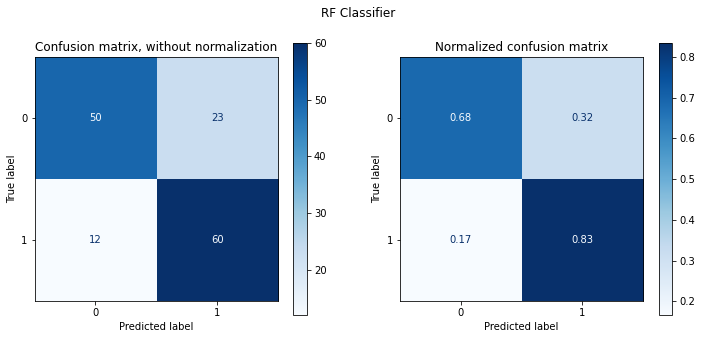

In [512]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [513]:
number = int(number_of_features/5)


Feature 0: 0.000000
Feature 1: 0.109533
Feature 2: 0.057777
Feature 3: 0.000000
Feature 4: 0.052513
Feature 5: 0.000000
Feature 6: 0.047976
Feature 7: 0.028609
Feature 8: 0.005879
Feature 9: 0.071747
Feature 10: 0.084932
Feature 11: 0.047910
Feature 12: 0.060994
Feature 13: 0.119461
Feature 14: 0.058191
Feature 15: 0.000000
Feature 16: 0.079702
Feature 17: 0.009012
Feature 18: 0.000000
Feature 19: 0.000000
Feature 20: 0.005756
Feature 21: 0.022044
Feature 22: 0.026338
Feature 23: 0.000000
Feature 24: 0.000000
Feature 25: 0.000000
Feature 26: 0.001015


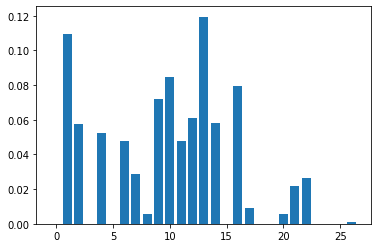

In [514]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7517
Precision     : 0.7535
Recall        : 0.7514
F1 Score      : 0.7511
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.73      0.79      0.76        73
           1       0.77      0.71      0.74        72

    accuracy                           0.75       145
   macro avg       0.75      0.75      0.75       145
weighted avg       0.75      0.75      0.75       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


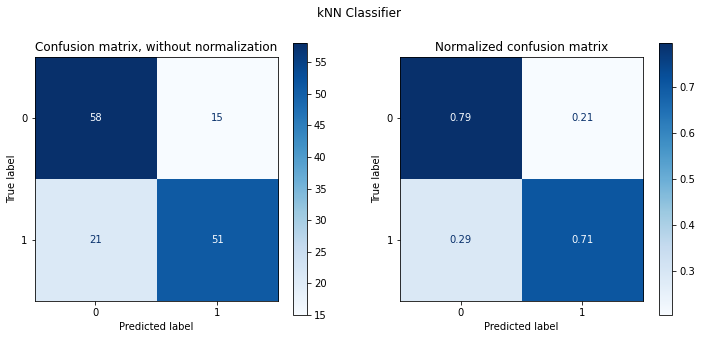

In [515]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7586
Precision     : 0.7599
Recall        : 0.7584
F1 Score      : 0.7582
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.79      0.77        73
           1       0.78      0.72      0.75        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


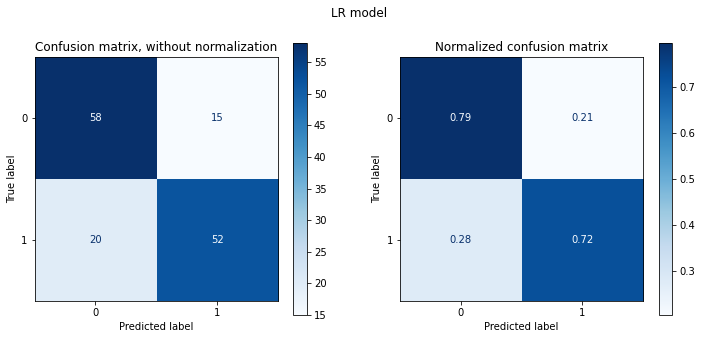

In [516]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7655
Precision     : 0.7657
Recall        : 0.7656
F1 Score      : 0.7655
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.75      0.76        73
           1       0.76      0.78      0.77        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


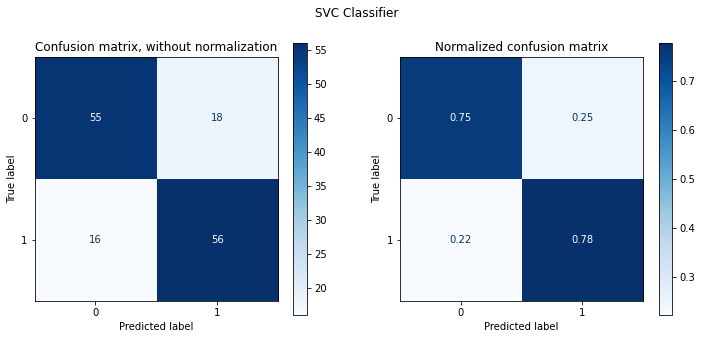

In [517]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier ')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7862
Precision     : 0.7888
Recall        : 0.7865
F1 Score      : 0.7858
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.82      0.74      0.78        73
           1       0.76      0.83      0.79        72

    accuracy                           0.79       145
   macro avg       0.79      0.79      0.79       145
weighted avg       0.79      0.79      0.79       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


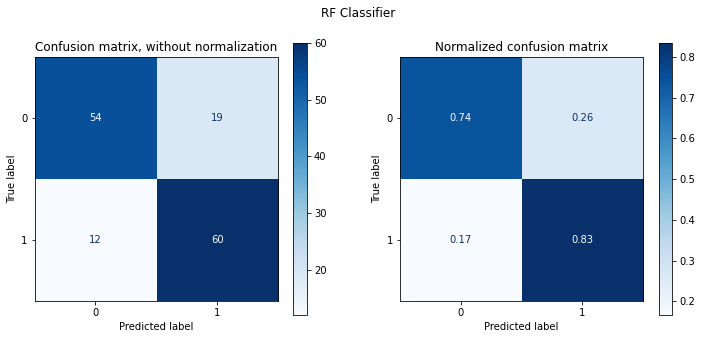

In [518]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [519]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

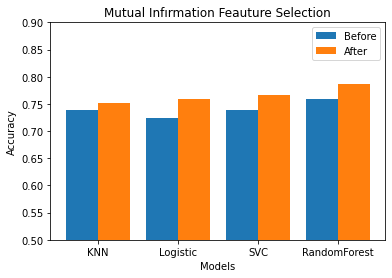

In [520]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 1.342369
Feature 1: 16.738514
Feature 2: 0.199986
Feature 3: 3.205232
Feature 4: 18.995364
Feature 5: 0.005037
Feature 6: 11.584945
Feature 7: 6.803980
Feature 8: 11.156437
Feature 9: 28.517719
Feature 10: 19.675601
Feature 11: 6.001463
Feature 12: 7.343073
Feature 13: 38.069811
Feature 14: 8.284755
Feature 15: 1.254384
Feature 16: 19.212523
Feature 17: 1.704904
Feature 18: 0.003785
Feature 19: 2.931008
Feature 20: 0.036318
Feature 21: 0.277158
Feature 22: 0.004449
Feature 23: 1.601906
Feature 24: 1.318111
Feature 25: 4.080489
Feature 26: 0.073067


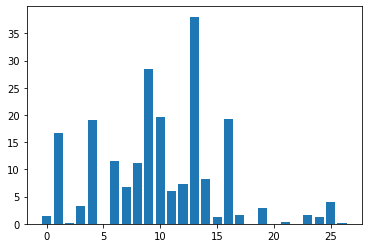

In [521]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7103
Precision     : 0.7117
Recall        : 0.7100
F1 Score      : 0.7097
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.75      0.72        73
           1       0.73      0.67      0.70        72

    accuracy                           0.71       145
   macro avg       0.71      0.71      0.71       145
weighted avg       0.71      0.71      0.71       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


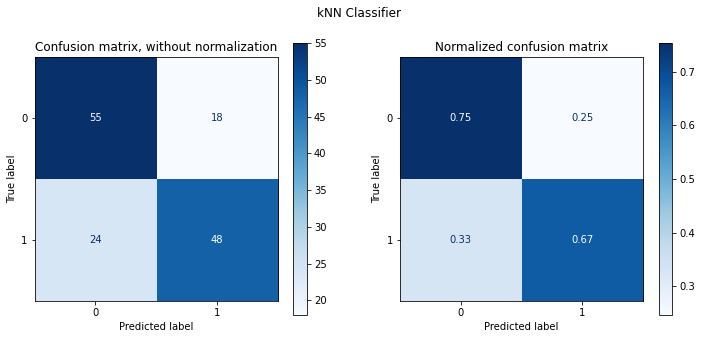

In [522]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7655
Precision     : 0.7663
Recall        : 0.7653
F1 Score      : 0.7652
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.79      0.77        73
           1       0.78      0.74      0.76        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


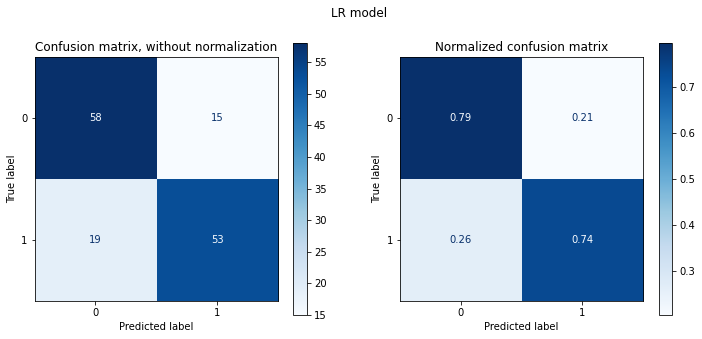

In [523]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7586
Precision     : 0.7587
Recall        : 0.7587
F1 Score      : 0.7586
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.75      0.76        73
           1       0.75      0.76      0.76        72

    accuracy                           0.76       145
   macro avg       0.76      0.76      0.76       145
weighted avg       0.76      0.76      0.76       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


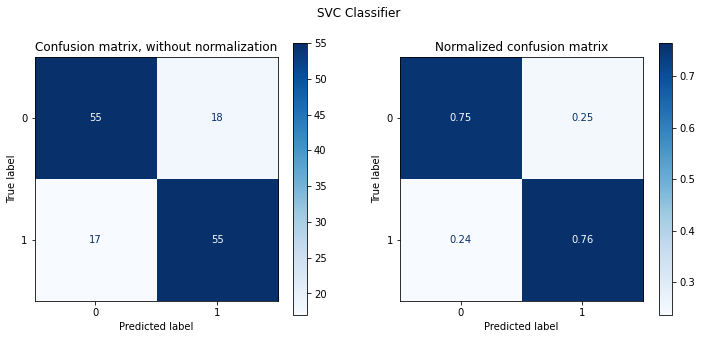

In [524]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=13,
                       n_estimators=50, random_state=123)
Test Accuracy : 0.7655
Precision     : 0.7657
Recall        : 0.7656
F1 Score      : 0.7655
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.75      0.76        73
           1       0.76      0.78      0.77        72

    accuracy                           0.77       145
   macro avg       0.77      0.77      0.77       145
weighted avg       0.77      0.77      0.77       145



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


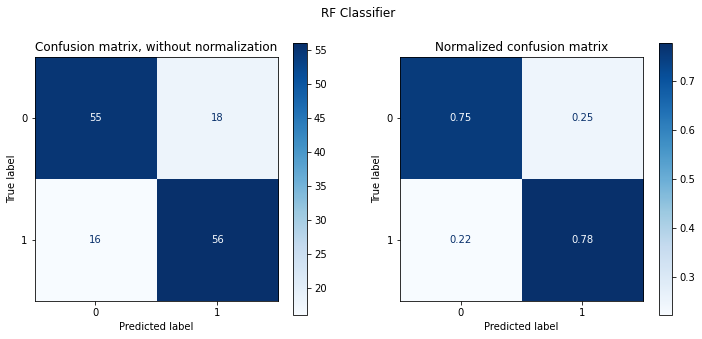

In [525]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [526]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

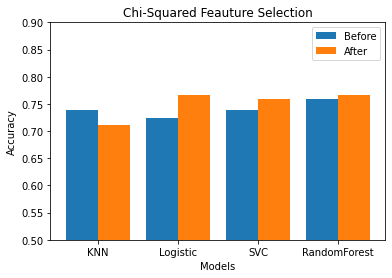

In [527]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['Mach1 ', 'Mach2 ', 'Mach3 ', 'Mach4 ', 'Mach5 ']


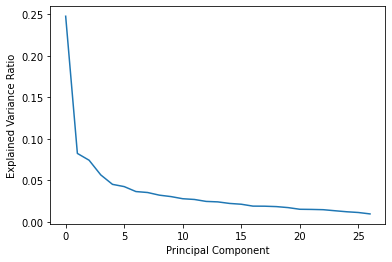

Highest loading features: ['Mach5 ', 'Psycho1 ', 'Mach2 ', 'Psycho5 H', 'Mach9 ']


In [528]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [529]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=6 
Mach2  selected =False rank=22 
Mach3  selected =False rank=2 
Mach4  selected =False rank=20 
Mach5  selected =False rank=10 
Mach6  selected =False rank=3 
Mach7  selected =False rank=5 
Mach8  selected =False rank=23 
Mach9  selected =True rank=1 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =True rank=1 
Psycho4  selected =False rank=12 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=14 
Psycho7  selected =False rank=7 
Psycho8  selected =False rank=15 
Psycho9  selected =False rank=8 
Narc1 selected =False rank=17 
Narc2  selected =False rank=19 
Narc3  selected =False rank=18 
Narc4  selected =False rank=13 
Narc5  selected =False rank=16 
Narc6 selected =False rank=4 
Narc7  selected =False rank=9 
Narc8  selected =False rank=11 
Narc9  selected =False rank=21 


In [530]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=23 
Mach2  selected =False rank=3 
Mach3  selected =True rank=1 
Mach4  selected =False rank=10 
Mach5  selected =False rank=16 
Mach6  selected =False rank=14 
Mach7  selected =True rank=1 
Mach8  selected =False rank=20 
Mach9  selected =False rank=7 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=5 
Psycho4  selected =False rank=17 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=21 
Psycho7  selected =False rank=15 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=6 
Narc1 selected =False rank=18 
Narc2  selected =False rank=12 
Narc3  selected =False rank=4 
Narc4  selected =False rank=22 
Narc5  selected =False rank=9 
Narc6 selected =False rank=13 
Narc7  selected =False rank=11 
Narc8  selected =False rank=8 
Narc9  selected =False rank=19 


In [531]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=23 
Mach2  selected =False rank=4 
Mach3  selected =True rank=1 
Mach4  selected =False rank=7 
Mach5  selected =False rank=16 
Mach6  selected =False rank=10 
Mach7  selected =True rank=1 
Mach8  selected =False rank=21 
Mach9  selected =False rank=9 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=3 
Psycho4  selected =False rank=17 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=22 
Psycho7  selected =False rank=15 
Psycho8  selected =False rank=2 
Psycho9  selected =False rank=5 
Narc1 selected =False rank=18 
Narc2  selected =False rank=14 
Narc3  selected =False rank=6 
Narc4  selected =False rank=20 
Narc5  selected =False rank=8 
Narc6 selected =False rank=13 
Narc7  selected =False rank=12 
Narc8  selected =False rank=11 
Narc9  selected =False rank=19 


In [532]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

Mach1  selected =False rank=21 
Mach2  selected =False rank=3 
Mach3  selected =False rank=10 
Mach4  selected =False rank=12 
Mach5  selected =True rank=1 
Mach6  selected =False rank=19 
Mach7  selected =True rank=1 
Mach8  selected =False rank=14 
Mach9  selected =False rank=4 
Psycho1  selected =True rank=1 
Psycho2  selected =True rank=1 
Psycho3  selected =False rank=13 
Psycho4  selected =False rank=16 
Psycho5 H selected =True rank=1 
Psycho6 selected =False rank=9 
Psycho7  selected =False rank=17 
Psycho8  selected =False rank=6 
Psycho9  selected =False rank=8 
Narc1 selected =False rank=15 
Narc2  selected =False rank=22 
Narc3  selected =False rank=23 
Narc4  selected =False rank=18 
Narc5  selected =False rank=20 
Narc6 selected =False rank=7 
Narc7  selected =False rank=2 
Narc8  selected =False rank=5 
Narc9  selected =False rank=11 


In [533]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 78.62068965517241
[0.02486575 0.03884929 0.03109704 0.02891643 0.04662524 0.02824665
 0.05475055 0.04461345 0.05035059 0.06740034 0.07380512 0.02686446
 0.02954497 0.08648858 0.02758893 0.02891899 0.03738555 0.0314535
 0.02589485 0.02750816 0.02042976 0.02851161 0.02379657 0.02693174
 0.03131508 0.03110129 0.02674548]


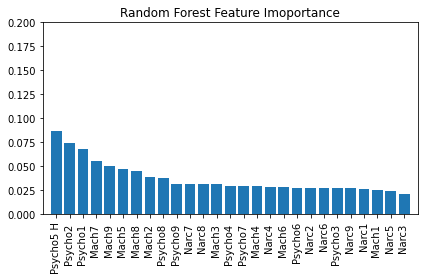

In [534]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [535]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [536]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

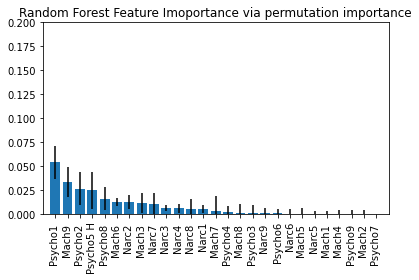

In [537]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [538]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['Mach1 ' 'Mach5 ' 'Mach9 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 ' 'Psycho5 H']


Selected features with using Random Forest Classifier:
['Mach2 ' 'Mach5 ' 'Mach7 ' 'Mach9 ' 'Psycho1 ' 'Psycho2 ' 'Psycho5 H'
 'Psycho8 ']


Selected features with using Logistic Regression Classifier:
['Mach3 ' 'Mach4 ' 'Mach7 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 ' 'Psycho5 H'
 'Psycho8 ' 'Psycho9 ' 'Narc3 ' 'Narc5 ' 'Narc6' 'Narc8 ']


Selected features with using Linear Regression:
['Mach2 ' 'Mach3 ' 'Mach4 ' 'Mach7 ' 'Psycho1 ' 'Psycho2 ' 'Psycho3 '
 'Psycho5 H' 'Psycho8 ' 'Psycho9 ' 'Narc3 ' 'Narc8 ']


#BF(CTU)# 


In [539]:
df = pd.read_csv("BF_df_CTU.csv") # Creating the dataframe.
print(df)

     EX1G  EX2G  A1G  A2G  C1G  C2G  ES1G  ES2G  O1G  O2G CONDITION
0       4     4    4    4    4    5     4     4    4    4         H
1       4     2    2    4    4    5     3     4    4    4         H
2       4     2    2    4    4    4     3     4    4    4         H
3       4     2    2    4    2    4     5     5    4    2         H
4       3     2    3    4    5    5     4     4    5    5         H
..    ...   ...  ...  ...  ...  ...   ...   ...  ...  ...       ...
437     4     1    3    3    5    5     3     4    4    4         D
438     4     2    4    4    5    4     5     4    2    4         D
439     4     2    4    4    5    5     4     4    4    5         D
440     4     2    3    4    5    5     5     4    4    4         D
441     5     1    4    3    5    5     5     5    5    4         D

[442 rows x 11 columns]


In [540]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [541]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,EX1G,EX2G,A1G,A2G,C1G,C2G,ES1G,ES2G,O1G,O2G
0,4,4,4,4,4,5,4,4,4,4
1,4,2,2,4,4,5,3,4,4,4
2,4,2,2,4,4,4,3,4,4,4
3,4,2,2,4,2,4,5,5,4,2
4,3,2,3,4,5,5,4,4,5,5
...,...,...,...,...,...,...,...,...,...,...
437,4,1,3,3,5,5,3,4,4,4
438,4,2,4,4,5,4,5,4,2,4
439,4,2,4,4,5,5,4,4,4,5
440,4,2,3,4,5,5,5,4,4,4


In [542]:
number_of_features = X.shape[1]
number_of_features

10

In [543]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
437    0
438    0
439    0
440    0
441    0
Name: CONDITION, Length: 442, dtype: object

In [544]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [545]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [546]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
316,1,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'uniform'}",0.836581,0.831835,0.029375
23,2,"{'algorithm': 'ball_tree', 'metric': 'euclidean', 'n_neighbors': 12, 'weights': 'distance'}",0.989483,0.831729,0.029819
79,3,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'distance'}",0.989483,0.828556,0.023645
317,3,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}",0.989483,0.828556,0.029517
88,3,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'uniform'}",0.816358,0.828556,0.018734


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='manhattan', n_neighbors=9)
Test Accuracy : 0.8722
Precision     : 0.8789
Recall        : 0.8727
F1 Score      : 0.8717
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.83      0.94      0.88        66
           1       0.93      0.81      0.86        67

    accuracy                           0.87       133
   macro avg       0.88      0.87      0.87       133
weighted avg       0.88      0.87      0.87       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


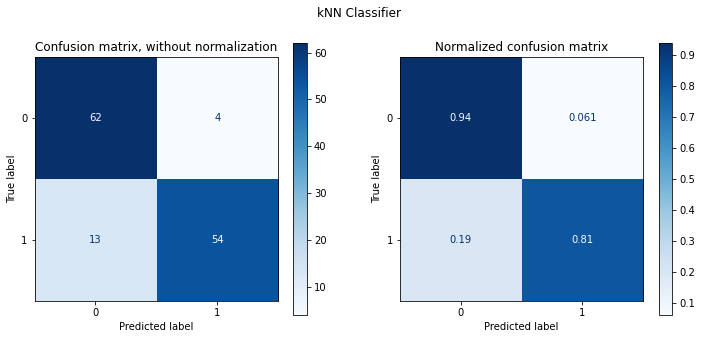

In [547]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [548]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
6,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.813102,0.789741,0.022003
7,1,"{'C': 0.5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.813102,0.789741,0.022003
0,3,"{'C': 0.5, 'penalty': 'none', 'solver': 'newton-cg'}",0.811489,0.783236,0.023573
25,3,"{'C': 5, 'penalty': 'none', 'solver': 'lbfgs'}",0.811489,0.783236,0.023573
24,3,"{'C': 5, 'penalty': 'none', 'solver': 'newton-cg'}",0.811489,0.783236,0.023573


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.8797
Precision     : 0.8826
Recall        : 0.8800
F1 Score      : 0.8795
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.92      0.88        66
           1       0.92      0.84      0.88        67

    accuracy                           0.88       133
   macro avg       0.88      0.88      0.88       133
weighted avg       0.88      0.88      0.88       133



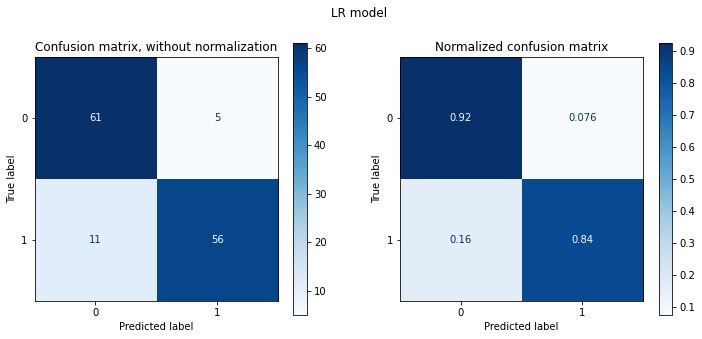

In [549]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [550]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
10,1,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.900493,0.831729,0.021748
8,2,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'poly'}",0.906158,0.822158,0.034763
7,3,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}",0.842236,0.822105,0.026431
3,4,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.821190,0.822052,0.024666
2,5,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'poly'}",0.828487,0.815653,0.032666


-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.8722
Precision     : 0.8728
Recall        : 0.8723
F1 Score      : 0.8722
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.89      0.87        66
           1       0.89      0.85      0.87        67

    accuracy                           0.87       133
   macro avg       0.87      0.87      0.87       133
weighted avg       0.87      0.87      0.87       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


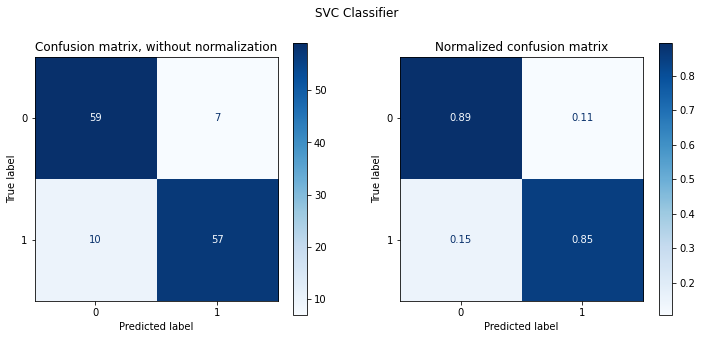

In [551]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier ')
update_summary(SCV1, clf_results)

In [552]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
36,1,"{'max_depth': 7, 'min_samples_split': 9, 'n_estimators': 20}",0.894818,0.831835,0.027546
59,2,"{'max_depth': 9, 'min_samples_split': 13, 'n_estimators': 50}",0.880260,0.831782,0.018815
52,2,"{'max_depth': 9, 'min_samples_split': 9, 'n_estimators': 30}",0.894015,0.831782,0.021403
41,2,"{'max_depth': 7, 'min_samples_split': 13, 'n_estimators': 20}",0.880257,0.831782,0.018815
15,5,"{'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 10}",0.887541,0.828662,0.041048


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=9,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.8346
Precision     : 0.8348
Recall        : 0.8347
F1 Score      : 0.8346
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.82      0.85      0.84        66
           1       0.85      0.82      0.83        67

    accuracy                           0.83       133
   macro avg       0.83      0.83      0.83       133
weighted avg       0.83      0.83      0.83       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


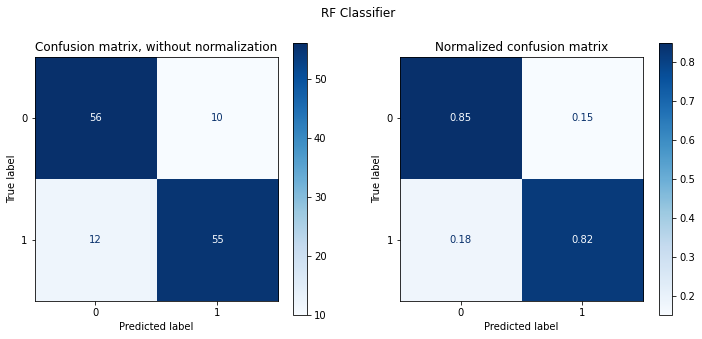

In [553]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [554]:
number = int(number_of_features/5)

Feature 0: 0.085692
Feature 1: 0.005642
Feature 2: 0.115049
Feature 3: 0.054549
Feature 4: 0.128530
Feature 5: 0.000000
Feature 6: 0.169678
Feature 7: 0.206179
Feature 8: 0.000000
Feature 9: 0.030693


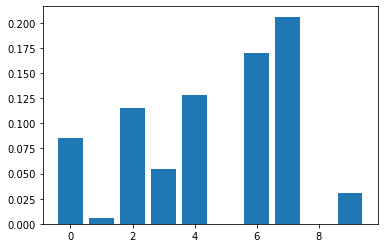

In [555]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='manhattan', n_neighbors=9)
Test Accuracy : 0.7594
Precision     : 0.7596
Recall        : 0.7595
F1 Score      : 0.7594
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.77      0.76        66
           1       0.77      0.75      0.76        67

    accuracy                           0.76       133
   macro avg       0.76      0.76      0.76       133
weighted avg       0.76      0.76      0.76       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


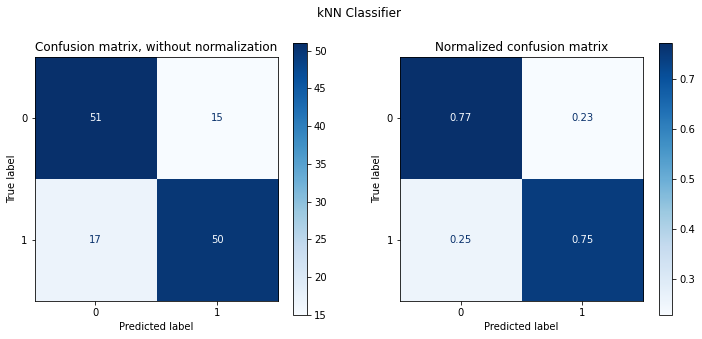

In [556]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7820
Precision     : 0.7898
Recall        : 0.7826
F1 Score      : 0.7807
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.86      0.80        66
           1       0.84      0.70      0.76        67

    accuracy                           0.78       133
   macro avg       0.79      0.78      0.78       133
weighted avg       0.79      0.78      0.78       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


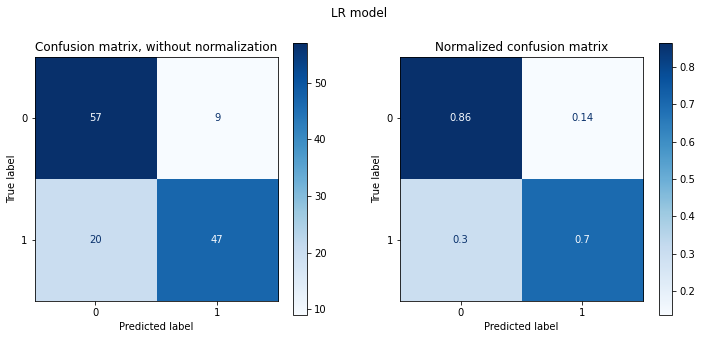

In [557]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.8120
Precision     : 0.8242
Recall        : 0.8128
F1 Score      : 0.8105
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.91      0.83        66
           1       0.89      0.72      0.79        67

    accuracy                           0.81       133
   macro avg       0.82      0.81      0.81       133
weighted avg       0.82      0.81      0.81       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


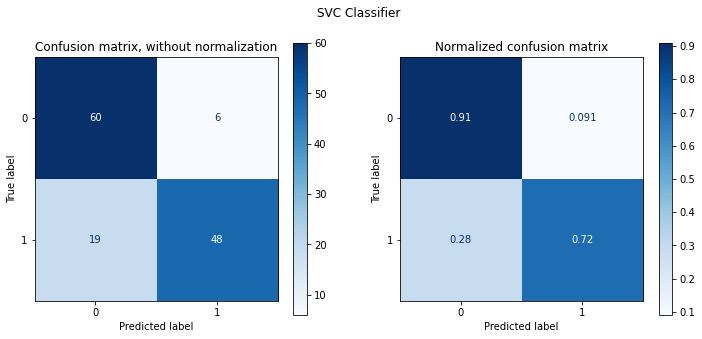

In [558]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=9,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.8045
Precision     : 0.8184
Recall        : 0.8053
F1 Score      : 0.8026
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.91      0.82        66
           1       0.89      0.70      0.78        67

    accuracy                           0.80       133
   macro avg       0.82      0.81      0.80       133
weighted avg       0.82      0.80      0.80       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


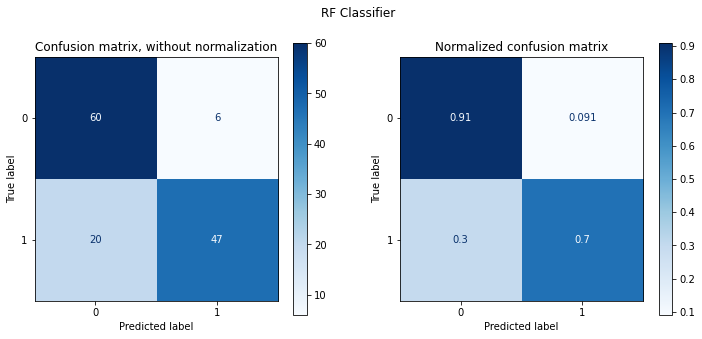

In [559]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [560]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

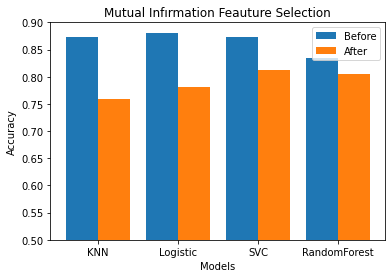

In [561]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 6.131881
Feature 1: 1.207533
Feature 2: 19.444760
Feature 3: 1.087838
Feature 4: 23.184649
Feature 5: 0.014298
Feature 6: 37.033069
Feature 7: 31.435585
Feature 8: 0.547299
Feature 9: 6.815185


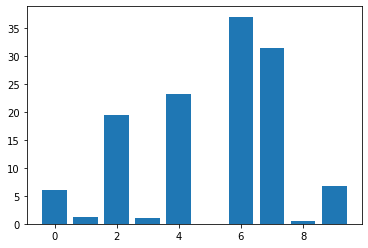

In [562]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='brute', metric='manhattan', n_neighbors=9)
Test Accuracy : 0.7594
Precision     : 0.7596
Recall        : 0.7595
F1 Score      : 0.7594
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.77      0.76        66
           1       0.77      0.75      0.76        67

    accuracy                           0.76       133
   macro avg       0.76      0.76      0.76       133
weighted avg       0.76      0.76      0.76       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


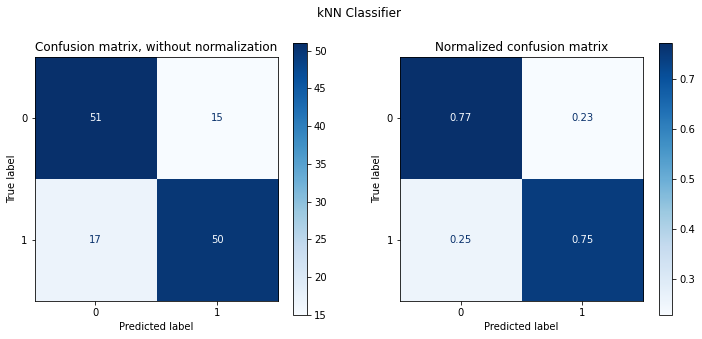

In [563]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, solver='newton-cg')
Test Accuracy : 0.7820
Precision     : 0.7898
Recall        : 0.7826
F1 Score      : 0.7807
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.74      0.86      0.80        66
           1       0.84      0.70      0.76        67

    accuracy                           0.78       133
   macro avg       0.79      0.78      0.78       133
weighted avg       0.79      0.78      0.78       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


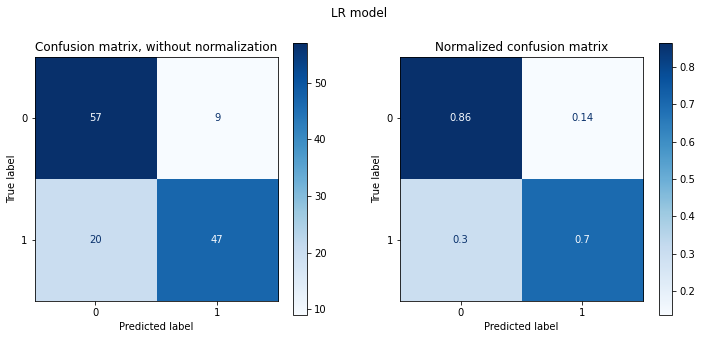

In [564]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=1, gamma='auto', probability=True, random_state=42)
Test Accuracy : 0.8120
Precision     : 0.8242
Recall        : 0.8128
F1 Score      : 0.8105
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.91      0.83        66
           1       0.89      0.72      0.79        67

    accuracy                           0.81       133
   macro avg       0.82      0.81      0.81       133
weighted avg       0.82      0.81      0.81       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


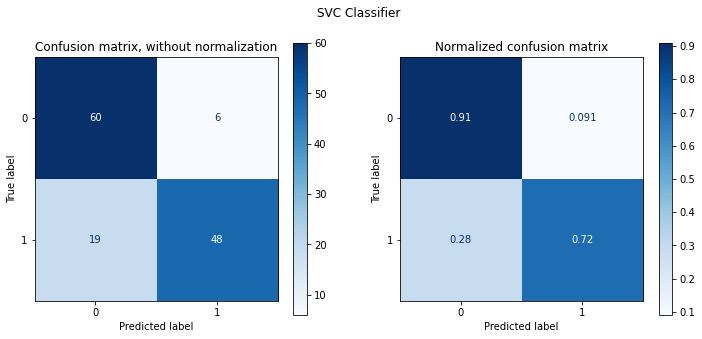

In [565]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=9,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.8045
Precision     : 0.8184
Recall        : 0.8053
F1 Score      : 0.8026
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.91      0.82        66
           1       0.89      0.70      0.78        67

    accuracy                           0.80       133
   macro avg       0.82      0.81      0.80       133
weighted avg       0.82      0.80      0.80       133



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


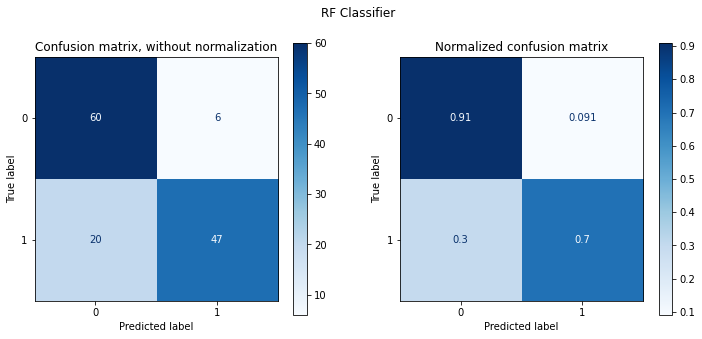

In [566]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [567]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

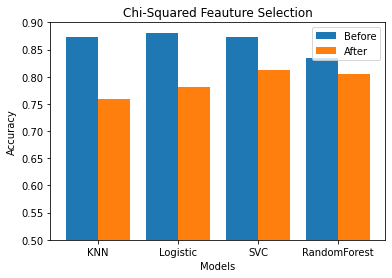

In [568]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['EX1G', 'EX2G', 'A1G', 'A2G', 'C1G']


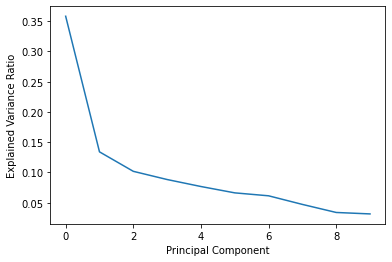

Highest loading features: ['EX2G', 'O1G', 'C2G', 'A2G', 'EX1G']


In [569]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [570]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=7 
EX2G selected =False rank=4 
A1G selected =False rank=2 
A2G selected =False rank=9 
C1G selected =True rank=1 
C2G selected =False rank=8 
ES1G selected =True rank=1 
ES2G selected =False rank=6 
O1G selected =False rank=5 
O2G selected =False rank=3 


In [571]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=6 
EX2G selected =False rank=9 
A1G selected =False rank=2 
A2G selected =False rank=5 
C1G selected =True rank=1 
C2G selected =False rank=3 
ES1G selected =False rank=4 
ES2G selected =True rank=1 
O1G selected =False rank=7 
O2G selected =False rank=8 


In [572]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=6 
EX2G selected =False rank=9 
A1G selected =False rank=3 
A2G selected =False rank=5 
C1G selected =True rank=1 
C2G selected =False rank=2 
ES1G selected =False rank=4 
ES2G selected =True rank=1 
O1G selected =False rank=7 
O2G selected =False rank=8 


In [573]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=5 
EX2G selected =False rank=8 
A1G selected =False rank=3 
A2G selected =False rank=7 
C1G selected =True rank=1 
C2G selected =False rank=9 
ES1G selected =True rank=1 
ES2G selected =False rank=2 
O1G selected =False rank=6 
O2G selected =False rank=4 


In [574]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 98.70550161812298
Test accuracy: 83.45864661654136
[0.06896838 0.05423696 0.128015   0.05656709 0.1272655  0.04721225
 0.19213954 0.16134492 0.0674858  0.09676455]


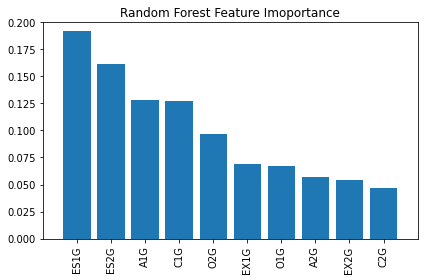

In [575]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [576]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [577]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

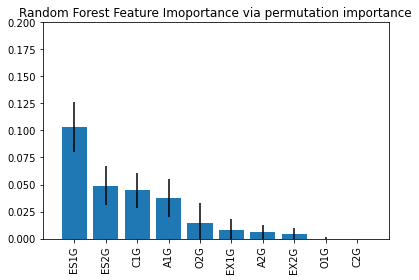

In [578]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [579]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['C1G' 'ES1G']


Selected features with using Random Forest Classifier:
['A1G' 'C1G' 'ES1G' 'ES2G']


Selected features with using Logistic Regression Classifier:
['A1G' 'C1G' 'C2G' 'ES1G' 'ES2G']


Selected features with using Linear Regression:
['A1G' 'C1G' 'C2G' 'ES1G' 'ES2G']


#BF(OU)# 


In [580]:
df = pd.read_csv("BF_df_OU.csv") # Creating the dataframe.
print(df)

     EX1G  EX2G  A1G  A2G  C1G  C2G  ES1G  ES2G  O1G  O2G CONDITION
0       3     2    3    3    4    4     2     3    3    3         H
1       4     4    4    4    5    5     4     4    4    4         H
2       4     2    2    4    4    5     3     4    4    4         H
3       4     3    2    4    4    4     3     4    4    4         H
4       5     3    3    1    5    5     3     1    3    3         H
..    ...   ...  ...  ...  ...  ...   ...   ...  ...  ...       ...
455     5     1    5    4    5    5     5     4    5    4         D
456     5     4    5    5    4    5     4     4    5    4         D
457     5     5    5    5    5    5     4     3    5    5         D
458     5     1    3    5    5    5     5     5    5    5         D
459     5     1    1    5    5    5     5     5    5    4         D

[460 rows x 11 columns]


In [581]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [582]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,EX1G,EX2G,A1G,A2G,C1G,C2G,ES1G,ES2G,O1G,O2G
0,3,2,3,3,4,4,2,3,3,3
1,4,4,4,4,5,5,4,4,4,4
2,4,2,2,4,4,5,3,4,4,4
3,4,3,2,4,4,4,3,4,4,4
4,5,3,3,1,5,5,3,1,3,3
...,...,...,...,...,...,...,...,...,...,...
455,5,1,5,4,5,5,5,4,5,4
456,5,4,5,5,4,5,4,4,5,4
457,5,5,5,5,5,5,4,3,5,5
458,5,1,3,5,5,5,5,5,5,5


In [583]:
number_of_features = X.shape[1]
number_of_features

10

In [584]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
455    0
456    0
457    0
458    0
459    0
Name: CONDITION, Length: 460, dtype: object

In [585]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [586]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [587]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
357,1,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 29, 'weights': 'distance'}",0.994568,0.832163,0.050002
356,1,"{'algorithm': 'brute', 'metric': 'manhattan', 'n_neighbors': 29, 'weights': 'uniform'}",0.833086,0.832163,0.050002
109,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 25, 'weights': 'distance'}",0.994568,0.832163,0.054776
233,1,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 27, 'weights': 'distance'}",0.994568,0.832163,0.060696
235,5,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 28, 'weights': 'distance'}",0.994568,0.832115,0.054833


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.8261
Precision     : 0.8271
Recall        : 0.8238
F1 Score      : 0.8248
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.78      0.81        65
           1       0.82      0.86      0.84        73

    accuracy                           0.83       138
   macro avg       0.83      0.82      0.82       138
weighted avg       0.83      0.83      0.83       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


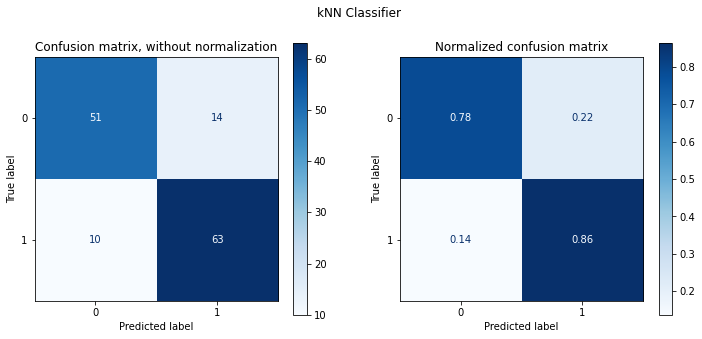

In [588]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [589]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
0,1,"{'C': 0.5, 'penalty': 'none', 'solver': 'newton-cg'}",0.847046,0.798221,0.06673
54,1,"{'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}",0.847046,0.798221,0.06673
31,1,"{'C': 5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.846270,0.798221,0.06673
30,1,"{'C': 5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.846270,0.798221,0.06673
55,1,"{'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}",0.847046,0.798221,0.06673


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='newton-cg')
Test Accuracy : 0.8261
Precision     : 0.8271
Recall        : 0.8238
F1 Score      : 0.8248
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.78      0.81        65
           1       0.82      0.86      0.84        73

    accuracy                           0.83       138
   macro avg       0.83      0.82      0.82       138
weighted avg       0.83      0.83      0.83       138



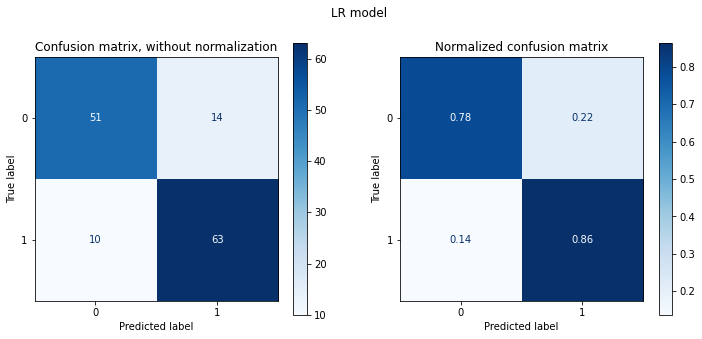

In [590]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [591]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
3,1,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.843939,0.841394,0.066165
10,2,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.906850,0.816683,0.043814
7,3,"{'C': 0.1, 'gamma': 'auto', 'kernel': 'rbf'}",0.835393,0.813413,0.065354
0,4,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'linear'}",0.816765,0.810385,0.070980
2,5,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'poly'}",0.840844,0.807404,0.051011


-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7971
Precision     : 0.7992
Recall        : 0.7939
F1 Score      : 0.7950
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.81      0.74      0.77        65
           1       0.78      0.85      0.82        73

    accuracy                           0.80       138
   macro avg       0.80      0.79      0.79       138
weighted avg       0.80      0.80      0.80       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


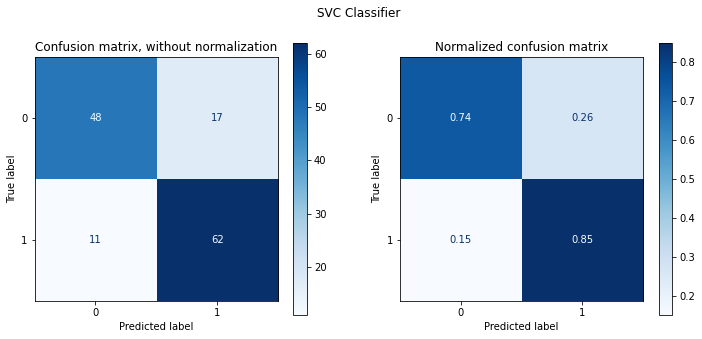

In [592]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [593]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
16,1,"{'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 20}",0.894417,0.850913,0.037804
24,2,"{'max_depth': 5, 'min_samples_split': 9, 'n_estimators': 50}",0.891298,0.847837,0.046689
47,3,"{'max_depth': 9, 'min_samples_split': 5, 'n_estimators': 30}",0.947202,0.847788,0.043630
17,4,"{'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 30}",0.898293,0.844663,0.035754
19,5,"{'max_depth': 5, 'min_samples_split': 5, 'n_estimators': 50}",0.899074,0.841635,0.045554


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=5,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.8333
Precision     : 0.8373
Recall        : 0.8298
F1 Score      : 0.8313
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.77      0.81        65
           1       0.81      0.89      0.85        73

    accuracy                           0.83       138
   macro avg       0.84      0.83      0.83       138
weighted avg       0.84      0.83      0.83       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


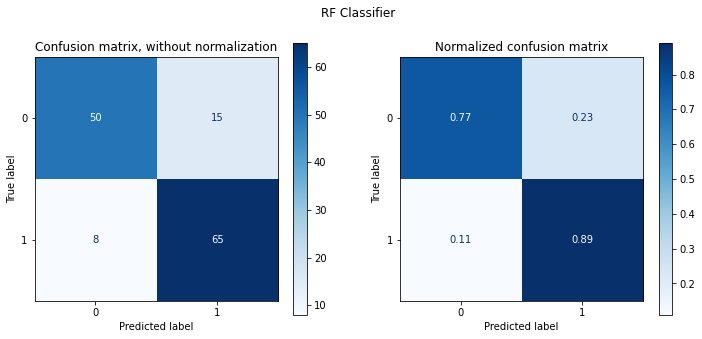

In [594]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [595]:
number = int(number_of_features/5)

Feature 0: 0.097758
Feature 1: 0.029096
Feature 2: 0.057210
Feature 3: 0.055730
Feature 4: 0.149513
Feature 5: 0.033110
Feature 6: 0.237673
Feature 7: 0.163546
Feature 8: 0.036152
Feature 9: 0.032749


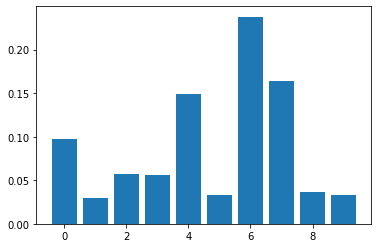

In [596]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7899
Precision     : 0.7895
Recall        : 0.7904
F1 Score      : 0.7896
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.80      0.78        65
           1       0.81      0.78      0.80        73

    accuracy                           0.79       138
   macro avg       0.79      0.79      0.79       138
weighted avg       0.79      0.79      0.79       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


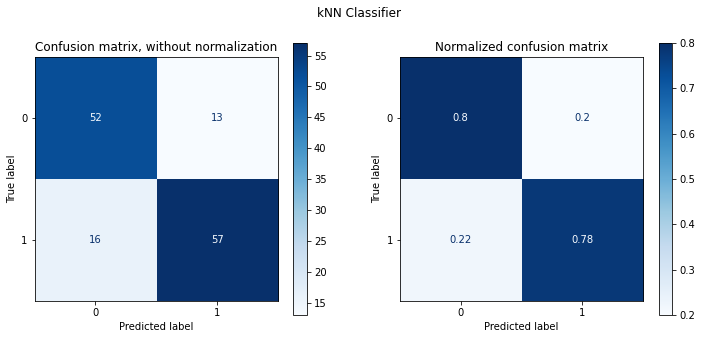

In [597]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='newton-cg')
Test Accuracy : 0.7899
Precision     : 0.7895
Recall        : 0.7904
F1 Score      : 0.7896
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.80      0.78        65
           1       0.81      0.78      0.80        73

    accuracy                           0.79       138
   macro avg       0.79      0.79      0.79       138
weighted avg       0.79      0.79      0.79       138



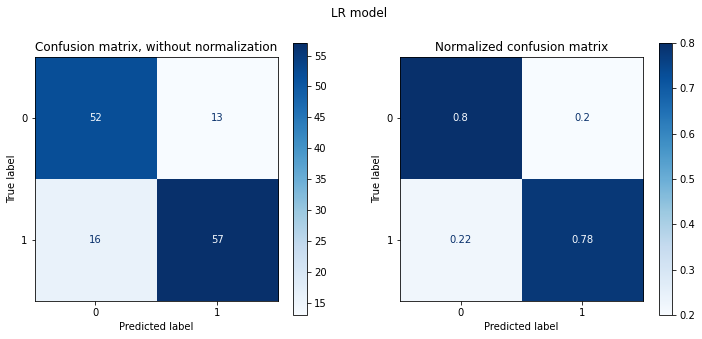

In [598]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7609
Precision     : 0.7644
Recall        : 0.7639
F1 Score      : 0.7609
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.72      0.82      0.76        65
           1       0.81      0.71      0.76        73

    accuracy                           0.76       138
   macro avg       0.76      0.76      0.76       138
weighted avg       0.77      0.76      0.76       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


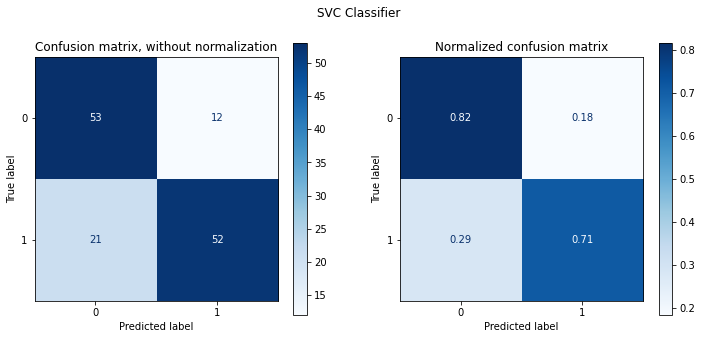

In [599]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=5,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.7971
Precision     : 0.7971
Recall        : 0.7981
F1 Score      : 0.7969
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.82      0.79        65
           1       0.83      0.78      0.80        73

    accuracy                           0.80       138
   macro avg       0.80      0.80      0.80       138
weighted avg       0.80      0.80      0.80       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


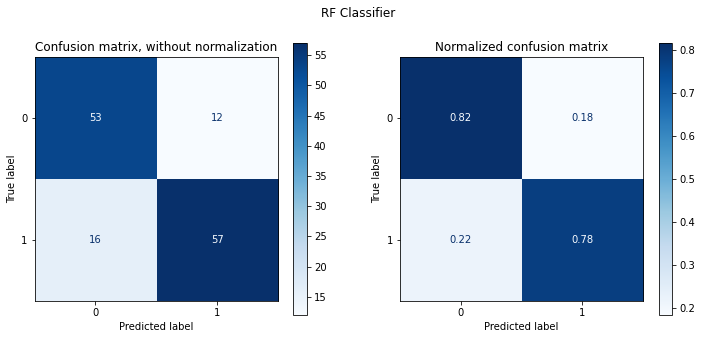

In [600]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [601]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

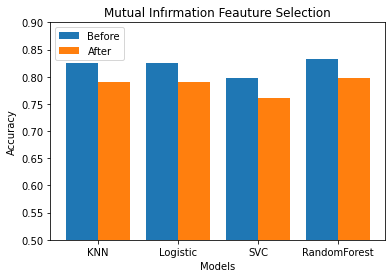

In [602]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 12.380519
Feature 1: 2.160015
Feature 2: 19.182708
Feature 3: 3.781384
Feature 4: 38.777481
Feature 5: 0.648555
Feature 6: 57.701280
Feature 7: 40.426639
Feature 8: 6.704032
Feature 9: 9.768415


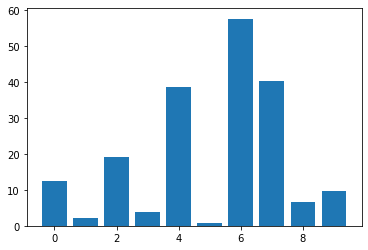

In [603]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=25,
                     weights='distance')
Test Accuracy : 0.7899
Precision     : 0.7895
Recall        : 0.7904
F1 Score      : 0.7896
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.80      0.78        65
           1       0.81      0.78      0.80        73

    accuracy                           0.79       138
   macro avg       0.79      0.79      0.79       138
weighted avg       0.79      0.79      0.79       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


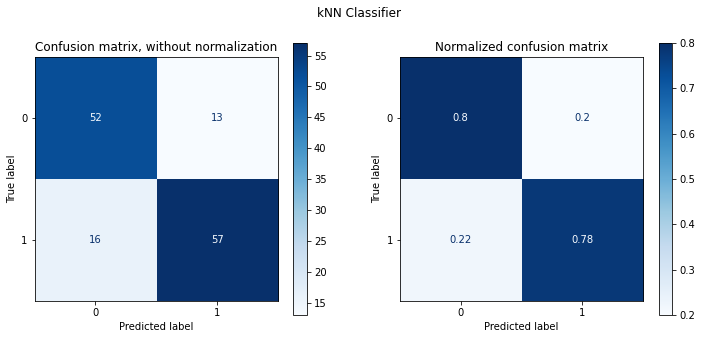

In [604]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=0.5, penalty='none', solver='newton-cg')
Test Accuracy : 0.7899
Precision     : 0.7895
Recall        : 0.7904
F1 Score      : 0.7896
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.80      0.78        65
           1       0.81      0.78      0.80        73

    accuracy                           0.79       138
   macro avg       0.79      0.79      0.79       138
weighted avg       0.79      0.79      0.79       138



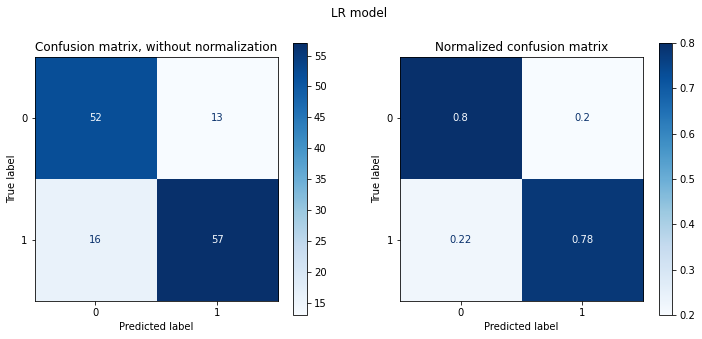

In [605]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.01, gamma='auto', kernel='linear', probability=True, random_state=42)
Test Accuracy : 0.7609
Precision     : 0.7644
Recall        : 0.7639
F1 Score      : 0.7609
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.72      0.82      0.76        65
           1       0.81      0.71      0.76        73

    accuracy                           0.76       138
   macro avg       0.76      0.76      0.76       138
weighted avg       0.77      0.76      0.76       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


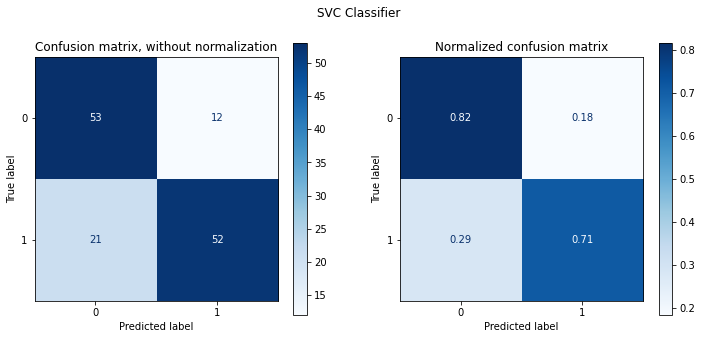

In [606]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=5, max_features='sqrt', min_samples_split=5,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.7971
Precision     : 0.7971
Recall        : 0.7981
F1 Score      : 0.7969
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.77      0.82      0.79        65
           1       0.83      0.78      0.80        73

    accuracy                           0.80       138
   macro avg       0.80      0.80      0.80       138
weighted avg       0.80      0.80      0.80       138



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


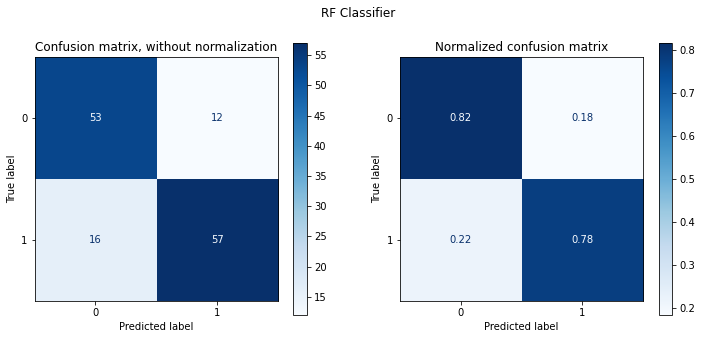

In [607]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [608]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

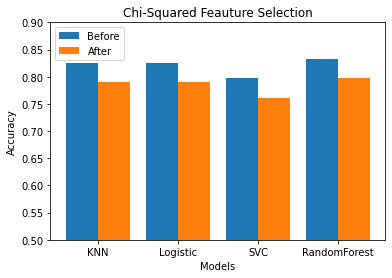

In [609]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['EX1G', 'EX2G', 'A1G', 'A2G', 'C1G']


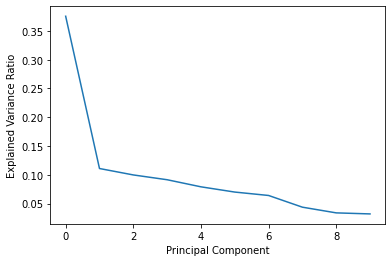

Highest loading features: ['EX2G', 'C2G', 'A2G', 'O1G', 'EX1G']


In [610]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [611]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=2 
EX2G selected =False rank=6 
A1G selected =False rank=4 
A2G selected =False rank=8 
C1G selected =True rank=1 
C2G selected =False rank=3 
ES1G selected =True rank=1 
ES2G selected =False rank=5 
O1G selected =False rank=9 
O2G selected =False rank=7 


In [612]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=2 
EX2G selected =False rank=6 
A1G selected =False rank=5 
A2G selected =False rank=9 
C1G selected =True rank=1 
C2G selected =False rank=3 
ES1G selected =True rank=1 
ES2G selected =False rank=4 
O1G selected =False rank=7 
O2G selected =False rank=8 


In [613]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=4 
EX2G selected =False rank=6 
A1G selected =False rank=5 
A2G selected =False rank=9 
C1G selected =False rank=2 
C2G selected =False rank=3 
ES1G selected =True rank=1 
ES2G selected =True rank=1 
O1G selected =False rank=7 
O2G selected =False rank=8 


In [614]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=3 
EX2G selected =False rank=8 
A1G selected =False rank=4 
A2G selected =False rank=9 
C1G selected =True rank=1 
C2G selected =False rank=6 
ES1G selected =True rank=1 
ES2G selected =False rank=2 
O1G selected =False rank=7 
O2G selected =False rank=5 


In [615]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 99.37888198757764
Test accuracy: 84.78260869565217
[0.1086879  0.05869314 0.082765   0.03980717 0.13731016 0.05449827
 0.24619939 0.14163613 0.06501513 0.0653877 ]


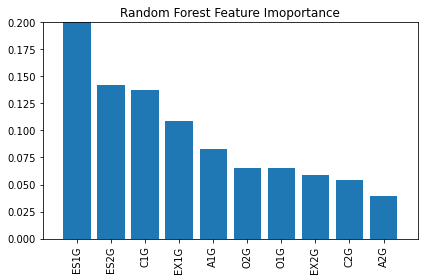

In [616]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [617]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [618]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

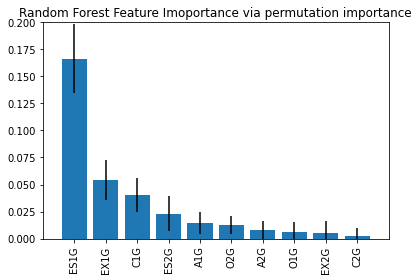

In [619]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [620]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['C1G' 'ES1G']


Selected features with using Random Forest Classifier:
['EX1G' 'C1G' 'ES1G' 'ES2G']


Selected features with using Logistic Regression Classifier:
['EX1G' 'C2G' 'ES1G' 'ES2G']


Selected features with using Linear Regression:
['EX1G' 'A1G' 'C1G' 'C2G' 'ES1G' 'ES2G']


#BF(V)# 


In [621]:
df = pd.read_csv("BF_df_V.csv") # Creating the dataframe.
print(df)

     EX1G  EX2G  A1G  A2G  C1G  C2G  ES1G  ES2G  O1G  O2G CONDITION
0       4     4    4    4    5    5     4     4    4    5         H
1       4     3    3    4    4    4     3     3    3    5         H
2       4     4    2    3    2    5     4     3    2    1         H
3       4     4    2    3    2    5     4     3    2    1         H
4       4     2    2    3    1    5     2     3    5    5         H
..    ...   ...  ...  ...  ...  ...   ...   ...  ...  ...       ...
481     5     2    5    2    5    5     5     5    4    5         D
482     3     2    2    4    4    4     4     4    4    4         D
483     5     2    4    2    5    5     4     4    4    5         D
484     2     4    4    2    4    2     4     2    5    2         D
485     5     1    1    2    5    5     5     5    5    5         D

[486 rows x 11 columns]


In [622]:
df['CONDITION'] = df['CONDITION'].replace(['H','D'], ['1','0']) # Changing our Honest and Dishonest data to binary values.

In [623]:
X = df.iloc[: , :-1] # Assigning the features and the answers data to X
X

,EX1G,EX2G,A1G,A2G,C1G,C2G,ES1G,ES2G,O1G,O2G
0,4,4,4,4,5,5,4,4,4,5
1,4,3,3,4,4,4,3,3,3,5
2,4,4,2,3,2,5,4,3,2,1
3,4,4,2,3,2,5,4,3,2,1
4,4,2,2,3,1,5,2,3,5,5
...,...,...,...,...,...,...,...,...,...,...
481,5,2,5,2,5,5,5,5,4,5
482,3,2,2,4,4,4,4,4,4,4
483,5,2,4,2,5,5,4,4,4,5
484,2,4,4,2,4,2,4,2,5,2


In [624]:
number_of_features = X.shape[1]
number_of_features

10

In [625]:
y = df.iloc[: , -1] # Assigning output columns to y.
y

0      1
1      1
2      1
3      1
4      1
      ..
481    0
482    0
483    0
484    0
485    0
Name: CONDITION, Length: 486, dtype: object

In [626]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.70,random_state = 123) # Splitting our data set in to Train and Test set with %70 train size and %30 test size.

In [627]:
# Creating functions to calculate the models performance and gettitng better outputs.
def prt_model_performance(model, X_test, y_test, set_name):
    estimator_name = model.__class__.__name__
    best_test_score = model.score(X_test, y_test)
    model_parameters = model.get_params()
    model_predict = model.predict(X_test)
    recall = recall_score(y_test, model_predict, average='macro')
    precision = precision_score(y_test, model_predict, average='macro')
    f1 = f1_score(y_test, model_predict, average='macro')  
    print(f'-----------------------------------------------------')
    print(f'Best model    > {model}')
    print(f'Test Accuracy : {best_test_score:.4f}')
    print(f'Precision     : {precision:.4f}')
    print(f'Recall        : {recall:.4f}')
    print(f'F1 Score      : {f1:.4f}')
    print(f'-----------------------------------------------------')
    print(classification_report(y_test, model_predict))
    summary_model = [(set_name, estimator_name, model_parameters, best_test_score)]
    return summary_model
#----------------------------------------------------------------------------
def plt_cmx(classifier, X_test, y_test, chart_title, class_labels=[0, 1]):   
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(12,5))
    titles_options = [("Confusion matrix, without normalization", None),
                      ("Normalized confusion matrix", 'true')]
    idx = 0
    for title, normalize in titles_options:
        disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     ax = axes[idx],
                                     display_labels = class_labels,
                                     cmap = plt.cm.Blues,
                                     normalize = normalize)
        axes[idx].set_title(title)
        idx += 1
    fig.suptitle(chart_title)
    return plt.show()
#---------------------------------------------------------
cnames=['Study', 'Model', 'Parameters', 'Test Accuracy']
clf_results = pd.DataFrame(columns=cnames)
#---------------------------------------------------------
def update_summary(list, df):
  df.loc[len(df.index)] = list
  df.sort_values(by=['Test Accuracy'], ascending=True)
  return
#----------------------------------------------------------

In [628]:
#@title **KNN Model**
kNN = KNeighborsClassifier()
k_range = list(range(1, 31))
param_grid_kf = {'weights': ['uniform', 'distance'],
                  'n_neighbors': k_range,
                  'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                  'metric': ['euclidean', 'manhattan'],
                }

gs_kNN_f = GridSearchCV(kNN, param_grid_kf, cv = 5, return_train_score = True)
gs_kNN_f = gs_kNN_f.fit(X_train, y_train)
kNN_results_f = gs_kNN_f.cv_results_
results_kNN_df = pd.DataFrame({'rank': kNN_results_f['rank_test_score'],
                                'params': kNN_results_f['params'],
                                'cv train score (mean)': kNN_results_f['mean_train_score'],
                                'cv test score (mean)': kNN_results_f['mean_test_score'],
                                'cv score (std)': kNN_results_f['std_test_score']}
                              )
results_kNN_df = results_kNN_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_kNN_df.head()



,rank,params,cv train score (mean),cv test score (mean),cv score (std)
99,1,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 20, 'weights': 'distance'}",1.0,0.855882,0.043026
231,2,"{'algorithm': 'kd_tree', 'metric': 'manhattan', 'n_neighbors': 26, 'weights': 'distance'}",1.0,0.850000,0.044019
111,2,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 26, 'weights': 'distance'}",1.0,0.850000,0.044019
299,2,"{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 30, 'weights': 'distance'}",1.0,0.850000,0.044019
119,5,"{'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 30, 'weights': 'distance'}",1.0,0.847059,0.048862


-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=20,
                     weights='distance')
Test Accuracy : 0.8014
Precision     : 0.8008
Recall        : 0.8011
F1 Score      : 0.8009
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.79      0.80      0.79        69
           1       0.82      0.81      0.81        77

    accuracy                           0.80       146
   macro avg       0.80      0.80      0.80       146
weighted avg       0.80      0.80      0.80       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


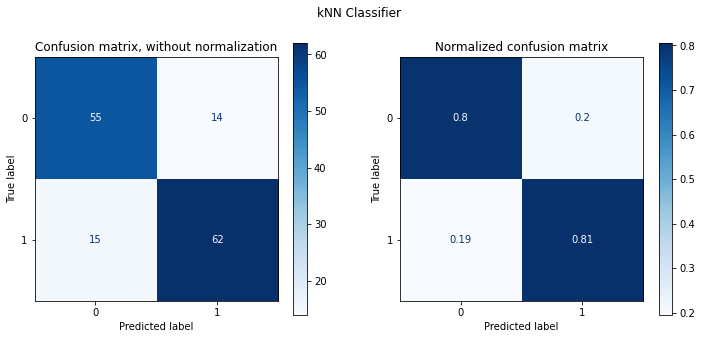

In [629]:
#@title **Best KNN Model Performance**
kNN_best = gs_kNN_f.best_estimator_
[knn_sum] = prt_model_performance(kNN_best, X_test, y_test, 'DataSet')
plt_cmx(kNN_best, X_test, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

In [630]:
#@title **Logistic Regression Model**
LR = LogisticRegression()
C_values_lr = [0.5, 1, 5, 7, 10, 100]
param_grid_lr = {'solver': ['newton-cg', 'lbfgs', 'sag'],
                 'C': C_values_lr,
                 'penalty': ['none', 'l1', 'l2', 'elasticnet']}
gs_LR = GridSearchCV(LR, param_grid_lr, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_LR = gs_LR.fit(X_train, y_train)

LR_results_f = gs_LR.cv_results_
results_LR_df = pd.DataFrame({'rank': LR_results_f['rank_test_score'],
                              'params': LR_results_f['params'],
                              'cv train score (mean)': LR_results_f['mean_train_score'],
                              'cv test score (mean)': LR_results_f['mean_test_score'],
                              'cv score (std)': LR_results_f['std_test_score']}
                             )
results_LR_df = results_LR_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_LR_df.head()


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
54,1,"{'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}",0.841176,0.829412,0.037894
31,1,"{'C': 5, 'penalty': 'l2', 'solver': 'lbfgs'}",0.841176,0.829412,0.037894
30,1,"{'C': 5, 'penalty': 'l2', 'solver': 'newton-cg'}",0.841176,0.829412,0.037894
55,1,"{'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}",0.841176,0.829412,0.037894
43,1,"{'C': 7, 'penalty': 'l2', 'solver': 'lbfgs'}",0.841176,0.829412,0.037894


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


-----------------------------------------------------
Best model    > LogisticRegression(C=5, solver='newton-cg')
Test Accuracy : 0.7329
Precision     : 0.7333
Recall        : 0.7340
F1 Score      : 0.7328
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.75      0.73        69
           1       0.76      0.71      0.74        77

    accuracy                           0.73       146
   macro avg       0.73      0.73      0.73       146
weighted avg       0.73      0.73      0.73       146



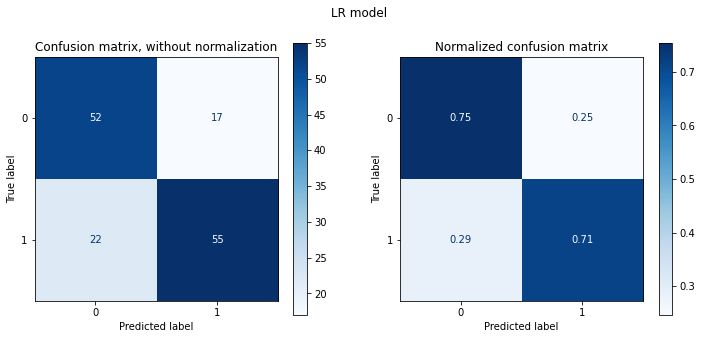

In [631]:
#@title **Best Logistic Regression Model Performance**
LR_best = gs_LR.best_estimator_   ## get the best model
[lr_sum] = prt_model_performance(LR_best, X_test, y_test, 'DataSet')
plt_cmx(LR_best, X_test, y_test, 'LR model')
update_summary(lr_sum, clf_results)

In [632]:
#@title **SVM**
SVC = SVC(kernel='linear', probability=True, random_state = 42)
C_values_svc = [0.001, 0.01, 0.1, 1, 10, 100]
param_grid_svc = {'kernel': ['linear', 'rbf', 'poly'],
                  'gamma': ['auto'],
                  'C': C_values_svc}

gs_SVC = GridSearchCV(SVC, param_grid_svc, cv = 5, return_train_score = True, verbose=1)
gs_SVC = gs_SVC.fit(X_train, y_train)

SVC_results_ji = gs_SVC.cv_results_
results_SVC_ji = pd.DataFrame({'rank': SVC_results_ji['rank_test_score'],
                              'params': SVC_results_ji['params'],
                              'cv train score (mean)': SVC_results_ji['mean_train_score'],
                              'cv test score (mean)': SVC_results_ji['mean_test_score'],
                              'cv score (std)': SVC_results_ji['std_test_score']}
                             )
results_SVC_ji = results_SVC_ji.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_SVC_ji.head()

Fitting 5 folds for each of 18 candidates, totalling 90 fits


,rank,params,cv train score (mean),cv test score (mean),cv score (std)
2,1,"{'C': 0.001, 'gamma': 'auto', 'kernel': 'poly'}",0.854412,0.841176,0.036499
10,2,"{'C': 1, 'gamma': 'auto', 'kernel': 'rbf'}",0.912500,0.838235,0.040541
5,3,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'poly'}",0.872794,0.829412,0.031677
15,4,"{'C': 100, 'gamma': 'auto', 'kernel': 'linear'}",0.848529,0.820588,0.039896
3,4,"{'C': 0.01, 'gamma': 'auto', 'kernel': 'linear'}",0.835294,0.820588,0.050431


-----------------------------------------------------
Best model    > SVC(C=0.001, gamma='auto', kernel='poly', probability=True, random_state=42)
Test Accuracy : 0.7671
Precision     : 0.7684
Recall        : 0.7642
F1 Score      : 0.7650
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.78      0.71      0.74        69
           1       0.76      0.82      0.79        77

    accuracy                           0.77       146
   macro avg       0.77      0.76      0.76       146
weighted avg       0.77      0.77      0.77       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


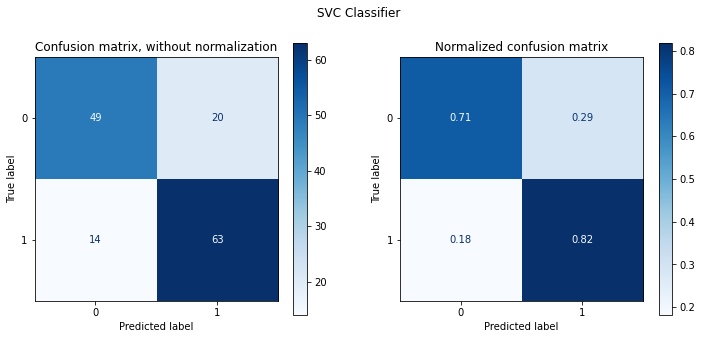

In [633]:
#@title **Best SVC model performance**
SVC_best = gs_SVC.best_estimator_
[SCV1] = prt_model_performance(SVC_best, X_test, y_test, 'DataSet')
plt_cmx(SVC_best, X_test, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

In [634]:
#@title **Random Forest Classifier**
rf = RandomForestClassifier(random_state=123, max_features='sqrt')

param_grid_rf = {
    "n_estimators":[10,20,30,40,50],
    'max_depth': [3,5,7,9],
    'min_samples_split': [5,9,13]
}
gs_rf = GridSearchCV(rf, param_grid_rf, cv = 5, scoring = 'accuracy', return_train_score = True, verbose=0)
gs_rf = gs_rf.fit(X_train, y_train)

rf_results_f = gs_rf.cv_results_
results_rf_df = pd.DataFrame({'rank': rf_results_f['rank_test_score'],
                              'params': rf_results_f['params'],
                              'cv train score (mean)': rf_results_f['mean_train_score'],
                              'cv test score (mean)': rf_results_f['mean_test_score'],
                              'cv score (std)': rf_results_f['std_test_score']}
                             )
results_rf_df = results_rf_df.sort_values(by=['rank'], ascending=True)
pd.set_option('display.max_colwidth', 100)
results_rf_df.head()

,rank,params,cv train score (mean),cv test score (mean),cv score (std)
31,1,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 20}",0.946324,0.870588,0.026956
47,2,"{'max_depth': 9, 'min_samples_split': 5, 'n_estimators': 30}",0.960294,0.861765,0.027275
33,3,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 40}",0.943382,0.858824,0.022010
32,3,"{'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 30}",0.943382,0.858824,0.022010
22,3,"{'max_depth': 5, 'min_samples_split': 9, 'n_estimators': 30}",0.905882,0.858824,0.030281


-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.7671
Precision     : 0.7664
Recall        : 0.7664
F1 Score      : 0.7664
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        69
           1       0.78      0.78      0.78        77

    accuracy                           0.77       146
   macro avg       0.77      0.77      0.77       146
weighted avg       0.77      0.77      0.77       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


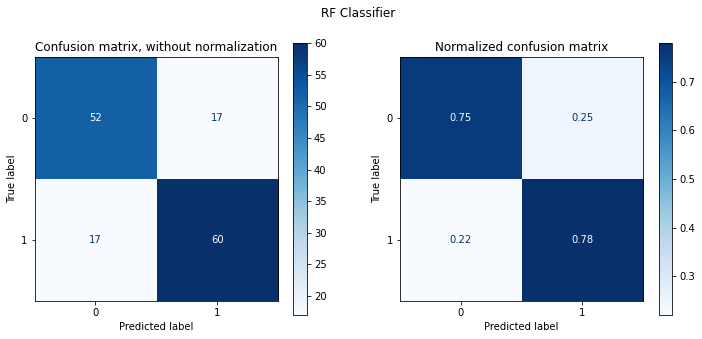

In [635]:
#@title **Best RF Model Performance**
rf_best = gs_rf.best_estimator_
[RF1] = prt_model_performance(rf_best, X_test, y_test, 'DataSet')
plt_cmx(rf_best, X_test, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [636]:
number = int(number_of_features/5)

Feature 0: 0.144311
Feature 1: 0.009509
Feature 2: 0.063430
Feature 3: 0.000000
Feature 4: 0.164393
Feature 5: 0.008501
Feature 6: 0.146813
Feature 7: 0.291155
Feature 8: 0.042935
Feature 9: 0.013318


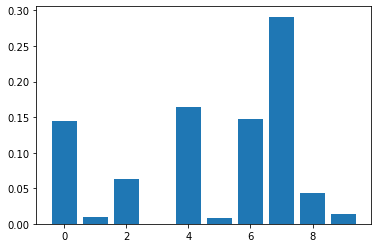

In [637]:
#@title **%20 of Selected Features with Mutual Information**
# example of mutual information feature selection for numerical input data
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from matplotlib import pyplot
  
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=mutual_info_classif,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=20,
                     weights='distance')
Test Accuracy : 0.7329
Precision     : 0.7377
Recall        : 0.7362
F1 Score      : 0.7328
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.69      0.80      0.74        69
           1       0.79      0.68      0.73        77

    accuracy                           0.73       146
   macro avg       0.74      0.74      0.73       146
weighted avg       0.74      0.73      0.73       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


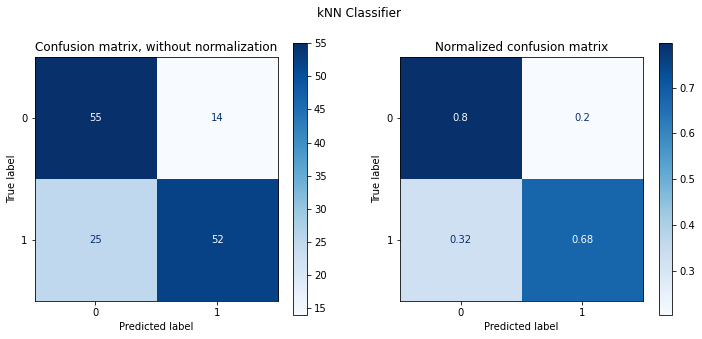

In [638]:
#@title **KNN AFTER Mutual Informatıon with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=5, solver='newton-cg')
Test Accuracy : 0.7192
Precision     : 0.7285
Recall        : 0.7240
F1 Score      : 0.7185
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.67      0.81      0.73        69
           1       0.79      0.64      0.71        77

    accuracy                           0.72       146
   macro avg       0.73      0.72      0.72       146
weighted avg       0.73      0.72      0.72       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


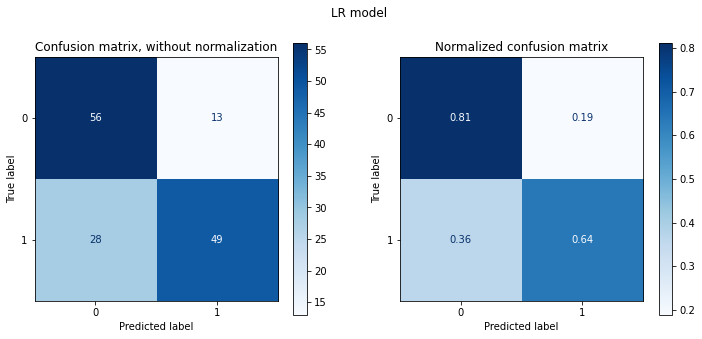

In [639]:
#@title **Logistic Regression After Mutual Information with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.001, gamma='auto', kernel='poly', probability=True, random_state=42)
Test Accuracy : 0.7397
Precision     : 0.7436
Recall        : 0.7427
F1 Score      : 0.7397
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.80      0.74        69
           1       0.79      0.69      0.74        77

    accuracy                           0.74       146
   macro avg       0.74      0.74      0.74       146
weighted avg       0.75      0.74      0.74       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


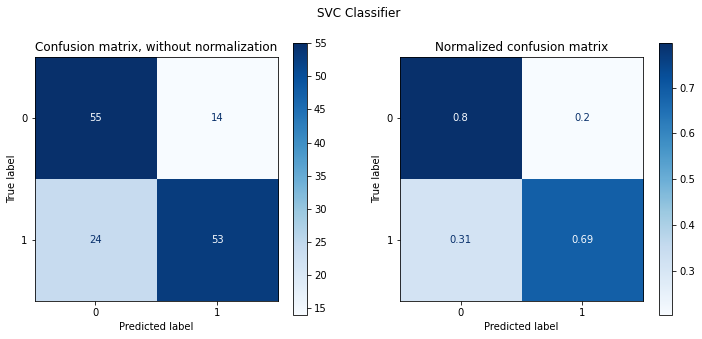

In [640]:
#@title **SVC After Mutual Information with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.7329
Precision     : 0.7377
Recall        : 0.7362
F1 Score      : 0.7328
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.69      0.80      0.74        69
           1       0.79      0.68      0.73        77

    accuracy                           0.73       146
   macro avg       0.74      0.74      0.73       146
weighted avg       0.74      0.73      0.73       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


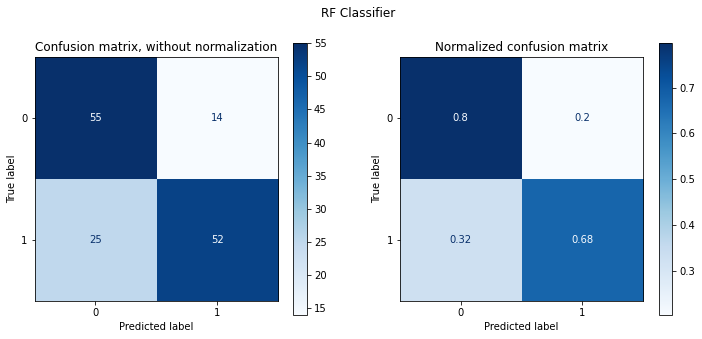

In [641]:
#@title **Random Forest After Mutual Information with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [642]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

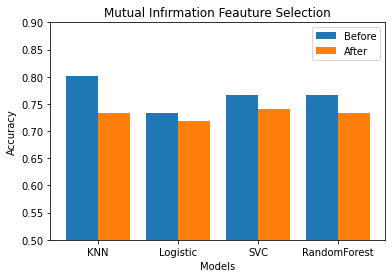

In [643]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Mutual Infırmation Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Feature 0: 18.613651
Feature 1: 4.829407
Feature 2: 8.496007
Feature 3: 0.230275
Feature 4: 39.341727
Feature 5: 1.181981
Feature 6: 47.177964
Feature 7: 57.258616
Feature 8: 5.591167
Feature 9: 3.071424


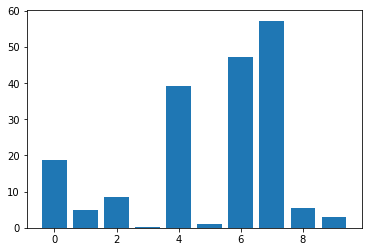

In [644]:
#@title **CHI-SQUARED WITH %20**
# feature selection
def select_features(X_train, y_train, X_test):
	# configure to select all features
	fs = SelectKBest(score_func=chi2,k=number)
	# learn relationship from training data
	fs.fit(X_train, y_train)
	# transform train input data
	X_train_fs = fs.transform(X_train)
	# transform test input data
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs
 
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

-----------------------------------------------------
Best model    > KNeighborsClassifier(algorithm='ball_tree', metric='manhattan', n_neighbors=20,
                     weights='distance')
Test Accuracy : 0.7397
Precision     : 0.7420
Recall        : 0.7420
F1 Score      : 0.7397
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.78      0.74        69
           1       0.78      0.70      0.74        77

    accuracy                           0.74       146
   macro avg       0.74      0.74      0.74       146
weighted avg       0.74      0.74      0.74       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


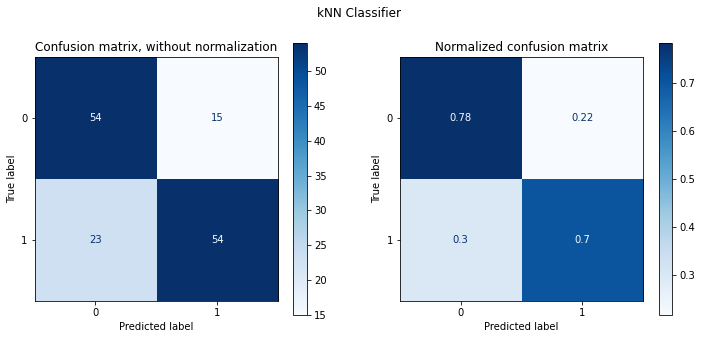

In [645]:
#@title **KNN AFTER CHI-SQUARED with %20**

kNN_best = gs_kNN_f.best_estimator_
Knn_best =  KNeighborsClassifier(**kNN_best.get_params())
Knn_best.fit(X_train_fs,y_train)
[knn_sum1] = prt_model_performance(Knn_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Knn_best, X_test_fs, y_test, 'kNN Classifier')
update_summary(knn_sum, clf_results)

-----------------------------------------------------
Best model    > LogisticRegression(C=5, solver='newton-cg')
Test Accuracy : 0.7123
Precision     : 0.7202
Recall        : 0.7167
F1 Score      : 0.7118
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.66      0.80      0.72        69
           1       0.78      0.64      0.70        77

    accuracy                           0.71       146
   macro avg       0.72      0.72      0.71       146
weighted avg       0.72      0.71      0.71       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


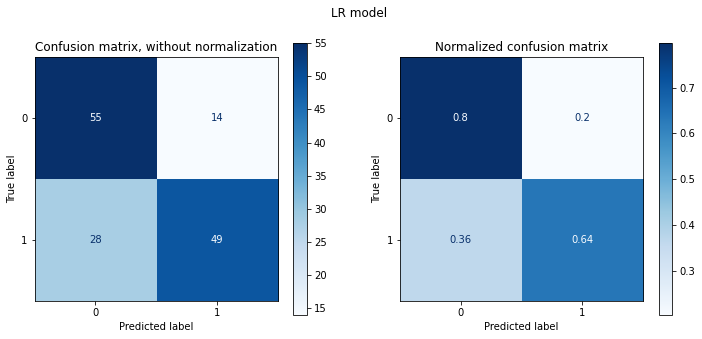

In [646]:
#@title **Logistic Regression After Chi-Squared with %20**
LR_best = gs_LR.best_estimator_   ## get the best model
Logistic_best = LogisticRegression(**LR_best.get_params())
Logistic_best.fit(X_train_fs,y_train)
[lr_sum1] = prt_model_performance(Logistic_best, X_test_fs, y_test, 'DataSet')
plt_cmx(Logistic_best, X_test_fs, y_test, 'LR model')
update_summary(lr_sum, clf_results)

-----------------------------------------------------
Best model    > SVC(C=0.001, gamma='auto', kernel='poly', probability=True, random_state=42)
Test Accuracy : 0.7123
Precision     : 0.7320
Recall        : 0.7032
F1 Score      : 0.6996
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.79      0.54      0.64        69
           1       0.68      0.87      0.76        77

    accuracy                           0.71       146
   macro avg       0.73      0.70      0.70       146
weighted avg       0.73      0.71      0.70       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


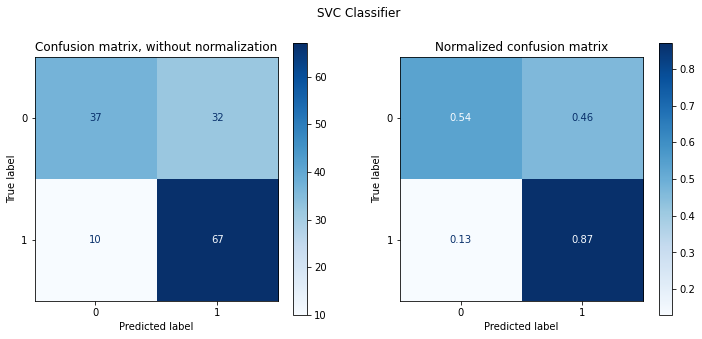

In [647]:
#@title **SVC After Chi-Squared with %20**
from sklearn.svm import SVC
SVC_best = gs_SVC.best_estimator_
svc_best = SVC(**SVC_best.get_params())
svc_best.fit(X_train_fs,y_train)
[SCV2] = prt_model_performance(svc_best, X_test_fs, y_test, 'DataSet')
plt_cmx(svc_best, X_test_fs, y_test, 'SVC Classifier')
update_summary(SCV1, clf_results)

-----------------------------------------------------
Best model    > RandomForestClassifier(max_depth=7, max_features='sqrt', min_samples_split=5,
                       n_estimators=20, random_state=123)
Test Accuracy : 0.7740
Precision     : 0.7736
Recall        : 0.7744
F1 Score      : 0.7737
-----------------------------------------------------
              precision    recall  f1-score   support

           0       0.75      0.78      0.77        69
           1       0.80      0.77      0.78        77

    accuracy                           0.77       146
   macro avg       0.77      0.77      0.77       146
weighted avg       0.77      0.77      0.77       146



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


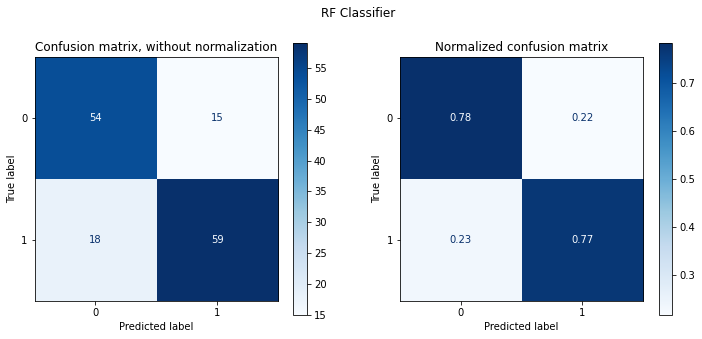

In [648]:
#@title **Random Forest After Chi-Squared with %20**
RF_best = gs_rf.best_estimator_
rf_best = RandomForestClassifier(**RF_best.get_params())
rf_best.fit(X_train_fs,y_train)
[RF2] = prt_model_performance(rf_best, X_test_fs, y_test, 'DataSet')
plt_cmx(rf_best, X_test_fs, y_test, 'RF Classifier')
update_summary(RF1, clf_results)

In [649]:
a = np.array(knn_sum1)
b = np.array(lr_sum1)
c = np.array(SCV2)
d = np.array(RF2)
e = np.array(knn_sum)
f = np.array(lr_sum)
g = np.array(SCV1)
h = np.array(RF1)

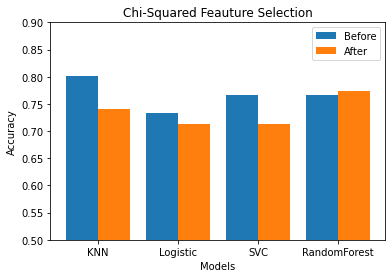

In [650]:
q = ['KNN', 'Logistic', 'SVC', 'RandomForest']
modelspoint1 = [e[3],f[3],g[3],h[3]]
chisquaredpoints1 = [a[3],b[3],c[3],d[3]]
  
X_axis = np.arange(len(q))
  
plt.bar(X_axis - 0.2, modelspoint1, 0.4, label = 'Before')
plt.bar(X_axis + 0.2, chisquaredpoints1, 0.4, label = 'After')
  
plt.xticks(X_axis, q)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Chi-Squared Feauture Selection")
plt.legend()
plt.ylim([0.50, 0.9])

plt.show()

Highest variance features: ['EX1G', 'EX2G', 'A1G', 'A2G', 'C1G']


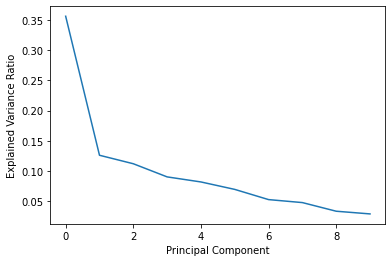

Highest loading features: ['A2G', 'EX2G', 'C2G', 'O1G', 'A1G']


In [651]:
#@title **PCA**

feature_names=X.columns

# perform PCA
pca = PCA()
pca.fit(X)

# get the explained variance ratio of each feature
variance_ratio = pca.explained_variance_ratio_

# get the indices of the features with the highest variance
n_components = 5  # you can set it as you want
indices = np.argsort(variance_ratio)[::-1][:n_components]

# print the names of the features with the highest variance
highest_variance_features = [feature_names[i] for i in indices]
print("Highest variance features:", highest_variance_features)


# plot explained variance ratio
plt.plot(pca.explained_variance_ratio_)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.show()

loadings = pca.components_[0]

# get the indices of the features with the highest loadings
n_components = 5  # you can set it as you want
indices = np.argsort(loadings)[::-1][:n_components]

# print the names of the features with the highest loadings
highest_loading_features = [feature_names[i] for i in indices]
print("Highest loading features:", highest_loading_features)



In PCA, the goal is to find a new set of uncorrelated linear combinations of the original features, called principal components, that explain the maximum amount of variance in the data. The first principal component is the linear combination of the original features that explains the most variance, the second principal component is the linear combination that explains the second most variance, and so on.

The explained variance ratio of each principal component is the ratio of the variance of that component to the total variance of the data. As you go through the principal components, the explained variance ratio decreases, because the principal components are ordered by the amount of variance they explain, and each successive component explains less variance than the previous one.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In other words, the first principal component explains more variance than the second, which explains more variance than the third, and so on. This is why the variance decreases as you go through the principal components.

We can use explained_variance_ratio_ attribute of the PCA object to check the explained variance ratio of each principal component. You can also plot the explained variance ratio to visualize how the variance decreases as you go through the principal components.

As we know, the principal components are linear combinations of the original features, so the importance of a feature in a principal component can be measured by the magnitude of its loading, which is the coefficient of the feature in the linear combination.

In PCA, the loadings are the coefficients of the original features in the principal components. Each feature has a loading for each principal component, and the magnitude of the loading represents the strength of the association between the feature and the principal component.

We can access the loadings by using the components_ attribute of the PCA object. Each row of the attribute corresponds to a principal component, and each column corresponds to a feature. The value of each element represents the loading of the corresponding feature in the corresponding principal component.

The features with the highest loadings in the first principal component are considered the most important features because they have the strongest association with the principal component that explains the most variance.


Also, we can use the components_ attribute to see the loading of features for each principal component and decide which features are important for explaining the variance of each component.

In [652]:
#@title **Recursive Feature Elimination with Decision Tree Classifier**
from pickle import TRUE
rfe = RFE(estimator=DecisionTreeClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =True rank=1 
EX2G selected =False rank=2 
A1G selected =False rank=5 
A2G selected =False rank=4 
C1G selected =False rank=7 
C2G selected =False rank=8 
ES1G selected =False rank=3 
ES2G selected =True rank=1 
O1G selected =False rank=9 
O2G selected =False rank=6 


In [653]:
#@title **Recursive Feature Elimination with Linear Regression**
from pickle import TRUE
rfe = RFE(estimator=LinearRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=3 
EX2G selected =False rank=8 
A1G selected =False rank=9 
A2G selected =False rank=7 
C1G selected =True rank=1 
C2G selected =False rank=2 
ES1G selected =False rank=4 
ES2G selected =True rank=1 
O1G selected =False rank=6 
O2G selected =False rank=5 


In [654]:
#@title **Recursive Feature Elimination with Logistic Regression**
from pickle import TRUE
rfe = RFE(estimator=LogisticRegression(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=3 
EX2G selected =False rank=7 
A1G selected =False rank=9 
A2G selected =False rank=8 
C1G selected =True rank=1 
C2G selected =False rank=2 
ES1G selected =False rank=4 
ES2G selected =True rank=1 
O1G selected =False rank=6 
O2G selected =False rank=5 


In [655]:
#@title **Recursive Feature Elimination with Random Forest Classifier**
from pickle import TRUE
rfe = RFE(estimator=RandomForestClassifier(),n_features_to_select=number)
rfe.fit(X,y)
for i, col in zip(range(X.shape[1]),X.columns):
  print(f"{col} selected ={rfe.support_[i]} rank={rfe.ranking_[i]} ")

EX1G selected =False rank=3 
EX2G selected =False rank=7 
A1G selected =False rank=6 
A2G selected =False rank=8 
C1G selected =False rank=2 
C2G selected =False rank=9 
ES1G selected =True rank=1 
ES2G selected =True rank=1 
O1G selected =False rank=4 
O2G selected =False rank=5 


In [656]:
#@title **PERMUTATION IMPORTANCE**
forest = RandomForestClassifier(n_estimators=250, random_state=0)

forest.fit(X_train, y_train)

print('Training accuracy:', np.mean(forest.predict(X_train) == y_train)*100)
print('Test accuracy:', np.mean(forest.predict(X_test) == y_test)*100)

importance_vals = forest.feature_importances_
print(importance_vals)

Training accuracy: 100.0
Test accuracy: 77.3972602739726
[0.11873986 0.06496853 0.05814132 0.0456958  0.16527612 0.03481482
 0.1343485  0.25020454 0.06971602 0.0580945 ]


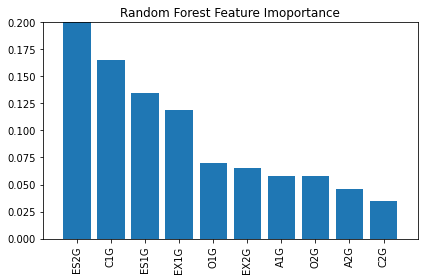

In [657]:
importance_vals = forest.feature_importances_
indices = np.argsort(importance_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance")
plt.bar(range(X_train.shape[1]),importance_vals[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('1.pdf')
plt.show()

In [658]:
X_test = X_test.to_numpy()
y_test = y_test.to_numpy()

In [659]:
from mlxtend.evaluate import feature_importance_permutation
imp_vals, imp_all = feature_importance_permutation(predict_method=forest.predict, X=X_test,y=y_test,metric='accuracy',num_rounds=50,seed=0)


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does 

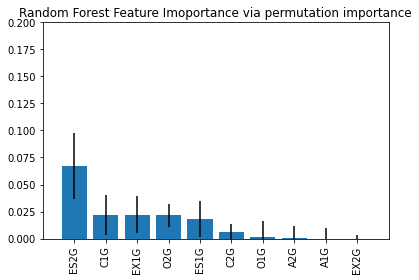

In [660]:
std = np.std(imp_all,axis=1)
indices = np.argsort(imp_vals)[::-1]

plt.figure()
plt.title("Random Forest Feature Imoportance via permutation importance")
plt.bar(range(X_train.shape[1]),imp_vals[indices], yerr=std[indices])

plt.xticks(range(X_train.shape[1]), X_train.columns[0:][indices], rotation=90)
plt.xlim([-1,X_train.shape[1]])
plt.ylim([0, 0.2])

plt.tight_layout()
plt.savefig('2.pdf')
plt.show()

In [661]:
#@title **MODEL DEPENDENT**
estimator = DecisionTreeClassifier()
estimator1 = RandomForestClassifier()
estimator2 = LogisticRegression()
estimator3 = LinearRegression()

selector1 = SelectFromModel(estimator)
selector2 = SelectFromModel(estimator1)
selector3 = SelectFromModel(estimator2)
selector4 = SelectFromModel(estimator3)

selector_Decision = selector1.fit(X, y) 
selector_Random = selector2.fit(X, y) 
selector_Logistic = selector3.fit(X, y) 
selector_Linear = selector4.fit(X, y) 

status_Decision = selector1.get_support()
status_Random = selector2.get_support()
status_Logistic = selector3.get_support()
status_Linear = selector4.get_support()

features = array(X_train.columns)
print("Selected features with using Decision Tree Classifier:")
print(features[status_Decision])
print("\n")
print("Selected features with using Random Forest Classifier:")
print(features[status_Random])
print("\n")
print("Selected features with using Logistic Regression Classifier:")
print(features[status_Logistic])
print("\n")
print("Selected features with using Linear Regression:")
print(features[status_Linear])


Selected features with using Decision Tree Classifier:
['EX1G' 'ES2G']


Selected features with using Random Forest Classifier:
['EX1G' 'C1G' 'ES1G' 'ES2G']


Selected features with using Logistic Regression Classifier:
['EX1G' 'C1G' 'C2G' 'ES1G' 'ES2G']


Selected features with using Linear Regression:
['EX1G' 'C1G' 'C2G' 'ES1G' 'ES2G']
